## Import and Read Data

In [1]:
# General Libraries
import glob
import math
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from collections import Counter
import matplotlib.cm as cm

# Machine Learning & Statistical Analysis
import sklearn.metrics as metrics
from sklearn import preprocessing
from sklearn.model_selection import (
    cross_val_score, cross_val_predict, train_test_split,
    KFold, RandomizedSearchCV, GridSearchCV, StratifiedKFold
)
from sklearn.metrics import (
    accuracy_score, recall_score, precision_score, f1_score,
    confusion_matrix, classification_report, r2_score,
    mean_squared_error, mean_absolute_error, make_scorer
)
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.inspection import permutation_importance
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVR, SVC

# Statistical Distributions
from scipy import stats
from scipy.stats import linregress, ttest_ind, randint, uniform, reciprocal, expon

# XGBoost
import xgboost as xgb
from xgboost import XGBRegressor, XGBClassifier

# Deep Learning (PyTorch & TensorFlow)
# import torch
# import torch.nn as nn
# import torch.optim as optim
# from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
# import tensorflow as tf
# from tensorflow import keras
# from keras.layers import Dense, Conv1D, Flatten, MaxPooling1D

# -------------------------------
# Seaborn & Matplotlib Settings
# -------------------------------

sns.set_theme(style="white", font_scale=1.5)
plt.rcParams['font.family'] = 'Arial'

import warnings
warnings.filterwarnings("ignore")

In [ ]:
# Print python version and sklearn version
import sys
import sklearn
print("sklearn version:", sklearn.__version__)
print("Python version:", sys.version)

sklearn version: 1.6.1
Python version: 3.11.12 (main, Apr  9 2025, 08:55:54) [GCC 11.4.0]


In [2]:
# read clean date:
path = "/content/drive/MyDrive/LWP_Netanel/Sg_clean_data.csv"
df = pd.read_csv(path, usecols=lambda column: column not in ["Unnamed: 0","Unnamed: 223"])

# read ID table
df_ids = pd.read_csv('/content/drive/MyDrive/LWP_Netanel/central_data_table_2.csv', usecols=lambda column: column not in ["Unnamed: 0","Unnamed: 223"])

# Drop nan values based on ID column
df_ids = df_ids.dropna(subset=['ID'])

# Create a mapping from spectral_date to ID
date_to_id = df_ids.set_index('spectral_date')['ID'].to_dict()

# Add the ID column to df based on spectral_date
df['ID'] = df['spectral_date'].map(date_to_id)

# Convert date ro datetime:
df['spectral_date'] = pd.to_datetime(df['spectral_date'])
df = df.sort_values(by='spectral_date')

df

,398,400,402,404,406,409,411,413,415,417,...,995,997,999,1001,LWP,spectral_date,treatment,plot,English_name,ID
0,0.056127,0.050410,0.045164,0.040390,0.036088,0.032257,0.028898,0.026011,0.023595,0.021651,...,0.225129,0.227839,0.230886,0.234268,-1.150,2022-03-14,drought,5,cypress,Csi5
15,0.059977,0.053579,0.047686,0.042298,0.037416,0.033039,0.029167,0.025800,0.022939,0.020583,...,0.229209,0.231894,0.234896,0.238218,-1.070,2022-03-14,drought,2,cypress,Csi5
14,0.065111,0.058156,0.051725,0.045821,0.040442,0.035588,0.031260,0.027458,0.024182,0.021431,...,0.139457,0.141216,0.143169,0.145318,-1.500,2022-03-14,drought,2,oak,Csi5
12,0.072386,0.067089,0.062196,0.057705,0.053616,0.049930,0.046647,0.043766,0.041287,0.039212,...,0.274488,0.277538,0.280974,0.284798,-2.900,2022-03-14,drought,2,pine,Csi5
11,0.049685,0.044987,0.040648,0.036666,0.033041,0.029774,0.026864,0.024312,0.022117,0.020280,...,0.240038,0.242870,0.246067,0.249627,-1.800,2022-03-14,drought,2,carob,Csi5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220,0.061252,0.054616,0.048544,0.043038,0.038095,0.033718,0.029905,0.026657,0.023973,0.021855,...,0.340734,0.340649,0.340427,0.340068,-0.311,2023-02-13,control,4,pistacia,Csi6
219,0.033540,0.030082,0.026936,0.024103,0.021584,0.019378,0.017485,0.015905,0.014638,0.013684,...,0.188086,0.187896,0.187620,0.187256,-1.316,2023-02-13,control,4,cypress,Csi6
244,0.049915,0.044643,0.039817,0.035437,0.031504,0.028017,0.024976,0.022381,0.020232,0.018530,...,0.241184,0.241376,0.241517,0.241606,-1.960,2023-02-13,control,3,carob,Csi6
231,0.063757,0.058792,0.054281,0.050224,0.046621,0.043471,0.040775,0.038533,0.036745,0.035411,...,0.306699,0.305793,0.304711,0.303453,-1.905,2023-02-13,control,1,pine,Csi6


In [ ]:
df[['treatment']].value_counts()

,count
treatment,
control,125
drought,121


In [ ]:
df[['English_name','treatment']].value_counts()

,,count
English_name,treatment,
carob,drought,30
cypress,drought,30
pine,drought,30
oak,drought,27
carob,control,26
oak,control,26
pine,control,26
cypress,control,25
pistacia,control,22


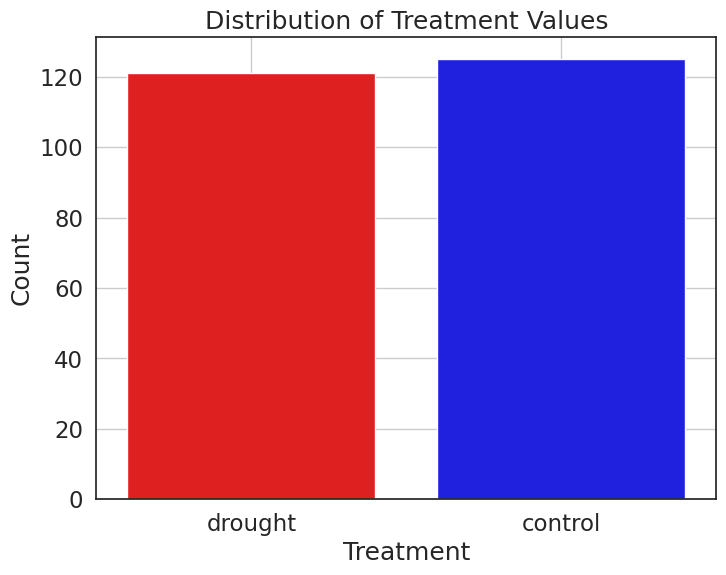

In [ ]:
# plot the distribution of the treatment values
fig, ax = plt.subplots(figsize=(8, 6))
ax = sns.countplot(x='treatment', data=df, palette=['red', 'blue'])
ax.set_title('Distribution of Treatment Values')
ax.set_xlabel('Treatment')
ax.set_ylabel('Count')
ax.grid()
plt.show()


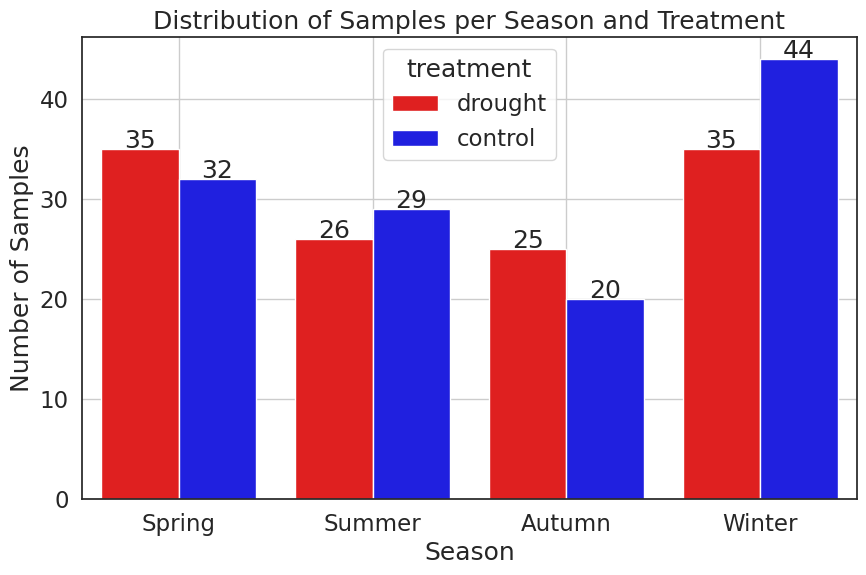

season  treatment
Autumn  control      20
        drought      25
Spring  control      32
        drought      35
Summer  control      29
        drought      26
Winter  control      44
        drought      35
Name: spectral_date, dtype: int64


In [ ]:
def get_season(month):
    if 3 <= month <= 5:
        return 'Spring'
    elif 6 <= month <= 8:
        return 'Summer'
    elif 9 <= month <= 11:
        return 'Autumn'
    elif month == 12 or 1 <= month <= 2:
        return 'Winter'


# If not, replace 'df' and 'spectral_date' with your actual DataFrame and column name
df['season'] = df['spectral_date'].dt.month.apply(get_season)

# Plot the distribution
plt.figure(figsize=(10, 6))
ax = sns.countplot(x='season', hue='treatment', data=df, palette=['#ff0000', '#0000ff'])  # Assign to ax
plt.title('Distribution of Samples per Season and Treatment')
plt.xlabel('Season')
plt.ylabel('Number of Samples')
plt.grid(True)

# Add text of value above each bar
for p in ax.patches:
    height = p.get_height()
    if height > 0:  # Check if the height is greater than zero
        ax.text(p.get_x() + p.get_width()/2.,
                height + 0.1,  # Slightly above the bar
                '{:1.0f}'.format(height),  # Formatted integer
                ha="center")

plt.show()


# Print samples per season per treatment
print(df.groupby(['season', 'treatment'])['spectral_date'].count())

## Ttest

<ipython-input-7-0431bd283c33>:22: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  xticks_positions = pd.date_range(df['spectral_date'].min(), df['spectral_date'].max(), freq='M')


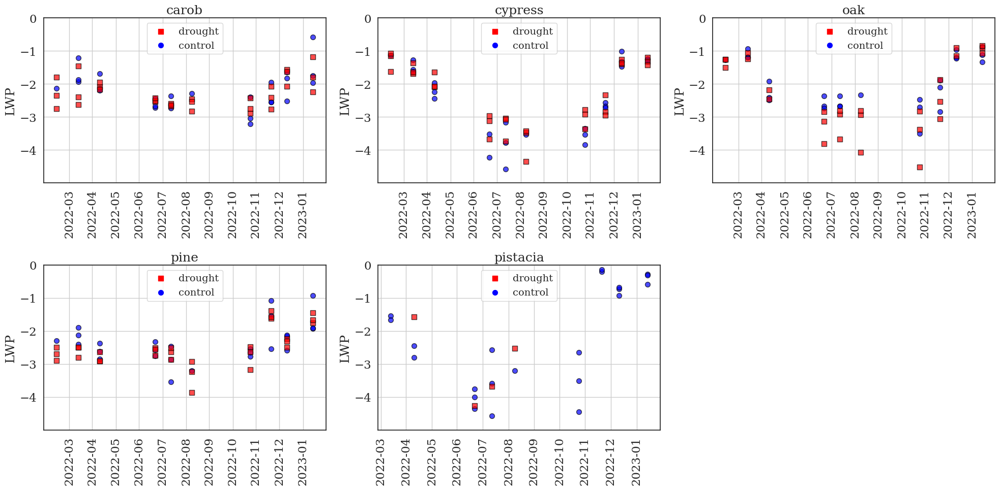

In [ ]:
# Define a mapping of categorical values in the 'treatment' column to colors and markers
treatment_colors = {'drought': '#ff0000', 'control': '#0000ff'}
treatment_markers = {'drought': 's', 'control': 'o'}  # 's' for square, 'o' for circle

# Group the DataFrame by the 'English_name' column
grouped_df = df.groupby('English_name')

# Calculate the number of unique English_names to set up the subplot grid
num_plots = len(grouped_df)

# Determine the number of rows and columns for the subplot grid
num_cols = 3  # Set the number of columns in the subplot grid
num_rows = (num_plots + num_cols - 1) // num_cols  # Calculate the number of rows

# Create the main figure and the subplot grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5*num_rows),)

# Flatten the 2D axes array into a 1D array for easier iteration
axes = axes.flatten()

# Calculate common xticks positions and labels (one per month)
xticks_positions = pd.date_range(df['spectral_date'].min(), df['spectral_date'].max(), freq='M')
xticks_labels = [date.strftime('%Y-%m') for date in xticks_positions]

# Iterate through each group and create a scatter graph in its respective subplot
for i, (english_name, group) in enumerate(grouped_df):
    ax = axes[i]

    for treatment in ['control', 'drought']:
        subset = group[group['treatment'] == treatment]
        ax.scatter(subset['spectral_date'], subset['LWP'],
                   s=50,  # Increased marker size to 40
                   alpha=0.7,
                   edgecolor='black',  # black border
                   c=treatment_colors[treatment],
                   marker=treatment_markers[treatment])

    ax.set_ylabel('LWP')
    ax.set_title(f'{english_name}')
    ax.tick_params(axis='x', rotation=90)
    ax.grid(True)
    ax.set_yticks(np.arange(-4, 1, 1))
    ax.set_ylim(-5, 0)

    # Set xticks and xtick labels
    ax.set_xticks(xticks_positions)
    ax.set_xticklabels(xticks_labels)

    # Add a color and marker legend
    for treatment, color in treatment_colors.items():
        ax.scatter([], [], c=color, marker=treatment_markers[treatment], s=50, label=treatment)
    ax.legend(loc='upper center', fontsize=14)

# Remove any empty subplots
for i in range(num_plots, len(axes)):
    fig.delaxes(axes[i])

# Set common x-axis label
axes[-1].set_xlabel('Spectral Date')
plt.tight_layout()
plt.show()

<ipython-input-8-e576aab69284>:34: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  xticks_positions = pd.date_range(df['spectral_date'].min(), df['spectral_date'].max(), freq='M')


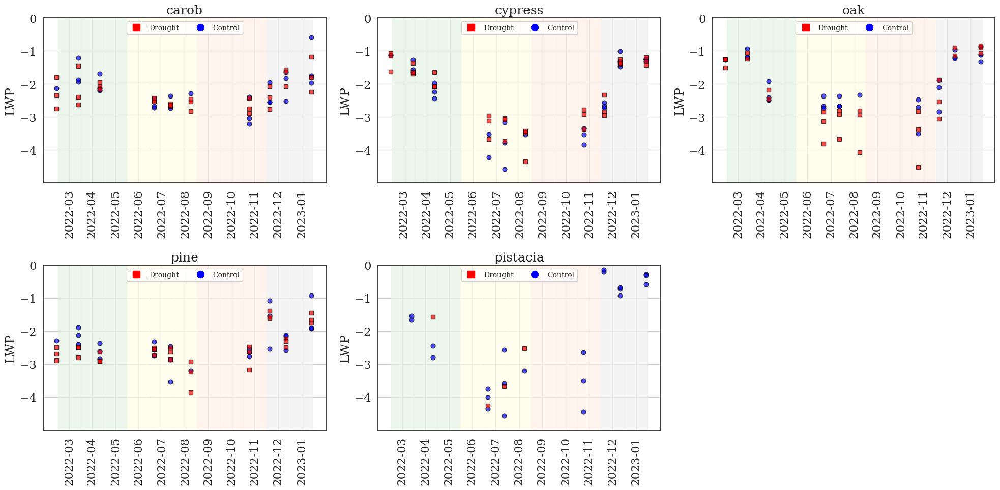

In [ ]:
import matplotlib.patches as mpatches

# Define a mapping of categorical values in the 'treatment' column to colors and markers
treatment_colors = {'drought': '#ff0000', 'control': '#0000ff'}
treatment_markers = {'drought': 's', 'control': 'o'}  # 's' for square, 'o' for circle

# Define season colors
season_colors = {
    'Spring': '#e6f3e6',  # Light green
    'Summer': '#fffde6',  # Light yellow
    'Autumn': '#fff0e6',    # Light orange
    'Winter': '#f0f0f0'   # Light gray
}



# Group the DataFrame by the 'English_name' column
grouped_df = df.groupby('English_name')

# Calculate the number of unique English_names to set up the subplot grid
num_plots = len(grouped_df)

# Determine the number of rows and columns for the subplot grid
num_cols = 3  # Set the number of columns in the subplot grid
num_rows = (num_plots + num_cols - 1) // num_cols  # Calculate the number of rows

# Create the main figure and the subplot grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5*num_rows))

# Flatten the 2D axes array into a 1D array for easier iteration
axes = axes.flatten()

# Calculate common xticks positions and labels (one per month)
xticks_positions = pd.date_range(df['spectral_date'].min(), df['spectral_date'].max(), freq='M')
xticks_labels = [date.strftime('%Y-%m') for date in xticks_positions]

# Iterate through each group and create a scatter graph in its respective subplot
for i, (english_name, group) in enumerate(grouped_df):
    ax = axes[i]

    # Plot the seasonal background
    for season, color in season_colors.items():
        season_dates = [date for date in xticks_positions if get_season(date.month) == season]
        for date in season_dates:
            ax.axvspan(date - pd.Timedelta(days=15), date + pd.Timedelta(days=15), color=color, alpha=0.7)

    # Plot the scatter points
    for treatment in ['control', 'drought']:
        subset = group[group['treatment'] == treatment]
        ax.scatter(subset['spectral_date'], subset['LWP'],
                   s=40,  # Increased marker size to 40
                   alpha=0.7,
                   edgecolor='black',  # black border
                   c=treatment_colors[treatment],
                   marker=treatment_markers[treatment])

    ax.set_ylabel('LWP')
    ax.set_title(f'{english_name}')
    ax.tick_params(axis='x', rotation=90)
    ax.grid(True)
    ax.set_yticks(np.arange(-4, 1, 1))
    ax.set_ylim(-5, 0)

    # Set xticks and xtick labels
    ax.set_xticks(xticks_positions)
    ax.set_xticklabels(xticks_labels)

    # Create legend with markers for each subplot, without the season legend
    handles = [
        plt.Line2D([], [], color=treatment_colors[treatment], marker=treatment_markers[treatment],
                   linestyle='None', markersize=10, label=treatment.capitalize())
        for treatment in treatment_colors
    ]

    # Place the legend centered at the top
    ax.legend(handles=handles, loc='upper center', fontsize=10, ncol=2)

# Remove any empty subplots
for i in range(num_plots, len(axes)):
    fig.delaxes(axes[i])

# Set common x-axis label
axes[-1].set_xlabel('Spectral Date')
plt.tight_layout()
plt.show()


<ipython-input-9-a63c1fc00c9e>:41: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  xticks_positions = pd.date_range(df['spectral_date'].min(), df['spectral_date'].max(), freq='M')


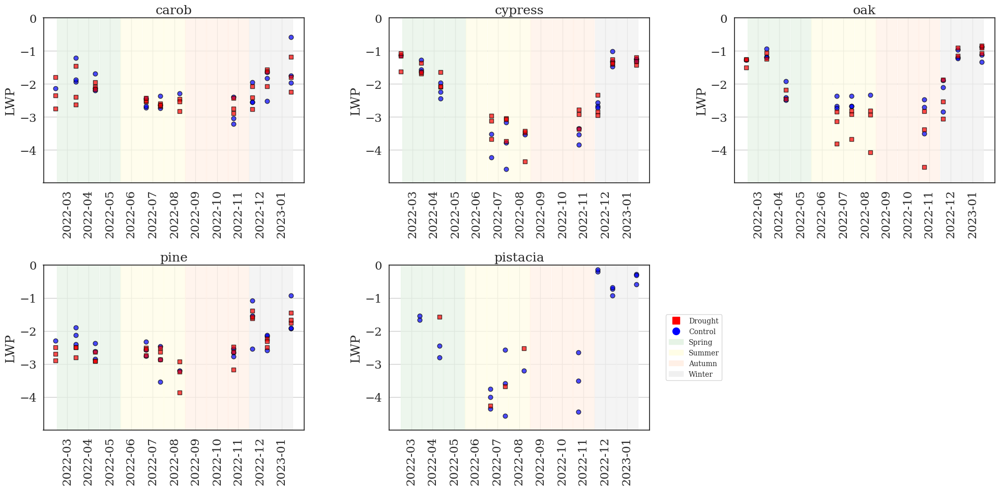

In [ ]:

# Define a mapping of categorical values in the 'treatment' column to colors and markers
treatment_colors = {'drought': '#ff0000', 'control': '#0000ff'}
treatment_markers = {'drought': 's', 'control': 'o'}  # 's' for square, 'o' for circle

# Define season colors
season_colors = {
    'Spring': '#e6f3e6',  # Light green
    'Summer': '#fffde6',  # Light yellow
    'Autumn': '#fff0e6',  # Light orange
    'Winter': '#f0f0f0'   # Light gray
}

# Function to get season based on month
def get_season(month):
    if 3 <= month <= 5:
        return 'Spring'
    elif 6 <= month <= 8:
        return 'Summer'
    elif 9 <= month <= 11:
        return 'Autumn'
    else:
        return 'Winter'

# Group the DataFrame by the 'English_name' column
grouped_df = df.groupby('English_name')

# Calculate the number of unique English_names to set up the subplot grid
num_plots = len(grouped_df)

# Determine the number of rows and columns for the subplot grid
num_cols = 3  # Set the number of columns in the subplot grid
num_rows = (num_plots + num_cols - 1) // num_cols  # Calculate the number of rows

# Create the main figure and the subplot grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5*num_rows))

# Flatten the 2D axes array into a 1D array for easier iteration
axes = axes.flatten()

# Calculate common xticks positions and labels (one per month)
xticks_positions = pd.date_range(df['spectral_date'].min(), df['spectral_date'].max(), freq='M')
xticks_labels = [date.strftime('%Y-%m') for date in xticks_positions]

# Iterate through each group and create a scatter graph in its respective subplot
for i, (english_name, group) in enumerate(grouped_df):
    ax = axes[i]

    # Plot the seasonal background
    for season, color in season_colors.items():
        season_dates = [date for date in xticks_positions if get_season(date.month) == season]
        for date in season_dates:
            ax.axvspan(date - pd.Timedelta(days=15), date + pd.Timedelta(days=15), color=color, alpha=0.7)

    # Plot the scatter points
    for treatment in ['control', 'drought']:
        subset = group[group['treatment'] == treatment]
        ax.scatter(subset['spectral_date'], subset['LWP'],
                   s=40,  # Increased marker size to 40
                   alpha=0.7,
                   edgecolor='black',  # black border
                   c=treatment_colors[treatment],
                   marker=treatment_markers[treatment])

    ax.set_ylabel('LWP')
    ax.set_title(f'{english_name}')
    ax.tick_params(axis='x', rotation=90)
    ax.grid(True)
    ax.set_yticks(np.arange(-4, 1, 1))
    ax.set_ylim(-5, 0)

    # Set xticks and xtick labels
    ax.set_xticks(xticks_positions)
    ax.set_xticklabels(xticks_labels)

# Remove any empty subplots
for i in range(num_plots, len(axes)):
    fig.delaxes(axes[i])

# Create combined legend
handles = [
    plt.Line2D([], [], color=treatment_colors[treatment], marker=treatment_markers[treatment],
               linestyle='None', markersize=10, label=treatment.capitalize())
    for treatment in treatment_colors
]

season_handles = [
    mpatches.Patch(color=season_colors[season], label=season)
    for season in season_colors
]

# Place the legend in the location of the 6th subplot
plt.legend(handles=handles + season_handles, loc='center left', bbox_to_anchor=(1.05, 0.5), fontsize=10, ncol=1)

# Set common x-axis label
axes[-1].set_xlabel('Spectral Date')
plt.tight_layout()
plt.show()

In [ ]:
# import lwp data
df_lwp = pd.read_csv("/content/drive/MyDrive/LWP_Netanel/LWP_table_for_JMP.csv")
df_lwp.Date.unique()

array(['2021-10-25', '2021-12-15', '2022-01-14', '2022-02-13',
       '2022-03-14', '2022-12-04', '2022-10-05', '2022-06-28',
       '2022-07-21', '2022-11-08', '2022-07-09', '2022-10-27',
       '2022-11-21', '2022-12-20', '2023-10-01', '2023-01-19',
       '2023-02-13', '2023-02-28', '2023-03-26', '2023-04-24',
       '2023-05-24', '2023-06-27', '2023-07-27', '2023-08-24',
       '2023-09-19'], dtype=object)

In [ ]:
# import lwp data
df_lwp = pd.read_csv("/content/drive/MyDrive/LWP_Netanel/LWP_table_for_JMP.csv")
df_lwp = df_lwp[['LWP(MPa)', 'Date', 'English_name', 'treatment', 'Season']]

# replace '2022-12-04' to '12-04-2022'
df_lwp = df_lwp.replace('2022-12-04', '2022-04-12')
df_lwp = df_lwp.replace('2022-10-05', '2022-05-10')
df_lwp = df_lwp.replace('2022-11-08' , '2022-08-11')
df_lwp = df_lwp.replace('2022-07-09', '2022-09-07')
df_lwp = df_lwp.replace('2023-10-01', '2023-01-10')


# Create datetime column
df_lwp['Date'] = pd.to_datetime(df_lwp['Date'])

# Create date only for month
df_lwp['Date'] = df_lwp['Date'].dt.strftime('%Y-%m')

# create the day as 15 for each month
df_lwp['Date'] = df_lwp['Date'] + '-15'

# Sort by date
df_lwp = df_lwp.sort_values(by='Date')

# start from 03-2022 to 01-2023
df_lwp = df_lwp[(df_lwp['Date'] >= '2022-03') & (df_lwp['Date'] <= '2023-01')]

print(df_lwp.Date.unique())

# Export to csv
df_lwp.to_csv('/content/drive/MyDrive/LWP_Netanel/LWP_table_for_JMP_fixed.csv', index=False)

['2022-03-15' '2022-04-15' '2022-05-15' '2022-06-15' '2022-07-15'
 '2022-08-15' '2022-09-15' '2022-10-15' '2022-11-15' '2022-12-15']


<ipython-input-12-758ceac1452b>:41: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  xticks_positions = pd.date_range(df_lwp['Date'].min(), df_lwp['Date'].max(), freq='M')


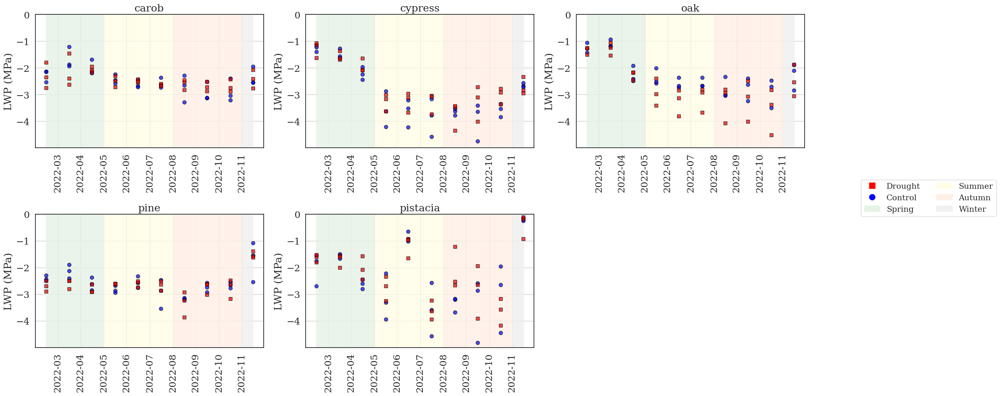

In [ ]:
# Define a mapping of categorical values in the 'treatment' column to colors and markers
treatment_colors = {'drought': '#ff0000', 'control': '#0000ff'}
treatment_markers = {'drought': 's', 'control': 'o'}  # 's' for square, 'o' for circle

# Define season colors
season_colors = {
    'Spring': '#e6f3e6',  # Light green
    'Summer': '#fffde6',  # Light yellow
    'Autumn': '#fff0e6',  # Light orange
    'Winter': '#f0f0f0'   # Light gray
}

# Function to get season based on month
def get_season(month):
    if 3 <= month <= 5:
        return 'Spring'
    elif 6 <= month <= 8:
        return 'Summer'
    elif 9 <= month <= 11:
        return 'Autumn'
    else:
        return 'Winter'

# Group the DataFrame by the 'English_name' column
grouped_df = df_lwp.groupby('English_name')

# Calculate the number of unique English_names to set up the subplot grid
num_plots = len(grouped_df)

# Determine the number of rows and columns for the subplot grid
num_cols = 3  # Set the number of columns in the subplot grid
num_rows = (num_plots + num_cols - 1) // num_cols  # Calculate the number of rows

# Create the main figure and the subplot grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5*num_rows))

# Flatten the 2D axes array into a 1D array for easier iteration
axes = axes.flatten()

# Calculate common xticks positions and labels (one per month)
xticks_positions = pd.date_range(df_lwp['Date'].min(), df_lwp['Date'].max(), freq='M')
xticks_labels = [date.strftime('%Y-%m') for date in xticks_positions]

# Iterate through each group and create a scatter graph in its respective subplot
for i, (english_name, group) in enumerate(grouped_df):
    ax = axes[i]

    # Plot the seasonal background based on month
# Plot the seasonal background based on actual data range
for i, (english_name, group) in enumerate(grouped_df):
    ax = axes[i]

    # Plot the seasonal background for the entire date range
    for date in pd.date_range(group['Date'].min(), group['Date'].max(), freq='D'):
        season = get_season(date.month)
        color = season_colors[season]
        ax.axvspan(date - pd.Timedelta(days=0.5), date + pd.Timedelta(days=0.5), color=color, alpha=0.5)

    # Plot the scatter points
    for treatment in ['control', 'drought']:
        subset = group[group['treatment'] == treatment]
        ax.scatter(subset['Date'], subset['LWP(MPa)'],
                   s=40,  # Increased marker size to 40
                   alpha=0.7,
                   edgecolor='black',  # black border
                   c=treatment_colors[treatment],
                   marker=treatment_markers[treatment])

    ax.set_ylabel('LWP (MPa)')
    ax.set_title(f'{english_name}')
    ax.tick_params(axis='x', rotation=90)
    ax.grid(True)
    ax.set_yticks(np.arange(-4, 1, 1))
    ax.set_ylim(-5, 0)

    # Set xticks and xtick labels
    ax.set_xticks(xticks_positions)
    ax.set_xticklabels(xticks_labels)

# Create a combined legend for the entire plot
handles = [
    plt.Line2D([], [], color=treatment_colors[treatment], marker=treatment_markers[treatment],
               linestyle='None', markersize=10, label=treatment.capitalize())
    for treatment in treatment_colors
] + [
    mpatches.Patch(color=season_colors[season], label=season)
    for season in season_colors
]

fig.legend(handles=handles, loc='center left', bbox_to_anchor=(1.05, 0.5), fontsize=14, ncol=2)

# Remove any empty subplots
for i in range(num_plots, len(axes)):
    fig.delaxes(axes[i])

# Set common x-axis label
axes[-1].set_xlabel('Date')
plt.tight_layout()
plt.show()

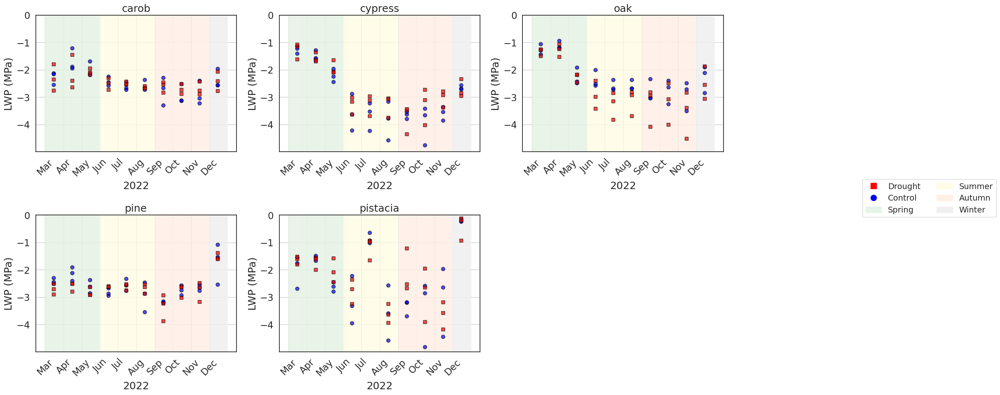

In [ ]:
# Define a mapping of categorical values in the 'treatment' column to colors and markers
treatment_colors = {'drought': '#ff0000', 'control': '#0000ff'}
treatment_markers = {'drought': 's', 'control': 'o'}  # 's' for square, 'o' for circle

# Define season colors
season_colors = {
    'Spring': '#e6f3e6',  # Light green
    'Summer': '#fffde6',  # Light yellow
    'Autumn': '#fff0e6',  # Light orange
    'Winter': '#f0f0f0'   # Light gray
}

# Function to get season based on month
def get_season(month):
    if 3 <= month <= 5:
        return 'Spring'
    elif 6 <= month <= 8:
        return 'Summer'
    elif 9 <= month <= 11:
        return 'Autumn'
    else:
        return 'Winter'

# Group the DataFrame by the 'English_name' column
grouped_df = df_lwp.groupby('English_name')

# Calculate the number of unique English_names to set up the subplot grid
num_plots = len(grouped_df)

# Determine the number of rows and columns for the subplot grid
num_cols = 3  # Set the number of columns in the subplot grid
num_rows = (num_plots + num_cols - 1) // num_cols  # Calculate the number of rows

# Create the main figure and the subplot grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5*num_rows))

# Flatten the 2D axes array into a 1D array for easier iteration
axes = axes.flatten()

# Calculate common xticks positions and labels (one per month)
start_date = pd.to_datetime('2022-03-01')
end_date = pd.to_datetime('2022-12-31')
xticks_positions = pd.date_range(start_date, end_date, freq='MS')  #MS is the start of the month
xticks_labels = [date.strftime('%b') for date in xticks_positions] #%B gives full month name


# Iterate through each group and create a scatter graph in its respective subplot
for i, (english_name, group) in enumerate(grouped_df):
    ax = axes[i]

    # Plot the seasonal background based on actual data range
    for date in pd.date_range(start_date, end_date, freq='D'): #use the start and end dates for full background
        season = get_season(date.month)
        color = season_colors[season]
        ax.axvspan(date - pd.Timedelta(days=0.5), date + pd.Timedelta(days=0.5), color=color, alpha=0.5)

    # Plot the scatter points
    for treatment in ['control', 'drought']:
        subset = group[group['treatment'] == treatment]
        ax.scatter(subset['Date'], subset['LWP(MPa)'],
                   s=40,  # Increased marker size to 40
                   alpha=0.7,
                   edgecolor='black',  # black border
                   c=treatment_colors[treatment],
                   marker=treatment_markers[treatment])

    ax.set_ylabel('LWP (MPa)')
    ax.set_title(f'{english_name}')
    ax.tick_params(axis='x', rotation=45) # Reduced rotation
    ax.grid(True)
    ax.set_yticks(np.arange(-4, 1, 1))
    ax.set_ylim(-5, 0)

    # Set xticks and xtick labels
    ax.set_xticks(xticks_positions)
    ax.set_xticklabels(xticks_labels)

    # Add the year '2022' below the x-axis label
    ax.text(0.5, -0.25, '2022', ha='center', va='center', transform=ax.transAxes)


# Create a combined legend for the entire plot
handles = [
    plt.Line2D([], [], color=treatment_colors[treatment], marker=treatment_markers[treatment],
               linestyle='None', markersize=10, label=treatment.capitalize())
    for treatment in treatment_colors
] + [
    mpatches.Patch(color=season_colors[season], label=season)
    for season in season_colors
]

fig.legend(handles=handles, loc='center left', bbox_to_anchor=(1.05, 0.5), fontsize=14, ncol=2)

# Remove any empty subplots
for i in range(num_plots, len(axes)):
    fig.delaxes(axes[i])

# Set common x-axis label
plt.tight_layout(rect=[0, 0, 0.9, 1]) # Adjust layout to make room for external legend

# Save the figure
plt.savefig('lwp_scatterplot.png', bbox_inches='tight', dpi=600)

# Show
plt.show()

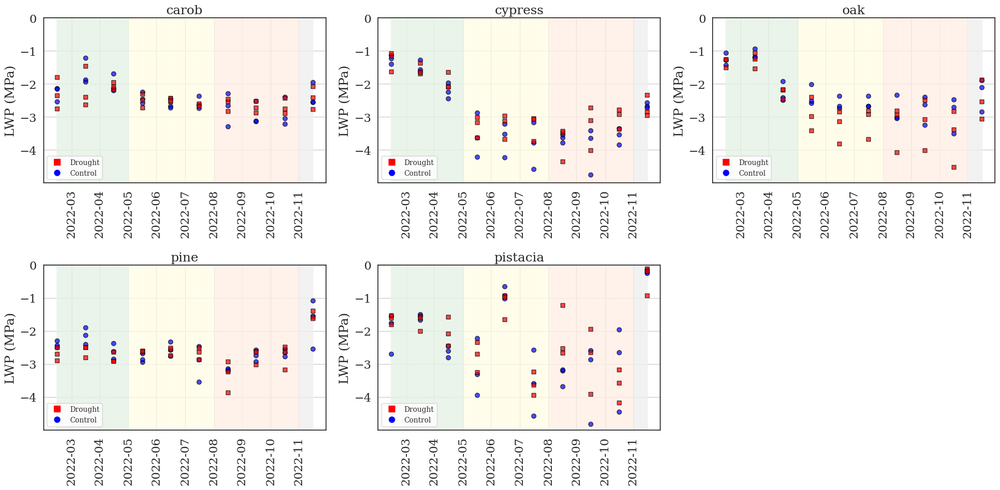

In [ ]:
# Define a mapping of categorical values in the 'treatment' column to colors and markers
treatment_colors = {'drought': '#ff0000', 'control': '#0000ff'}
treatment_markers = {'drought': 's', 'control': 'o'}  # 's' for square, 'o' for circle

# Define season colors
season_colors = {'Spring': '#e6f3e6', 'Summer': '#fffde6', 'Autumn': '#fff0e6', 'Winter': '#f0f0f0'}

# Function to get season based on month
def get_season(month):
    if 3 <= month <= 5:
        return 'Spring'
    elif 6 <= month <= 8:
        return 'Summer'
    elif 9 <= month <= 11:
        return 'Autumn'
    else:
        return 'Winter'

# Group the DataFrame by the 'English_name' column
grouped_df = df_lwp.groupby('English_name')

# Calculate the number of unique English_names to set up the subplot grid
num_plots = len(grouped_df)

# Determine the number of rows and columns for the subplot grid
num_cols = 3
num_rows = (num_plots + num_cols - 1) // num_cols

# Create the main figure and the subplot grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5 * num_rows))
axes = axes.flatten()

# Calculate common xticks positions and labels (one per month)
xticks_positions = pd.date_range(df_lwp['Date'].min(), df_lwp['Date'].max(), freq='M')
xticks_labels = [date.strftime('%Y-%m') for date in xticks_positions]

# Iterate through each group and create a scatter graph in its respective subplot
for i, (english_name, group) in enumerate(grouped_df):
    ax = axes[i]

    # Plot the seasonal background for the entire date range
    for date in pd.date_range(group['Date'].min(), group['Date'].max(), freq='D'):
        season = get_season(date.month)
        color = season_colors[season]
        ax.axvspan(date - pd.Timedelta(days=0.5), date + pd.Timedelta(days=0.5), color=color, alpha=0.5)

    # Plot the scatter points
    for treatment in ['control', 'drought']:
        subset = group[group['treatment'] == treatment]
        ax.scatter(subset['Date'], subset['LWP(MPa)'], s=40, alpha=0.7, edgecolor='black',
                   c=treatment_colors[treatment], marker=treatment_markers[treatment])

    # Add the legend in the upper left side of the subplot with the text "12"
    handles = [
        plt.Line2D([], [], color=treatment_colors[treatment], marker=treatment_markers[treatment],
                   linestyle='None', markersize=8, label=treatment.capitalize())
        for treatment in treatment_colors
    ]
    ax.legend(handles=handles, loc='lower left', fontsize=10,)

    ax.set_ylabel('LWP (MPa)')
    ax.set_title(f'{english_name}')
    ax.tick_params(axis='x', rotation=90)
    ax.grid(True)
    ax.set_yticks(np.arange(-4, 1, 1))
    ax.set_ylim(-5, 0)
    ax.set_xticks(xticks_positions)
    ax.set_xticklabels(xticks_labels)

# Remove any empty subplots
for i in range(num_plots, len(axes)):
    fig.delaxes(axes[i])

# Set common x-axis label
axes[-1].set_xlabel('Date')

plt.tight_layout()
plt.show()

In [ ]:
def perform_seasonal_ttest(data, column_name):
    """
    Perform t-tests between control and drought treatments for different seasons and measurements.

    Args:
        data (pd.DataFrame): The input DataFrame containing the data.
        column_name (str): The name of the column to perform the t-test on.

    Returns:
        pd.DataFrame: A DataFrame with tree species, season, and p-value for each measurement.
    """
    # Convert the 'spectral_date' column to datetime format if not already in datetime
    data['Date'] = pd.to_datetime(data['Date'])

    # Define a function to categorize dates into seasons
    def get_season(month):
        if month in [12, 1, 2]:
            return "Winter"
        elif month in [3, 4, 5]:
            return "Spring"
        elif month in [6, 7, 8]:
            return "Summer"
        else:
            return "Autumn"

    # Add a new column 'season' to the DataFrame based on the month of 'spectral_date'
    data['season'] = data['Date'].dt.month.apply(get_season)

    # Get unique values from the 'English_name' column
    unique_values = data['English_name'].unique()

    results = []

    # Perform t-tests for each unique value and each season
    for value in unique_values:
        for season in ['Spring', 'Summer', 'Autumn', 'Winter']:
            df_season = data[(data['English_name'] == value) & (data['season'] == season)]

            control_vals = df_season[df_season['treatment'] == "control"][column_name]
            drought_vals = df_season[df_season['treatment'] == "drought"][column_name]

            t_stat, p_value = ttest_ind(control_vals, drought_vals)

            results.append({
                'English Name': value,
                'Season': season,
                'Pvalue': p_value
            })

    results_df = pd.DataFrame(results)

    return results_df

In [ ]:
# Perform T test on LWP between seasons
df_LWP_ttest = perform_seasonal_ttest(df_lwp, 'LWP(MPa)')
df_LWP_ttest

,English Name,Season,Pvalue
0,carob,Spring,0.314123
1,carob,Summer,0.963474
2,carob,Autumn,0.212816
3,carob,Winter,0.841379
4,pistacia,Spring,0.239232
5,pistacia,Summer,0.978414
6,pistacia,Autumn,0.381733
7,pistacia,Winter,0.459936
8,pine,Spring,0.010556
9,pine,Summer,0.247699


In [ ]:

# keep noon data only
#df_paprams = df_paprams[df_paprams['Time of day']=='noon']

# Count number of nan values in each column
print(df_paprams[['A_corrected','E_corrected']].isna().sum())

df_paprams['Season'] = pd.to_datetime(df_paprams['date_hour']).dt.month.apply(lambda x: 'Winter' if x in [12, 1, 2] else ('Spring' if x in [3, 4, 5] else ('Summer' if x in [6, 7, 8] else 'Autumn')))

df_paprams[['A_corrected','E_corrected','Season', 'English_name', 'treatment', 'date_hour']].to_csv('/content/drive/MyDrive/LWP_Netanel/Statistics.csv', index=False)

A_corrected    243
E_corrected    243
dtype: int64


In [ ]:
# create date column
df_paprams['spectral_date'] = df_paprams['date_hour'].values

# Perform T test on LWP between seasons
df_A = perform_seasonal_ttest(df_paprams, 'A_corrected')
df_A

,English Name,Season,Pvalue
0,cypress,Spring,0.279466
1,cypress,Summer,0.642206
2,cypress,Autumn,NaN
3,cypress,Winter,NaN
4,oak,Spring,0.428035
5,oak,Summer,0.101051
6,oak,Autumn,NaN
7,oak,Winter,NaN
8,pistacia,Spring,NaN
9,pistacia,Summer,NaN


In [ ]:
parameters = ["E_corrected", 'A_corrected']
parameter = "A_corrected"

# Read the new DataFrame from the CSV file
df_params = pd.read_csv("/content/drive/MyDrive/LWP_Netanel/tree_tod_merged_data.csv")

# Convert the 'spectral_date' column to datetime format if not already in datetime
df_params['date_hour'] = pd.to_datetime(df_params['date_hour'])

# Get unique values from the 'English_name' column
unique_values = df_params['English_name'].unique()

# Initialize a list to store the results
results = []

# Split the DataFrame into two sets based on the date (before and after 2022-08-11)
before_date = pd.to_datetime('2022-08-11')
df_params_before = df_params[df_params['date_hour'] <= before_date]
df_params_after = df_params[df_params['date_hour'] > before_date]

# Perform t-tests for each unique value
for value in unique_values:
    df_plant_before = df_params_before[df_params_before['English_name'] == value]
    df_plant_after = df_params_after[df_params_after['English_name'] == value]

    numerical_col_before = df_plant_before[parameter].dropna()
    binary_col_before = df_plant_before['treatment'].dropna()

    numerical_col_after = df_plant_after[parameter].dropna()
    binary_col_after = df_plant_after['treatment'].dropna()

    # Perform the t-tests for both sets of data
    t_stat_before, p_value_before = ttest_ind(numerical_col_before[binary_col_before == "drought"], numerical_col_before[binary_col_before == "control"])
    t_stat_after, p_value_after = ttest_ind(numerical_col_after[binary_col_after == "drought"], numerical_col_after[binary_col_after == "control"])

    # Add the results to the list
    results.append({
        'Species': value,
        'p-value before': p_value_before,
        'p-value after': p_value_after
    })

# Convert the list of dictionaries into a DataFrame
results_df = pd.DataFrame(results)

# Display the results DataFrame
results_df

,Species,p-value before,p-value after
0,cypress,0.408627,0.165400
1,oak,0.571738,0.248990
2,pistacia,0.723995,0.355681
3,pine,0.985504,0.115837
4,carob,0.038013,0.715649


In [ ]:
# Create an empty DataFrame to store the results
results_df1 = pd.DataFrame(columns=['English Name', 't-statistic', 'p-value'])

# Perform t-tests for each unique value
for value in unique_values:
  df_plant = df_paprams[df_paprams['English_name']==value]
  # Assuming your DataFrame is named 'df' and the columns are named 'numerical' and 'binary'
  numerical_col = df_plant['A_corrected'].dropna()
  binary_col = df_plant['treatment'].dropna()

  # Perform the t-test
  t_stat, p_value = ttest_ind(numerical_col[binary_col == "drought"], numerical_col[binary_col == "control"])

  # Add the results to the DataFrame
  results_df1 = results_df1.append({'English Name': value, 't-statistic': t_stat, 'p-value': p_value}, ignore_index=True)

results_df['A'] = results_df1['p-value'].values

# Create an empty DataFrame to store the results
results_df1 = pd.DataFrame(columns=['English Name', 't-statistic', 'p-value'])

# Perform t-tests for each unique value
for value in unique_values:
  df_plant = df_paprams[df_paprams['English_name']==value]
  # Assuming your DataFrame is named 'df' and the columns are named 'numerical' and 'binary'
  numerical_col = df_plant['gs'].dropna()
  binary_col = df_plant['treatment'].dropna()

  # Perform the t-test
  t_stat, p_value = ttest_ind(numerical_col[binary_col == "drought"], numerical_col[binary_col == "control"])

  # Add the results to the DataFrame
  results_df1 = results_df1.append({'English Name': value, 't-statistic': t_stat, 'p-value': p_value}, ignore_index=True)

results_df['gs'] = results_df1['p-value'].values
results_df

AttributeError: 'DataFrame' object has no attribute 'append'

## All Bands ML

In [3]:
df_bands = df[df.columns[:-7]]

# Define features and labels
X = df_bands

# Encode "English_name"
label_encoder = LabelEncoder()
X["English_name_encoded"] = label_encoder.fit_transform(df["English_name"])
X['spectral_date'] = df['spectral_date'].values
X['English_name'] = df['English_name'].values
X['ID'] = df['ID'].values

# Print the mapping of the encoded values
english_name_mapping = dict(zip(label_encoder.transform(label_encoder.classes_),label_encoder.classes_))

y = df['treatment']

# Split to train-test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# save date of test set for research later
dates_test = X_test['spectral_date']
ids_test = X_test['ID']

# drop from sets
X_train,X_test = X_train.drop(['English_name','spectral_date', 'ID'],axis=1),X_test.drop(['English_name','spectral_date', 'ID'],axis=1)

X_train.shape,X_test.shape

((172, 274), (74, 274))

### Logistic Regression

In [ ]:
param_distribs = {
    'penalty': ['l1', 'l2'],
    'C': reciprocal(1, 1000),
    'solver': ['liblinear', 'saga'],
    'tol': expon(scale=1e-4),
    'fit_intercept': [False, True],
    'intercept_scaling': expon(scale=1.0),
    'max_iter': [100, 200, 300, 400, 500]
}

logreg_clf = LogisticRegression()
rnd_search = RandomizedSearchCV(logreg_clf, param_distributions=param_distribs,
                                n_iter=100, cv=5, scoring='accuracy',
                                verbose=2, random_state=42)
# rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
# print("Best parameters: {}".format(rnd_search.best_params_))
# print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

In [ ]:
# DEFINE BEST PARAMETERS
best_params = {'C': 458.8156549160972, 'fit_intercept': False, 'intercept_scaling': 0.4827677446825112, 'max_iter': 300, 'penalty': 'l1', 'solver': 'liblinear', 'tol': 8.238874948858289e-05}
# Create the Logistic Regression model with the best parameters from the randomized search
logreg = LogisticRegression(**best_params)

# Fit the model to the training data
logreg.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(logreg, X_train, y_train, cv=3)

# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')


print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Recall: 0.9310344827586207
Precision: 0.8709677419354839
F1 Score: 0.9


Test: Accuracy: 0.8513513513513513
Test: Recall: 0.9411764705882353
Test: Precision: 0.7804878048780488
Test: F1 Score: 0.8533333333333334


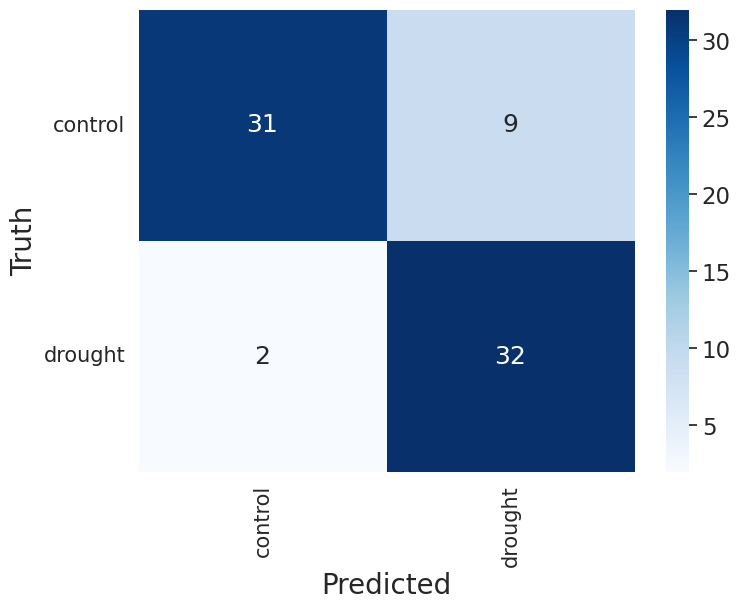

In [ ]:
y_test_pred = logreg.predict(X_test)

# print matrix
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred, pos_label='drought'))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred, pos_label='drought'))
print("Test: F1 Score:",metrics.f1_score(y_test, y_test_pred, pos_label='drought'))

###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 18},cmap="Blues")
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)
plt.savefig('confusion_matrix_lr_274.png',dpi=300,bbox_inches='tight')
plt.show()

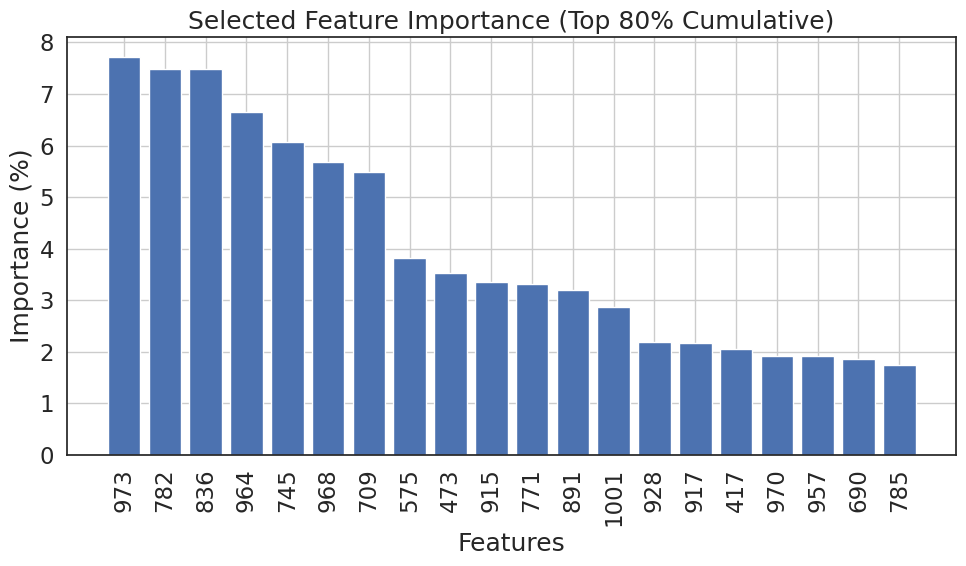

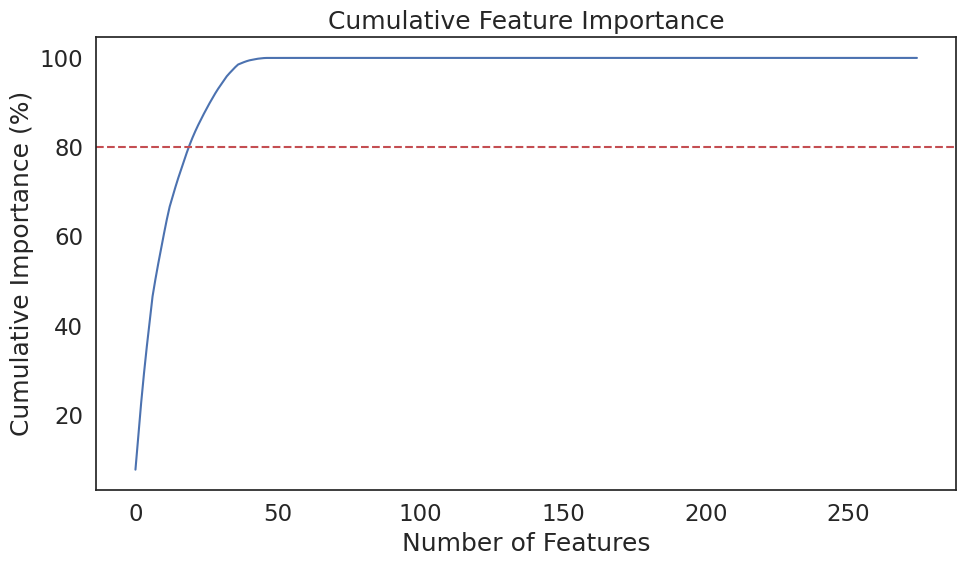

Selected Features Covering 80% Cumulative Importance:
973: 7.71%
782: 7.49%
836: 7.48%
964: 6.66%
745: 6.07%
968: 5.67%
709: 5.49%
575: 3.82%
473: 3.53%
915: 3.36%
771: 3.32%
891: 3.19%
1001: 2.87%
928: 2.19%
917: 2.16%
417: 2.05%
970: 1.92%
957: 1.92%
690: 1.87%
785: 1.75%


In [ ]:
# Define the cumulative percentage threshold
X_percent = 80  # Example cumulative percentage threshold

# Get the coefficients of the model
coefficients = logreg.coef_[0]

# Calculate the absolute feature importance
feature_importance = np.abs(coefficients)

# Calculate the percentage of each feature importance
total_importance = np.sum(feature_importance)
percentage_importance = (feature_importance / total_importance) * 100

# Sort the feature importance in descending order
sorted_idx = np.argsort(percentage_importance)[::-1]
sorted_percentage_importance = percentage_importance[sorted_idx]

# Calculate the cumulative sum of the sorted feature importance
cumulative_importance = np.cumsum(sorted_percentage_importance)

# Get the names of the features
feature_names = X_train.columns

# Find the index where cumulative importance exceeds the threshold
num_features = np.argmax(cumulative_importance >= X_percent) + 1

# Select features up to that index
selected_features_idx = sorted_idx[:num_features]
selected_features = feature_names[selected_features_idx]
selected_importance = percentage_importance[selected_features_idx]

# Plot the selected feature importance
plt.figure(figsize=(10, 6))
plt.bar(range(len(selected_importance)), selected_importance, align='center')
plt.xticks(range(len(selected_importance)), selected_features, rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance (%)')
plt.title(f'Selected Feature Importance (Top {X_percent}% Cumulative)')
plt.tight_layout()
plt.grid(True)
plt.show()

# Plot the cumulative feature importance
plt.figure(figsize=(10, 6))
plt.plot(range(len(cumulative_importance)), cumulative_importance)
plt.axhline(y=X_percent, color='r', linestyle='--')
plt.xlabel('Number of Features')
plt.ylabel('Cumulative Importance (%)')
plt.title('Cumulative Feature Importance')
plt.tight_layout()
plt.show()

# Print the selected features and their importance
print(f"Selected Features Covering {X_percent}% Cumulative Importance:")
for feature, importance in zip(selected_features, selected_importance):
    print(f"{feature}: {importance:.2f}%")

In [ ]:
x_new_lr = X[selected_features]

# Convert column names to numeric values (wavelengths)
wavelengths = np.array([float(col) for col in x_new_lr.columns])

# Sort the columns based on wavelengths
sorted_indices = np.argsort(wavelengths)
sorted_wavelengths = wavelengths[sorted_indices]
sorted_features = x_new_lr.columns[sorted_indices]
sorted_importance = selected_importance[sorted_indices]

# Initialize a list to keep track of selected features
final_selected_features = []
final_selected_importance = []

# Iterate through the sorted features and keep the most important one within each 15 nm range
i = 0
while i < len(sorted_wavelengths):
    current_wavelength = sorted_wavelengths[i]
    current_importance = sorted_importance[i]
    current_feature = sorted_features[i]

    # Find the range of wavelengths within 15 nm
    j = i + 1
    while j < len(sorted_wavelengths) and sorted_wavelengths[j] <= current_wavelength + 10:
        if sorted_importance[j] > current_importance:
            current_wavelength = sorted_wavelengths[j]
            current_importance = sorted_importance[j]
            current_feature = sorted_features[j]
        j += 1

    # Add the most important feature within the range to the final list
    final_selected_features.append(current_feature)
    final_selected_importance.append(current_importance)

    # Move to the next range
    i = j

# Create a new DataFrame with the final selected features
x_final_lr = x_new_lr[final_selected_features]

# Print the final selected features and their importance
print("Selected Features:", final_selected_features)
print("Selected Importance:", final_selected_importance)

x_final_lr

Selected Features: ['417', '473', '575', '690', '709', '745', '771', '782', '836', '891', '915', '928', '973', '1001']
Selected Importance: [np.float64(2.049055760299736), np.float64(3.5342510693089224), np.float64(3.817378314054354), np.float64(1.8674809992898314), np.float64(5.489440523169796), np.float64(6.069031180512743), np.float64(3.3200365832120133), np.float64(7.488997306495902), np.float64(7.475795943306802), np.float64(3.1897357234645587), np.float64(3.363534636418087), np.float64(2.19251982732645), np.float64(7.712661323561264), np.float64(2.871172410009638)]


,417,473,575,690,709,745,771,782,836,891,915,928,973,1001
0,0.021651,0.035576,0.058652,0.041498,0.089856,0.202421,0.221269,0.226639,0.229911,0.237316,0.230614,0.224293,0.219061,0.234268
15,0.020583,0.028269,0.047684,0.037443,0.077453,0.192509,0.212393,0.216926,0.222225,0.232447,0.227859,0.227017,0.222673,0.238218
14,0.021431,0.021444,0.037050,0.024382,0.053722,0.124474,0.132892,0.137094,0.139281,0.146230,0.142699,0.139204,0.134403,0.145318
12,0.039212,0.047763,0.076643,0.058901,0.111453,0.236198,0.254931,0.260462,0.268383,0.281426,0.276652,0.274680,0.268456,0.284798
11,0.020280,0.022096,0.040256,0.024762,0.072522,0.210619,0.234961,0.239479,0.243828,0.252956,0.247118,0.244081,0.234615,0.249627
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220,0.021855,0.029782,0.052843,0.039397,0.102631,0.282019,0.311182,0.314051,0.327415,0.339982,0.348214,0.345385,0.333938,0.340068
219,0.013684,0.022666,0.037615,0.026971,0.064154,0.158939,0.180563,0.181874,0.186010,0.188110,0.193834,0.185937,0.185199,0.187256
244,0.018530,0.025648,0.042529,0.031896,0.075567,0.206088,0.231608,0.234606,0.241142,0.247745,0.251929,0.247494,0.236201,0.241606
231,0.035411,0.051728,0.088002,0.067252,0.136741,0.272742,0.297606,0.301449,0.306340,0.315694,0.307704,0.305137,0.303973,0.303453


In [ ]:
new_df = df[df.columns[df.columns.isin(selected_features)]]
new_df

,417,473,575,690,709,745,771,782,785,836,891,915,917,928,957,964,968,970,973,1001
0,0.021651,0.035576,0.058652,0.041498,0.089856,0.202421,0.221269,0.226639,0.226026,0.229911,0.237316,0.230614,0.229825,0.224293,0.226143,0.223057,0.218648,0.217366,0.219061,0.234268
15,0.020583,0.028269,0.047684,0.037443,0.077453,0.192509,0.212393,0.216926,0.217130,0.222225,0.232447,0.227859,0.228024,0.227017,0.227710,0.225625,0.221304,0.220895,0.222673,0.238218
14,0.021431,0.021444,0.037050,0.024382,0.053722,0.124474,0.132892,0.137094,0.137816,0.139281,0.146230,0.142699,0.142412,0.139204,0.134894,0.134834,0.133448,0.133198,0.134403,0.145318
12,0.039212,0.047763,0.076643,0.058901,0.111453,0.236198,0.254931,0.260462,0.260710,0.268383,0.281426,0.276652,0.276642,0.274680,0.275137,0.272528,0.267358,0.266459,0.268456,0.284798
11,0.020280,0.022096,0.040256,0.024762,0.072522,0.210619,0.234961,0.239479,0.239313,0.243828,0.252956,0.247118,0.246751,0.244081,0.241969,0.238964,0.233809,0.232903,0.234615,0.249627
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220,0.021855,0.029782,0.052843,0.039397,0.102631,0.282019,0.311182,0.314051,0.315100,0.327415,0.339982,0.348214,0.348427,0.345385,0.335776,0.332359,0.328026,0.334162,0.333938,0.340068
219,0.013684,0.022666,0.037615,0.026971,0.064154,0.158939,0.180563,0.181874,0.180119,0.186010,0.188110,0.193834,0.191304,0.185937,0.185181,0.184809,0.182360,0.185640,0.185199,0.187256
244,0.018530,0.025648,0.042529,0.031896,0.075567,0.206088,0.231608,0.234606,0.235056,0.241142,0.247745,0.251929,0.251821,0.247494,0.239147,0.236073,0.232693,0.236595,0.236201,0.241606
231,0.035411,0.051728,0.088002,0.067252,0.136741,0.272742,0.297606,0.301449,0.299918,0.306340,0.315694,0.307704,0.307206,0.305137,0.304544,0.304984,0.306560,0.304274,0.303973,0.303453


#### Logistic Regression - Best Bands

In [ ]:
# Define features and labels
X = new_df

X['spectral_date'] = df['spectral_date'].values
X['English_name'] = df['English_name'].values
y = df['treatment']

# Split to train-test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

test_species = X_test['English_name'].values
test_dates = X_test['spectral_date'].values

X_train, X_test = X_train.drop(columns = ['spectral_date']).drop(columns = ['English_name']), X_test.drop(columns = ['spectral_date']).drop(columns = ['English_name'])

X_train.shape,X_test.shape

((172, 20), (74, 20))

In [ ]:
df[1 - True test (y_test),
   2 - Prediction_test (y_test_pred),
   3 - test_species]

df['test_species'].unique()

SyntaxError: invalid syntax. Perhaps you forgot a comma? (<ipython-input-1-7024148d7b8f>, line 1)

In [ ]:
# param_distribs = {
#     'penalty': ['l1', 'l2'],
#     'C': reciprocal(1, 1000),
#     'solver': ['liblinear', 'saga'],
#     'tol': expon(scale=1e-4),
#     'fit_intercept': [False, True],
#     'intercept_scaling': expon(scale=1.0),
#     'max_iter': [100, 200, 300, 400, 500]
# }

# logreg_clf = LogisticRegression()
# rnd_search = RandomizedSearchCV(logreg_clf, param_distributions=param_distribs,
#                                 n_iter=100, cv=5, scoring='accuracy',
#                                 verbose=2, random_state=42)
# rnd_search.fit(X_train, y_train)

# # Print the best parameters and the corresponding score
# print("Best parameters: {}".format(rnd_search.best_params_))
# print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.4s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   1.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.3s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.4s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   1.1s
[CV] END C=1.994916615063393, fi

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(



[CV] END C=1.994916615063393, fit_intercept=False, intercept_scaling=2.0112308644799395, max_iter=400, penalty=l2, solver=saga, tol=0.0001052363846077553; total time=   0.1s
[CV] END C=1.994916615063393, fit_intercept=False, intercept_scaling=2.0112308644799395, max_iter=400, penalty=l2, solver=saga, tol=0.0001052363846077553; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.994916615063393, fit_intercept=False, intercept_scaling=2.0112308644799395, max_iter=400, penalty=l2, solver=saga, tol=0.0001052363846077553; total time=   0.1s
[CV] END C=1.4765043713594344, fit_intercept=True, intercept_scaling=1.786429543354675, max_iter=200, penalty=l2, solver=saga, tol=2.0261142283225706e-05; total time=   0.0s
[CV] END C=1.4765043713594344, fit_intercept=True, intercept_scaling=1.786429543354675, max_iter=200, penalty=l2, solver=saga, tol=2.0261142283225706e-05; total time=   0.0s
[CV] END C=1.4765043713594344, fit_intercept=True, intercept_scaling=1.786429543354675, max_iter=200, penalty=l2, solver=saga, tol=2.0261142283225706e-05; total time=   0.1s
[CV] END C=1.4765043713594344, fit_intercept=True, intercept_scaling=1.786429543354675, max_iter=200, penalty=l2, solver=saga, tol=2.0261142283225706e-05; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.4765043713594344, fit_intercept=True, intercept_scaling=1.786429543354675, max_iter=200, penalty=l2, solver=saga, tol=2.0261142283225706e-05; total time=   0.1s
[CV] END C=8.17949947521167, fit_intercept=True, intercept_scaling=0.00709138979446984, max_iter=100, penalty=l1, solver=liblinear, tol=9.463708738997988e-05; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=8.17949947521167, fit_intercept=True, intercept_scaling=0.00709138979446984, max_iter=100, penalty=l1, solver=liblinear, tol=9.463708738997988e-05; total time=   0.6s
[CV] END C=8.17949947521167, fit_intercept=True, intercept_scaling=0.00709138979446984, max_iter=100, penalty=l1, solver=liblinear, tol=9.463708738997988e-05; total time=   0.3s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=8.17949947521167, fit_intercept=True, intercept_scaling=0.00709138979446984, max_iter=100, penalty=l1, solver=liblinear, tol=9.463708738997988e-05; total time=   0.3s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=8.17949947521167, fit_intercept=True, intercept_scaling=0.00709138979446984, max_iter=100, penalty=l1, solver=liblinear, tol=9.463708738997988e-05; total time=   0.5s
[CV] END C=2.6210878782654397, fit_intercept=True, intercept_scaling=3.6402995536277603, max_iter=300, penalty=l2, solver=liblinear, tol=0.00040882165254596954; total time=   0.0s
[CV] END C=2.6210878782654397, fit_intercept=True, intercept_scaling=3.6402995536277603, max_iter=300, penalty=l2, solver=liblinear, tol=0.00040882165254596954; total time=   0.0s
[CV] END C=2.6210878782654397, fit_intercept=True, intercept_scaling=3.6402995536277603, max_iter=300, penalty=l2, solver=liblinear, tol=0.00040882165254596954; total time=   0.0s
[CV] END C=2.6210878782654397, fit_intercept=True, intercept_scaling=3.6402995536277603, max_iter=300, penalty=l2, solver=liblinear, tol=0.00040882165254596954; total time=   0.0s
[CV] END C=2.6210878782654397, fit_intercept=True, intercept_scaling=3.6402995536277603, max_iter=300,

/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=25.135566617708278, fit_intercept=False, intercept_scaling=0.9353330206496101, max_iter=500, penalty=l1, solver=liblinear, tol=1.3353726611249124e-06; total time=   3.1s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=25.135566617708278, fit_intercept=False, intercept_scaling=0.9353330206496101, max_iter=500, penalty=l1, solver=liblinear, tol=1.3353726611249124e-06; total time=   3.3s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=25.135566617708278, fit_intercept=False, intercept_scaling=0.9353330206496101, max_iter=500, penalty=l1, solver=liblinear, tol=1.3353726611249124e-06; total time=   1.7s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=25.135566617708278, fit_intercept=False, intercept_scaling=0.9353330206496101, max_iter=500, penalty=l1, solver=liblinear, tol=1.3353726611249124e-06; total time=   3.2s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=25.135566617708278, fit_intercept=False, intercept_scaling=0.9353330206496101, max_iter=500, penalty=l1, solver=liblinear, tol=1.3353726611249124e-06; total time=   4.7s
[CV] END C=670.8188643346283, fit_intercept=True, intercept_scaling=1.6523315728128767, max_iter=100, penalty=l2, solver=liblinear, tol=2.625262508953778e-05; total time=   0.0s
[CV] END C=670.8188643346283, fit_intercept=True, intercept_scaling=1.6523315728128767, max_iter=100, penalty=l2, solver=liblinear, tol=2.625262508953778e-05; total time=   0.0s
[CV] END C=670.8188643346283, fit_intercept=True, intercept_scaling=1.6523315728128767, max_iter=100, penalty=l2, solver=liblinear, tol=2.625262508953778e-05; total time=   0.0s
[CV] END C=670.8188643346283, fit_intercept=True, intercept_scaling=1.6523315728128767, max_iter=100, penalty=l2, solver=liblinear, tol=2.625262508953778e-05; total time=   0.0s
[CV] END C=670.8188643346283, fit_intercept=True, intercept_scaling=1.6523315728128767, max_iter=100, penal

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=14.89984747565824, fit_intercept=True, intercept_scaling=1.0862557985649803, max_iter=200, penalty=l2, solver=saga, tol=2.3312023188561704e-05; total time=   0.1s
[CV] END C=14.89984747565824, fit_intercept=True, intercept_scaling=1.0862557985649803, max_iter=200, penalty=l2, solver=saga, tol=2.3312023188561704e-05; total time=   0.0s
[CV] END C=14.89984747565824, fit_intercept=True, intercept_scaling=1.0862557985649803, max_iter=200, penalty=l2, solver=saga, tol=2.3312023188561704e-05; total time=   0.0s
[CV] END C=14.89984747565824, fit_intercept=True, intercept_scaling=1.0862557985649803, max_iter=200, penalty=l2, solver=saga, tol=2.3312023188561704e-05; total time=   0.0s
[CV] END C=50.47786565710602, fit_intercept=False, intercept_scaling=3.4928071327362264, max_iter=200, penalty=l2, solver=saga, tol=5.027751757587391e-05; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=50.47786565710602, fit_intercept=False, intercept_scaling=3.4928071327362264, max_iter=200, penalty=l2, solver=saga, tol=5.027751757587391e-05; total time=   0.1s
[CV] END C=50.47786565710602, fit_intercept=False, intercept_scaling=3.4928071327362264, max_iter=200, penalty=l2, solver=saga, tol=5.027751757587391e-05; total time=   0.0s
[CV] END C=50.47786565710602, fit_intercept=False, intercept_scaling=3.4928071327362264, max_iter=200, penalty=l2, solver=saga, tol=5.027751757587391e-05; total time=   0.0s
[CV] END C=50.47786565710602, fit_intercept=False, intercept_scaling=3.4928071327362264, max_iter=200, penalty=l2, solver=saga, tol=5.027751757587391e-05; total time=   0.0s
[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.1s
[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.1s
[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.1s
[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.0s
[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.0s
[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.0s
[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.0s
[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.0s
[CV] END C=6.729728537157744, fit_intercept=False, intercept_scaling=1.6204835957747312, max_iter=100, penalty=l1, solver=liblinea

/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=15.298348658397893, fit_intercept=True, intercept_scaling=0.005537420375935475, max_iter=300, penalty=l1, solver=liblinear, tol=0.00012425125189400213; total time=   0.5s
[CV] END C=15.298348658397893, fit_intercept=True, intercept_scaling=0.005537420375935475, max_iter=300, penalty=l1, solver=liblinear, tol=0.00012425125189400213; total time=   0.8s
[CV] END C=15.298348658397893, fit_intercept=True, intercept_scaling=0.005537420375935475, max_iter=300, penalty=l1, solver=liblinear, tol=0.00012425125189400213; total time=   0.3s
[CV] END C=15.298348658397893, fit_intercept=True, intercept_scaling=0.005537420375935475, max_iter=300, penalty=l1, solver=liblinear, tol=0.00012425125189400213; total time=   0.4s
[CV] END C=15.298348658397893, fit_intercept=True, intercept_scaling=0.005537420375935475, max_iter=300, penalty=l1, solver=liblinear, tol=0.00012425125189400213; total time=   0.8s
[CV] END C=234.7073130303151, fit_intercept=False, intercept_scaling=0.07692926551379635, 

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which 

[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.1s
[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.1s
[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.1s
[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   1.4s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   2.3s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   2.7s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   3.5s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means 

[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   2.0s
[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.0s
[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.0s
[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.0s
[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.0s
[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=7.400385759087372, fit_intercept=True, intercept_scaling=2.124169814240007, max_iter=200, penalty=l1, solver=saga, tol=0.0001003494190520531; total time=   0.0s
[CV] END C=7.400385759087372, fit_intercept=True, intercept_scaling=2.124169814240007, max_iter=200, penalty=l1, solver=saga, tol=0.0001003494190520531; total time=   0.0s
[CV] END C=7.400385759087372, fit_intercept=True, intercept_scaling=2.124169814240007, max_iter=200, penalty=l1, solver=saga, tol=0.0001003494190520531; total time=   0.0s
[CV] END C=7.400385759087372, fit_intercept=True, intercept_scaling=2.124169814240007, max_iter=200, penalty=l1, solver=saga, tol=0.0001003494190520531; total time=   0.0s
[CV] END C=411.5113049561089, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=411.5113049561089, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.1s
[CV] END C=411.5113049561089, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.0s
[CV] END C=411.5113049561089, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.1s
[CV] END C=411.5113049561089, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   0.3s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   0.4s
[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   0.2s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   0.5s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   0.5s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.1s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.0s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.0s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.1s
[CV] END C=2.2887381144600965, fit_intercept=True, intercept_scaling=0.27987995130717197, max_iter=300, penalty=l2, solver=saga, tol=7.31452805760152e-05; total time=   0.1s
[CV] END C=2.2887381144600965, fit_intercept=True, intercept_scaling=0.27987995130717197, max_iter=300, penalty=l2, solver=saga, tol=7.31452805760152e-05; total time=   0.0s
[CV] END C=2.2887381144600965, fit_intercept=True, intercept_scaling=0.27987995130717197, max_iter=300, penalty=l2, solver=saga, tol=7.31452805760152e-05; total time=   0.0s
[CV] END C=2.2887381144600965, fit_intercept=True, intercept_scaling=0.27987995130717197, max_iter=300, penalty=l2, solver=saga, tol=7.31452805760152e-05; total time=   0.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which 

[CV] END C=2.2887381144600965, fit_intercept=True, intercept_scaling=0.27987995130717197, max_iter=300, penalty=l2, solver=saga, tol=7.31452805760152e-05; total time=   0.0s
[CV] END C=128.5454996487901, fit_intercept=False, intercept_scaling=0.06709351259978942, max_iter=200, penalty=l2, solver=saga, tol=2.900612949922053e-05; total time=   0.0s
[CV] END C=128.5454996487901, fit_intercept=False, intercept_scaling=0.06709351259978942, max_iter=200, penalty=l2, solver=saga, tol=2.900612949922053e-05; total time=   0.0s
[CV] END C=128.5454996487901, fit_intercept=False, intercept_scaling=0.06709351259978942, max_iter=200, penalty=l2, solver=saga, tol=2.900612949922053e-05; total time=   0.0s
[CV] END C=128.5454996487901, fit_intercept=False, intercept_scaling=0.06709351259978942, max_iter=200, penalty=l2, solver=saga, tol=2.900612949922053e-05; total time=   0.0s
[CV] END C=128.5454996487901, fit_intercept=False, intercept_scaling=0.06709351259978942, max_iter=200, penalty=l2, solver=sag

/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=31.027409509128386, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   0.2s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=31.027409509128386, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   0.5s
[CV] END C=31.027409509128386, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   0.3s
[CV] END C=31.027409509128386, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   0.6s
[CV] END C=31.027409509128386, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   0.5s
[CV] END C=17.104525858990527, fit_intercept=False, intercept_scaling=0.32662592101036936, max_iter=100, penalty=l1, solver=liblinear, tol=0.0001141641252863987; total time=   0.5s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=17.104525858990527, fit_intercept=False, intercept_scaling=0.32662592101036936, max_iter=100, penalty=l1, solver=liblinear, tol=0.0001141641252863987; total time=   0.7s
[CV] END C=17.104525858990527, fit_intercept=False, intercept_scaling=0.32662592101036936, max_iter=100, penalty=l1, solver=liblinear, tol=0.0001141641252863987; total time=   0.3s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=17.104525858990527, fit_intercept=False, intercept_scaling=0.32662592101036936, max_iter=100, penalty=l1, solver=liblinear, tol=0.0001141641252863987; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=17.104525858990527, fit_intercept=False, intercept_scaling=0.32662592101036936, max_iter=100, penalty=l1, solver=liblinear, tol=0.0001141641252863987; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=39.15648958243001, fit_intercept=True, intercept_scaling=4.24403698261526, max_iter=400, penalty=l1, solver=liblinear, tol=4.614871275158603e-05; total time=   3.9s
[CV] END C=39.15648958243001, fit_intercept=True, intercept_scaling=4.24403698261526, max_iter=400, penalty=l1, solver=liblinear, tol=4.614871275158603e-05; total time=   2.5s
[CV] END C=39.15648958243001, fit_intercept=True, intercept_scaling=4.24403698261526, max_iter=400, penalty=l1, solver=liblinear, tol=4.614871275158603e-05; total time=   0.8s
[CV] END C=39.15648958243001, fit_intercept=True, intercept_scaling=4.24403698261526, max_iter=400, penalty=l1, solver=liblinear, tol=4.614871275158603e-05; total time=   1.8s
[CV] END C=39.15648958243001, fit_intercept=True, intercept_scaling=4.24403698261526, max_iter=400, penalty=l1, solver=liblinear, tol=4.614871275158603e-05; total time=   1.5s
[CV] END C=5.3269646504596615, fit_intercept=True, intercept_scaling=0.458522799264304, max_iter=400, penalty=l2, solver

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=5.3269646504596615, fit_intercept=True, intercept_scaling=0.458522799264304, max_iter=400, penalty=l2, solver=saga, tol=5.0886827802519674e-05; total time=   0.1s
[CV] END C=5.3269646504596615, fit_intercept=True, intercept_scaling=0.458522799264304, max_iter=400, penalty=l2, solver=saga, tol=5.0886827802519674e-05; total time=   0.1s
[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.1s
[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which 

[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.1s
[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.1s
[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.1s
[CV] END C=375.90353898082674, fit_intercept=True, intercept_scaling=1.1318517342673489, max_iter=300, penalty=l2, solver=liblinear, tol=0.00016581085759775227; total time=   0.0s
[CV] END C=375.90353898082674, fit_intercept=True, intercept_scaling=1.1318517342673489, max_iter=300, penalty=l2, solver=liblinear, tol=0.00016581085759775227; total time=   0.0s
[CV] END C=375.90353898082674, fit_intercept=True, intercept_scaling=1.1318517342673489, max_iter=300, penalty=l2, solver

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=6.060207917719234, fit_intercept=False, intercept_scaling=0.09772614047494073, max_iter=400, penalty=l1, solver=liblinear, tol=0.00021424779867144667; total time=   0.1s
[CV] END C=6.060207917719234, fit_intercept=False, intercept_scaling=0.09772614047494073, max_iter=400, penalty=l1, solver=liblinear, tol=0.00021424779867144667; total time=   0.2s
[CV] END C=6.060207917719234, fit_intercept=False, intercept_scaling=0.09772614047494073, max_iter=400, penalty=l1, solver=liblinear, tol=0.00021424779867144667; total time=   0.1s
[CV] END C=6.060207917719234, fit_intercept=False, intercept_scaling=0.09772614047494073, max_iter=400, penalty=l1, solver=liblinear, tol=0.00021424779867144667; total time=   0.2s
[CV] END C=6.060207917719234, fit_intercept=False, intercept_scaling=0.09772614047494073, max_iter=400, penalty=l1, solver=liblinear, tol=0.00021424779867144667; total time=   0.2s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=3.6823182895763615, fit_intercept=False, intercept_scaling=0.42956761581164393, max_iter=300, penalty=l2, solver=saga, tol=5.1836753784026384e-05; total time=   0.0s
[CV] END C=3.6823182895763615, fit_intercept=False, intercept_scaling=0.42956761581164393, max_iter=300, penalty=l2, solver=saga, tol=5.1836753784026384e-05; total time=   0.0s
[CV] END C=3.6823182895763615, fit_intercept=False, intercept_scaling=0.42956761581164393, max_iter=300, penalty=l2, solver=saga, tol=5.1836753784026384e-05; total time=   0.0s
[CV] END C=3.6823182895763615, fit_intercept=False, intercept_scaling=0.42956761581164393, max_iter=300, penalty=l2, solver=saga, tol=5.1836753784026384e-05; total time=   0.1s
[CV] END C=3.6823182895763615, fit_intercept=False, intercept_scaling=0.42956761581164393, max_iter=300, penalty=l2, solver=saga, tol=5.1836753784026384e-05; total time=   0.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=460.5855368582789, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.1s
[CV] END C=460.5855368582789, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.0s
[CV] END C=460.5855368582789, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.0s
[CV] END C=460.5855368582789, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which 

[CV] END C=460.5855368582789, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.1s
[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol=1.7531581610419906e-05; total time=   0.0s
[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol=1.7531581610419906e-05; total time=   0.0s
[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol=1.7531581610419906e-05; total time=   0.0s
[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol=1.7531581610419906e-05; total time=   0.0s
[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=44.27936336500086, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.1s
[CV] END C=44.27936336500086, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.1s
[CV] END C=44.27936336500086, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=44.27936336500086, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.1s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.0s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.0s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.1s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.1s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.9099601385505387, fit_intercept=False, intercept_scaling=1.0115156153275293, max_iter=500, penalty=l1, solver=saga, tol=0.000236551198250572; total time=   0.1s
[CV] END C=1.9099601385505387, fit_intercept=False, intercept_scaling=1.0115156153275293, max_iter=500, penalty=l1, solver=saga, tol=0.000236551198250572; total time=   0.1s
[CV] END C=1.9099601385505387, fit_intercept=False, intercept_scaling=1.0115156153275293, max_iter=500, penalty=l1, solver=saga, tol=0.000236551198250572; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.9099601385505387, fit_intercept=False, intercept_scaling=1.0115156153275293, max_iter=500, penalty=l1, solver=saga, tol=0.000236551198250572; total time=   0.1s
[CV] END C=20.099400153590373, fit_intercept=False, intercept_scaling=0.6984353243887704, max_iter=400, penalty=l1, solver=saga, tol=0.00019963332490174825; total time=   0.1s
[CV] END C=20.099400153590373, fit_intercept=False, intercept_scaling=0.6984353243887704, max_iter=400, penalty=l1, solver=saga, tol=0.00019963332490174825; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=20.099400153590373, fit_intercept=False, intercept_scaling=0.6984353243887704, max_iter=400, penalty=l1, solver=saga, tol=0.00019963332490174825; total time=   0.1s
[CV] END C=20.099400153590373, fit_intercept=False, intercept_scaling=0.6984353243887704, max_iter=400, penalty=l1, solver=saga, tol=0.00019963332490174825; total time=   0.1s
[CV] END C=20.099400153590373, fit_intercept=False, intercept_scaling=0.6984353243887704, max_iter=400, penalty=l1, solver=saga, tol=0.00019963332490174825; total time=   0.1s
[CV] END C=4.904060335291481, fit_intercept=True, intercept_scaling=0.32957736836626295, max_iter=300, penalty=l2, solver=liblinear, tol=4.4582987105486325e-06; total time=   0.0s
[CV] END C=4.904060335291481, fit_intercept=True, intercept_scaling=0.32957736836626295, max_iter=300, penalty=l2, solver=liblinear, tol=4.4582987105486325e-06; total time=   0.0s
[CV] END C=4.904060335291481, fit_intercept=True, intercept_scaling=0.32957736836626295, max_iter=300, penalty=l

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=963.0559802166861, fit_intercept=True, intercept_scaling=3.0775624127880232, max_iter=500, penalty=l2, solver=liblinear, tol=0.000137721083711214; total time=   0.0s
[CV] END C=963.0559802166861, fit_intercept=True, intercept_scaling=3.0775624127880232, max_iter=500, penalty=l2, solver=liblinear, tol=0.000137721083711214; total time=   0.0s
[CV] END C=723.1286044841387, fit_intercept=False, intercept_scaling=0.5589382770530613, max_iter=500, penalty=l1, solver=liblinear, tol=0.0003928741164110655; total time=   3.6s
[CV] END C=723.1286044841387, fit_intercept=False, intercept_scaling=0.5589382770530613, max_iter=500, penalty=l1, solver=liblinear, tol=0.0003928741164110655; total time=   3.4s
[CV] END C=723.1286044841387, fit_intercept=False, intercept_scaling=0.5589382770530613, max_iter=500, penalty=l1, solver=liblinear, tol=0.0003928741164110655; total time=   1.8s
[CV] END C=723.1286044841387, fit_intercept=False, intercept_scaling=0.5589382770530613, max_iter=500, penalt

/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=723.1286044841387, fit_intercept=False, intercept_scaling=0.5589382770530613, max_iter=500, penalty=l1, solver=liblinear, tol=0.0003928741164110655; total time=   4.5s
[CV] END C=1.6828242744702409, fit_intercept=False, intercept_scaling=0.4862919320986936, max_iter=100, penalty=l2, solver=liblinear, tol=1.857186162957548e-05; total time=   0.0s
[CV] END C=1.6828242744702409, fit_intercept=False, intercept_scaling=0.4862919320986936, max_iter=100, penalty=l2, solver=liblinear, tol=1.857186162957548e-05; total time=   0.0s
[CV] END C=1.6828242744702409, fit_intercept=False, intercept_scaling=0.4862919320986936, max_iter=100, penalty=l2, solver=liblinear, tol=1.857186162957548e-05; total time=   0.0s
[CV] END C=1.6828242744702409, fit_intercept=False, intercept_scaling=0.4862919320986936, max_iter=100, penalty=l2, solver=liblinear, tol=1.857186162957548e-05; total time=   0.0s
[CV] END C=1.6828242744702409, fit_intercept=False, intercept_scaling=0.4862919320986936, max_iter=10

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=46.817022250358995, fit_intercept=False, intercept_scaling=1.8592664926604465, max_iter=300, penalty=l2, solver=saga, tol=1.0222819734932289e-05; total time=   0.1s
[CV] END C=46.817022250358995, fit_intercept=False, intercept_scaling=1.8592664926604465, max_iter=300, penalty=l2, solver=saga, tol=1.0222819734932289e-05; total time=   0.0s
[CV] END C=46.817022250358995, fit_intercept=False, intercept_scaling=1.8592664926604465, max_iter=300, penalty=l2, solver=saga, tol=1.0222819734932289e-05; total time=   0.0s
[CV] END C=46.817022250358995, fit_intercept=False, intercept_scaling=1.8592664926604465, max_iter=300, penalty=l2, solver=saga, tol=1.0222819734932289e-05; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=69.98769331752378, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, tol=3.894206578010433e-05; total time=   0.1s
[CV] END C=69.98769331752378, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, tol=3.894206578010433e-05; total time=   0.1s
[CV] END C=69.98769331752378, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, tol=3.894206578010433e-05; total time=   0.0s
[CV] END C=69.98769331752378, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, tol=3.894206578010433e-05; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=69.98769331752378, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, tol=3.894206578010433e-05; total time=   0.1s
[CV] END C=351.5680375645844, fit_intercept=False, intercept_scaling=1.21228755622449, max_iter=500, penalty=l2, solver=liblinear, tol=5.443494130895386e-05; total time=   0.0s
[CV] END C=351.5680375645844, fit_intercept=False, intercept_scaling=1.21228755622449, max_iter=500, penalty=l2, solver=liblinear, tol=5.443494130895386e-05; total time=   0.0s
[CV] END C=351.5680375645844, fit_intercept=False, intercept_scaling=1.21228755622449, max_iter=500, penalty=l2, solver=liblinear, tol=5.443494130895386e-05; total time=   0.0s
[CV] END C=351.5680375645844, fit_intercept=False, intercept_scaling=1.21228755622449, max_iter=500, penalty=l2, solver=liblinear, tol=5.443494130895386e-05; total time=   0.0s
[CV] END C=351.5680375645844, fit_intercept=False, intercept_scaling=1.21228755622449, max_iter=500, penalty=l2, solve

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=54.524875992411665, fit_intercept=True, intercept_scaling=0.8634140266094347, max_iter=300, penalty=l1, solver=saga, tol=7.82294585687126e-05; total time=   0.1s
[CV] END C=54.524875992411665, fit_intercept=True, intercept_scaling=0.8634140266094347, max_iter=300, penalty=l1, solver=saga, tol=7.82294585687126e-05; total time=   0.0s
[CV] END C=54.524875992411665, fit_intercept=True, intercept_scaling=0.8634140266094347, max_iter=300, penalty=l1, solver=saga, tol=7.82294585687126e-05; total time=   0.0s
[CV] END C=54.524875992411665, fit_intercept=True, intercept_scaling=0.8634140266094347, max_iter=300, penalty=l1, solver=saga, tol=7.82294585687126e-05; total time=   0.0s
[CV] END C=7.238086291181392, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.00017293513695381362; total time=   0.0s
[CV] END C=7.238086291181392, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.0

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which 

[CV] END C=7.238086291181392, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.00017293513695381362; total time=   0.0s
[CV] END C=7.238086291181392, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.00017293513695381362; total time=   0.0s
[CV] END C=7.238086291181392, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.00017293513695381362; total time=   0.0s
[CV] END C=12.038487446822948, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, tol=0.00033596283814742904; total time=   0.1s
[CV] END C=12.038487446822948, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, tol=0.00033596283814742904; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=12.038487446822948, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, tol=0.00033596283814742904; total time=   0.1s
[CV] END C=12.038487446822948, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, tol=0.00033596283814742904; total time=   0.1s
[CV] END C=12.038487446822948, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, tol=0.00033596283814742904; total time=   0.1s
[CV] END C=23.539405203496106, fit_intercept=True, intercept_scaling=0.053065095910309404, max_iter=400, penalty=l2, solver=liblinear, tol=0.00012023481606650837; total time=   0.0s
[CV] END C=23.539405203496106, fit_intercept=True, intercept_scaling=0.053065095910309404, max_iter=400, penalty=l2, solver=liblinear, tol=0.00012023481606650837; total time=   0.0s
[CV] END C=23.539405203496106, fit_intercept=True, intercept_scaling=0.053065095910309404, max_iter=400, pen

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=2.6005144855575946, fit_intercept=True, intercept_scaling=3.7235570086999927, max_iter=400, penalty=l2, solver=saga, tol=4.193460988043928e-06; total time=   0.1s
[CV] END C=2.6005144855575946, fit_intercept=True, intercept_scaling=3.7235570086999927, max_iter=400, penalty=l2, solver=saga, tol=4.193460988043928e-06; total time=   0.0s
[CV] END C=2.6005144855575946, fit_intercept=True, intercept_scaling=3.7235570086999927, max_iter=400, penalty=l2, solver=saga, tol=4.193460988043928e-06; total time=   0.1s
[CV] END C=2.6005144855575946, fit_intercept=True, intercept_scaling=3.7235570086999927, max_iter=400, penalty=l2, solver=saga, tol=4.193460988043928e-06; total time=   0.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which 

[CV] END C=2.6005144855575946, fit_intercept=True, intercept_scaling=3.7235570086999927, max_iter=400, penalty=l2, solver=saga, tol=4.193460988043928e-06; total time=   0.1s
[CV] END C=15.720367857375772, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=15.720367857375772, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=15.720367857375772, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=15.720367857375772, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=15.720367857375772, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which 

[CV] END C=322.0626495993123, fit_intercept=False, intercept_scaling=1.1663556221844276, max_iter=100, penalty=l2, solver=saga, tol=1.7012074157285414e-05; total time=   0.0s
[CV] END C=322.0626495993123, fit_intercept=False, intercept_scaling=1.1663556221844276, max_iter=100, penalty=l2, solver=saga, tol=1.7012074157285414e-05; total time=   0.0s
[CV] END C=322.0626495993123, fit_intercept=False, intercept_scaling=1.1663556221844276, max_iter=100, penalty=l2, solver=saga, tol=1.7012074157285414e-05; total time=   0.0s
[CV] END C=322.0626495993123, fit_intercept=False, intercept_scaling=1.1663556221844276, max_iter=100, penalty=l2, solver=saga, tol=1.7012074157285414e-05; total time=   0.0s
[CV] END C=5.632856590781125, fit_intercept=True, intercept_scaling=0.09857612629574013, max_iter=100, penalty=l2, solver=liblinear, tol=3.28412261388996e-05; total time=   0.0s
[CV] END C=5.632856590781125, fit_intercept=True, intercept_scaling=0.09857612629574013, max_iter=100, penalty=l2, solver=

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=100, penalty=l1, solver=saga, tol=9.628963170556041e-06; total time=   0.0s
[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=100, penalty=l1, solver=saga, tol=9.628963170556041e-06; total time=   0.0s
[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=100, penalty=l1, solver=saga, tol=9.628963170556041e-06; total time=   0.0s
[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, tol=1.731006019256496e-06; total time=   0.1s
[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, tol=1.731006019256496e-06; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which 

[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, tol=1.731006019256496e-06; total time=   0.1s
[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, tol=1.731006019256496e-06; total time=   0.1s
[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, tol=1.731006019256496e-06; total time=   0.1s
[CV] END C=195.02633930329975, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga, tol=0.0001049175712447296; total time=   0.0s
[CV] END C=195.02633930329975, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga, tol=0.0001049175712447296; total time=   0.0s
[CV] END C=195.02633930329975, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga,

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=195.02633930329975, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga, tol=0.0001049175712447296; total time=   0.0s
[CV] END C=1.393723980460675, fit_intercept=True, intercept_scaling=1.008114536040912, max_iter=200, penalty=l2, solver=liblinear, tol=1.542286357518888e-06; total time=   0.0s
[CV] END C=1.393723980460675, fit_intercept=True, intercept_scaling=1.008114536040912, max_iter=200, penalty=l2, solver=liblinear, tol=1.542286357518888e-06; total time=   0.0s
[CV] END C=1.393723980460675, fit_intercept=True, intercept_scaling=1.008114536040912, max_iter=200, penalty=l2, solver=liblinear, tol=1.542286357518888e-06; total time=   0.0s
[CV] END C=1.393723980460675, fit_intercept=True, intercept_scaling=1.008114536040912, max_iter=200, penalty=l2, solver=liblinear, tol=1.542286357518888e-06; total time=   0.0s
[CV] END C=1.393723980460675, fit_intercept=True, intercept_scaling=1.008114536040912, max_iter=200, penalty=l2, solv

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=631.4063194652971, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.1s
[CV] END C=631.4063194652971, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.1s
[CV] END C=631.4063194652971, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.1s
[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.1s
[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.0s
[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.0s
[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.0s
[CV] END C=52.49296753461721, fit_intercept=False, intercept_scaling=0.6129559740510913, max_iter=300, penalty=l1, solver=liblinear, tol=9.833381846878036e-05; total time=   1.1s
[CV] END C=52.49296753461721, fit_intercept=False, intercept_scaling=0.6129559740510913, max_iter=300, penalty=l1, solver

/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=52.49296753461721, fit_intercept=False, intercept_scaling=0.6129559740510913, max_iter=300, penalty=l1, solver=liblinear, tol=9.833381846878036e-05; total time=   1.3s
[CV] END C=52.49296753461721, fit_intercept=False, intercept_scaling=0.6129559740510913, max_iter=300, penalty=l1, solver=liblinear, tol=9.833381846878036e-05; total time=   1.8s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=289.2547712197909, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalty=l1, solver=liblinear, tol=2.415482837490208e-05; total time=   6.0s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=289.2547712197909, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalty=l1, solver=liblinear, tol=2.415482837490208e-05; total time=   5.8s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=289.2547712197909, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalty=l1, solver=liblinear, tol=2.415482837490208e-05; total time=   5.0s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=289.2547712197909, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalty=l1, solver=liblinear, tol=2.415482837490208e-05; total time=   5.9s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=289.2547712197909, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalty=l1, solver=liblinear, tol=2.415482837490208e-05; total time=   2.3s
[CV] END C=13.544945118140927, fit_intercept=False, intercept_scaling=0.09920501165575414, max_iter=300, penalty=l1, solver=liblinear, tol=0.00010663076539900722; total time=   0.4s
[CV] END C=13.544945118140927, fit_intercept=False, intercept_scaling=0.09920501165575414, max_iter=300, penalty=l1, solver=liblinear, tol=0.00010663076539900722; total time=   1.0s
[CV] END C=13.544945118140927, fit_intercept=False, intercept_scaling=0.09920501165575414, max_iter=300, penalty=l1, solver=liblinear, tol=0.00010663076539900722; total time=   0.2s
[CV] END C=13.544945118140927, fit_intercept=False, intercept_scaling=0.09920501165575414, max_iter=300, penalty=l1, solver=liblinear, tol=0.00010663076539900722; total time=   0.4s
[CV] END C=13.544945118140927, fit_intercept=False, intercept_scaling=0.09920501165575414, max_

/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=14.328141535811561, fit_intercept=True, intercept_scaling=0.02354700318071151, max_iter=200, penalty=l1, solver=liblinear, tol=6.852533277464147e-05; total time=   1.3s
[CV] END C=14.328141535811561, fit_intercept=True, intercept_scaling=0.02354700318071151, max_iter=200, penalty=l1, solver=liblinear, tol=6.852533277464147e-05; total time=   0.5s
[CV] END C=14.328141535811561, fit_intercept=True, intercept_scaling=0.02354700318071151, max_iter=200, penalty=l1, solver=liblinear, tol=6.852533277464147e-05; total time=   0.9s
[CV] END C=14.328141535811561, fit_intercept=True, intercept_scaling=0.02354700318071151, max_iter=200, penalty=l1, solver=liblinear, tol=6.852533277464147e-05; total time=   1.8s
[CV] END C=119.85911759153473, fit_intercept=True, intercept_scaling=0.9913991764332203, max_iter=500, penalty=l2, solver=saga, tol=5.411921065387352e-05; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=119.85911759153473, fit_intercept=True, intercept_scaling=0.9913991764332203, max_iter=500, penalty=l2, solver=saga, tol=5.411921065387352e-05; total time=   0.1s
[CV] END C=119.85911759153473, fit_intercept=True, intercept_scaling=0.9913991764332203, max_iter=500, penalty=l2, solver=saga, tol=5.411921065387352e-05; total time=   0.1s
[CV] END C=119.85911759153473, fit_intercept=True, intercept_scaling=0.9913991764332203, max_iter=500, penalty=l2, solver=saga, tol=5.411921065387352e-05; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=119.85911759153473, fit_intercept=True, intercept_scaling=0.9913991764332203, max_iter=500, penalty=l2, solver=saga, tol=5.411921065387352e-05; total time=   0.1s
[CV] END C=799.3586052037715, fit_intercept=True, intercept_scaling=0.19533329604044697, max_iter=100, penalty=l2, solver=saga, tol=8.578439510282167e-05; total time=   0.0s
[CV] END C=799.3586052037715, fit_intercept=True, intercept_scaling=0.19533329604044697, max_iter=100, penalty=l2, solver=saga, tol=8.578439510282167e-05; total time=   0.0s
[CV] END C=799.3586052037715, fit_intercept=True, intercept_scaling=0.19533329604044697, max_iter=100, penalty=l2, solver=saga, tol=8.578439510282167e-05; total time=   0.0s
[CV] END C=799.3586052037715, fit_intercept=True, intercept_scaling=0.19533329604044697, max_iter=100, penalty=l2, solver=saga, tol=8.578439510282167e-05; total time=   0.0s
[CV] END C=799.3586052037715, fit_intercept=True, intercept_scaling=0.19533329604044697, max_iter=100, penalty=l2, solver=saga, to

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=156.6546410800757, fit_intercept=True, intercept_scaling=0.4652439119617327, max_iter=500, penalty=l2, solver=liblinear, tol=0.000113894933798157; total time=   0.0s
[CV] END C=156.6546410800757, fit_intercept=True, intercept_scaling=0.4652439119617327, max_iter=500, penalty=l2, solver=liblinear, tol=0.000113894933798157; total time=   0.0s
[CV] END C=156.6546410800757, fit_intercept=True, intercept_scaling=0.4652439119617327, max_iter=500, penalty=l2, solver=liblinear, tol=0.000113894933798157; total time=   0.0s
[CV] END C=156.6546410800757, fit_intercept=True, intercept_scaling=0.4652439119617327, max_iter=500, penalty=l2, solver=liblinear, tol=0.000113894933798157; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=saga, tol=6.862931048605623e-05; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1,

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which 

[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=saga, tol=6.862931048605623e-05; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=saga, tol=6.862931048605623e-05; total time=   0.0s
[CV] END C=14.752113960427668, fit_intercept=False, intercept_scaling=2.258790514545926, max_iter=100, penalty=l2, solver=saga, tol=0.00031830622769002376; total time=   0.0s
[CV] END C=14.752113960427668, fit_intercept=False, intercept_scaling=2.258790514545926, max_iter=100, penalty=l2, solver=saga, tol=0.00031830622769002376; total time=   0.0s
[CV] END C=14.752113960427668, fit_intercept=False, intercept_scaling=2.258790514545926, max_iter=100, penalty=l2, solver=saga, tol=0.00031830622769002376; total time=   0.0s
[CV] END C=14.752113960427668, fit_intercept=False, intercept_scaling=2.258790514545926, max_iter=100, penalty=l2, solver=s

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.1s
[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.1s
[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.1s
[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.1s
[CV] END C=22.148104601284686, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, penalty=l1, solver=liblinear, tol=0.00013958378736630774; total time=   0.7s
[CV] END C=22.148104601284686, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, penalty=l1, solver=liblinear, tol=0.00013958378736630774; total time=   0.8s
[CV] END C=22.148104601284686, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, penalty=l1, solver=liblinear, tol=0.00013958378736630774; total time=   0.3s
[CV] END C=22.148104601284686, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, pen

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=236.99388000283327, fit_intercept=False, intercept_scaling=0.12043422422269756, max_iter=500, penalty=l2, solver=saga, tol=5.92817064487378e-06; total time=   0.1s
[CV] END C=236.99388000283327, fit_intercept=False, intercept_scaling=0.12043422422269756, max_iter=500, penalty=l2, solver=saga, tol=5.92817064487378e-06; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   1.8s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   2.4s
[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   2.7s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   2.6s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means 

[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   1.7s
[CV] END C=2.685190154647807, fit_intercept=True, intercept_scaling=1.8137834722862145, max_iter=100, penalty=l1, solver=saga, tol=8.785552166860508e-06; total time=   0.0s
[CV] END C=2.685190154647807, fit_intercept=True, intercept_scaling=1.8137834722862145, max_iter=100, penalty=l1, solver=saga, tol=8.785552166860508e-06; total time=   0.0s
[CV] END C=2.685190154647807, fit_intercept=True, intercept_scaling=1.8137834722862145, max_iter=100, penalty=l1, solver=saga, tol=8.785552166860508e-06; total time=   0.0s
[CV] END C=2.685190154647807, fit_intercept=True, intercept_scaling=1.8137834722862145, max_iter=100, penalty=l1, solver=saga, tol=8.785552166860508e-06; total time=   0.0s
[CV] END C=2.685190154647807, fit_intercept=True, intercept_scaling=1.8137834722862145, max_iter=100, penalty=l1, solver=saga, t

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which 

[CV] END C=1.7968554542843702, fit_intercept=False, intercept_scaling=0.8706135442465718, max_iter=500, penalty=l1, solver=saga, tol=0.0001675575403282677; total time=   0.0s
[CV] END C=1.7968554542843702, fit_intercept=False, intercept_scaling=0.8706135442465718, max_iter=500, penalty=l1, solver=saga, tol=0.0001675575403282677; total time=   0.0s
[CV] END C=1.7968554542843702, fit_intercept=False, intercept_scaling=0.8706135442465718, max_iter=500, penalty=l1, solver=saga, tol=0.0001675575403282677; total time=   0.0s
[CV] END C=1.7968554542843702, fit_intercept=False, intercept_scaling=0.8706135442465718, max_iter=500, penalty=l1, solver=saga, tol=0.0001675575403282677; total time=   0.0s
[CV] END C=1.7968554542843702, fit_intercept=False, intercept_scaling=0.8706135442465718, max_iter=500, penalty=l1, solver=saga, tol=0.0001675575403282677; total time=   0.0s
[CV] END C=694.6175184647423, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=sag

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which 

[CV] END C=694.6175184647423, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=saga, tol=8.719399369795727e-06; total time=   0.0s
[CV] END C=694.6175184647423, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=saga, tol=8.719399369795727e-06; total time=   0.0s
[CV] END C=694.6175184647423, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=saga, tol=8.719399369795727e-06; total time=   0.0s
[CV] END C=694.6175184647423, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=saga, tol=8.719399369795727e-06; total time=   0.0s
[CV] END C=214.5066437415383, fit_intercept=True, intercept_scaling=1.2210659442092298, max_iter=200, penalty=l2, solver=liblinear, tol=1.1788020797188026e-05; total time=   0.0s
[CV] END C=214.5066437415383, fit_intercept=True, intercept_scaling=1.2210659442092298, max_iter=200, penalty=l2, solver=libl

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which 

[CV] END C=30.0521337382307, fit_intercept=False, intercept_scaling=0.5195335727772361, max_iter=200, penalty=l2, solver=saga, tol=0.0001457553454729091; total time=   0.0s
[CV] END C=30.0521337382307, fit_intercept=False, intercept_scaling=0.5195335727772361, max_iter=200, penalty=l2, solver=saga, tol=0.0001457553454729091; total time=   0.0s
[CV] END C=294.0160614626455, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.0s
[CV] END C=294.0160614626455, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.0s
[CV] END C=294.0160614626455, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.0s
[CV] END C=294.0160614626455, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which 

[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.0s
[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.0s
[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.0s
[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.0s
[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.0s
[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solve

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which 

[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.1s
[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.0s
[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.1s
[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.0s
[CV] END C=45.87360314978283, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, tol=3.488399277677909e-05; total time=   0.0s
[CV] END C=45.87360314978283, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, to

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which 

[CV] END C=45.87360314978283, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, tol=3.488399277677909e-05; total time=   0.0s
[CV] END C=971.6148079839163, fit_intercept=True, intercept_scaling=0.8778258618057556, max_iter=100, penalty=l1, solver=saga, tol=0.0003186951071461003; total time=   0.0s
[CV] END C=971.6148079839163, fit_intercept=True, intercept_scaling=0.8778258618057556, max_iter=100, penalty=l1, solver=saga, tol=0.0003186951071461003; total time=   0.0s
[CV] END C=971.6148079839163, fit_intercept=True, intercept_scaling=0.8778258618057556, max_iter=100, penalty=l1, solver=saga, tol=0.0003186951071461003; total time=   0.0s
[CV] END C=971.6148079839163, fit_intercept=True, intercept_scaling=0.8778258618057556, max_iter=100, penalty=l1, solver=saga, tol=0.0003186951071461003; total time=   0.0s
[CV] END C=971.6148079839163, fit_intercept=True, intercept_scaling=0.8778258618057556, max_iter=100, penalty=l1, solver=saga, tol=0.0

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which 

[CV] END C=1.4913916020557285, fit_intercept=True, intercept_scaling=0.60817526195962, max_iter=400, penalty=l1, solver=saga, tol=1.8594399458125908e-05; total time=   0.0s
[CV] END C=1.4913916020557285, fit_intercept=True, intercept_scaling=0.60817526195962, max_iter=400, penalty=l1, solver=saga, tol=1.8594399458125908e-05; total time=   0.0s
[CV] END C=87.20574266688077, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.0s
[CV] END C=87.20574266688077, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.0s
[CV] END C=87.20574266688077, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.0s
[CV] END C=87.20574266688077, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=

/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=6.023509346536343, fit_intercept=False, intercept_scaling=1.1978638819127894, max_iter=100, penalty=l1, solver=liblinear, tol=5.296801261573896e-05; total time=   0.1s
[CV] END C=6.023509346536343, fit_intercept=False, intercept_scaling=1.1978638819127894, max_iter=100, penalty=l1, solver=liblinear, tol=5.296801261573896e-05; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means 

[CV] END C=6.023509346536343, fit_intercept=False, intercept_scaling=1.1978638819127894, max_iter=100, penalty=l1, solver=liblinear, tol=5.296801261573896e-05; total time=   0.1s
[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.0s
[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.0s
[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.0s
[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.0s
[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=sag

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which 

[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.0s
[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.0s
[CV] END C=1.3666459236837378, fit_intercept=False, intercept_scaling=0.5297623242801334, max_iter=100, penalty=l2, solver=saga, tol=0.0004218959300831557; total time=   0.0s
[CV] END C=1.3666459236837378, fit_intercept=False, intercept_scaling=0.5297623242801334, max_iter=100, penalty=l2, solver=saga, tol=0.0004218959300831557; total time=   0.0s
[CV] END C=1.3666459236837378, fit_intercept=False, intercept_scaling=0.5297623242801334, max_iter=100, penalty=l2, solver=saga, tol=0.0004218959300831557; total time=   0.0s
[CV] END C=1.3666459236837378, fit_intercept=False, intercept_scaling=0.5297623242801334, max_iter=100, penalty=l2, solver=saga

/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=274.60157724496037, fit_intercept=False, intercept_scaling=1.3859374227098722, max_iter=300, penalty=l1, solver=liblinear, tol=0.00014652830902062608; total time=   1.0s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=274.60157724496037, fit_intercept=False, intercept_scaling=1.3859374227098722, max_iter=300, penalty=l1, solver=liblinear, tol=0.00014652830902062608; total time=   1.2s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=274.60157724496037, fit_intercept=False, intercept_scaling=1.3859374227098722, max_iter=300, penalty=l1, solver=liblinear, tol=0.00014652830902062608; total time=   1.9s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=274.60157724496037, fit_intercept=False, intercept_scaling=1.3859374227098722, max_iter=300, penalty=l1, solver=liblinear, tol=0.00014652830902062608; total time=   2.5s


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=274.60157724496037, fit_intercept=False, intercept_scaling=1.3859374227098722, max_iter=300, penalty=l1, solver=liblinear, tol=0.00014652830902062608; total time=   2.3s
Best parameters: {'C': 289.2547712197909, 'fit_intercept': True, 'intercept_scaling': 2.357576183769919, 'max_iter': 400, 'penalty': 'l1', 'solver': 'liblinear', 'tol': 2.415482837490208e-05}
Best cross-validation score: 0.90


/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [ ]:
best = {'C': 723.1286044841387, 'fit_intercept': False, 'intercept_scaling': 0.5589382770530613, 'max_iter': 500, 'penalty': 'l1', 'solver': 'liblinear', 'tol': 0.0003928741164110655}
# best = {'C': 274.60157724496037, 'fit_intercept': False, 'intercept_scaling': 1.3859374227098722, 'max_iter': 300, 'penalty': 'l1', 'solver': 'liblinear', 'tol': 0.00014652830902062608}
# best = {'C': 289.2547712197909, 'fit_intercept': True, 'intercept_scaling': 2.357576183769919, 'max_iter': 400, 'penalty': 'l1', 'solver': 'liblinear', 'tol': 2.415482837490208e-05}
# Create the Logistic Regression model with the best parameters from the randomized search
logreg = LogisticRegression(**best)

# Fit the model to the training data
logreg.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(logreg, X_train, y_train, cv=3)

# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')


print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Recall: 0.9195402298850575
Precision: 0.8602150537634409
F1 Score: 0.8888888888888888


In [ ]:
# y_test_pred = logreg.predict(X_test)

# # print matrix
# print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
# print("Test: Precision:",precision_score(y_test, y_test_pred, pos_label='drought'))
# print("Test: Recall:",recall_score(y_test, y_test_pred, pos_label='drought'))
# print("Test: f1:",f1_score(y_test, y_test_pred,pos_label='drought'))

# ###### Confusion matrix ######
# # labels to confiusion matrix:
# unique_label = np.unique([y_test, y_test_pred])
# # le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# # df of confiusion matrix:
# cmtx = pd.DataFrame(
#     confusion_matrix(y_test, y_test_pred, labels=unique_label),
#     index=[x for x in unique_label],
#     columns=[x for x in unique_label])
# plt.figure(figsize = (8,6))
# sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 18},cmap="Blues")
# plt.xlabel('Predicted',fontsize = 20)
# plt.ylabel('Truth', fontsize = 20)
# plt.xticks(fontsize =15,rotation=90)
# plt.yticks(fontsize =15,rotation=0)

In [ ]:
# -------------------------------
# 1. Define parameter distributions
# -------------------------------
param_distribs = {
    'logreg__penalty': ['l1', 'l2'],
    'logreg__C': reciprocal(1, 1000),
    'logreg__solver': ['liblinear', 'saga'],
    'logreg__tol': expon(scale=1e-4),
    'logreg__fit_intercept': [False, True],
    'logreg__intercept_scaling': expon(scale=1.0),
    'logreg__max_iter': [100, 200, 300, 400, 500]
}

# -------------------------------
# 2. Create a Pipeline
#    (Optional but recommended for scaling)
# -------------------------------
# - 'scaler' will standardize all features
# - 'logreg' is our logistic regression estimator

pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('logreg', LogisticRegression())
])

# -------------------------------
# 3. Define our custom scorer
#    F1 (with "drought" as the positive label)
# -------------------------------
f1_scorer = make_scorer(f1_score, pos_label='drought')

# -------------------------------
# 4. Set up RandomizedSearchCV
# -------------------------------
# Using StratifiedKFold to preserve class distribution in each fold
rnd_search = RandomizedSearchCV(
    estimator=pipe,
    param_distributions=param_distribs,
    n_iter=50,               # can be 100 or more for a more extensive search
    scoring=f1_scorer,       # focus on maximizing F1
    cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
    verbose=2,
    random_state=42,
    n_jobs=-1                # use all available CPU cores
)

# -------------------------------
# 5. Fit on the training data
# -------------------------------
rnd_search.fit(X_train, y_train)

# -------------------------------
# 6. Print best parameters and best F1 (CV)
# -------------------------------
print("Best parameters found:", rnd_search.best_params_)
print("Best F1 (cross-validation):", rnd_search.best_score_)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best parameters found: {'logreg__C': np.float64(264.4359307839863), 'logreg__fit_intercept': True, 'logreg__intercept_scaling': np.float64(0.4405191413413164), 'logreg__max_iter': 100, 'logreg__penalty': 'l1', 'logreg__solver': 'liblinear', 'logreg__tol': np.float64(0.00010432441512843442)}
Best F1 (cross-validation): 0.8999728235022353



Test set metrics:
Accuracy: 0.8243243243243243
Precision: 0.7560975609756098
Recall: 0.9117647058823529
F1 score: 0.8266666666666667


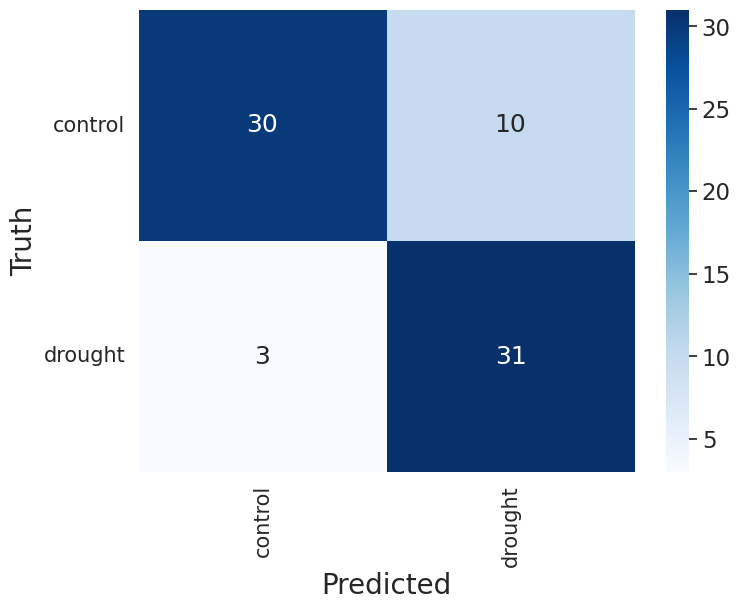

In [ ]:
# -------------------------------
# 7. Evaluate on the test set
# -------------------------------
best_model = rnd_search.best_estimator_
y_test_pred = best_model.predict(X_test)

# Evaluate common metrics on test set
test_accuracy = accuracy_score(y_test, y_test_pred)
test_precision = precision_score(y_test, y_test_pred, pos_label='drought')
test_recall = recall_score(y_test, y_test_pred, pos_label='drought')
test_f1 = f1_score(y_test, y_test_pred, pos_label='drought')

print("\nTest set metrics:")
print("Accuracy:", test_accuracy)
print("Precision:", test_precision)
print("Recall:", test_recall)
print("F1 score:", test_f1)

# -------------------------------
# 8. (Optional) Confusion Matrix
# -------------------------------
unique_labels = np.unique([y_test, y_test_pred])
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_labels),
    index=[f"True_{x}" for x in unique_labels],
    columns=[f"Pred_{x}" for x in unique_labels]
)

unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 18},cmap="Blues")
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)
plt.savefig('confusion_matrix_lr_80.png', dpi=400, bbox_inches='tight')
plt.show()

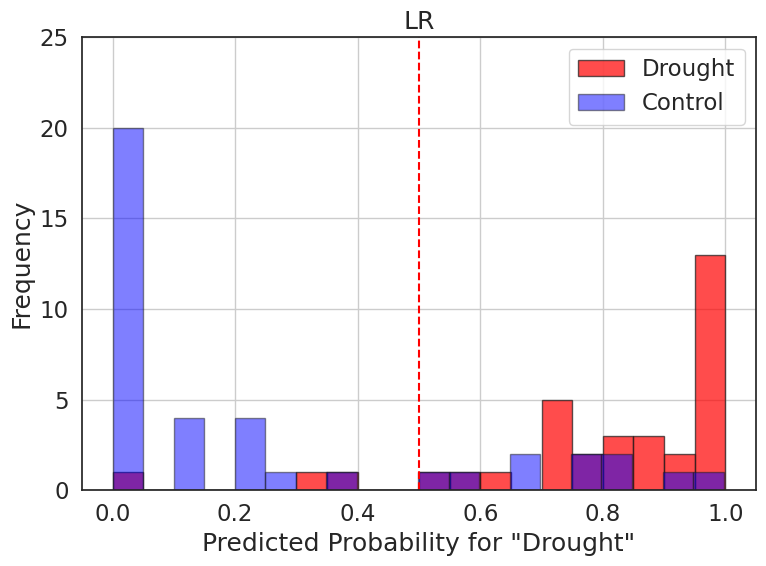

In [ ]:
# Get predicted probabilities for the positive class ("drought")
logreg_model = best_model

# Get predicted probabilities for the positive class ("drought")
probabilities = logreg_model.predict_proba(X_test)[:, 1]

# Separate probabilities based on true labels
drought_probs = probabilities[y_test == 'drought']
control_probs = probabilities[y_test == 'control']

# Plot the histograms with different colors
plt.figure(figsize=(8, 6))
plt.hist(drought_probs, bins=20, edgecolor='k', alpha=0.7, color='#ff0000', label='Drought')
plt.hist(control_probs, bins=20, edgecolor='k', alpha=0.5, color='#0000ff', label='Control')

# Labels & Formatting
plt.xlabel('Predicted Probability for "Drought"')
plt.ylabel('Frequency')
plt.title('LR')
plt.ylim(0, 25)  # Adjusted ylim
# Add a dashed line at 0.5 (Decision Boundary)
plt.axvline(x=0.5, color='red', linestyle='--',)

plt.grid(True)
plt.legend()
plt.tight_layout()
plt.savefig('sigmoid_values_lr_80.png', dpi=400, bbox_inches='tight')
plt.show()

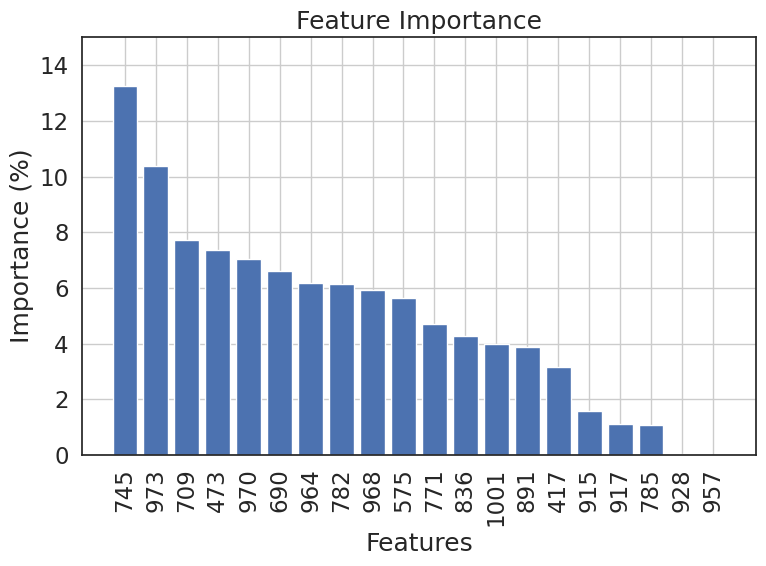

In [ ]:
# Extract the trained Logistic Regression model from the pipeline
logreg_model = rnd_search.best_estimator_[1].fit(X_train,y_train)
# Get the coefficients of the model
coefficients = logreg_model.coef_.flatten()  # Flatten in case of multidimensional array

# Calculate the absolute feature importance
feature_importance = np.abs(coefficients)

# Calculate the percentage of each feature importance
total_importance = np.sum(feature_importance)
percentage_importance = (feature_importance / total_importance) * 100

# Sort the feature importance in descending order
sorted_idx = np.argsort(percentage_importance)[::-1]

# Get the names of the features
feature_names = X_train.columns.to_numpy()

# Plot the feature importance
plt.figure(figsize=(8, 6))
plt.bar(range(len(percentage_importance)), percentage_importance[sorted_idx], align='center')
plt.xticks(range(len(percentage_importance)), feature_names[sorted_idx], rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance (%)')
plt.title('Feature Importance')
plt.ylim(0,15)
plt.grid(True)
plt.tight_layout()
plt.savefig('feature_importance_lr_80.png', dpi=400, bbox_inches='tight')
plt.show()


In [ ]:
# Create a dictionary of feature names and their importance scores
importance_dict = dict(zip(feature_names, percentage_importance))

# Print the dictionary
print(importance_dict)


{'417': np.float64(3.1744103656993548), '473': np.float64(7.348365566974245), '575': np.float64(5.623858677069431), '690': np.float64(6.6084566913802085), '709': np.float64(7.7201643752456155), '745': np.float64(13.258176899803434), '771': np.float64(4.7131111705472595), '782': np.float64(6.1279333565387), '785': np.float64(1.0770563102818511), '836': np.float64(4.281176313681501), '891': np.float64(3.8912955256584087), '915': np.float64(1.567542226200305), '917': np.float64(1.1055274127820873), '928': np.float64(0.02061622150146964), '957': np.float64(0.0), '964': np.float64(6.161556585391822), '968': np.float64(5.909172497733576), '970': np.float64(7.044843233487957), '973': np.float64(10.377023731062533), '1001': np.float64(3.9897128389602425)}


##### Misclassified samples

In [ ]:
# # Get predictions on the test set
# best_model = rnd_search.best_estimator_
# y_test_pred = best_model.predict(X_test)

# Calculate accuracy on the test set
accuracy = accuracy_score(y_test, y_test_pred)
print("Test accuracy: {:.2f}".format(accuracy))

# Find misclassified samples
misclassified_indices = y_test != y_test_pred

# Extract species, dates, and predicted species for misclassified samples
misclassified_species = test_species[misclassified_indices]
misclassified_dates = test_dates[misclassified_indices]

# misclasified seasons
month_to_season = {1: 'winter', 2: 'winter', 3: 'spring', 4: 'spring', 5: 'spring', 6: 'summer', 7: 'summer', 8: 'summer', 9: 'autumn', 10: 'autumn', 11: 'autumn', 12: 'winter'}
misclassified_seasons = pd.to_datetime(misclassified_dates).month
misclassified_seasons = misclassified_seasons.map(month_to_season)

# convert dates to mm-yyyy format from 'numpy.datetime64' object
misclassified_dates = pd.to_datetime(misclassified_dates).strftime('%m-%Y')
# Display misclassified species and dates along with predicted species
print("Misclassified samples:")
for i in range(len(misclassified_species)):
    print(f"Species: {misclassified_species[i]}, Date: {misclassified_dates[i]}, Season: {misclassified_seasons[i]}")

total_misclassified = len(misclassified_species)
print(f"Total misclassified: {total_misclassified}")

Test accuracy: 0.82
Misclassified samples:
Species: oak, Date: 03-2022, Season: spring
Species: cypress, Date: 04-2022, Season: spring
Species: pistacia, Date: 08-2022, Season: summer
Species: carob, Date: 02-2023, Season: winter
Species: pistacia, Date: 01-2023, Season: winter
Species: cypress, Date: 03-2022, Season: spring
Species: pistacia, Date: 08-2022, Season: summer
Species: oak, Date: 05-2022, Season: spring
Species: carob, Date: 04-2022, Season: spring
Species: pine, Date: 08-2022, Season: summer
Species: carob, Date: 08-2022, Season: summer
Species: oak, Date: 08-2022, Season: summer
Species: carob, Date: 08-2022, Season: summer
Total misclassified: 13


<ipython-input-20-de9727d74915>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax2 = sns.countplot(x='Season', data=all_test_df, palette='magma')  # Different palette


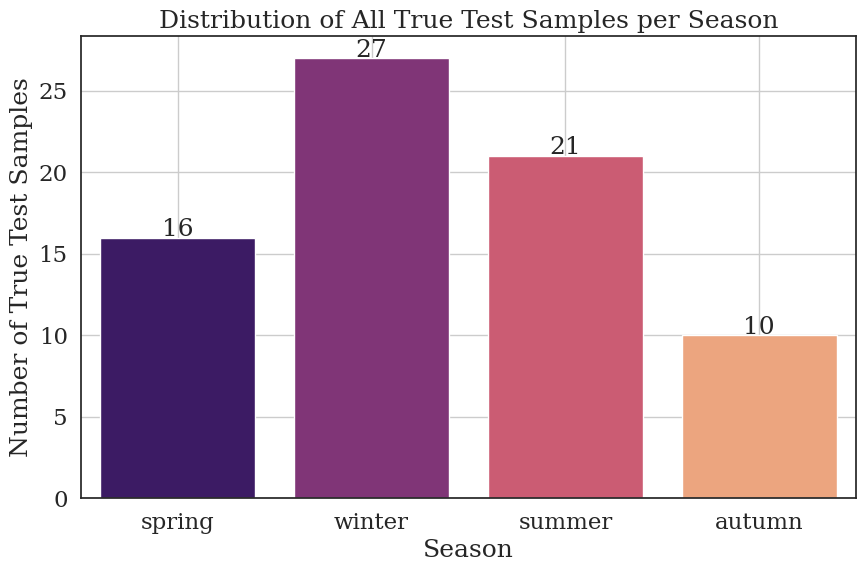

In [ ]:
# Create a DataFrame from the misclassified data
misclassified_df = pd.DataFrame({
    'Species': misclassified_species,
    'Date': misclassified_dates,
    'Season': misclassified_seasons
})

# --- Plot 2: Distribution of All True Test Samples per Season ---
# Create a DataFrame for all test samples based on y_test and test_dates
all_test_df = pd.DataFrame({
    'Species': test_species,  # Or create a generic column
    'Date': test_dates
})

# Determine seasons for all test samples
all_test_df['Season'] = pd.to_datetime(all_test_df['Date']).dt.month.map(month_to_season)

plt.figure(figsize=(10, 6))
ax2 = sns.countplot(x='Season', data=all_test_df, palette='magma')  # Different palette
plt.title('Distribution of All True Test Samples per Season')
plt.xlabel('Season')
plt.ylabel('Number of True Test Samples')
plt.grid(True)

# Add text of value above each bar
for p in ax2.patches:
    height = p.get_height()
    if height > 0:
        ax2.text(p.get_x() + p.get_width()/2.,
                height + 0.1,
                '{:1.0f}'.format(height),
                ha="center")

plt.show()

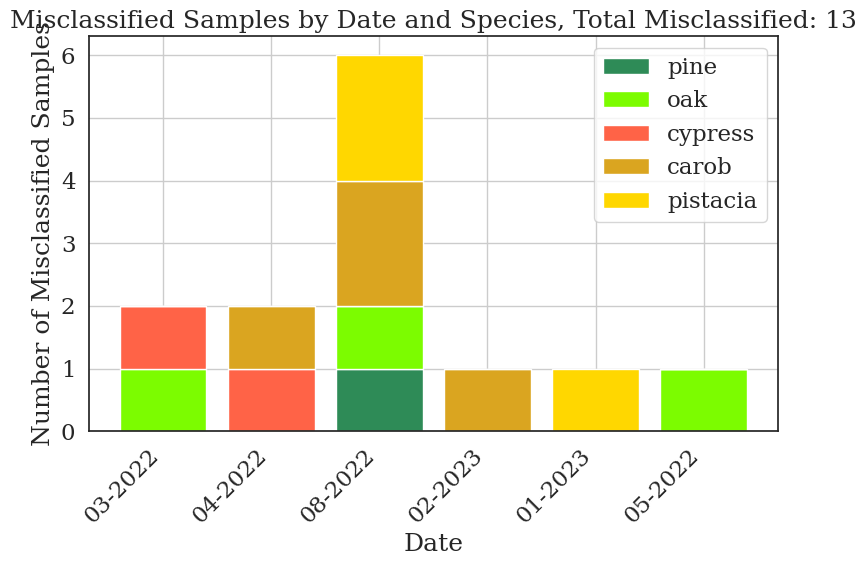

In [ ]:
###### TEST ###########
###### TEST ###########
###### TEST ###########
###### TEST ###########

# Define the species order and colors
species_order = ['pine', 'oak', 'cypress', 'carob', 'pistacia']
species_colors = ['seagreen', 'lawngreen', 'tomato', 'goldenrod', 'gold']

# Group misclassified samples by date and species
misclassified_data = {}
for species, date in zip(misclassified_species, misclassified_dates):
    if date not in misclassified_data:
        misclassified_data[date] = {s: 0 for s in species_order}
    misclassified_data[date][species] += 1

# Prepare data for stacked bar plot
dates = list(misclassified_data.keys())
data_matrix = np.array([[misclassified_data[date][species] for species in species_order] for date in dates])

# Plot the bar graph
plt.figure(figsize=(8, 6))  # Adjust the figure size as needed

# Initialize the bottom for the stacked bars
bottom = np.zeros(len(dates))

# Plot bars for each species
for j, species in enumerate(species_order):
    counts = data_matrix[:, j]
    plt.bar(dates, counts, bottom=bottom, color=species_colors[j], label=species)
    bottom += counts

# Set x-axis labels as dates
plt.xticks(rotation=45, ha='right')

# Set y ticks 1, 2, 3
plt.yticks(np.arange(0, data_matrix.sum(axis=1).max() + 1, 1))
plt.xlabel('Date')
plt.ylabel('Number of Misclassified Samples')
plt.title(f'Misclassified Samples by Date and Species, Total Misclassified: {data_matrix.sum()}')
plt.grid(True)

# Create single legend from species order and colors
plt.legend(species_order, loc='upper right')

plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()


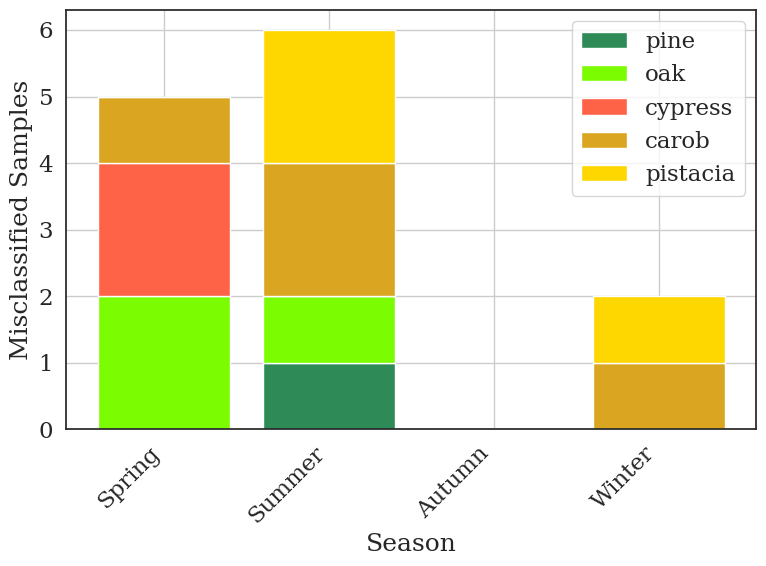

In [ ]:
# Define the species order and colors
species_order = ['pine', 'oak', 'cypress', 'carob', 'pistacia']
species_colors = ['seagreen', 'lawngreen', 'tomato', 'goldenrod', 'gold']

# Define all seasons
all_seasons = ['spring', 'summer', 'autumn', 'winter']

# Group misclassified samples by season and species
misclassified_data_by_season = {season: {s: 0 for s in species_order} for season in all_seasons}
for species, season in zip(misclassified_species, misclassified_seasons):
    misclassified_data_by_season[season][species] += 1

# Prepare data for stacked bar plot by season
data_matrix_season = np.array([[misclassified_data_by_season[season][species] for species in species_order] for season in all_seasons])

# Plot the bar graph
plt.figure(figsize=(8, 6))  # Adjust the figure size as needed

# Initialize the bottom for the stacked bars
bottom = np.zeros(len(all_seasons))

# Plot bars for each species
for j, species in enumerate(species_order):
    counts = data_matrix_season[:, j]
    plt.bar(all_seasons, counts, bottom=bottom, color=species_colors[j], label=species)
    bottom += counts

# Set x-axis labels as seasons
plt.xticks(rotation=45, ha='right')

# Set y ticks 1, 2, 3
plt.yticks(np.arange(0, data_matrix_season.sum(axis=1).max() + 1, 1))
plt.xlabel('Season')
plt.ylabel('Misclassified Samples')
# plt.title(f'Misclassified Samples by Season and Species, Total Misclassified: {data_matrix_season.sum()}')
plt.xticks([0, 1, 2, 3], ['Spring', 'Summer', 'Autumn', 'Winter'], rotation=45, )
plt.grid(True)

# Create single legend from species order and colors
plt.legend(species_order, loc='upper right')

plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()


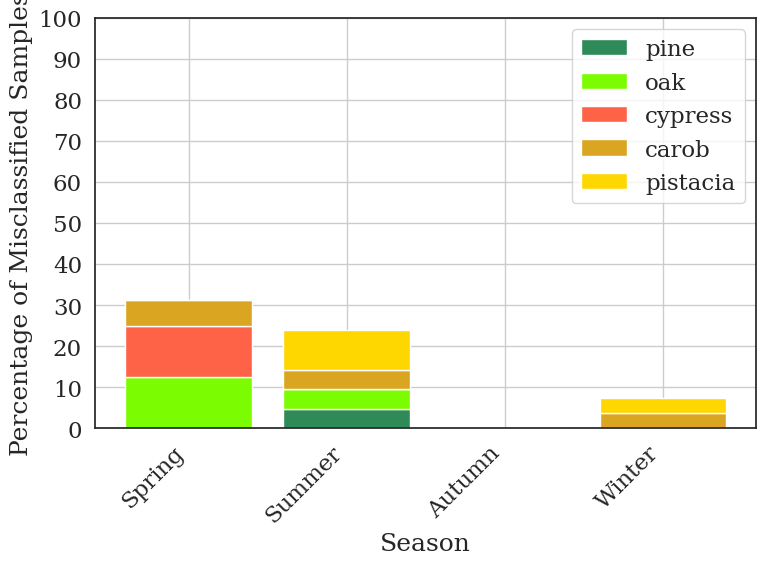

In [ ]:
# --- Season and Species Definitions (unchanged) ---
# Define the species order and colors
species_order = ['pine', 'oak', 'cypress', 'carob', 'pistacia']
species_colors = ['seagreen', 'lawngreen', 'tomato', 'goldenrod', 'gold']

# Define all seasons
all_seasons = ['spring', 'summer', 'autumn', 'winter']

# --- 1. Prepare Misclassified Data (almost unchanged) ---
# Find misclassified samples (assuming y_test and y_test_pred are already defined)
misclassified_indices = y_test != y_test_pred
misclassified_species = test_species[misclassified_indices]
misclassified_dates = test_dates[misclassified_indices]  # Ensure dates are aligned

#Map month to seasons
month_to_season = {1: 'winter', 2: 'winter', 3: 'spring', 4: 'spring', 5: 'spring', 6: 'summer', 7: 'summer', 8: 'summer', 9: 'autumn', 10: 'autumn', 11: 'autumn', 12: 'winter'}
misclassified_seasons = pd.to_datetime(misclassified_dates).month
misclassified_seasons = misclassified_seasons.map(month_to_season)

# Group misclassified samples by season and species
misclassified_data_by_season = {season: {s: 0 for s in species_order} for season in all_seasons}
for species, season in zip(misclassified_species, misclassified_seasons):
    misclassified_data_by_season[season][species] += 1

# --- 2. Calculate Total Samples Per Season in Test Set ---
# Calculate seasons for the *entire* test set
month_to_season = {1: 'winter', 2: 'winter', 3: 'spring', 4: 'spring', 5: 'spring', 6: 'summer', 7: 'summer', 8: 'summer', 9: 'autumn', 10: 'autumn', 11: 'autumn', 12: 'winter'}
all_seasons_test = pd.to_datetime(test_dates).month
all_seasons_test = all_seasons_test.map(month_to_season)

# Count total samples per season in the test set
total_samples_per_season = {season: 0 for season in all_seasons}
for season in all_seasons_test:
    total_samples_per_season[season] += 1

# --- 3. Calculate Relative Misclassification Rates in Percentage ---
# Prepare data for stacked bar plot by season
data_matrix_season = np.array([[misclassified_data_by_season[season][species] for species in species_order] for season in all_seasons])

# Calculate proportions and convert to percentages
proportion_matrix = np.zeros_like(data_matrix_season, dtype=float)
for i, season in enumerate(all_seasons):
    total_in_season = total_samples_per_season[season]
    if total_in_season > 0:  # Avoid division by zero
        proportion_matrix[i, :] = (data_matrix_season[i, :] / total_in_season) * 100  # Multiply by 100 for percentage
    else:
        proportion_matrix[i, :] = 0  # Set proportions to 0 if there are no samples

# --- 4. Plotting (Adjusted for Proportions in Percentage) ---
# Plot the bar graph
plt.figure(figsize=(8, 6))  # Adjust the figure size as needed

# Initialize the bottom for the stacked bars
bottom = np.zeros(len(all_seasons))

# Plot bars for each species
for j, species in enumerate(species_order):
    counts = proportion_matrix[:, j]  # Use proportions instead of raw counts
    plt.bar(all_seasons, counts, bottom=bottom, color=species_colors[j], label=species)
    bottom += counts

# Set x-axis labels as seasons
plt.xticks(rotation=45, ha='right')

# Set y ticks (Adjust y-axis label and ticks to be percentages)
plt.ylabel('Percentage of Misclassified Samples')
plt.yticks(np.arange(0, 101, 10))  # Ticks from 0 to 100 in steps of 10

plt.xlabel('Season')

plt.xticks([0, 1, 2, 3], ['Spring', 'Summer', 'Autumn', 'Winter'], rotation=45, )
plt.grid(True)

# Create single legend from species order and colors
plt.legend(species_order, loc='upper right')

plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

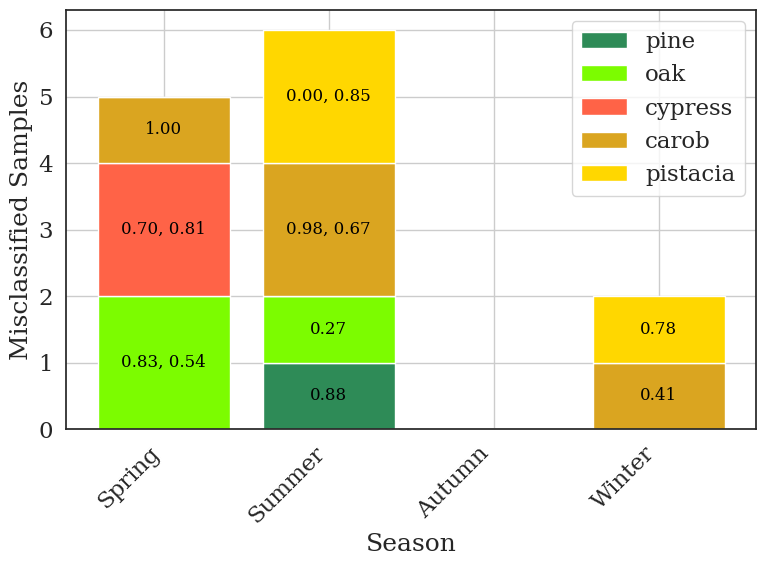

In [ ]:
# Assuming sigmoid_values are the probability values for the misclassified samples
misclassified_probabilities = sigmoid_values[misclassified_indices]

# Group misclassified samples by season and species, with probabilities
misclassified_data_with_probs = {season: {s: [] for s in species_order} for season in all_seasons}
for species, season, prob in zip(misclassified_species, misclassified_seasons, misclassified_probabilities):
    misclassified_data_with_probs[season][species].append(prob)

# Prepare the figure
plt.figure(figsize=(8, 6))

# Initialize the bottom for the stacked bars
bottom = np.zeros(len(all_seasons))

# Plot bars for each species with probability values as text
for j, species in enumerate(species_order):
    counts = [len(misclassified_data_with_probs[season][species]) for season in all_seasons]

    # Plot bars
    plt.bar(all_seasons, counts, bottom=bottom, color=species_colors[j], label=species)

    # Annotate with the probability values
    for i in range(len(all_seasons)):
        if counts[i] > 0:
            prob_text = ', '.join(f"{prob:.2f}" for prob in misclassified_data_with_probs[all_seasons[i]][species])
            plt.text(i, bottom[i] + counts[i]/2, prob_text, ha='center', va='center', color='black', fontsize=12, )

    bottom += counts

# Set x-axis labels as seasons
plt.xticks([0, 1, 2, 3], ['Spring', 'Summer', 'Autumn', 'Winter'], rotation=45, ha='right')

plt.xlabel('Season')
plt.ylabel('Misclassified Samples')
plt.grid(True)

# Create single legend from species order and colors
plt.legend(species_order, loc='upper right')

plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.savefig('misclassified_samples_lr_80.png', dpi=400, bbox_inches='tight')
plt.show()

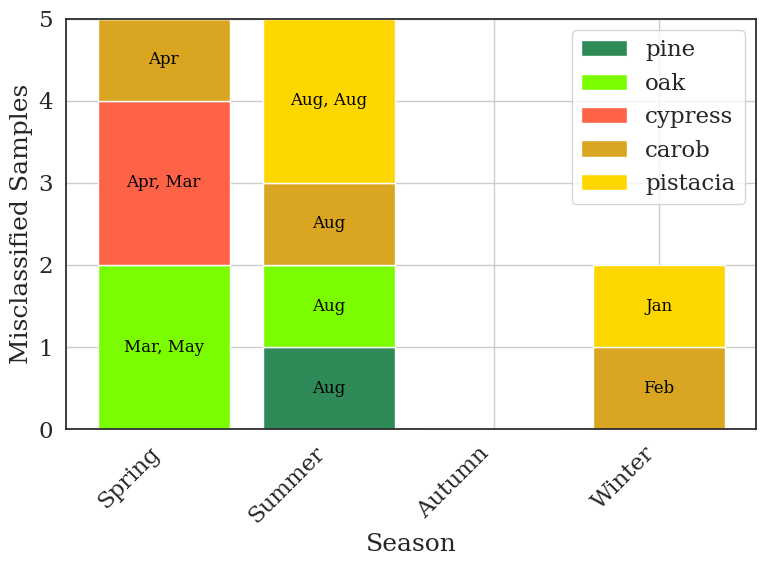

In [ ]:
# Convert misclassified dates to month format (abbreviated month name)
misclassified_months = pd.to_datetime(misclassified_dates).strftime('%b')

# Group misclassified samples by season and species, with months
misclassified_data_with_months = {season: {s: [] for s in species_order} for season in all_seasons}
for species, season, month in zip(misclassified_species, misclassified_seasons, misclassified_months):
    misclassified_data_with_months[season][species].append(month)

# Prepare the figure
plt.figure(figsize=(8, 6))

# Initialize the bottom for the stacked bars
bottom = np.zeros(len(all_seasons))

# Plot bars for each species with month labels as text
for j, species in enumerate(species_order):
    counts = [len(misclassified_data_with_months[season][species]) for season in all_seasons]

    # Plot bars
    plt.bar(all_seasons, counts, bottom=bottom, color=species_colors[j], label=species)

    # Annotate with the month labels as text
    for i in range(len(all_seasons)):
        if counts[i] > 0:
            months_text = ', '.join(misclassified_data_with_months[all_seasons[i]][species])
            plt.text(i, bottom[i] + counts[i]/2, months_text, ha='center', va='center', color='black', fontsize=12, )

    bottom += counts

# Set x-axis labels as seasons
plt.xticks([0, 1, 2, 3], ['Spring', 'Summer', 'Autumn', 'Winter'], rotation=45, ha='right')

plt.xlabel('Season')
plt.ylabel('Misclassified Samples')
plt.grid(True)

# Create single legend from species order and colors
plt.legend(species_order, loc='upper right')

plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.savefig('misclassified_samples_lr_80_month.png', dpi=400, bbox_inches='tight')
plt.show()

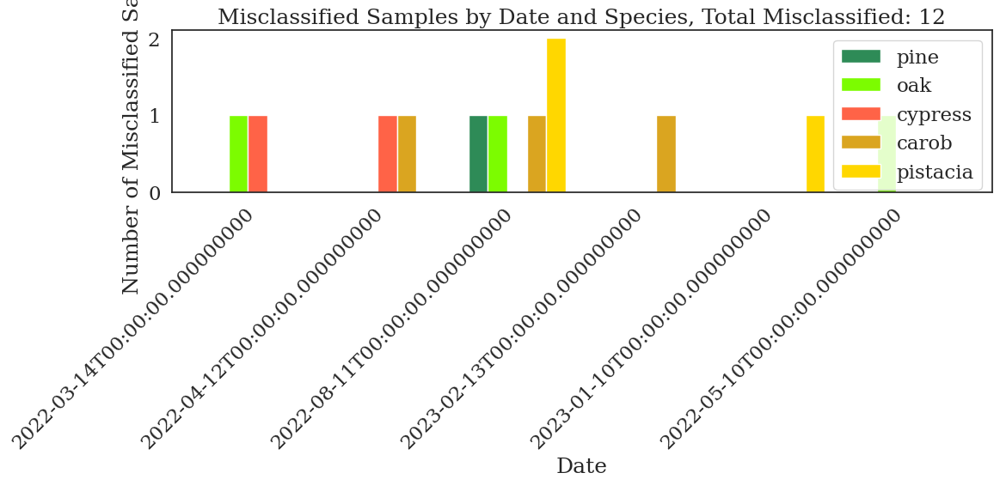

In [ ]:
# Define the species order and colors
species_order = ['pine', 'oak', 'cypress', 'carob', 'pistacia']
species_colors = ['seagreen', 'lawngreen', 'tomato', 'goldenrod', 'gold']

# Group misclassified samples by date and species
misclassified_data = {}
for species, date in zip(misclassified_species, misclassified_dates):
    if date not in misclassified_data:
        misclassified_data[date] = {s: 0 for s in species_order}
    misclassified_data[date][species] += 1

# Plot the bar graph
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
bar_width = 0.15
index = np.arange(len(misclassified_data))  # Index for x-axis

# Plot bars for each date and species
for j, species in enumerate(species_order):
    counts = [misclassified_data[date][species] if species in misclassified_data[date] else 0 for date in misclassified_data]
    plt.bar(index + j * bar_width, counts, bar_width, color=species_colors[j], label=species)

# Set x-axis labels as dates
plt.xticks(index + bar_width * 2, misclassified_data.keys(), rotation=45, ha='right')

# set y ticks 1,2,3
plt.yticks(np.arange(0, max([max(species_counts.values()) for species_counts in misclassified_data.values()]) + 1, 1))
plt.xlabel('Date')
plt.ylabel('Number of Misclassified Samples')
plt.title(f'Misclassified Samples by Date and Species, Total Misclassified: {total_misclassified}')

# Create single legend from species order and colors
plt.legend(species_order, loc='upper right')

plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

Analize the samples that the model predict as Control but were drought

In [ ]:
# Find misclassified false positive samples
false_positive_indices = (y_test_pred == 'control') & (y_test == 'drought')

# Extract species and dates for false positive samples
false_positive_species = test_species[false_positive_indices]
false_positive_dates = test_dates[false_positive_indices]

# convert dates to yyyy-mm format
false_positive_dates = pd.to_datetime(false_positive_dates).strftime('%m-%Y')

# False positive season
false_positive_seasons = pd.to_datetime(false_positive_dates).month
false_positive_seasons = false_positive_seasons.map(month_to_season)

# Display false positive species and dates
for species, date, season in zip(false_positive_species, false_positive_dates, false_positive_seasons):
    print(f"Species: {species}, Date: {date}, Season: {season}")

Species: pistacia, Date: 08-2022, Season: summer
Species: carob, Date: 02-2023, Season: winter
Species: oak, Date: 08-2022, Season: summer


<ipython-input-43-9cc1dbf160ab>:12: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  false_positive_seasons = pd.to_datetime(false_positive_dates).month


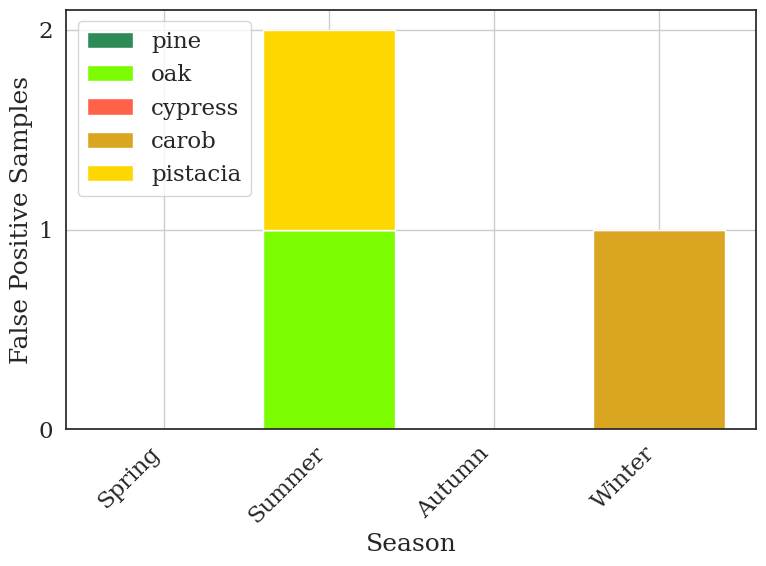

In [ ]:
# Group false positive samples by season and species
false_positive_data_by_season = {season: {s: 0 for s in species_order} for season in all_seasons}
for species, season in zip(false_positive_species, false_positive_seasons):
    false_positive_data_by_season[season][species] += 1

# Prepare data for stacked bar plot by season
data_matrix_false_positive = np.array([[false_positive_data_by_season[season][species] for species in species_order] for season in all_seasons])

# Plot the bar graph for false positives
plt.figure(figsize=(8, 6))  # Adjust the figure size as needed

# Initialize the bottom for the stacked bars
bottom = np.zeros(len(all_seasons))

# Plot bars for each species
for j, species in enumerate(species_order):
    counts = data_matrix_false_positive[:, j]
    plt.bar(all_seasons, counts, bottom=bottom, color=species_colors[j], label=species)
    bottom += counts

# Set x-axis labels as seasons
plt.xticks(rotation=45, ha='right')

# Set y ticks 1, 2, 3
plt.yticks(np.arange(0, data_matrix_false_positive.sum(axis=1).max() + 1, 1))
plt.xlabel('Season')
plt.ylabel('False Positive Samples')
# plt.title(f'False Positive Samples by Season and Species')
plt.xticks([0, 1, 2, 3], ['Spring', 'Summer', 'Autumn', 'Winter'], rotation=45, )
plt.grid(True)

# Create single legend from species order and colors
plt.legend(species_order, loc='upper left')

plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

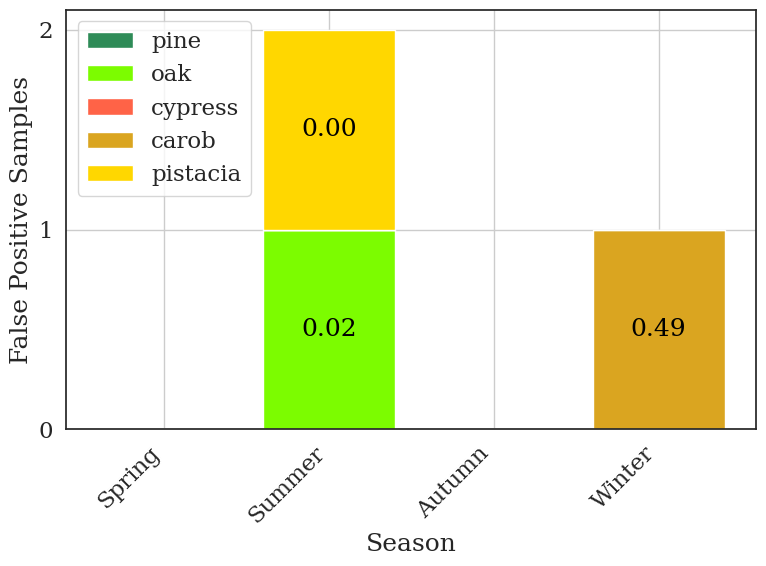

In [ ]:
# Assuming you have `false_positive_indices`, `species_order`, `species_colors`, `false_positive_seasons`, and `false_positive_dates`

# Get the decision function scores and apply the sigmoid function to obtain probabilities
false_positive_decision_scores = logreg_model.decision_function(X_test[false_positive_indices])
false_positive_probabilities = 1 / (1 + np.exp(-false_positive_decision_scores))

# Prepare data for bar plot by season with probabilities
false_positive_data_with_probs = {season: {s: [] for s in species_order} for season in all_seasons}
for species, season, prob in zip(false_positive_species, false_positive_seasons, false_positive_probabilities):
    false_positive_data_with_probs[season][species].append(prob)

# Prepare the figure
plt.figure(figsize=(8, 6))

# Initialize the bottom for the stacked bars
bottom = np.zeros(len(all_seasons))

# Plot bars for each species with probability values
for j, species in enumerate(species_order):
    species_probs = [np.mean(false_positive_data_with_probs[season][species]) if false_positive_data_with_probs[season][species] else 0 for season in all_seasons]
    counts = [len(false_positive_data_with_probs[season][species]) for season in all_seasons]

    # Plot bars
    plt.bar(all_seasons, counts, bottom=bottom, color=species_colors[j], label=species)

    # Annotate with the probability value
    for i in range(len(all_seasons)):
        if counts[i] > 0:
            plt.text(i, bottom[i] + counts[i]/2, f'{species_probs[i]:.2f}', ha='center', va='center', color='black', fontsize=18, )

    bottom += counts

# Set x-axis labels as seasons
plt.xticks([0, 1, 2, 3], ['Spring', 'Summer', 'Autumn', 'Winter'], rotation=45, ha='right')
# Sey y ticks only at 0,1,2
plt.yticks(np.arange(0, data_matrix_false_positive.sum(axis=1).max() + 1, 1))
plt.xlabel('Season')
plt.ylabel('False Positive Samples')
plt.grid(True)

# Create single legend from species order and colors
plt.legend(species_order, loc='upper left')

plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

<ipython-input-46-e94a3abe826b>:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  false_positive_months = pd.to_datetime(false_positive_dates).strftime('%b')


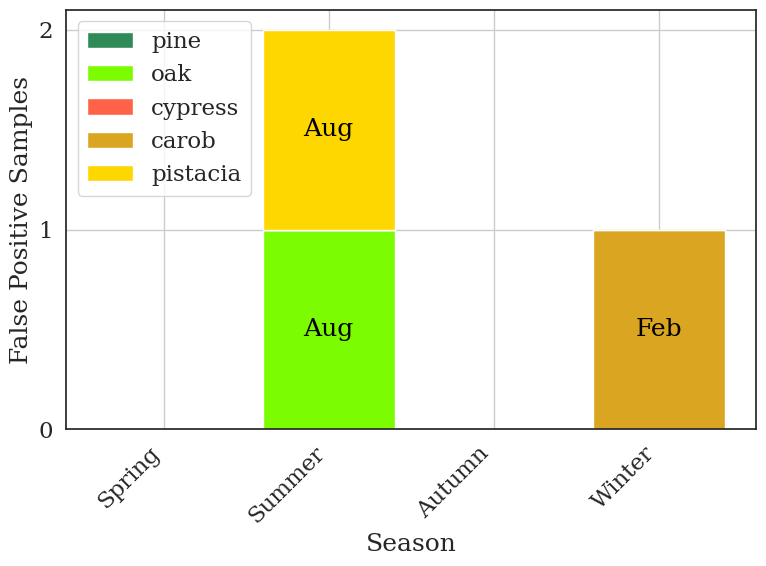

In [ ]:
# Convert false positive dates to month format (abbreviated month name)
false_positive_months = pd.to_datetime(false_positive_dates).strftime('%b')

# Prepare data for bar plot by season with months
false_positive_data_with_months = {season: {s: [] for s in species_order} for season in all_seasons}
for species, season, month in zip(false_positive_species, false_positive_seasons, false_positive_months):
    false_positive_data_with_months[season][species].append(month)

# Prepare the figure
plt.figure(figsize=(8, 6))

# Initialize the bottom for the stacked bars
bottom = np.zeros(len(all_seasons))

# Plot bars for each species with month labels as text
for j, species in enumerate(species_order):
    counts = [len(false_positive_data_with_months[season][species]) for season in all_seasons]

    # Plot bars
    plt.bar(all_seasons, counts, bottom=bottom, color=species_colors[j], label=species)

    # Annotate with the month labels as text
    for i in range(len(all_seasons)):
        if counts[i] > 0:
            months_text = ', '.join(false_positive_data_with_months[all_seasons[i]][species])
            plt.text(i, bottom[i] + counts[i]/2, months_text, ha='center', va='center', color='black', fontsize=18, )

    bottom += counts

# Set x-axis labels as seasons
plt.xticks([0, 1, 2, 3], ['Spring', 'Summer', 'Autumn', 'Winter'], rotation=45, ha='right')
# Sey y ticks only at 0,1,2
plt.yticks(np.arange(0, data_matrix_false_positive.sum(axis=1).max() + 1, 1))
plt.xlabel('Season')
plt.ylabel('False Positive Samples')
plt.grid(True)

# Create single legend from species order and colors
plt.legend(species_order, loc='upper left')

plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

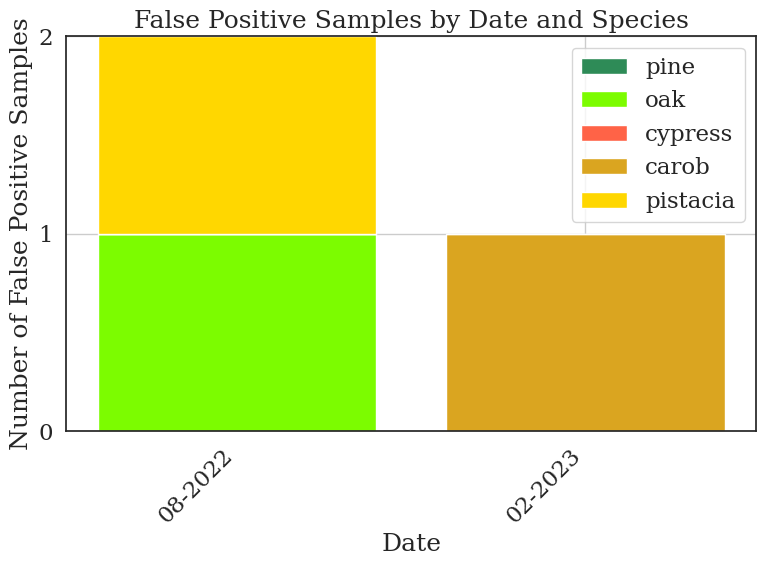

In [ ]:
# Group false positive samples by date and species
false_positive_data = {}
for species, date in zip(false_positive_species, false_positive_dates):
    if date not in false_positive_data:
        false_positive_data[date] = {s: 0 for s in species_order}
    false_positive_data[date][species] += 1

# Prepare data for stacked bar plot
dates = list(false_positive_data.keys())
data_matrix = np.array([[false_positive_data[date][species] for species in species_order] for date in dates])

# Plot the bar graph
plt.figure(figsize=(8, 6))  # Adjust the figure size as needed

# Initialize the bottom for the stacked bars
bottom = np.zeros(len(dates))

# Plot bars for each species
for j, species in enumerate(species_order):
    counts = data_matrix[:, j]
    plt.bar(dates, counts, bottom=bottom, color=species_colors[j], label=species)
    bottom += counts

# Set x-axis labels as dates
plt.xticks(rotation=45, ha='right')

# Set y ticks 1, 2, 3
plt.yticks(np.arange(0, data_matrix.sum(axis=1).max() + 1, 1))
plt.xlabel('Date')
plt.ylabel('Number of False Positive Samples')
plt.title('False Positive Samples by Date and Species')
plt.ylim(0, 2)  # Set y-axis limit to 2

# Create single legend from species order and colors
plt.legend(species_order, loc='upper right')

plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.grid()
plt.show()

In [ ]:
# ids of misclassified samples
misclassified_ids = ids_test[false_positive_indices]

misclassified_ids, false_positive_dates

(104    Csi4
 235    Csi6
 112    Csi4
 Name: ID, dtype: object,
 Index(['08-2022', '02-2023', '08-2022'], dtype='object'))

In [ ]:
from plotly import graph_objects as go

# Rename and reshape dataframe
cmtx = cmtx.rename_axis(index='Actual', columns='Predicted')
cmtx = cmtx.set_axis([f'Actual {s}' for s in cmtx.columns], axis=0)
cmtx = cmtx.set_axis([f'Predicted {s}' for s in cmtx.columns], axis=1)
node_labels = cmtx.index.tolist() + cmtx.columns.tolist()
node_labels_inds = {label: ind for ind, label in enumerate(node_labels)}
cmtx = cmtx.stack().reset_index().rename(columns={0: 'samples', 'level_0': 'actual', 'level_1': 'predicted'})

# Normalize confusion matrix
cmn = np.around(confusion_matrix(y_test, y_test_pred, labels=unique_label) / cm.sum(axis=1)[:, np.newaxis], 2)
cmtx['norm_samples'] = cmn.ravel()

# Define colors
incorrect_red, correct_green = "rgba(205, 92, 92, 0.8)", "rgba(144, 238, 144, 0.8)"

# Apply color and hover text
def new_columns(row):
    source_1, target_1 = ''.join(row.actual.split()[1:]), ''.join(row.predicted.split()[1:])
    row['color'] = correct_green if source_1 == target_1 else incorrect_red
    row['link_hover_text'] = f"{row.samples} ({row.norm_samples:.0%}) {source_1} samples {'correctly' if source_1 == target_1 else 'incorrectly'} classified as {target_1}"
    return row

cmtx = cmtx.apply(new_columns, axis=1).replace({'actual': node_labels_inds, 'predicted': node_labels_inds})

# Create Sankey diagram
# Create Sankey diagram
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=20,
        thickness=30,
        line=dict(color="gray", width=0.5),
        label=node_labels,
        color="lightgrey",
        hovertemplate="%{label}<extra></extra>"
    ),
    link=dict(
        source=cmtx.actual,
        target=cmtx.predicted,
        value=cmtx.samples,
        color=cmtx.color,
        customdata=cmtx['link_hover_text'],
        hovertemplate="%{customdata}<extra></extra>"
    )
)])

fig.update_layout(
    title={'text': 'Confusion Matrix Sankey Diagram', 'x': 0.5},
    font=dict(size=14),
    width=800,
    height=600,
    plot_bgcolor='white'
)

fig.show()

/usr/local/lib/python3.11/dist-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


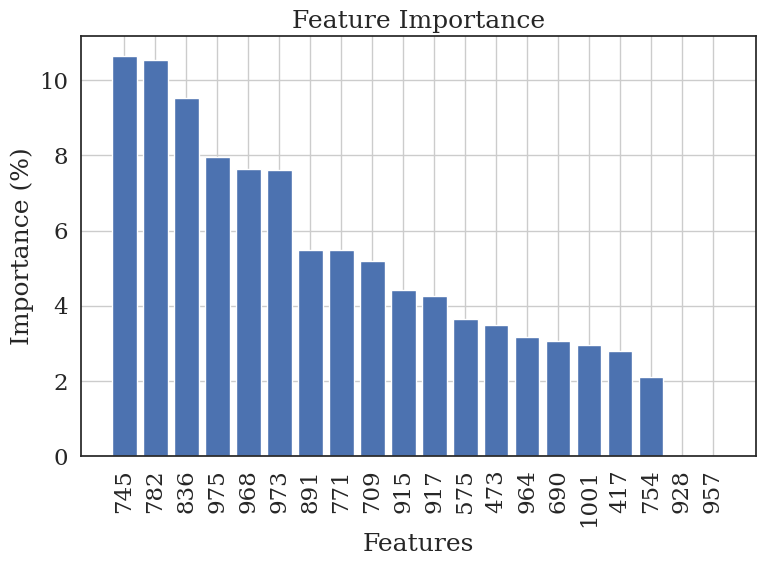

#### SVM - Best Bands

In [ ]:
param_distribs = {
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'shrinking': [False, True],
    'C': reciprocal(1, 1000),
    'coef0': expon(scale=1.0),
    'gamma': expon(scale=1.0),
    'degree': [1, 2, 3, 4, 5, 6, 7, 8],
    'tol': expon(scale=1e-4)
}

svm_clf = SVC()
rnd_search = RandomizedSearchCV(svm_clf, param_distributions=param_distribs,
                                n_iter=50, cv=3, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=False, tol=2.0799307999138624e-06; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=False, tol=2.0799307999138624e-06; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821

In [ ]:
# Create the SVC model with the best parameters from the randomized search
svc = SVC(**rnd_search.best_params_)

# Fit the model to the training data
svc.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(svc, X_train, y_train, cv=3)

# Calculate recall, precision, and F1 score
accuracy = accuracy_score(y_train, y_train_pred)
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')

# Print the results
print("Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

TypeError: SVC.__init__() got an unexpected keyword argument 'logreg__C'

Test: Accuracy: 0.6621621621621622
Test: Precision: 0.6097560975609756 
Test: Recall: 0.7352941176470589 
Test: F1 Score: 0.6666666666666666


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

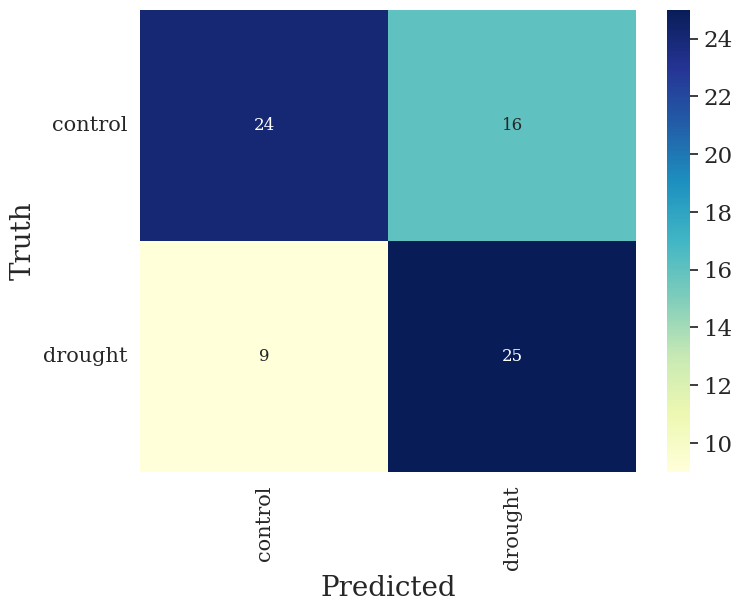

In [ ]:
y_test_pred = svc.predict(X_test)

# print matrix
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Precision:",precision_score(y_test, y_test_pred, pos_label='drought')
      ,"\nTest: Recall:",recall_score(y_test, y_test_pred, pos_label='drought')
      ,"\nTest: F1 Score:",f1_score(y_test, y_test_pred, pos_label='drought'))

###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 12},cmap="YlGnBu")
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


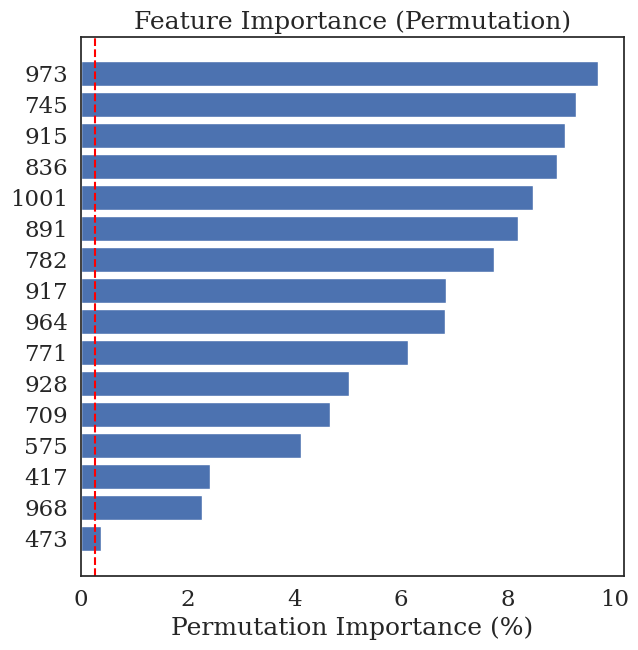

In [ ]:
# Use permutation importance to calculate feature importance
result = permutation_importance(svc, X_train, y_train, n_repeats=10, random_state=42, n_jobs=-1)

# Get feature importance scores and normalize them to percentages
importance = result.importances_mean

# normalize to precentages
importance = (importance / np.sum(importance))*100


# Plot feature importance
sorted_idx = importance.argsort()
fig, ax = plt.subplots(figsize=(7, 7))
plt.barh(X_train.columns[sorted_idx], importance[sorted_idx])
# Add verical line at X = 2.5%
plt.axvline(x=0.25, color='red', linestyle='--')
plt.xlabel("Permutation Importance (%)")
plt.title("Feature Importance (Permutation)")
plt.show()

#### RF - Best Bands

In [ ]:
param_distribs = {
'n_estimators':[int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)],
'criterion': ['gini', 'entropy'],
'max_depth': [int(x) for x in np.linspace(10, 110, num = 11)],
'min_samples_split': [2, 5, 10],
'min_samples_leaf': [1, 2, 4],
'max_features': ['auto', 'sqrt'],
}

rf_clf = RandomForestClassifier(random_state=42)
rnd_search = RandomizedSearchCV(rf_clf, param_distributions=param_distribs,
n_iter=50, cv=3, scoring='accuracy',
verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   3.6s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   3.7s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   5.3s
[CV] END criterion=gini, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.6s
[CV] END criterion=gini, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   4.8s
[CV] END criterion=gini, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   6.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1400; total time=   7.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1400; total time=   9.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1400; total time=   6.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1200; total time=   6.5s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1200; total time=   7.5s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1200; total time=  10.3s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   6.7s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   9.6s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   4.8s
[CV] END criterion=entropy, max_depth=7

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   6.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=  10.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   7.9s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   3.7s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   7.0s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   2.8s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   4.1s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   9.3s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   6.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=  10.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=  12.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=  10.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=  13.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   8.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   8.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   7.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   8.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   7.6s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   4.9s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   3.6s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   3.0s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   1.4s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   1.3s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   2.3s
[CV] END criterion=entropy, 

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   4.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   4.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.6s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   2.5s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   2.4s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   3.8s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.9s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.3s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   3.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   0.7s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   0.7s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   0.7s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   2.9s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   4.4s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   3.6s
[CV] END criterion=entropy, max_d

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1800; total time=   3.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1800; total time=   4.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1800; total time=   4.9s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.1s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.0s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.1s
[CV] END criterion=gini, max_depth=

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=400; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=400; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=400; total time=   0.8s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   2.9s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   3.3s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   4.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=400; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=400; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=400; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   3.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   3.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   5.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=   1.8s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.0s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.1s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.0s
[CV] END criterion=entropy, max_

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=800; total time=   2.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=800; total time=   2.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=800; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   3.1s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   4.7s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   3.3s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1600; total time=   2.7s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1600; total time=   2.5s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1600; total time=   2.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1000; total time=   2.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1000; total time=   2.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1000; total time=   1.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.3s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.7s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   5.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   3.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   3.7s
Best parameters: {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 50, 'criterion': 'entropy'}
Best cross-validation score: 0.62


In [ ]:
# Create the Random Forest model with the best parameters from the randomized search
rf = RandomForestClassifier(**rnd_search.best_params_, random_state=42)

# Fit the model to the training data
rf.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(rf, X_train, y_train, cv=5)

# Calculate recall, precision, and F1 score
# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')

print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Recall: 0.6896551724137931
Precision: 0.6521739130434783
F1 Score: 0.670391061452514


Test: Accuracy: 0.581081081081081
Test: Precision: 0.7238095238095238
Test: Recall: 0.8735632183908046
Test: f1: 0.5230769230769231


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

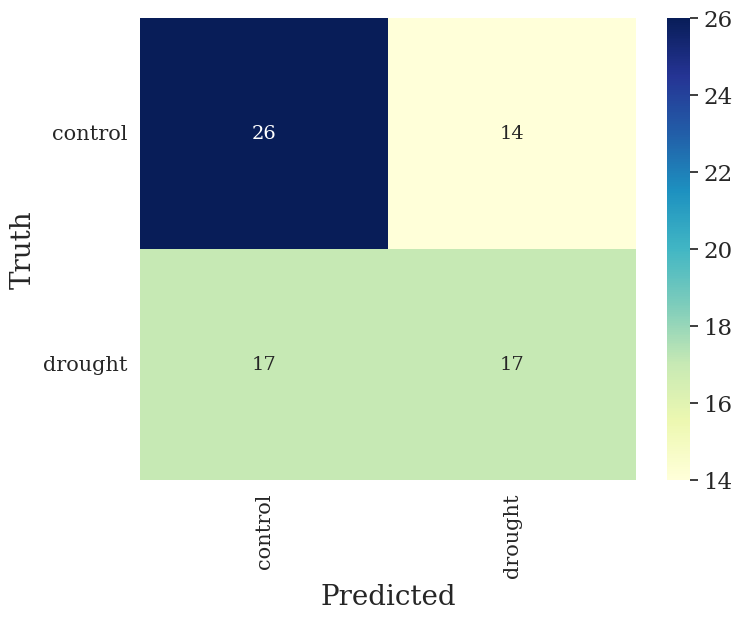

In [ ]:
y_test_pred = rf.predict(X_test)

# Print metrics
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Precision:",precision_score(y_train, y_train_pred, pos_label='drought'))
print("Test: Recall:",recall_score(y_train, y_train_pred, pos_label='drought'))
print("Test: f1:",f1_score(y_test, y_test_pred,pos_label='drought'))

# Confusion matrix
# Labels for confusion matrix:
unique_label = np.unique([y_test, y_test_pred])

# Create confusion matrix dataframe:
cmtx = pd.DataFrame(
confusion_matrix(y_test, y_test_pred, labels=unique_label),
index=[x for x in unique_label],
columns=[x for x in unique_label])
plt.figure(figsize=(8, 6))
sns.heatmap(cmtx, annot=True, fmt='d', annot_kws={"size": 14}, cmap="YlGnBu")
plt.xlabel('Predicted', fontsize=20)
plt.ylabel('Truth', fontsize=20)
plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15, rotation=0)

### SVM

In [ ]:
df_bands = df[df.columns[:-7]]

# Define features and labels
X = df_bands

# Encode "English_name"
label_encoder = LabelEncoder()
X["English_name_encoded"] = label_encoder.fit_transform(df["English_name"])
X['spectral_date'] = df['spectral_date'].values
X['English_name'] = df['English_name'].values
X['ID'] = df['ID'].values

# Print the mapping of the encoded values
english_name_mapping = dict(zip(label_encoder.transform(label_encoder.classes_),label_encoder.classes_))

y = df['treatment']

# Split to train-test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# save date of test set for research later
dates_test = X_test['spectral_date']
ids_test = X_test['ID']

# drop from sets
X_train,X_test = X_train.drop(['English_name','spectral_date', 'ID'],axis=1),X_test.drop(['English_name','spectral_date', 'ID'],axis=1)

X_train.shape,X_test.shape

((172, 275), (74, 275))

In [ ]:
param_distribs = {
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'shrinking': [False, True],
    'C': reciprocal(1, 1000),
    'coef0': expon(scale=1.0),
    'gamma': expon(scale=1.0),
    'degree': [1, 2, 3, 4, 5, 6, 7, 8],
    'tol': expon(scale=1e-4)
}

svm_clf = SVC()
rnd_search = RandomizedSearchCV(svm_clf, param_distributions=param_distribs,
                                n_iter=50, cv=3, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.1s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.1s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=False, tol=2.0799307999138624e-06; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=False, tol=2.0799307999138624e-06; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821

In [ ]:
best = {'C': 702.5166339242153, 'coef0': 3.3706303424611725, 'degree': 2, 'gamma': 0.4868104805084566, 'kernel': 'poly', 'shrinking': False, 'tol': 2.625262508953778e-05}

# Create the SVC model with the best parameters from the randomized search
svc = SVC(**best)

# Fit the model to the training data
svc.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(svc, X_train, y_train, cv=3)

# Calculate recall, precision, and F1 score
accuracy = accuracy_score(y_train, y_train_pred)
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')

# Print the results
print("Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Accuracy: 0.877906976744186
Recall: 0.9080459770114943
Precision: 0.8586956521739131
F1 Score: 0.88268156424581


Test: Accuracy: 0.8108108108108109
Test: Recall: 0.8529411764705882
Test: Precision: 0.7631578947368421
Test: F1 Score: 0.8055555555555556


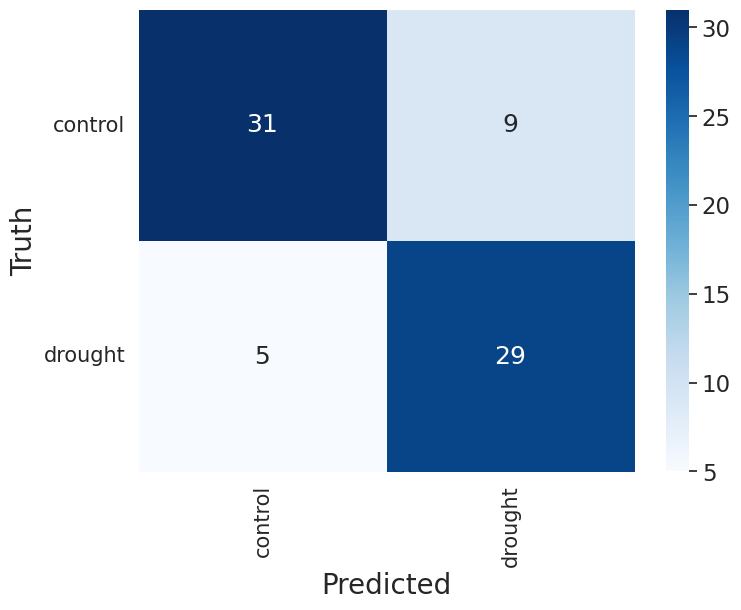

In [ ]:
y_test_pred = svc.predict(X_test)

# print matrix
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred, pos_label='drought'))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred, pos_label='drought'))
print("Test: F1 Score:",metrics.f1_score(y_test, y_test_pred, pos_label='drought'))

###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 18},cmap="Blues")
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)
plt.savefig('confusion_matrix_svm.png', dpi=400, bbox_inches='tight')
plt.show()

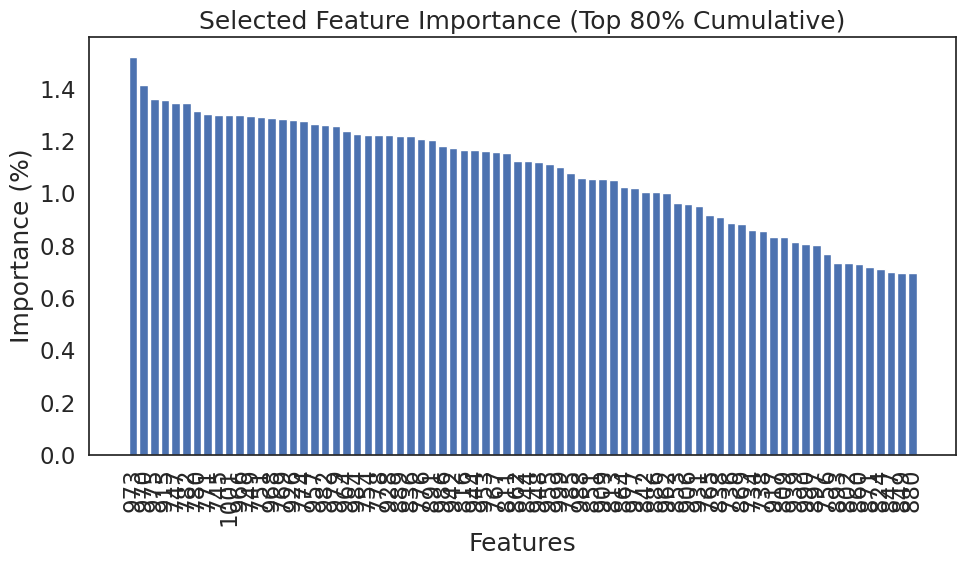

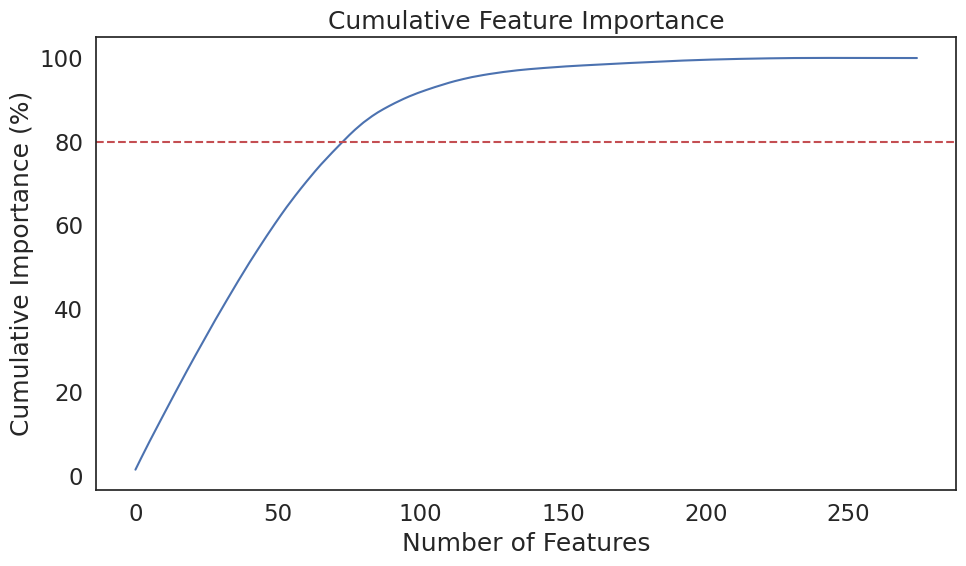

Selected Features Covering 80% Cumulative Importance:
973: 1.52%
970: 1.41%
975: 1.36%
915: 1.36%
747: 1.35%
782: 1.35%
780: 1.32%
771: 1.30%
745: 1.30%
1001: 1.30%
966: 1.30%
749: 1.30%
751: 1.29%
968: 1.29%
769: 1.29%
926: 1.28%
774: 1.28%
957: 1.27%
982: 1.26%
979: 1.26%
964: 1.24%
984: 1.23%
754: 1.22%
778: 1.22%
928: 1.22%
889: 1.22%
836: 1.22%
776: 1.21%
891: 1.20%
986: 1.18%
942: 1.17%
816: 1.16%
944: 1.16%
953: 1.16%
767: 1.16%
811: 1.16%
862: 1.13%
844: 1.12%
948: 1.12%
955: 1.11%
999: 1.10%
785: 1.08%
988: 1.06%
851: 1.06%
909: 1.05%
813: 1.05%
864: 1.03%
977: 1.02%
842: 1.01%
886: 1.00%
962: 1.00%
853: 0.96%
906: 0.96%
931: 0.95%
765: 0.92%
838: 0.91%
736: 0.89%
869: 0.88%
734: 0.86%
738: 0.86%
917: 0.83%
809: 0.83%
939: 0.81%
990: 0.81%
897: 0.80%
756: 0.77%
893: 0.73%
802: 0.73%
860: 0.73%
871: 0.72%
824: 0.71%
847: 0.70%
849: 0.70%
880: 0.70%


In [ ]:
X_percent = 80  # % of features to select

# Calculate permutation importance
perm_importance = permutation_importance(svc, X_train, y_train, n_repeats=10, random_state=42)

# Get the importance and sort it in descending order
feature_importance = perm_importance.importances_mean
sorted_idx = np.argsort(feature_importance)[::-1]
sorted_feature_importance = feature_importance[sorted_idx]

# Calculate the cumulative sum of the sorted feature importance
total_importance = np.sum(sorted_feature_importance)
percentage_importance = (sorted_feature_importance / total_importance) * 100
cumulative_importance = np.cumsum(percentage_importance)

# Get the names of the features
feature_names = X_train.columns

# Find the index where cumulative importance exceeds the threshold
num_features = np.argmax(cumulative_importance >= X_percent) + 1

# Select features up to that index
selected_features_idx = sorted_idx[:num_features]
selected_features = feature_names[selected_features_idx]
selected_importance = percentage_importance[:num_features]

# Plot the selected feature importance
plt.figure(figsize=(10, 6))
plt.bar(range(len(selected_importance)), selected_importance, align='center')
plt.xticks(range(len(selected_importance)), selected_features, rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance (%)')
plt.title(f'Selected Feature Importance (Top {X_percent}% Cumulative)')
plt.tight_layout()
plt.show()

# Plot the cumulative feature importance
plt.figure(figsize=(10, 6))
plt.plot(range(len(cumulative_importance)), cumulative_importance)
plt.axhline(y=X_percent, color='r', linestyle='--')
plt.xlabel('Number of Features')
plt.ylabel('Cumulative Importance (%)')
plt.title('Cumulative Feature Importance')
plt.tight_layout()
plt.show()

# Print the selected features and their importance
print(f"Selected Features Covering {X_percent}% Cumulative Importance:")
for feature, importance in zip(selected_features, selected_importance):
    print(f"{feature}: {importance:.2f}%")

In [ ]:
x_new_svm = X[selected_features]

# Convert column names to numeric values (wavelengths)
wavelengths = np.array([float(col) for col in x_new_svm.columns])

# Sort the columns based on wavelengths
sorted_indices = np.argsort(wavelengths)
sorted_wavelengths = wavelengths[sorted_indices]
sorted_features = x_new_svm.columns[sorted_indices]
sorted_importance = selected_importance[sorted_indices]

# Initialize a list to keep track of selected features
final_selected_features = []
final_selected_importance = []

# Iterate through the sorted features and keep the most important one within each 15 nm range
i = 0
while i < len(sorted_wavelengths):
    current_wavelength = sorted_wavelengths[i]
    current_importance = sorted_importance[i]
    current_feature = sorted_features[i]

    # Find the range of wavelengths within 15 nm
    j = i + 1
    while j < len(sorted_wavelengths) and sorted_wavelengths[j] <= current_wavelength + 10:
        if sorted_importance[j] > current_importance:
            current_wavelength = sorted_wavelengths[j]
            current_importance = sorted_importance[j]
            current_feature = sorted_features[j]
        j += 1

    # Add the most important feature within the range to the final list
    final_selected_features.append(current_feature)
    final_selected_importance.append(current_importance)

    # Move to the next range
    i = j

# Create a new DataFrame with the final selected features
x_final_svm = x_new_svm[final_selected_features]

# Print the final selected features and their importance
print("Selected Features:", final_selected_features)
print("Selected Importance:", final_selected_importance)


# # Split to train-test
X_train, X_test, y_train, y_test = train_test_split(x_final_svm, y, test_size=0.3, random_state=42)

X_train.shape,X_test.shape

Selected Features: ['747', '782', '816', '836', '851', '862', '889', '915', '926', '942', '973', '984', '1001']
Selected Importance: [np.float64(1.345601416877254), np.float64(1.3456014168772539), np.float64(1.1641720123544785), np.float64(1.2181688589386381), np.float64(1.0561783191861596), np.float64(1.1252942828138834), np.float64(1.2203287328020045), np.float64(1.356400786194086), np.float64(1.2808052009762632), np.float64(1.172811507807944), np.float64(1.520551199809931), np.float64(1.22896822825547), np.float64(1.3002440657465604)]


((172, 13), (74, 13))

In [ ]:
param_distribs = {
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'shrinking': [False, True],
    'C': reciprocal(1, 1000),
    'coef0': expon(scale=1.0),
    'gamma': expon(scale=1.0),
    'degree': [1, 2, 3, 4, 5, 6, 7, 8],
    'tol': expon(scale=1e-4)
}

svm_clf = SVC()
rnd_search = RandomizedSearchCV(svm_clf, param_distributions=param_distribs,
                                n_iter=50, cv=3, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=False, tol=2.0799307999138624e-06; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=False, tol=2.0799307999138624e-06; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821

Training:
Accuracy: 0.7848837209302325
Recall: 0.9310344827586207
Precision: 0.7232142857142857
F1 Score: 0.8140703517587939

Test:
Test: Accuracy: 0.6756756756756757
Test: Precision: 0.6086956521739131
Test: Recall: 0.8235294117647058
Test: f1: 0.7


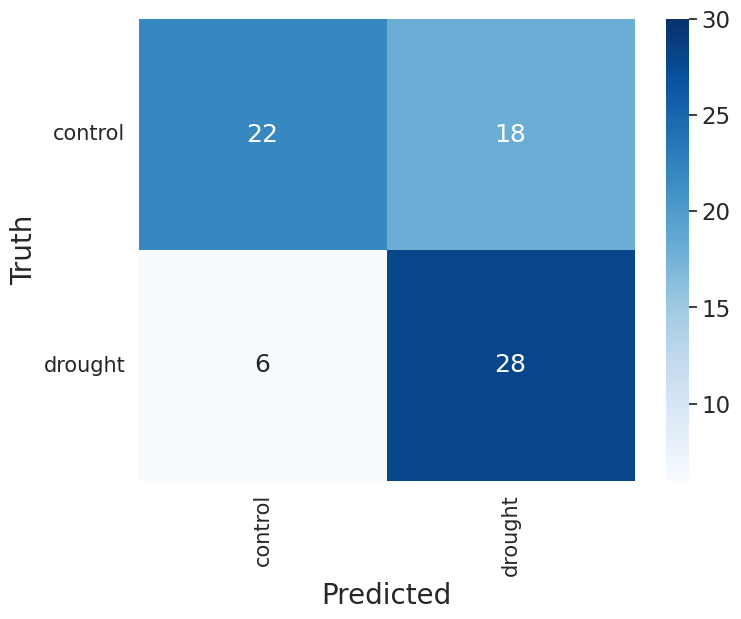

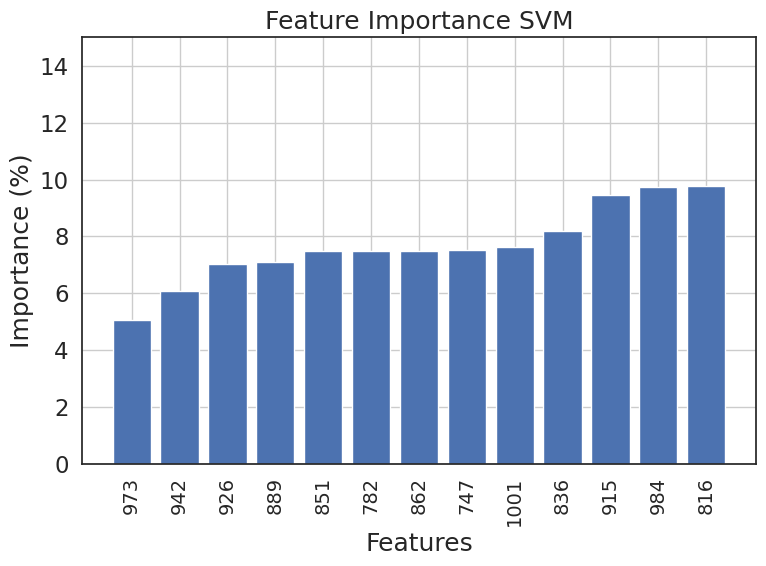

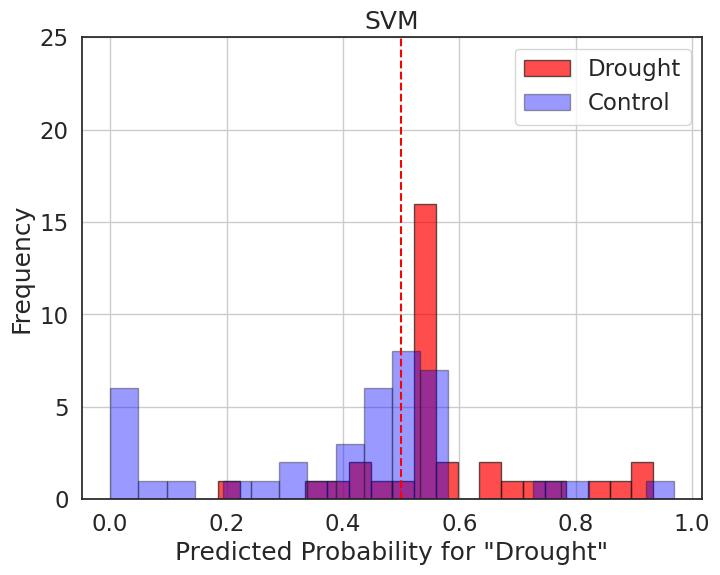

In [ ]:
# Define best parameters
best = {'C': 1.6264787461268888, 'coef0': 0.23435455747405737, 'degree': 7, 'gamma': 4.610569747846317, 'kernel': 'poly', 'shrinking': False, 'tol': 7.304953249815038e-05}

# Create the SVC model with probability enabled
svc = SVC(**best, probability=True)

# Train the model
svc.fit(X_train, y_train)

# Predict using cross-validation
y_train_pred = cross_val_predict(svc, X_train, y_train, cv=3)

# Compute performance metrics
accuracy = accuracy_score(y_train, y_train_pred)
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')

# Print results
print("Training:")
print("Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

# Predict on the test set
y_test_pred = svc.predict(X_test)

# Compute confusion matrix
print("\nTest:")
print("Test: Accuracy:", accuracy_score(y_test, y_test_pred))
print("Test: Precision:", precision_score(y_test, y_test_pred, pos_label='drought'))
print("Test: Recall:", recall_score(y_test, y_test_pred, pos_label='drought'))
print("Test: f1:", f1_score(y_test, y_test_pred, pos_label='drought'))

# Create confusion matrix
unique_label = np.unique([y_test, y_test_pred])
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label]
)
plt.figure(figsize=(8,6))
sns.heatmap(cmtx, annot=True, fmt='d', annot_kws={"size": 18}, cmap="Blues", vmax=30)
plt.xlabel('Predicted', fontsize=20)
plt.ylabel('Truth', fontsize=20)
plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15, rotation=0)
plt.savefig('confusion_matrix_svm_prob.png', dpi=400, bbox_inches='tight')
plt.show()

# Compute feature importance using Permutation Importance
result = permutation_importance(svc, X_train, y_train, n_repeats=10, random_state=42, n_jobs=-1)
importance = (result.importances_mean / np.sum(result.importances_mean)) * 100

# Convert X_train to a DataFrame for feature naming
X_train = pd.DataFrame(X_train)

# Plot feature importance
sorted_idx = importance.argsort()
fig, ax = plt.subplots(figsize=(8, 6))
plt.bar(X_train.columns[sorted_idx], importance[sorted_idx])
plt.ylabel("Importance (%)")
plt.ylim(0, 15)
plt.xlabel("Features")
plt.title("Feature Importance SVM")
plt.xticks(rotation=90, fontsize=14)
plt.grid()
plt.tight_layout()
plt.savefig('feature_importance_svm_prob.png', dpi=400, bbox_inches='tight')
plt.show()

# Get probabilities using predict_proba
probabilities = svc.predict_proba(X_test)[:, 1]  # Probability for the 'drought' class

# Split probabilities based on true labels
drought_values = probabilities[y_test == 'drought']
control_values = probabilities[y_test == 'control']

# Create histogram of probabilities
bin_edges = np.linspace(0, 1, 21)  # 20 bins
plt.figure(figsize=(8, 6))
plt.hist(drought_values, bins=20, edgecolor='k', alpha=0.7, color='#ff0000', label='Drought')
plt.hist(control_values, bins=20, edgecolor='k', alpha=0.4, color='#0000ff', label='Control')
plt.xlabel('Predicted Probability for "Drought"')
plt.ylabel('Frequency')
plt.title('SVM')
plt.ylim(0, 25)
plt.legend()
plt.axvline(x=0.5, color='red', linestyle='--')
plt.grid(True)
plt.savefig('histogram_svm_prob.png', dpi=300, bbox_inches='tight')
plt.show()


### RF

In [ ]:
df_bands = df[df.columns[:-7]]

# Define features and labels
X = df_bands

# Encode "English_name"
label_encoder = LabelEncoder()
X["English_name_encoded"] = label_encoder.fit_transform(df["English_name"])
X['spectral_date'] = df['spectral_date'].values
X['English_name'] = df['English_name'].values
X['ID'] = df['ID'].values

# Print the mapping of the encoded values
english_name_mapping = dict(zip(label_encoder.transform(label_encoder.classes_),label_encoder.classes_))

y = df['treatment']

# Split to train-test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# save date of test set for research later
dates_test = X_test['spectral_date']
ids_test = X_test['ID']

# drop from sets
X_train,X_test = X_train.drop(['English_name','spectral_date', 'ID'],axis=1),X_test.drop(['English_name','spectral_date', 'ID'],axis=1)

X_train.shape,X_test.shape

((172, 275), (74, 275))

In [ ]:
# -------------------------------
# 1. Define the hyperparameter search space
# -------------------------------
param_distribs = {
    'n_estimators': [int(x) for x in np.linspace(start=200, stop=2000, num=10)],
    'criterion': ['gini', 'entropy'],
    'max_depth': [int(x) for x in np.linspace(10, 110, num=11)],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt']
}

# -------------------------------
# 2. Define the model
# -------------------------------
rf_clf = RandomForestClassifier(random_state=42)

# -------------------------------
# 3. Create an F1 scorer (for "drought" as positive label)
# -------------------------------
f1_scorer = make_scorer(f1_score, pos_label='drought')

# -------------------------------
# 4. Perform Randomized Search with F1 optimization
# -------------------------------
rnd_search = RandomizedSearchCV(
    rf_clf,
    param_distributions=param_distribs,
    n_iter=50,       # Number of random search iterations
    cv=3,            # 3-fold cross-validation
    scoring=f1_scorer,  # Optimize for F1 score
    verbose=2,
    random_state=42,
    n_jobs=-1         # Use all available cores
)

# Fit the model
rnd_search.fit(X_train, y_train)

# -------------------------------
# 5. Print best parameters and F1 score
# -------------------------------
print("Best parameters:", rnd_search.best_params_)
print("Best cross-validation F1 score: {:.4f}".format(rnd_search.best_score_))

Fitting 3 folds for each of 50 candidates, totalling 150 fits


/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
63 fits failed out of a total of 150.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
51 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 436, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.11/dist-packages/sklearn/utils/

Best parameters: {'n_estimators': 1400, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'max_depth': 30, 'criterion': 'entropy'}
Best cross-validation F1 score: 0.6434


In [ ]:
best_rf =  {'n_estimators': 1800, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_depth': 80, 'criterion': 'entropy'}
best_rf = {'n_estimators': 1400, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'max_depth': 30, 'criterion': 'entropy'}
# Create the Random Forest model with the best parameters from the randomized search
rf = RandomForestClassifier(**best_rf, random_state=42)

# Fit the model to the training data
rf.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(rf, X_train, y_train, cv=3)

# Calculate recall, precision, and F1 score
# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')

print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Recall: 0.6666666666666666
Precision: 0.6170212765957447
F1 Score: 0.6408839779005525


Test: Accuracy: 0.5945945945945946
Test: Recall: 0.5
Test: Precision: 0.5666666666666667
Test: F1 Score: 0.53125


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

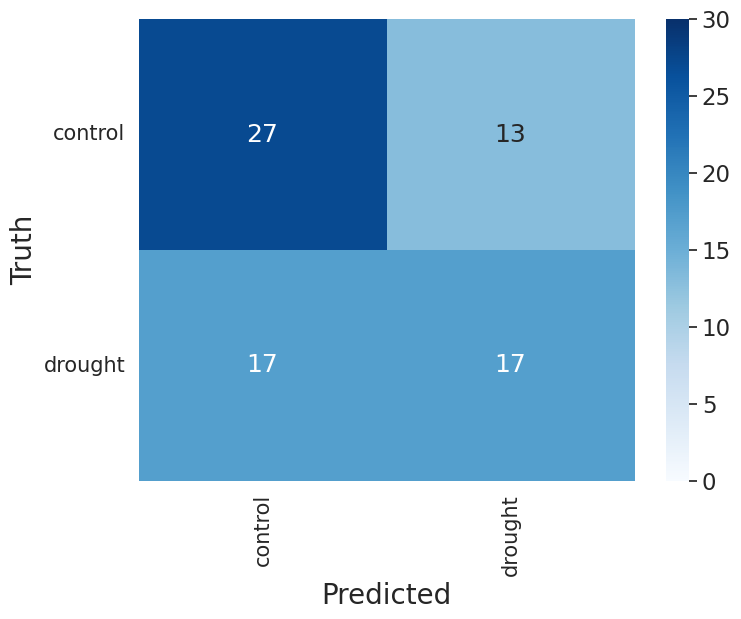

In [ ]:
y_test_pred = rf.predict(X_test)

# Print metrics
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred, pos_label='drought'))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred, pos_label='drought'))
print("Test: F1 Score:",metrics.f1_score(y_test, y_test_pred, pos_label='drought'))

# Confusion matrix
# Labels for confusion matrix:
unique_label = np.unique([y_test, y_test_pred])

# Create confusion matrix dataframe:
cmtx = pd.DataFrame(
confusion_matrix(y_test, y_test_pred, labels=unique_label),
index=[x for x in unique_label],
columns=[x for x in unique_label])
plt.figure(figsize=(8, 6))
sns.heatmap(cmtx, annot=True, fmt='d', annot_kws={"size": 18}, cmap="Blues", vmin=0, vmax=30)
plt.xlabel('Predicted', fontsize=20)
plt.ylabel('Truth', fontsize=20)
plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15, rotation=0)

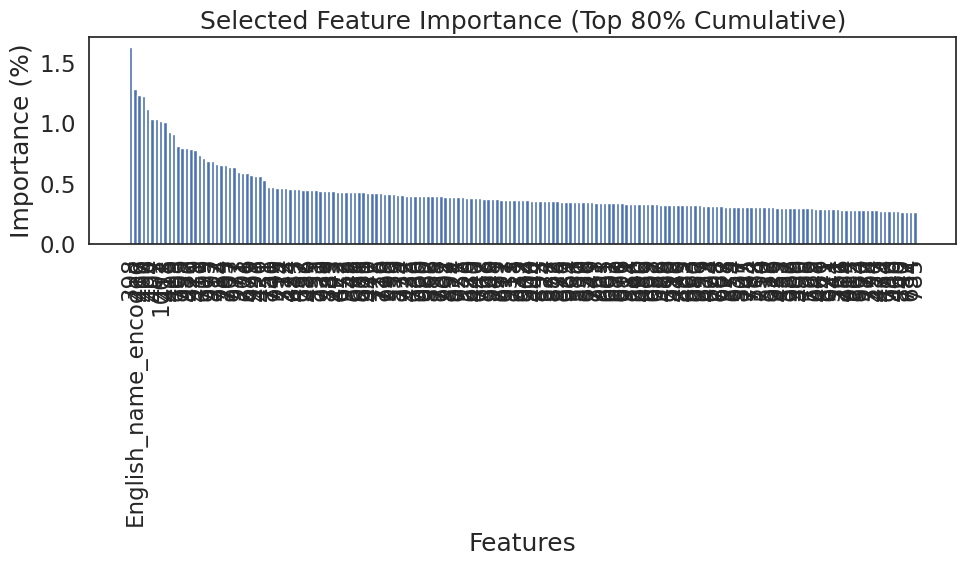

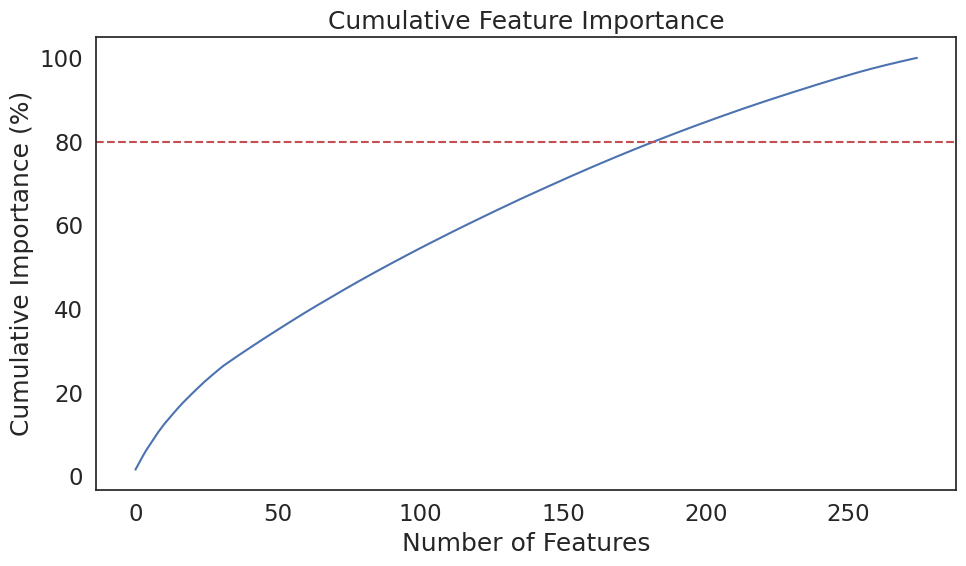

Selected Features Covering 80% Cumulative Importance:
398: 1.63%
English_name_encoded: 1.29%
417: 1.24%
400: 1.22%
406: 1.12%
404: 1.04%
402: 1.03%
1001: 1.02%
413: 1.01%
415: 0.93%
409: 0.91%
705: 0.81%
999: 0.80%
982: 0.79%
420: 0.79%
979: 0.78%
411: 0.74%
709: 0.72%
975: 0.69%
997: 0.69%
712: 0.67%
984: 0.66%
703: 0.66%
707: 0.64%
977: 0.64%
973: 0.60%
701: 0.59%
676: 0.59%
429: 0.57%
993: 0.57%
426: 0.57%
431: 0.53%
751: 0.48%
740: 0.47%
995: 0.47%
714: 0.47%
572: 0.47%
424: 0.46%
683: 0.45%
437: 0.45%
552: 0.45%
986: 0.45%
433: 0.45%
555: 0.45%
721: 0.44%
939: 0.44%
889: 0.44%
743: 0.44%
422: 0.44%
672: 0.43%
953: 0.43%
548: 0.43%
678: 0.43%
988: 0.43%
681: 0.43%
970: 0.43%
442: 0.43%
725: 0.42%
716: 0.42%
729: 0.42%
990: 0.42%
559: 0.41%
579: 0.41%
734: 0.41%
922: 0.40%
435: 0.40%
736: 0.40%
966: 0.40%
920: 0.40%
962: 0.40%
886: 0.40%
738: 0.40%
732: 0.40%
902: 0.39%
897: 0.39%
674: 0.39%
727: 0.39%
955: 0.39%
526: 0.38%
685: 0.38%
440: 0.38%
747: 0.38%
968: 0.38%
566: 0.38%
948:

In [ ]:
X_percent = 80  # % of features to select

# Get the feature importances from the Random Forest model
feature_importance = rf.feature_importances_

# Sort the feature importance in descending order
sorted_idx = np.argsort(feature_importance)[::-1]
sorted_feature_importance = feature_importance[sorted_idx]

# Calculate the cumulative sum of the sorted feature importance
total_importance = np.sum(sorted_feature_importance)
percentage_importance = (sorted_feature_importance / total_importance) * 100
cumulative_importance = np.cumsum(percentage_importance)

# Get the names of the features
feature_names = X_train.columns

# Find the index where cumulative importance exceeds the threshold
num_features = np.argmax(cumulative_importance >= X_percent) + 1

# Select features up to that index
selected_features_idx = sorted_idx[:num_features]
selected_features = feature_names[selected_features_idx]
selected_importance = percentage_importance[:num_features]

# Plot the selected feature importance
plt.figure(figsize=(10, 6))
plt.bar(range(len(selected_importance)), selected_importance, align='center')
plt.xticks(range(len(selected_importance)), selected_features, rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance (%)')
plt.title(f'Selected Feature Importance (Top {X_percent}% Cumulative)')
plt.tight_layout()
plt.show()

# Plot the cumulative feature importance
plt.figure(figsize=(10, 6))
plt.plot(range(len(cumulative_importance)), cumulative_importance)
plt.axhline(y=X_percent, color='r', linestyle='--')
plt.xlabel('Number of Features')
plt.ylabel('Cumulative Importance (%)')
plt.title('Cumulative Feature Importance')
plt.tight_layout()
plt.show()

# Print the selected features and their importance
print(f"Selected Features Covering {X_percent}% Cumulative Importance:")
for feature, importance in zip(selected_features, selected_importance):
    print(f"{feature}: {importance:.2f}%")

In [ ]:
X_percent = 80  # % of features to select

# Get the feature importances from the Random Forest model
feature_importance = rf.feature_importances_

# Sort the feature importance in descending order
sorted_idx = np.argsort(feature_importance)[::-1]
sorted_feature_importance = feature_importance[sorted_idx]

# Calculate the cumulative sum of the sorted feature importance
total_importance = np.sum(sorted_feature_importance)
percentage_importance = (sorted_feature_importance / total_importance) * 100
cumulative_importance = np.cumsum(percentage_importance)

# Get the names of the features
feature_names = X_train.columns

# Find the index where cumulative importance exceeds the threshold
num_features = np.argmax(cumulative_importance >= X_percent) + 1

# Select features up to that index
selected_features_idx = sorted_idx[:num_features]
selected_features = feature_names[selected_features_idx]
selected_importance = percentage_importance[:num_features]

# Create a DataFrame with the selected features
x_new_rf = X[selected_features].drop(columns = ['English_name_encoded'])

# Convert column names to numeric values (wavelengths)
wavelengths = np.array([float(col) for col in x_new_rf.columns])

# Sort the columns based on wavelengths
sorted_indices = np.argsort(wavelengths)
sorted_wavelengths = wavelengths[sorted_indices]
sorted_features = x_new_rf.columns[sorted_indices]
sorted_importance = selected_importance[sorted_indices]

# Initialize a list to keep track of selected features
final_selected_features = []
final_selected_importance = []

# Iterate through the sorted features and keep the most important one within each 15 nm range
i = 0
while i < len(sorted_wavelengths):
    current_wavelength = sorted_wavelengths[i]
    current_importance = sorted_importance[i]
    current_feature = sorted_features[i]

    # Find the range of wavelengths within 15 nm
    j = i + 1
    while j < len(sorted_wavelengths) and sorted_wavelengths[j] <= current_wavelength + 15:
        if sorted_importance[j] > current_importance:
            current_wavelength = sorted_wavelengths[j]
            current_importance = sorted_importance[j]
            current_feature = sorted_features[j]
        j += 1

    # Add the most important feature within the range to the final list
    final_selected_features.append(current_feature)
    final_selected_importance.append(current_importance)

    # Move to the next range
    i = j

# Create a new DataFrame with the final selected features
x_final_rf = x_new_rf[final_selected_features]

# Print the final selected features and their importance
print("Selected Features:", final_selected_features)
print("Selected Importance:", final_selected_importance)

# Split to train-test
X_train, X_test, y_train, y_test = train_test_split(x_final_rf, y, test_size=0.3, random_state=42)

X_train.shape,X_test.shape

Selected Features: ['398', '417', '437', '462', '486', '526', '552', '572', '590', '621', '656', '676', '705', '721', '751', '778', '798', '840', '889', '922', '939', '982', '1001']
Selected Importance: [np.float64(1.6313313115658086), np.float64(1.2866985629321581), np.float64(0.4534111307446142), np.float64(0.32394990796288103), np.float64(0.3321458130079895), np.float64(0.38801924841842417), np.float64(0.45340389142628235), np.float64(0.4677773958370325), np.float64(0.3279695565050934), np.float64(0.2942664201769622), np.float64(0.3460784559977082), np.float64(0.5892864858722822), np.float64(0.9099476533880992), np.float64(0.45080732030233706), np.float64(0.533746808707138), np.float64(0.2835271514678377), np.float64(0.31796378047817053), np.float64(0.2719079208080988), np.float64(0.4418835109857702), np.float64(0.4053872022116068), np.float64(0.44352098825313385), np.float64(0.8001692195148026), np.float64(1.034831309622592)]


((172, 23), (74, 23))

In [ ]:
param_distribs = {
'n_estimators':[int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)],
'criterion': ['gini', 'entropy'],
'max_depth': [int(x) for x in np.linspace(10, 110, num = 11)],
'min_samples_split': [2, 5, 10],
'min_samples_leaf': [1, 2, 4],
'max_features': ['auto', 'sqrt'],
}

rf_clf = RandomForestClassifier(random_state=42)
rnd_search = RandomizedSearchCV(rf_clf, param_distributions=param_distribs,
n_iter=50, cv=3, scoring='accuracy',
verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   4.8s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   3.2s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   3.2s
[CV] END criterion=gini, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.0s
[CV] END criterion=gini, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.4s
[CV] END criterion=gini, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.9s
[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=

/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
63 fits failed out of a total of 150.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
63 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 436, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.11/dist-packages/sklearn/utils/

Best parameters: {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 20, 'criterion': 'gini'}
Best cross-validation score: 0.66


In [ ]:
best_rf =  {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 20, 'criterion': 'gini'}
# Create the Random Forest model with the best parameters from the randomized search
rf = RandomForestClassifier(**best_rf, random_state=42)

# Fit the model to the training data
rf.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(rf, X_train, y_train, cv=5)

# Calculate recall, precision, and F1 score
# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')

print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Recall: 0.7241379310344828
Precision: 0.6494845360824743
F1 Score: 0.6847826086956522


Test: Accuracy: 0.6216216216216216
Test: Recall: 0.5294117647058824
Test: Precision: 0.6
Test: F1 Score: 0.5625


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

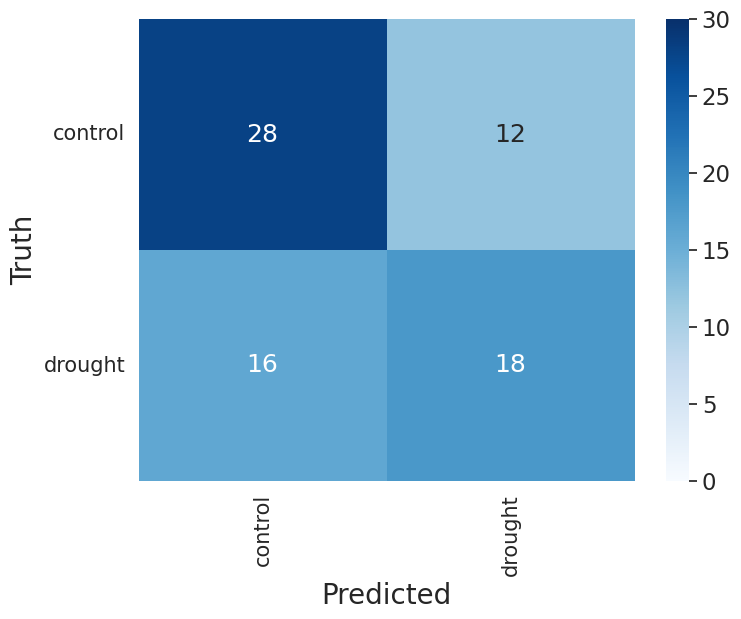

In [ ]:
y_test_pred = rf.predict(X_test)

# Print metrics
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred, pos_label='drought'))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred, pos_label='drought'))
print("Test: F1 Score:",metrics.f1_score(y_test, y_test_pred, pos_label='drought'))

# Confusion matrix
# Labels for confusion matrix:
unique_label = np.unique([y_test, y_test_pred])

# Create confusion matrix dataframe:
cmtx = pd.DataFrame(
confusion_matrix(y_test, y_test_pred, labels=unique_label),
index=[x for x in unique_label],
columns=[x for x in unique_label])
plt.figure(figsize=(8, 6))
sns.heatmap(cmtx, annot=True, fmt='d', annot_kws={"size": 18}, cmap="Blues", vmin=0, vmax=30)
plt.xlabel('Predicted', fontsize=20)
plt.ylabel('Truth', fontsize=20)
plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15, rotation=0)

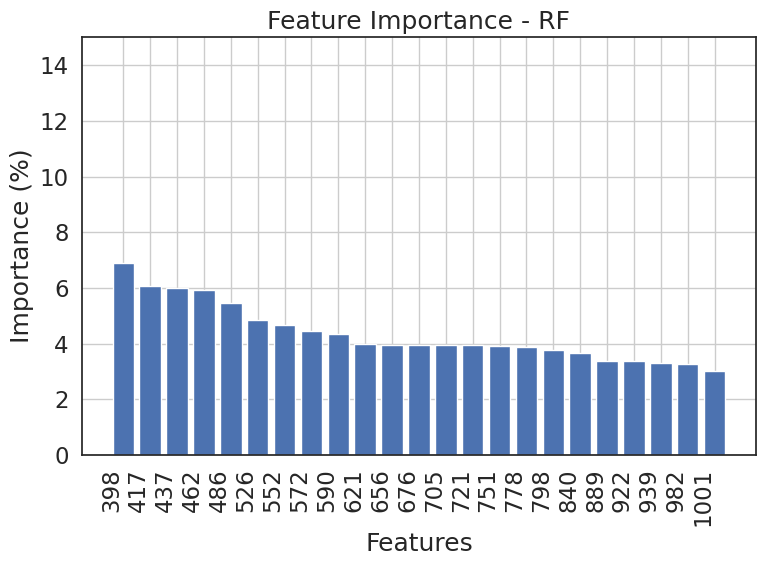

In [ ]:
# Get feature importance scores and normalize them to percentages
importance = rf.feature_importances_

# Normalize to percentages
importance = (importance / np.sum(importance)) * 100

# Split long feature names into multiple lines
feature_names = [name.replace('_', ' ') for name in X_train.columns]

# Plot feature importance
sorted_idx = importance.argsort()[::-1]
fig, ax = plt.subplots(figsize=(8, 6))  # Increase figure width for more space

# Plotting the features on the X-axis and the importance on the Y-axis
plt.bar(feature_names, importance[sorted_idx])

# Add a horizontal line at Y = 2.5%
# plt.axhline(y=2.5, color='red', linestyle='--')

plt.ylabel("Importance (%)")
plt.xlabel("Features")
plt.title("Feature Importance - RF")
plt.ylim(0,15)
# Rotate feature names and adjust alignment to prevent overlap
plt.xticks(rotation=90, ha='right',)
plt.grid()

plt.tight_layout()
plt.show()

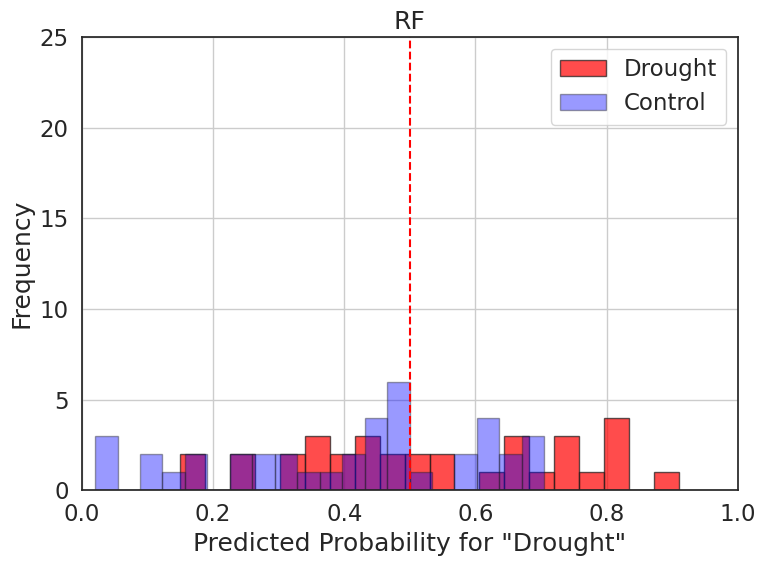

In [ ]:
# Get predicted probabilities for the positive class ("drought")
probabilities = rf.predict_proba(X_test)[:, 1]

# Separate probabilities based on true labels
drought_probs = probabilities[y_test == 'drought']
control_probs = probabilities[y_test == 'control']

# Plot the histograms with different colors
plt.figure(figsize=(8, 6))
plt.hist(drought_probs, bins=20, edgecolor='k', alpha=0.7, color='red', label='Drought')
plt.hist(control_probs, bins=20, edgecolor='k', alpha=0.4, color='blue', label='Control')

# Labels & Formatting
plt.xlabel('Predicted Probability for "Drought"')
plt.ylabel('Frequency')
plt.title('RF')
plt.ylim(0, 25) #adjusted range
plt.xlim(0, 1)
plt.legend()
# Add a dashed line at 0.5 (Decision Boundary)
plt.axvline(x=0.5, color='red', linestyle='--')

plt.grid(True)
plt.legend()
plt.tight_layout()
plt.savefig('histogram_rf_prob.png', dpi=600, bbox_inches='tight')
plt.show()

#### Reduce to 17 bands

In [ ]:
# Create a mask to filter the columns with importance greater than 0.1%
mask = importance > 2.5

# Get the names of the features that meet the importance threshold
selected_features = X_train.columns[mask]

# Create a new DataFrame with the selected features
new_df = df[selected_features].copy()

# Print the new DataFrame
new_df

,415,475,570,583,712,743,758,776,813,824,847,866,884,911,948,957,973
0,0.023595,0.035766,0.059917,0.056291,0.097547,0.199924,0.216088,0.222603,0.227312,0.229133,0.231435,0.231835,0.236759,0.231844,0.224508,0.226143,0.219061
15,0.022939,0.028376,0.048718,0.046018,0.084586,0.188417,0.208196,0.213411,0.220505,0.222753,0.223649,0.225633,0.231208,0.229275,0.228315,0.227710,0.222673
14,0.024182,0.021377,0.038266,0.034869,0.058516,0.121905,0.130964,0.133837,0.138336,0.139148,0.140629,0.142374,0.145599,0.143349,0.134210,0.134894,0.134403
12,0.041287,0.047842,0.078566,0.073241,0.120057,0.232521,0.250579,0.256094,0.265331,0.268606,0.270273,0.273187,0.279762,0.278420,0.275804,0.275137,0.268456
11,0.022117,0.022060,0.042140,0.036963,0.081243,0.206103,0.229769,0.235927,0.242066,0.244301,0.245068,0.246511,0.251829,0.248910,0.243206,0.241969,0.234615
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220,0.023973,0.029724,0.055138,0.048619,0.113831,0.273418,0.303956,0.312947,0.325064,0.325284,0.337577,0.343742,0.341843,0.348039,0.346894,0.335776,0.333938
219,0.014638,0.022704,0.038553,0.035581,0.069845,0.156290,0.172889,0.182192,0.183193,0.182844,0.192152,0.194271,0.189929,0.194997,0.189713,0.185181,0.185199
244,0.020232,0.025610,0.043903,0.039972,0.082989,0.199512,0.224665,0.233346,0.240146,0.239389,0.248656,0.252036,0.249571,0.251967,0.247218,0.239147,0.236201
231,0.036745,0.051867,0.090754,0.082888,0.146207,0.270950,0.287887,0.299395,0.300460,0.300937,0.311973,0.318640,0.317808,0.308292,0.309560,0.304544,0.303973


In [ ]:
# Define features and labels
X = new_df
y = important_df['treatment']

# Split to train-test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

X_train.shape,X_test.shape

((172, 17), (74, 17))

In [ ]:
param_distribs = {
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'shrinking': [False, True],
    'C': reciprocal(1, 1000),
    'coef0': expon(scale=1.0),
    'gamma': expon(scale=1.0),
    'degree': [1, 2, 3, 4, 5, 6, 7, 8],
    'tol': expon(scale=1e-4)
}

svm_clf = SVC()
rnd_search = RandomizedSearchCV(svm_clf, param_distributions=param_distribs,
                                n_iter=50, cv=3, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=False, tol=2.0799307999138624e-06; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=False, tol=2.0799307999138624e-06; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821

In [ ]:
# Create the SVC model with the best parameters from the randomized search
svc = SVC(**rnd_search.best_params_)

# Fit the model to the training data
svc.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(svc, X_train, y_train, cv=5)

# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')


print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Recall: 0.8275862068965517
Precision: 0.7058823529411765
F1 Score: 0.7619047619047619


Test: Accuracy: 0.7162162162162162
Test: Precision: 0.6382978723404256 
Test: Recall: 0.8823529411764706 
Test: F1 Score: 0.7407407407407407


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

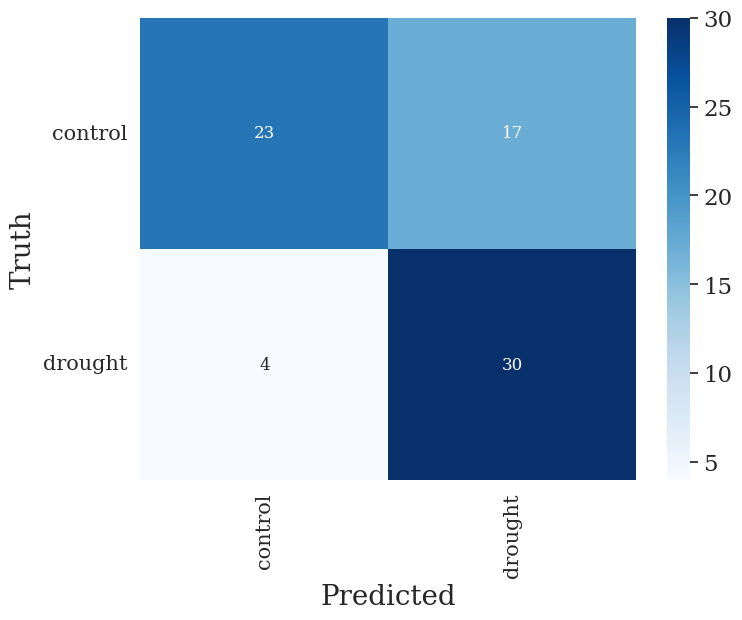

In [ ]:
y_test_pred = svc.predict(X_test)

# print matrix
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Precision:",precision_score(y_test, y_test_pred, pos_label='drought')
      ,"\nTest: Recall:",recall_score(y_test, y_test_pred, pos_label='drought')
      ,"\nTest: F1 Score:",f1_score(y_test, y_test_pred, pos_label='drought'))

###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 12},cmap="Blues")
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)

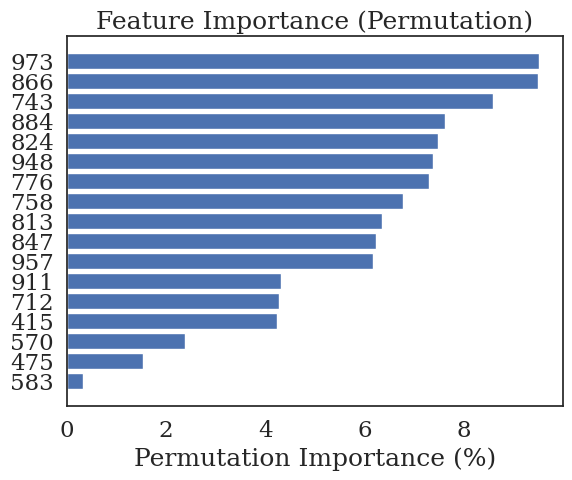

In [ ]:
# Use permutation importance to calculate feature importance
result = permutation_importance(svc, X_train, y_train, n_repeats=10, random_state=42, n_jobs=-1)

# Get feature importance scores and normalize them to percentages
importance = result.importances_mean

# normalize to precentages
importance = (importance / np.sum(importance))*100


# Plot feature importance
sorted_idx = importance.argsort()
plt.barh(X_train.columns[sorted_idx], importance[sorted_idx])
plt.xlabel("Permutation Importance (%)")
plt.title("Feature Importance (Permutation)")
plt.show()

In [ ]:
importance.sum()

100.0

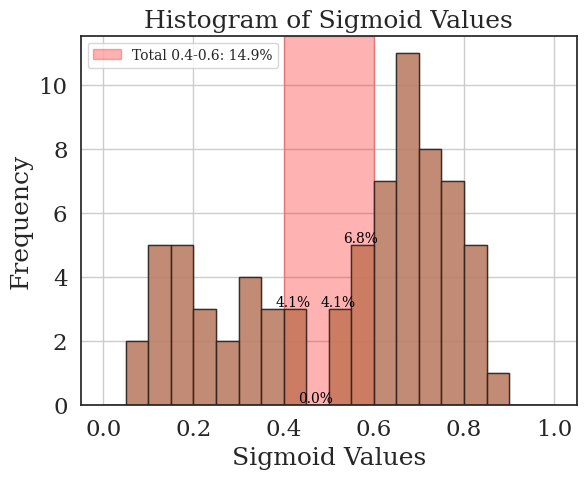

In [ ]:
# Get decision function scores
decision_scores = svc.decision_function(X_test)

# Apply sigmoid function to approximate probabilities
sigmoid_values = 1 / (1 + np.exp(-decision_scores))

# Define the bin edges
bin_edges = np.linspace(0, 1, 21)  # 20 bins from 0 to 1

# Plot the histogram
plt.hist(sigmoid_values, bins=bin_edges, edgecolor='k', alpha=0.7)

# Highlight bins between 0.4 and 0.6 in red
plt.axvspan(0.4, 0.6, color='red', alpha=0.3, label='0.4-0.6')

# Calculate and display the count and percentage of values in each bin
counts, bin_edges, _ = plt.hist(sigmoid_values, bins=bin_edges, edgecolor='k', alpha=0.7)
total_samples = len(sigmoid_values)

# count total percentage
total_percentage = 0

# Add labels to the bins with counts and percentages
for i in range(len(counts)):
    if 0.4 <= bin_edges[i] <= 0.6:
        count = int(counts[i])
        percentage = (count / total_samples) * 100
        total_percentage += percentage
        label = f'{percentage:.1f}%'
        plt.text(bin_edges[i] + 0.02, counts[i], label, ha='center', va='bottom', color='black', fontsize=10)

plt.xlabel('Sigmoid Values')
plt.ylabel('Frequency')
plt.title('Histogram of Sigmoid Values')
plt.grid(True)
legend_label = f'Total 0.4-0.6: {total_percentage:.1f}%'
plt.legend([legend_label], fontsize=10)
plt.show()


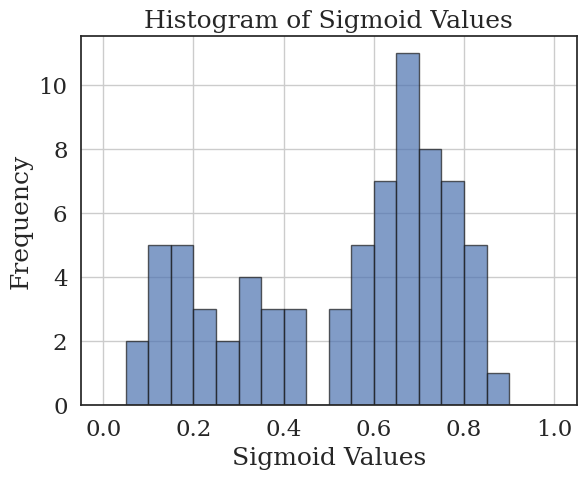

In [ ]:
# Get decision function scores
decision_scores = svc.decision_function(X_test)

# Apply sigmoid function to approximate probabilities
sigmoid_values = 1 / (1 + np.exp(-decision_scores))

bin_edges = np.linspace(0, 1, 21)  # 20 bins from 0 to 1

# Plot the histogram
plt.hist(sigmoid_values, bins=bin_edges, edgecolor='k', alpha=0.7)
plt.xlabel('Sigmoid Values')
plt.ylabel('Frequency')
plt.title('Histogram of Sigmoid Values')
plt.grid(True)
plt.show()

Check dates and species of the wrong

In [ ]:
# Get predictions on the test set
y_test_pred = svc.predict(X_test)

# Calculate accuracy on the test set
accuracy = accuracy_score(y_test, y_test_pred)
print("Test accuracy: {:.2f}".format(accuracy))

# Find misclassified samples
misclassified_indices = y_test != y_test_pred

# Extract species, dates, and predicted species for misclassified samples
misclassified_species = test_species[misclassified_indices]
misclassified_dates = test_dates[misclassified_indices]
misclassified_dates = [date[:7] for date in misclassified_dates]
# Display misclassified species and dates along with predicted species
print("Misclassified samples:")
for i in range(len(misclassified_species)):
    print(f"Species: {misclassified_species[i]}, Date: {misclassified_dates[i]} ")



Test accuracy: 0.72
Misclassified samples:
Species: cypress, Date: 2022-12 
Species: cypress, Date: 2022-08 
Species: pine, Date: 2023-01 
Species: oak, Date: 2023-02 
Species: cypress, Date: 2023-01 
Species: pistacia, Date: 2023-01 
Species: pistacia, Date: 2023-01 
Species: pistacia, Date: 2022-08 
Species: oak, Date: 2022-04 
Species: oak, Date: 2023-01 
Species: pine, Date: 2022-12 
Species: pine, Date: 2022-08 
Species: oak, Date: 2022-12 
Species: carob, Date: 2022-08 
Species: pistacia, Date: 2023-01 
Species: oak, Date: 2022-11 
Species: pistacia, Date: 2022-07 
Species: cypress, Date: 2022-08 
Species: carob, Date: 2022-08 
Species: pine, Date: 2022-08 
Species: pine, Date: 2022-07 


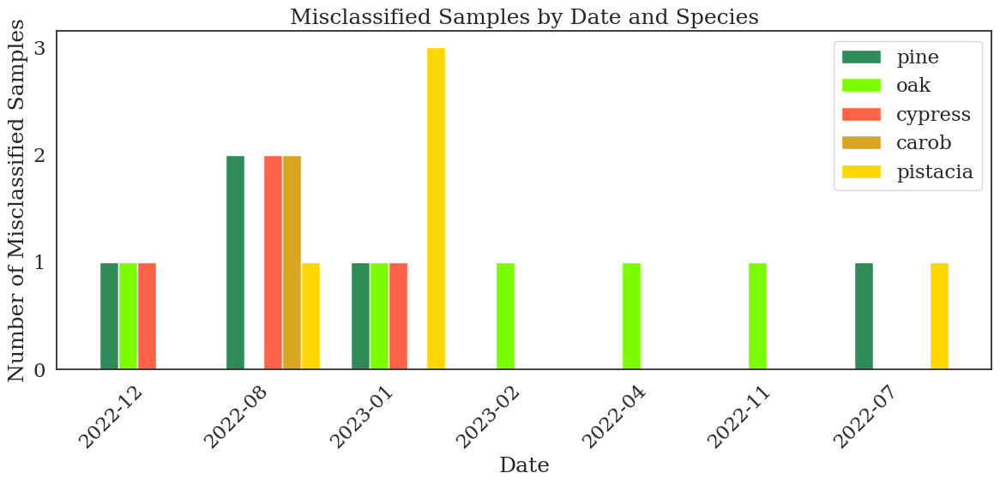

In [ ]:
# Define the species order and colors
species_order = ['pine', 'oak', 'cypress', 'carob', 'pistacia']
species_colors = ['seagreen', 'lawngreen', 'tomato', 'goldenrod', 'gold']

# Group misclassified samples by date and species
misclassified_data = {}
for species, date in zip(misclassified_species, misclassified_dates):
    if date not in misclassified_data:
        misclassified_data[date] = {s: 0 for s in species_order}
    misclassified_data[date][species] += 1

# Plot the bar graph
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
bar_width = 0.15
index = np.arange(len(misclassified_data))  # Index for x-axis

# Plot bars for each date and species
for j, species in enumerate(species_order):
    counts = [misclassified_data[date][species] if species in misclassified_data[date] else 0 for date in misclassified_data]
    plt.bar(index + j * bar_width, counts, bar_width, color=species_colors[j], label=species)

# Set x-axis labels as dates
plt.xticks(index + bar_width * 2, misclassified_data.keys(), rotation=45, ha='right')

# set y ticks 1,2,3
plt.yticks(np.arange(0, max([max(species_counts.values()) for species_counts in misclassified_data.values()]) + 1, 1))
plt.xlabel('Date')
plt.ylabel('Number of Misclassified Samples')
plt.title('Misclassified Samples by Date and Species')

# Create single legend from species order and colors
plt.legend(species_order, loc='upper right')

plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

Analize the samples that the model predict as Control but were drought

In [ ]:
# Find misclassified false positive samples
false_positive_indices = (y_test_pred == 'control') & (y_test == 'drought')

# Extract species and dates for false positive samples
false_positive_species = test_species[false_positive_indices]
false_positive_dates = test_dates[false_positive_indices]

# convert dates to yyyy-mm format
false_positive_dates = [date[:7] for date in false_positive_dates]

# Display false positive species and dates
for species, date in zip(false_positive_species, false_positive_dates):
    print("Misclassified as Control (False Positive):", species, " | Spectral Date:", date)

Misclassified as Control (False Positive): oak  | Spectral Date: 2023-02
Misclassified as Control (False Positive): oak  | Spectral Date: 2022-04
Misclassified as Control (False Positive): oak  | Spectral Date: 2022-12
Misclassified as Control (False Positive): oak  | Spectral Date: 2022-11


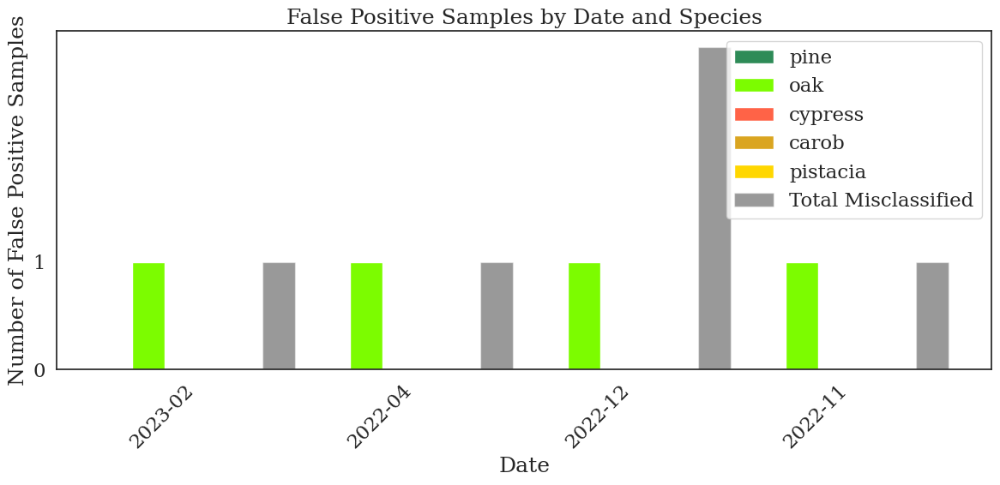

In [ ]:
# Group false positive samples by date and species
false_positive_data = {}
for species, date in zip(false_positive_species, false_positive_dates):
    if date not in false_positive_data:
        false_positive_data[date] = {s: 0 for s in species_order}
    false_positive_data[date][species] += 1

# Plot the bar graph
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
bar_width = 0.15
index = np.arange(len(false_positive_data))  # Index for x-axis

# Plot bars for false positives for each date and species
for j, species in enumerate(species_order):
    counts = [false_positive_data[date][species] if species in false_positive_data[date] else 0 for date in false_positive_data]
    plt.bar(index + j * bar_width, counts, bar_width, color=species_colors[j], label=species)

# Plot total misclassified samples for each date
total_misclassified = [sum(misclassified_data[date].values()) for date in false_positive_data]
plt.bar(index + len(species_order) * bar_width, total_misclassified, bar_width, color='black', alpha=0.4, label='Total Misclassified')

# Set x-axis labels as dates
plt.xticks(index + len(species_order) * bar_width / 2, false_positive_data.keys(), rotation=45, ha='right')

# set y ticks 1,2,3
plt.yticks(np.arange(0, max([max(species_counts.values()) for species_counts in false_positive_data.values()]) + 1, 1))
plt.xlabel('Date')
plt.ylabel('Number of False Positive Samples')
plt.title('False Positive Samples by Date and Species')

# Create single legend from species order and a label for total misclassified samples
plt.legend(species_order + ['Total Misclassified'], loc='upper right')

plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

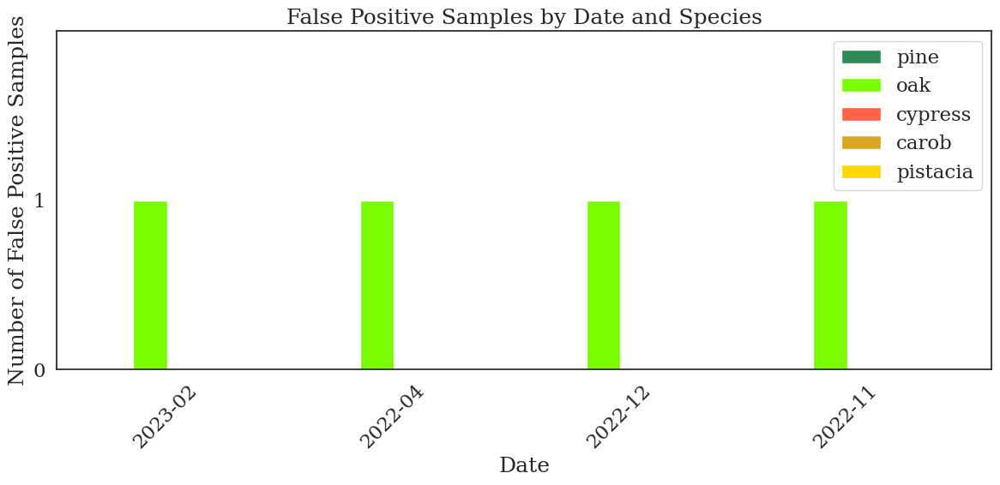

In [ ]:
# Group false positive samples by date and species
false_positive_data = {}
for species, date in zip(false_positive_species, false_positive_dates):
    if date not in false_positive_data:
        false_positive_data[date] = {s: 0 for s in species_order}
    false_positive_data[date][species] += 1

# Plot the bar graph
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
bar_width = 0.15
index = np.arange(len(false_positive_data))  # Index for x-axis

# Plot bars for false positives for each date and species
for j, species in enumerate(species_order):
    counts = [false_positive_data[date][species] if species in false_positive_data[date] else 0 for date in false_positive_data]
    plt.bar(index + j * bar_width, counts, bar_width, color=species_colors[j], label=species)

# Set x-axis labels as dates
plt.xticks(index + len(species_order) * bar_width / 2, false_positive_data.keys(), rotation=45, ha='right')

# set y ticks 1,2,3
plt.yticks(np.arange(0, max([max(species_counts.values()) for species_counts in false_positive_data.values()]) + 1, 1))
plt.xlabel('Date')
plt.ylabel('Number of False Positive Samples')
plt.title('False Positive Samples by Date and Species')
plt.ylim(0,2)
# Create single legend from species order
plt.legend(species_order, loc='upper right')

plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

In [ ]:
# create df of all false positive values
df_miss = pd.DataFrame(zip(false_positive_species, false_positive_dates),columns=['species','false_positive_dates',	])

# Convert the false_positive_dates to datetime objects
df_miss['false_positive_dates'] = pd.to_datetime(df_miss['false_positive_dates']).dt.strftime('%m-%Y')

# create df with all test set dates
date_objs = [pd.to_datetime(date_str) for date_str in test_dates]

# Extract month-year formatted strings
month_year_strings = [date_obj.strftime('%m-%Y') for date_obj in date_objs]

# Create a dictionary for the DataFrame
data = {
    'All_Dates': month_year_strings,
}

df_all = pd.DataFrame(data).drop_duplicates().reset_index(drop=True)

# Merge the two DataFrames based on the dates
merged_df = pd.merge(df_all, df_miss, how='left', left_on='All_Dates', right_on='false_positive_dates')

# Convert 'All_Dates' column to datetime objects for sorting
merged_df['All_Dates'] = pd.to_datetime(merged_df['All_Dates'], format='%m-%Y')

# Sort the DataFrame by 'All_Dates'
merged_df = merged_df.sort_values(by='All_Dates')

# Rename the 'species' column to match the desired output
merged_df.rename(columns={'species': 'false_positive_species'}, inplace=True)

merged_df['All_Dates'] = merged_df['All_Dates'].dt.strftime('%m-%Y')


df_miss

,species,false_positive_dates
0,oak,02-2023
1,oak,04-2022
2,oak,12-2022
3,oak,11-2022


In [ ]:
species = df['English_name'].unique()


# Create a dictionary to store species and their counts
species_counts = {'Species': [], 'Count': []}

# Count occurrences of each species in merged_df
for sp in species:
    count = len(merged_df[merged_df['false_positive_species'] == sp])
    species_counts['Species'].append(sp)
    species_counts['Count'].append(count)

# Create a DataFrame from the species_counts dictionary
species_df = pd.DataFrame(species_counts)
# species_df

In [ ]:
new_df['English_name'] = df['English_name'].values
new_df['treatment'] = df['treatment'].values
new_df['spectral_date'] = dates_test.values
# new_df.to_csv("/content/drive/MyDrive/LWP_Netanel/feature_importance.csv",index=False)

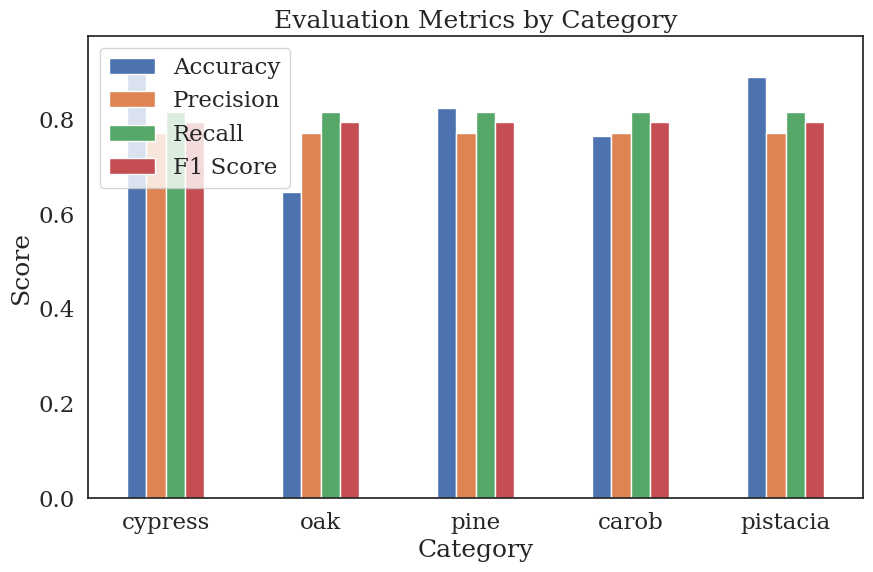

In [ ]:
# Create a list of unique categories in the 'category' column
categories = X['English_name_encoded'].unique()

# Initialize empty lists to store the evaluation metrics
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each category
for category in categories:
    # Filter the DataFrame for the current category
    category_df =  X_test
    category_df['target'] = y_test
    category_df = category_df[category_df['English_name_encoded'] == category]


    # Split the data into features (X) and target (y)
    X = category_df.drop(['target'], axis=1)
    y = category_df['target']

    # Train a logistic regression model
    model = logreg
    # model.fit(X, y)

    # Make predictions on the test set
    y_pred = model.predict(X)

    # Calculate evaluation metrics
    accuracy = metrics.accuracy_score(y, y_pred)
    recall = recall_score(y_train, y_train_pred, pos_label='drought')
    precision = precision_score(y_train, y_train_pred, pos_label='drought')
    f1 = f1_score(y_train, y_train_pred, pos_label='drought')

    # Append the scores to the respective lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

# Create a DataFrame to store the scores
scores_df = pd.DataFrame({
    'Category': [english_name_mapping[i] for i in categories],
    'Accuracy': accuracy_scores,
    'Precision': precision_scores,
    'Recall': recall_scores,
    'F1 Score': f1_scores
})

# Plot the evaluation metrics using a bar plot
scores_df.plot(x='Category', kind='bar', figsize=(10, 6))
plt.title('Evaluation Metrics by Category')
plt.xlabel('Category')
plt.ylabel('Score')
plt.xticks(rotation=0)
plt.legend()
plt.show()

### MLP - Not good

In [ ]:
param_distribs = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50), (100, 100)],
    'activation': ['tanh', 'relu', 'logistic'],
    'solver': ['sgd', 'adam'],
    'alpha': reciprocal(1e-5, 1e-1),
    'learning_rate': ['constant', 'invscaling', 'adaptive'],
    'learning_rate_init': reciprocal(1e-5, 1e-1),
    'max_iter': [500, 1000, 1500, 2000],
    'tol': uniform(1e-5, 1e-3),
    'momentum': uniform(0.1, 0.9),
    'early_stopping': [True, False],
    'n_iter_no_change': [5, 10, 20],
    'batch_size': ['auto', 32, 64, 128, 256]
}

mlp_clf = MLPClassifier(random_state=42)
rnd_search = RandomizedSearchCV(mlp_clf, param_distributions=param_distribs,
                                n_iter=100, cv=5, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END activation=logistic, alpha=0.015352246941973482, batch_size=64, early_stopping=False, hidden_layer_sizes=(100, 100), learning_rate=constant, learning_rate_init=4.207988669606632e-05, max_iter=1500, momentum=0.18997742423620262, n_iter_no_change=20, solver=adam, tol=0.00034370861113902185; total time=   0.5s
[CV] END activation=logistic, alpha=0.015352246941973482, batch_size=64, early_stopping=False, hidden_layer_sizes=(100, 100), learning_rate=constant, learning_rate_init=4.207988669606632e-05, max_iter=1500, momentum=0.18997742423620262, n_iter_no_change=20, solver=adam, tol=0.00034370861113902185; total time=   0.7s
[CV] END activation=logistic, alpha=0.015352246941973482, batch_size=64, early_stopping=False, hidden_layer_sizes=(100, 100), learning_rate=constant, learning_rate_init=4.207988669606632e-05, max_iter=1500, momentum=0.18997742423620262, n_iter_no_change=20, solver=adam, tol=0.00034370861113902185; to

Recall: 0.6781609195402298
Precision: 0.6020408163265306
F1 Score: 0.6378378378378379


 Test Set: 


Test: Accuracy: 0.6216216216216216
Test: Recall: 0.5
Test: Precision: 0.6071428571428571
Test: F1 Score: 0.5483870967741935


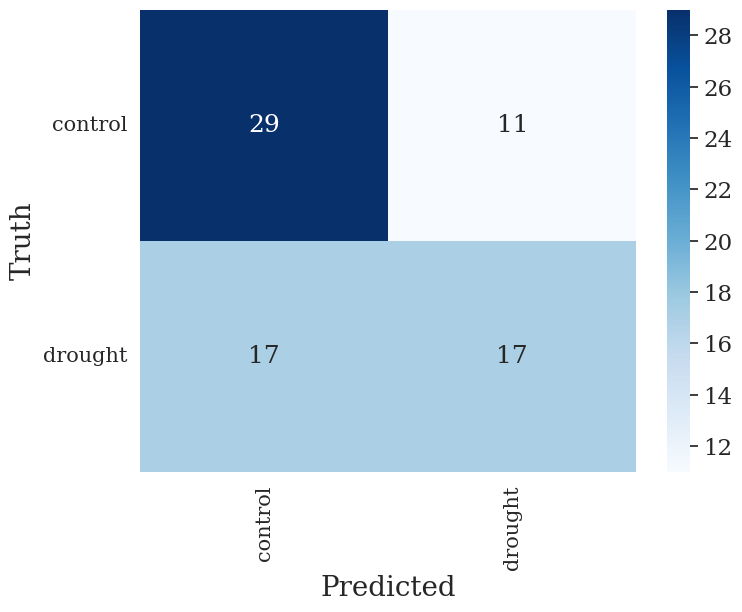

In [ ]:
# Create and fit the MLP model with best parameters
mlp = MLPClassifier(**rnd_search.best_params_, random_state=42)
mlp.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(mlp, X_train, y_train, cv=5)

# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')

print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

print('\n\n Test Set: \n\n')
y_test_pred = mlp.predict(X_test)

# print metrics
print("Test: Accuracy:", accuracy_score(y_test, y_test_pred))
print("Test: Recall:", recall_score(y_test, y_test_pred, pos_label='drought'))
print("Test: Precision:", precision_score(y_test, y_test_pred, pos_label='drought'))
print("Test: F1 Score:", f1_score(y_test, y_test_pred, pos_label='drought'))

###### Confusion matrix ######
# labels for confusion matrix:
unique_label = np.unique([y_test, y_test_pred])

# df of confusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])

plt.figure(figsize=(8,6))
sns.heatmap(cmtx, annot=True, fmt='d', annot_kws={"size": 18}, cmap="Blues")
plt.xlabel('Predicted', fontsize=20)
plt.ylabel('Truth', fontsize=20)
plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15, rotation=0)
plt.show()

In [ ]:
# Define the cumulative percentage threshold
X_percent = 80  # Example cumulative percentage threshold

# Compute permutation importance
perm_importance = permutation_importance(mlp, X_test, y_test, n_repeats=10, random_state=42)

# Get the feature importance scores
feature_importance = perm_importance.importances_mean

# Calculate the percentage of each feature importance
total_importance = np.sum(feature_importance)
percentage_importance = (feature_importance / total_importance) * 100

# Sort the feature importance in descending order
sorted_idx = np.argsort(percentage_importance)[::-1]
sorted_percentage_importance = percentage_importance[sorted_idx]

# Calculate the cumulative sum of the sorted feature importance
cumulative_importance = np.cumsum(sorted_percentage_importance)

# Get the names of the features
feature_names = X_train.columns

# Find the index where cumulative importance exceeds the threshold
num_features = np.argmax(cumulative_importance >= X_percent) + 1

# Select features up to that index
selected_features_idx = sorted_idx[:num_features]
selected_features = feature_names[selected_features_idx]
selected_importance = percentage_importance[selected_features_idx]

# Plot the selected feature importance
plt.figure(figsize=(10, 6))
plt.bar(range(len(selected_importance)), selected_importance, align='center')
plt.xticks(range(len(selected_importance)), selected_features, rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance (%)')
plt.title(f'Selected Feature Importance (Top {X_percent}% Cumulative)')
plt.tight_layout()
plt.show()

# Plot the cumulative feature importance
plt.figure(figsize=(10, 6))
plt.plot(range(len(cumulative_importance)), cumulative_importance)
plt.axhline(y=X_percent, color='r', linestyle='--')
plt.xlabel('Number of Features')
plt.ylabel('Cumulative Importance (%)')
plt.title('Cumulative Feature Importance')
plt.tight_layout()
plt.show()

# Print the selected features and their importance
print(f"Selected Features Covering {X_percent}% Cumulative Importance:")
for feature, importance in zip(selected_features, selected_importance):
    print(f"{feature}: {importance:.2f}%")

## Planet

In [ ]:
planet_bands = [
    (443, 20),   # Band 1
    (490, 50),   # Band 2
    (531, 36),   # Band 3
    (565, 36),   # Band 4
    (610, 20),   # Band 5
    (665, 31),   # Band 6
    (705, 15),   # Band 7
    (865, 40),   # Band 8
]

planet_bands_dict = {}

# Calculate minimum and maximum wavelength values for each band
for band in planet_bands:
    wavelength, bandwidth = band
    min_wavelength = wavelength - (bandwidth / 2)
    max_wavelength = wavelength + (bandwidth / 2)
    new_band = (int(min_wavelength), int(max_wavelength))
    planet_bands_dict[new_band] = []

print("planet_bands =", planet_bands)
print("planet_bands_dict =", planet_bands_dict)


for col in df[df.columns[:-7]].columns:
    int_col = int(col)
    for band_range in planet_bands_dict:
        if int_col in range(band_range[0], band_range[1]):
            planet_bands_dict[band_range].append(col)

print(planet_bands_dict)

planet_bands = [(443, 20), (490, 50), (531, 36), (565, 36), (610, 20), (665, 31), (705, 15), (865, 40)]
planet_bands_dict = {(433, 453): [], (465, 515): [], (513, 549): [], (547, 583): [], (600, 620): [], (649, 680): [], (697, 712): [], (845, 885): []}
{(433, 453): ['433', '435', '437', '440', '442', '444', '446', '448', '451'], (465, 515): ['466', '468', '471', '473', '475', '477', '479', '482', '484', '486', '488', '490', '493', '495', '497', '499', '502', '504', '506', '508', '510', '513'], (513, 549): ['513', '515', '517', '519', '521', '524', '526', '528', '530', '533', '535', '537', '539', '541', '544', '546', '548'], (547, 583): ['548', '550', '552', '555', '557', '559', '561', '563', '566', '568', '570', '572', '575', '577', '579', '581'], (600, 620): ['601', '603', '605', '608', '610', '612', '614', '617', '619'], (649, 680): ['650', '652', '654', '656', '659', '661', '663', '665', '667', '670', '672', '674', '676', '678'], (697, 712): ['698', '701', '703', '705', '707', '709'

In [ ]:
# Create a new DataFrame for all the columns that have the same value to produce one average column of all these columns
planet_df = pd.DataFrame()
for band, cols in planet_bands_dict.items():
    if len(cols) > 0:
        new_col_name = f'{band[0]}-{band[1]}'
        planet_df[new_col_name] = df[cols].mean(axis=1)

# Rename columns based o band name
planet_df.columns = ['Coastal Blue', 'Blue', 'Green I', 'Green', 'Yellow', 'Red', 'RedEdge', 'NIR' ]

planet_df

,Coastal Blue,Blue,Green I,Green,Yellow,Red,RedEdge,NIR
0,0.026620,0.037062,0.050732,0.059942,0.052178,0.040328,0.072864,0.232679
15,0.022232,0.029358,0.040911,0.048740,0.043797,0.036157,0.062703,0.226146
14,0.019321,0.021635,0.032669,0.038766,0.031626,0.023988,0.043347,0.142584
12,0.040807,0.048972,0.068027,0.079025,0.068762,0.057193,0.092822,0.273662
11,0.019867,0.022522,0.035226,0.042821,0.032232,0.023489,0.054509,0.247092
...,...,...,...,...,...,...,...,...
220,0.027005,0.030853,0.046768,0.055796,0.043784,0.036346,0.078273,0.342809
219,0.019049,0.023569,0.033788,0.039011,0.032334,0.024809,0.050866,0.193538
244,0.022697,0.026496,0.037586,0.044214,0.036721,0.030023,0.059206,0.251468
231,0.044839,0.053406,0.077837,0.091401,0.077249,0.062177,0.113818,0.317701


In [ ]:
# Define features and labels
X = planet_df

# Standardize features
scaler = StandardScaler()
X = scaler.fit_transform(X)

y = df['treatment']

# Split to train-test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

X_train.shape,X_test.shape

((172, 8), (74, 8))

### MLP

In [ ]:
param_distribs = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50), (100, 100)],
    'activation': ['tanh', 'relu', 'logistic'],
    'solver': ['sgd', 'adam'],
    'alpha': reciprocal(1e-5, 1e-1),
    'learning_rate': ['constant', 'invscaling', 'adaptive'],
    'learning_rate_init': reciprocal(1e-5, 1e-1),
    'max_iter': [500, 1000, 1500, 2000],
    'tol': uniform(1e-5, 1e-3),
    'momentum': uniform(0.1, 0.9),
    'early_stopping': [True, False],
    'n_iter_no_change': [5, 10, 20],
    'batch_size': ['auto', 32, 64, 128, 256]
}

mlp_clf = MLPClassifier(random_state=42)
rnd_search = RandomizedSearchCV(mlp_clf, param_distributions=param_distribs,
                                n_iter=100, cv=5, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END activation=logistic, alpha=0.015352246941973482, batch_size=64, early_stopping=False, hidden_layer_sizes=(100, 100), learning_rate=constant, learning_rate_init=4.207988669606632e-05, max_iter=1500, momentum=0.18997742423620262, n_iter_no_change=20, solver=adam, tol=0.00034370861113902185; total time=   1.1s
[CV] END activation=logistic, alpha=0.015352246941973482, batch_size=64, early_stopping=False, hidden_layer_sizes=(100, 100), learning_rate=constant, learning_rate_init=4.207988669606632e-05, max_iter=1500, momentum=0.18997742423620262, n_iter_no_change=20, solver=adam, tol=0.00034370861113902185; total time=   0.8s
[CV] END activation=logistic, alpha=0.015352246941973482, batch_size=64, early_stopping=False, hidden_layer_sizes=(100, 100), learning_rate=constant, learning_rate_init=4.207988669606632e-05, max_iter=1500, momentum=0.18997742423620262, n_iter_no_change=20, solver=adam, tol=0.00034370861113902185; to

Recall: 0.7241379310344828
Precision: 0.6774193548387096
F1 Score: 0.7


 Test Set: 


Test: Accuracy: 0.6621621621621622
Test: Recall: 0.6176470588235294
Test: Precision: 0.6363636363636364
Test: F1 Score: 0.6268656716417911


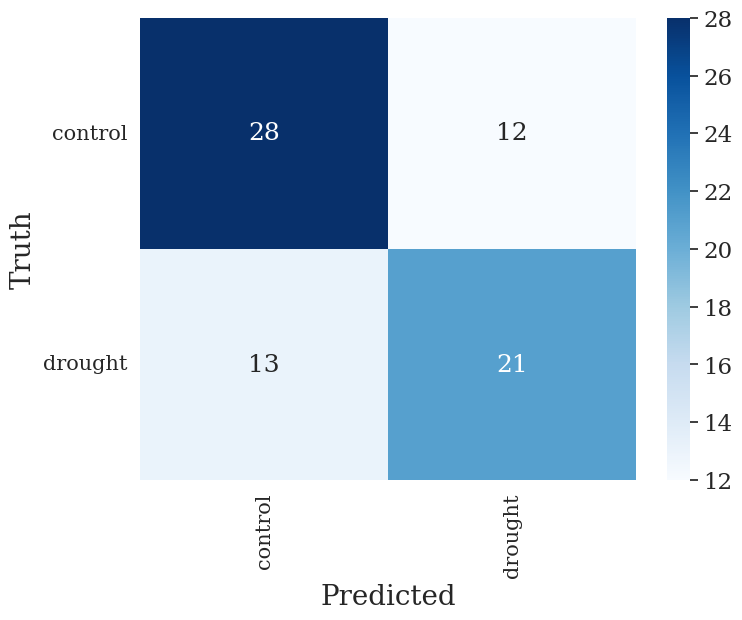

In [ ]:
# Create and fit the MLP model with best parameters
mlp = MLPClassifier(**rnd_search.best_params_, random_state=42)
mlp.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(mlp, X_train, y_train, cv=5)

# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')

print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

print('\n\n Test Set: \n\n')
y_test_pred = mlp.predict(X_test)

# print metrics
print("Test: Accuracy:", accuracy_score(y_test, y_test_pred))
print("Test: Recall:", recall_score(y_test, y_test_pred, pos_label='drought'))
print("Test: Precision:", precision_score(y_test, y_test_pred, pos_label='drought'))
print("Test: F1 Score:", f1_score(y_test, y_test_pred, pos_label='drought'))

###### Confusion matrix ######
# labels for confusion matrix:
unique_label = np.unique([y_test, y_test_pred])

# df of confusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])

plt.figure(figsize=(8,6))
sns.heatmap(cmtx, annot=True, fmt='d', annot_kws={"size": 18}, cmap="Blues")
plt.xlabel('Predicted', fontsize=20)
plt.ylabel('Truth', fontsize=20)
plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15, rotation=0)
plt.show()

### Logistic regression

In [ ]:
param_distribs = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'C': reciprocal(1, 1000),
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'tol': expon(scale=1e-4),
    'fit_intercept': [False, True],
    'intercept_scaling': expon(scale=1.0),
    'max_iter': [100, 200, 300, 400, 500, 600, 700]
}

logreg_clf = LogisticRegression()
rnd_search = RandomizedSearchCV(logreg_clf, param_distributions=param_distribs,
                                n_iter=100, cv=5, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=lbfgs, tol=1.6959629191460517e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=lbfgs, tol=1.6959629191460517e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=lbfgs, tol=1.6959629191460517e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=lbfgs, tol=1.6959629191460517e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=lbfgs, tol=1.6959629191460517e-05; total time=   0.0s
[CV] END C=1.4936568554617629, fit_intercept=True, i

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/py

[CV] END C=4.928122297695502, fit_intercept=True, intercept_scaling=0.5800908425853983, max_iter=700, penalty=none, solver=saga, tol=0.00017909292843438935; total time=   0.1s
[CV] END C=4.928122297695502, fit_intercept=True, intercept_scaling=0.5800908425853983, max_iter=700, penalty=none, solver=saga, tol=0.00017909292843438935; total time=   0.1s
[CV] END C=4.928122297695502, fit_intercept=True, intercept_scaling=0.5800908425853983, max_iter=700, penalty=none, solver=saga, tol=0.00017909292843438935; total time=   0.1s
[CV] END C=4.928122297695502, fit_intercept=True, intercept_scaling=0.5800908425853983, max_iter=700, penalty=none, solver=saga, tol=0.00017909292843438935; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=4.928122297695502, fit_intercept=True, intercept_scaling=0.5800908425853983, max_iter=700, penalty=none, solver=saga, tol=0.00017909292843438935; total time=   0.1s
[CV] END C=3.312027701465945, fit_intercept=False, intercept_scaling=0.2994577768406861, max_iter=400, penalty=l2, solver=lbfgs, tol=8.38636245624803e-05; total time=   0.0s
[CV] END C=3.312027701465945, fit_intercept=False, intercept_scaling=0.2994577768406861, max_iter=400, penalty=l2, solver=lbfgs, tol=8.38636245624803e-05; total time=   0.0s
[CV] END C=3.312027701465945, fit_intercept=False, intercept_scaling=0.2994577768406861, max_iter=400, penalty=l2, solver=lbfgs, tol=8.38636245624803e-05; total time=   0.0s
[CV] END C=3.312027701465945, fit_intercept=False, intercept_scaling=0.2994577768406861, max_iter=400, penalty=l2, solver=lbfgs, tol=8.38636245624803e-05; total time=   0.0s
[CV] END C=3.312027701465945, fit_intercept=False, intercept_scaling=0.2994577768406861, max_iter=400, penalty=l2, solver=lbfgs,

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been depre

[CV] END C=6.516990611177173, fit_intercept=False, intercept_scaling=0.8837053630081474, max_iter=100, penalty=none, solver=sag, tol=7.82407083207746e-05; total time=   0.0s
[CV] END C=6.516990611177173, fit_intercept=False, intercept_scaling=0.8837053630081474, max_iter=100, penalty=none, solver=sag, tol=7.82407083207746e-05; total time=   0.0s
[CV] END C=6.516990611177173, fit_intercept=False, intercept_scaling=0.8837053630081474, max_iter=100, penalty=none, solver=sag, tol=7.82407083207746e-05; total time=   0.0s
[CV] END C=6.516990611177173, fit_intercept=False, intercept_scaling=0.8837053630081474, max_iter=100, penalty=none, solver=sag, tol=7.82407083207746e-05; total time=   0.0s
[CV] END C=6.516990611177173, fit_intercept=False, intercept_scaling=0.8837053630081474, max_iter=100, penalty=none, solver=sag, tol=7.82407083207746e-05; total time=   0.0s
[CV] END C=2.6471141828218157, fit_intercept=False, intercept_scaling=0.1806432927428257, max_iter=100, penalty=elasticnet, solver

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/py

[CV] END C=65.74760303457337, fit_intercept=True, intercept_scaling=0.4438926724162325, max_iter=100, penalty=none, solver=newton-cg, tol=9.763011917123741e-05; total time=   0.0s
[CV] END C=65.74760303457337, fit_intercept=True, intercept_scaling=0.4438926724162325, max_iter=100, penalty=none, solver=newton-cg, tol=9.763011917123741e-05; total time=   0.0s
[CV] END C=65.74760303457337, fit_intercept=True, intercept_scaling=0.4438926724162325, max_iter=100, penalty=none, solver=newton-cg, tol=9.763011917123741e-05; total time=   0.0s
[CV] END C=9.833181933644886, fit_intercept=True, intercept_scaling=0.4633351167983427, max_iter=600, penalty=none, solver=saga, tol=0.00013078757839577409; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour

[CV] END C=9.833181933644886, fit_intercept=True, intercept_scaling=0.4633351167983427, max_iter=600, penalty=none, solver=saga, tol=0.00013078757839577409; total time=   0.1s
[CV] END C=9.833181933644886, fit_intercept=True, intercept_scaling=0.4633351167983427, max_iter=600, penalty=none, solver=saga, tol=0.00013078757839577409; total time=   0.0s
[CV] END C=9.833181933644886, fit_intercept=True, intercept_scaling=0.4633351167983427, max_iter=600, penalty=none, solver=saga, tol=0.00013078757839577409; total time=   0.0s
[CV] END C=9.833181933644886, fit_intercept=True, intercept_scaling=0.4633351167983427, max_iter=600, penalty=none, solver=saga, tol=0.00013078757839577409; total time=   0.1s
[CV] END C=81.78476574339537, fit_intercept=False, intercept_scaling=0.8238105204914145, max_iter=300, penalty=l1, solver=liblinear, tol=0.00014303927530768642; total time=   0.2s
[CV] END C=81.78476574339537, fit_intercept=False, intercept_scaling=0.8238105204914145, max_iter=300, penalty=l1, s

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/py

[CV] END C=2.107047280657823, fit_intercept=False, intercept_scaling=2.261093840942367, max_iter=100, penalty=none, solver=saga, tol=7.104371771341901e-05; total time=   0.0s
[CV] END C=2.107047280657823, fit_intercept=False, intercept_scaling=2.261093840942367, max_iter=100, penalty=none, solver=saga, tol=7.104371771341901e-05; total time=   0.0s
[CV] END C=2.107047280657823, fit_intercept=False, intercept_scaling=2.261093840942367, max_iter=100, penalty=none, solver=saga, tol=7.104371771341901e-05; total time=   0.0s
[CV] END C=528.0796376895362, fit_intercept=False, intercept_scaling=0.9273956116389813, max_iter=700, penalty=elasticnet, solver=saga, tol=2.5980515691739405e-05; total time=   0.0s
[CV] END C=528.0796376895362, fit_intercept=False, intercept_scaling=0.9273956116389813, max_iter=700, penalty=elasticnet, solver=saga, tol=2.5980515691739405e-05; total time=   0.0s
[CV] END C=528.0796376895362, fit_intercept=False, intercept_scaling=0.9273956116389813, max_iter=700, penalt

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/py

[CV] END C=79.47147424653741, fit_intercept=True, intercept_scaling=0.6097891815881622, max_iter=400, penalty=none, solver=sag, tol=0.0002230813405235561; total time=   0.0s
[CV] END C=79.47147424653741, fit_intercept=True, intercept_scaling=0.6097891815881622, max_iter=400, penalty=none, solver=sag, tol=0.0002230813405235561; total time=   0.0s
[CV] END C=79.47147424653741, fit_intercept=True, intercept_scaling=0.6097891815881622, max_iter=400, penalty=none, solver=sag, tol=0.0002230813405235561; total time=   0.0s
[CV] END C=79.47147424653741, fit_intercept=True, intercept_scaling=0.6097891815881622, max_iter=400, penalty=none, solver=sag, tol=0.0002230813405235561; total time=   0.0s
[CV] END C=41.49795789891588, fit_intercept=True, intercept_scaling=0.1302088665616574, max_iter=100, penalty=elasticnet, solver=newton-cg, tol=3.1763590853048414e-05; total time=   0.0s
[CV] END C=41.49795789891588, fit_intercept=True, intercept_scaling=0.1302088665616574, max_iter=100, penalty=elastic

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/py

[CV] END C=248.33353742622597, fit_intercept=False, intercept_scaling=0.3868102936673966, max_iter=600, penalty=none, solver=saga, tol=0.00019544582135766326; total time=   0.1s
[CV] END C=248.33353742622597, fit_intercept=False, intercept_scaling=0.3868102936673966, max_iter=600, penalty=none, solver=saga, tol=0.00019544582135766326; total time=   0.0s
[CV] END C=248.33353742622597, fit_intercept=False, intercept_scaling=0.3868102936673966, max_iter=600, penalty=none, solver=saga, tol=0.00019544582135766326; total time=   0.0s
[CV] END C=248.33353742622597, fit_intercept=False, intercept_scaling=0.3868102936673966, max_iter=600, penalty=none, solver=saga, tol=0.00019544582135766326; total time=   0.1s
[CV] END C=9.50334981101655, fit_intercept=True, intercept_scaling=0.01672694755847062, max_iter=300, penalty=elasticnet, solver=liblinear, tol=4.2873269199544655e-05; total time=   0.0s
[CV] END C=9.50334981101655, fit_intercept=True, intercept_scaling=0.01672694755847062, max_iter=300,

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.9432543711278847, fit_intercept=False, intercept_scaling=1.174212527567719, max_iter=700, penalty=l2, solver=newton-cg, tol=0.00011260557913853866; total time=   0.0s
[CV] END C=1.9432543711278847, fit_intercept=False, intercept_scaling=1.174212527567719, max_iter=700, penalty=l2, solver=newton-cg, tol=0.00011260557913853866; total time=   0.0s
[CV] END C=1.9432543711278847, fit_intercept=False, intercept_scaling=1.174212527567719, max_iter=700, penalty=l2, solver=newton-cg, tol=0.00011260557913853866; total time=   0.0s
[CV] END C=160.56406613556388, fit_intercept=True, intercept_scaling=2.5861903971507236, max_iter=600, penalty=l2, solver=liblinear, tol=2.5948344634807654e-05; total time=   0.0s
[CV] END C=160.56406613556388, fit_intercept=True, intercept_scaling=2.5861903971507236, max_iter=600, penalty=l2, solver=liblinear, tol=2.5948344634807654e-05; total time=   0.0s
[CV] END C=160.56406613556388, fit_intercept=True, intercept_scaling=2.5861903971507236, max_iter=60

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour

[CV] END C=126.20410750629124, fit_intercept=True, intercept_scaling=2.2740973491072523, max_iter=600, penalty=none, solver=newton-cg, tol=0.0001027310693567705; total time=   0.0s
[CV] END C=126.20410750629124, fit_intercept=True, intercept_scaling=2.2740973491072523, max_iter=600, penalty=none, solver=newton-cg, tol=0.0001027310693567705; total time=   0.0s
[CV] END C=126.20410750629124, fit_intercept=True, intercept_scaling=2.2740973491072523, max_iter=600, penalty=none, solver=newton-cg, tol=0.0001027310693567705; total time=   0.0s
[CV] END C=126.20410750629124, fit_intercept=True, intercept_scaling=2.2740973491072523, max_iter=600, penalty=none, solver=newton-cg, tol=0.0001027310693567705; total time=   0.0s
[CV] END C=1.7882156647879481, fit_intercept=True, intercept_scaling=1.5387029311670475, max_iter=400, penalty=l2, solver=liblinear, tol=4.6566547913946975e-05; total time=   0.0s
[CV] END C=1.7882156647879481, fit_intercept=True, intercept_scaling=1.5387029311670475, max_ite

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been depre

[CV] END C=90.34076805537768, fit_intercept=False, intercept_scaling=0.19349404041660798, max_iter=400, penalty=l1, solver=saga, tol=1.9701624792324706e-05; total time=   0.0s
[CV] END C=90.34076805537768, fit_intercept=False, intercept_scaling=0.19349404041660798, max_iter=400, penalty=l1, solver=saga, tol=1.9701624792324706e-05; total time=   0.0s
[CV] END C=12.572057357983692, fit_intercept=True, intercept_scaling=1.891956077463401, max_iter=100, penalty=none, solver=newton-cg, tol=7.820663337722502e-05; total time=   0.0s
[CV] END C=12.572057357983692, fit_intercept=True, intercept_scaling=1.891956077463401, max_iter=100, penalty=none, solver=newton-cg, tol=7.820663337722502e-05; total time=   0.0s
[CV] END C=12.572057357983692, fit_intercept=True, intercept_scaling=1.891956077463401, max_iter=100, penalty=none, solver=newton-cg, tol=7.820663337722502e-05; total time=   0.0s
[CV] END C=12.572057357983692, fit_intercept=True, intercept_scaling=1.891956077463401, max_iter=100, penalt

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=33.6079661042078, fit_intercept=True, intercept_scaling=0.30816014785883117, max_iter=600, penalty=l2, solver=saga, tol=6.669769342753803e-05; total time=   0.1s
[CV] END C=33.6079661042078, fit_intercept=True, intercept_scaling=0.30816014785883117, max_iter=600, penalty=l2, solver=saga, tol=6.669769342753803e-05; total time=   0.1s
[CV] END C=33.6079661042078, fit_intercept=True, intercept_scaling=0.30816014785883117, max_iter=600, penalty=l2, solver=saga, tol=6.669769342753803e-05; total time=   0.1s
[CV] END C=33.6079661042078, fit_intercept=True, intercept_scaling=0.30816014785883117, max_iter=600, penalty=l2, solver=saga, tol=6.669769342753803e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=33.6079661042078, fit_intercept=True, intercept_scaling=0.30816014785883117, max_iter=600, penalty=l2, solver=saga, tol=6.669769342753803e-05; total time=   0.1s
[CV] END C=522.752794541886, fit_intercept=False, intercept_scaling=1.5838252526883998, max_iter=600, penalty=l1, solver=sag, tol=0.00011054075029197247; total time=   0.0s
[CV] END C=522.752794541886, fit_intercept=False, intercept_scaling=1.5838252526883998, max_iter=600, penalty=l1, solver=sag, tol=0.00011054075029197247; total time=   0.0s
[CV] END C=522.752794541886, fit_intercept=False, intercept_scaling=1.5838252526883998, max_iter=600, penalty=l1, solver=sag, tol=0.00011054075029197247; total time=   0.0s
[CV] END C=522.752794541886, fit_intercept=False, intercept_scaling=1.5838252526883998, max_iter=600, penalty=l1, solver=sag, tol=0.00011054075029197247; total time=   0.0s
[CV] END C=522.752794541886, fit_intercept=False, intercept_scaling=1.5838252526883998, max_iter=600, penalty=l1, solver=sag, tol=0.000

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been depre

[CV] END C=175.04766488065064, fit_intercept=False, intercept_scaling=2.6355234573318898, max_iter=100, penalty=l2, solver=saga, tol=8.493156561671791e-05; total time=   0.0s
[CV] END C=175.04766488065064, fit_intercept=False, intercept_scaling=2.6355234573318898, max_iter=100, penalty=l2, solver=saga, tol=8.493156561671791e-05; total time=   0.0s
[CV] END C=175.04766488065064, fit_intercept=False, intercept_scaling=2.6355234573318898, max_iter=100, penalty=l2, solver=saga, tol=8.493156561671791e-05; total time=   0.0s
[CV] END C=175.04766488065064, fit_intercept=False, intercept_scaling=2.6355234573318898, max_iter=100, penalty=l2, solver=saga, tol=8.493156561671791e-05; total time=   0.0s
[CV] END C=175.04766488065064, fit_intercept=False, intercept_scaling=2.6355234573318898, max_iter=100, penalty=l2, solver=saga, tol=8.493156561671791e-05; total time=   0.0s
[CV] END C=872.9608177827158, fit_intercept=True, intercept_scaling=0.3487760681721603, max_iter=500, penalty=none, solver=ne

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been depre

[CV] END C=18.16948297499714, fit_intercept=True, intercept_scaling=2.017950047367915, max_iter=500, penalty=none, solver=lbfgs, tol=5.198350817616321e-07; total time=   0.1s
[CV] END C=18.16948297499714, fit_intercept=True, intercept_scaling=2.017950047367915, max_iter=500, penalty=none, solver=lbfgs, tol=5.198350817616321e-07; total time=   0.0s
[CV] END C=18.16948297499714, fit_intercept=True, intercept_scaling=2.017950047367915, max_iter=500, penalty=none, solver=lbfgs, tol=5.198350817616321e-07; total time=   0.1s
[CV] END C=18.16948297499714, fit_intercept=True, intercept_scaling=2.017950047367915, max_iter=500, penalty=none, solver=lbfgs, tol=5.198350817616321e-07; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour

[CV] END C=18.16948297499714, fit_intercept=True, intercept_scaling=2.017950047367915, max_iter=500, penalty=none, solver=lbfgs, tol=5.198350817616321e-07; total time=   0.1s
[CV] END C=76.50384182489971, fit_intercept=True, intercept_scaling=1.0497190748878003, max_iter=600, penalty=none, solver=sag, tol=0.00021769851244386477; total time=   0.1s
[CV] END C=76.50384182489971, fit_intercept=True, intercept_scaling=1.0497190748878003, max_iter=600, penalty=none, solver=sag, tol=0.00021769851244386477; total time=   0.0s
[CV] END C=76.50384182489971, fit_intercept=True, intercept_scaling=1.0497190748878003, max_iter=600, penalty=none, solver=sag, tol=0.00021769851244386477; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/

[CV] END C=76.50384182489971, fit_intercept=True, intercept_scaling=1.0497190748878003, max_iter=600, penalty=none, solver=sag, tol=0.00021769851244386477; total time=   0.1s
[CV] END C=76.50384182489971, fit_intercept=True, intercept_scaling=1.0497190748878003, max_iter=600, penalty=none, solver=sag, tol=0.00021769851244386477; total time=   0.1s
[CV] END C=1.2101809594595496, fit_intercept=True, intercept_scaling=0.09869603918736056, max_iter=700, penalty=elasticnet, solver=liblinear, tol=6.266069481821097e-05; total time=   0.0s
[CV] END C=1.2101809594595496, fit_intercept=True, intercept_scaling=0.09869603918736056, max_iter=700, penalty=elasticnet, solver=liblinear, tol=6.266069481821097e-05; total time=   0.0s
[CV] END C=1.2101809594595496, fit_intercept=True, intercept_scaling=0.09869603918736056, max_iter=700, penalty=elasticnet, solver=liblinear, tol=6.266069481821097e-05; total time=   0.0s
[CV] END C=1.2101809594595496, fit_intercept=True, intercept_scaling=0.098696039187360

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been depre

[CV] END C=293.6308497763011, fit_intercept=True, intercept_scaling=0.7702062692473535, max_iter=500, penalty=l1, solver=saga, tol=3.168265649239175e-05; total time=   0.1s
[CV] END C=786.6028057531652, fit_intercept=False, intercept_scaling=0.08921102898989729, max_iter=500, penalty=none, solver=sag, tol=5.299301333993761e-05; total time=   0.1s
[CV] END C=786.6028057531652, fit_intercept=False, intercept_scaling=0.08921102898989729, max_iter=500, penalty=none, solver=sag, tol=5.299301333993761e-05; total time=   0.1s
[CV] END C=786.6028057531652, fit_intercept=False, intercept_scaling=0.08921102898989729, max_iter=500, penalty=none, solver=sag, tol=5.299301333993761e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/

[CV] END C=786.6028057531652, fit_intercept=False, intercept_scaling=0.08921102898989729, max_iter=500, penalty=none, solver=sag, tol=5.299301333993761e-05; total time=   0.1s
[CV] END C=786.6028057531652, fit_intercept=False, intercept_scaling=0.08921102898989729, max_iter=500, penalty=none, solver=sag, tol=5.299301333993761e-05; total time=   0.0s
[CV] END C=125.46905652785969, fit_intercept=True, intercept_scaling=1.2949605629166843, max_iter=500, penalty=l2, solver=sag, tol=0.00012538464198467018; total time=   0.1s
[CV] END C=125.46905652785969, fit_intercept=True, intercept_scaling=1.2949605629166843, max_iter=500, penalty=l2, solver=sag, tol=0.00012538464198467018; total time=   0.1s

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(



[CV] END C=125.46905652785969, fit_intercept=True, intercept_scaling=1.2949605629166843, max_iter=500, penalty=l2, solver=sag, tol=0.00012538464198467018; total time=   0.0s
[CV] END C=125.46905652785969, fit_intercept=True, intercept_scaling=1.2949605629166843, max_iter=500, penalty=l2, solver=sag, tol=0.00012538464198467018; total time=   0.0s
[CV] END C=125.46905652785969, fit_intercept=True, intercept_scaling=1.2949605629166843, max_iter=500, penalty=l2, solver=sag, tol=0.00012538464198467018; total time=   0.1s
[CV] END C=1.328013684703794, fit_intercept=True, intercept_scaling=0.3158514654361373, max_iter=400, penalty=l2, solver=lbfgs, tol=2.567760954147438e-06; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(



[CV] END C=1.328013684703794, fit_intercept=True, intercept_scaling=0.3158514654361373, max_iter=400, penalty=l2, solver=lbfgs, tol=2.567760954147438e-06; total time=   0.0s
[CV] END C=1.328013684703794, fit_intercept=True, intercept_scaling=0.3158514654361373, max_iter=400, penalty=l2, solver=lbfgs, tol=2.567760954147438e-06; total time=   0.0s
[CV] END C=1.328013684703794, fit_intercept=True, intercept_scaling=0.3158514654361373, max_iter=400, penalty=l2, solver=lbfgs, tol=2.567760954147438e-06; total time=   0.0s
[CV] END C=1.328013684703794, fit_intercept=True, intercept_scaling=0.3158514654361373, max_iter=400, penalty=l2, solver=lbfgs, tol=2.567760954147438e-06; total time=   0.0s
[CV] END C=772.5831714587854, fit_intercept=False, intercept_scaling=0.559166220151353, max_iter=400, penalty=l1, solver=newton-cg, tol=1.9030653614210873e-05; total time=   0.0s
[CV] END C=772.5831714587854, fit_intercept=False, intercept_scaling=0.559166220151353, max_iter=400, penalty=l1, solver=new

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour


[CV] END C=2.9465317694630833, fit_intercept=True, intercept_scaling=0.2741570942534817, max_iter=600, penalty=none, solver=newton-cg, tol=0.00010793903496967986; total time=   0.0s
[CV] END C=2.9465317694630833, fit_intercept=True, intercept_scaling=0.2741570942534817, max_iter=600, penalty=none, solver=newton-cg, tol=0.00010793903496967986; total time=   0.0s
[CV] END C=2.9465317694630833, fit_intercept=True, intercept_scaling=0.2741570942534817, max_iter=600, penalty=none, solver=newton-cg, tol=0.00010793903496967986; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=6.915151366011635, fit_intercept=True, intercept_scaling=0.7271099563716479, max_iter=700, penalty=l1, solver=saga, tol=5.440378655320514e-05; total time=   0.1s
[CV] END C=6.915151366011635, fit_intercept=True, intercept_scaling=0.7271099563716479, max_iter=700, penalty=l1, solver=saga, tol=5.440378655320514e-05; total time=   0.1s
[CV] END C=6.915151366011635, fit_intercept=True, intercept_scaling=0.7271099563716479, max_iter=700, penalty=l1, solver=saga, tol=5.440378655320514e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=6.915151366011635, fit_intercept=True, intercept_scaling=0.7271099563716479, max_iter=700, penalty=l1, solver=saga, tol=5.440378655320514e-05; total time=   0.1s
[CV] END C=6.915151366011635, fit_intercept=True, intercept_scaling=0.7271099563716479, max_iter=700, penalty=l1, solver=saga, tol=5.440378655320514e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=600, penalty=l1, solver=saga, tol=1.2338039223997605e-05; total time=   0.1s
[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=600, penalty=l1, solver=saga, tol=1.2338039223997605e-05; total time=   0.1s
[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=600, penalty=l1, solver=saga, tol=1.2338039223997605e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.

[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=600, penalty=l1, solver=saga, tol=1.2338039223997605e-05; total time=   0.1s
[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=600, penalty=l1, solver=saga, tol=1.2338039223997605e-05; total time=   0.1s
[CV] END C=1.374067052111572, fit_intercept=False, intercept_scaling=0.373114056454012, max_iter=600, penalty=none, solver=saga, tol=6.427845944128924e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py

[CV] END C=1.374067052111572, fit_intercept=False, intercept_scaling=0.373114056454012, max_iter=600, penalty=none, solver=saga, tol=6.427845944128924e-05; total time=   0.1s
[CV] END C=1.374067052111572, fit_intercept=False, intercept_scaling=0.373114056454012, max_iter=600, penalty=none, solver=saga, tol=6.427845944128924e-05; total time=   0.1s
[CV] END C=1.374067052111572, fit_intercept=False, intercept_scaling=0.373114056454012, max_iter=600, penalty=none, solver=saga, tol=6.427845944128924e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:35

[CV] END C=1.374067052111572, fit_intercept=False, intercept_scaling=0.373114056454012, max_iter=600, penalty=none, solver=saga, tol=6.427845944128924e-05; total time=   0.1s
[CV] END C=1.965633213961229, fit_intercept=True, intercept_scaling=1.644614295590405, max_iter=400, penalty=l1, solver=saga, tol=5.083366145832069e-05; total time=   0.1s
[CV] END C=1.965633213961229, fit_intercept=True, intercept_scaling=1.644614295590405, max_iter=400, penalty=l1, solver=saga, tol=5.083366145832069e-05; total time=   0.0s
[CV] END C=1.965633213961229, fit_intercept=True, intercept_scaling=1.644614295590405, max_iter=400, penalty=l1, solver=saga, tol=5.083366145832069e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.

[CV] END C=1.965633213961229, fit_intercept=True, intercept_scaling=1.644614295590405, max_iter=400, penalty=l1, solver=saga, tol=5.083366145832069e-05; total time=   0.1s
[CV] END C=1.965633213961229, fit_intercept=True, intercept_scaling=1.644614295590405, max_iter=400, penalty=l1, solver=saga, tol=5.083366145832069e-05; total time=   0.0s
[CV] END C=70.39637468468568, fit_intercept=False, intercept_scaling=2.177543021763462, max_iter=400, penalty=elasticnet, solver=lbfgs, tol=9.831249947827286e-05; total time=   0.0s
[CV] END C=70.39637468468568, fit_intercept=False, intercept_scaling=2.177543021763462, max_iter=400, penalty=elasticnet, solver=lbfgs, tol=9.831249947827286e-05; total time=   0.0s
[CV] END C=70.39637468468568, fit_intercept=False, intercept_scaling=2.177543021763462, max_iter=400, penalty=elasticnet, solver=lbfgs, tol=9.831249947827286e-05; total time=   0.0s
[CV] END C=70.39637468468568, fit_intercept=False, intercept_scaling=2.177543021763462, max_iter=400, penalty=

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour

[CV] END C=57.19087535188472, fit_intercept=False, intercept_scaling=1.614195686122846, max_iter=400, penalty=l2, solver=liblinear, tol=0.0001030827157844982; total time=   0.0s
[CV] END C=57.19087535188472, fit_intercept=False, intercept_scaling=1.614195686122846, max_iter=400, penalty=l2, solver=liblinear, tol=0.0001030827157844982; total time=   0.0s
[CV] END C=57.19087535188472, fit_intercept=False, intercept_scaling=1.614195686122846, max_iter=400, penalty=l2, solver=liblinear, tol=0.0001030827157844982; total time=   0.0s
[CV] END C=23.700563480372544, fit_intercept=False, intercept_scaling=1.718357396736351, max_iter=400, penalty=elasticnet, solver=newton-cg, tol=0.0003249091861506754; total time=   0.0s
[CV] END C=23.700563480372544, fit_intercept=False, intercept_scaling=1.718357396736351, max_iter=400, penalty=elasticnet, solver=newton-cg, tol=0.0003249091861506754; total time=   0.0s
[CV] END C=23.700563480372544, fit_intercept=False, intercept_scaling=1.718357396736351, max

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/py

[CV] END C=178.58470261618834, fit_intercept=True, intercept_scaling=0.8578439510282166, max_iter=300, penalty=none, solver=sag, tol=4.652439119617327e-05; total time=   0.0s
[CV] END C=178.58470261618834, fit_intercept=True, intercept_scaling=0.8578439510282166, max_iter=300, penalty=none, solver=sag, tol=4.652439119617327e-05; total time=   0.0s
[CV] END C=213.42185100977318, fit_intercept=True, intercept_scaling=2.018283281264657, max_iter=500, penalty=none, solver=newton-cg, tol=0.000113894933798157; total time=   0.0s
[CV] END C=213.42185100977318, fit_intercept=True, intercept_scaling=2.018283281264657, max_iter=500, penalty=none, solver=newton-cg, tol=0.000113894933798157; total time=   0.0s
[CV] END C=213.42185100977318, fit_intercept=True, intercept_scaling=2.018283281264657, max_iter=500, penalty=none, solver=newton-cg, tol=0.000113894933798157; total time=   0.0s
[CV] END C=213.42185100977318, fit_intercept=True, intercept_scaling=2.018283281264657, max_iter=500, penalty=non

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour

[CV] END C=9.12323376793708, fit_intercept=False, intercept_scaling=0.10534372375643704, max_iter=400, penalty=none, solver=saga, tol=0.0002357907296962454; total time=   0.0s
[CV] END C=9.12323376793708, fit_intercept=False, intercept_scaling=0.10534372375643704, max_iter=400, penalty=none, solver=saga, tol=0.0002357907296962454; total time=   0.0s
[CV] END C=9.12323376793708, fit_intercept=False, intercept_scaling=0.10534372375643704, max_iter=400, penalty=none, solver=saga, tol=0.0002357907296962454; total time=   0.0s
[CV] END C=9.12323376793708, fit_intercept=False, intercept_scaling=0.10534372375643704, max_iter=400, penalty=none, solver=saga, tol=0.0002357907296962454; total time=   0.0s
[CV] END C=9.12323376793708, fit_intercept=False, intercept_scaling=0.10534372375643704, max_iter=400, penalty=none, solver=saga, tol=0.0002357907296962454; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/

[CV] END C=1.8787112256023886, fit_intercept=False, intercept_scaling=3.1419352729803167, max_iter=700, penalty=none, solver=sag, tol=8.519972910552638e-05; total time=   0.1s
[CV] END C=1.8787112256023886, fit_intercept=False, intercept_scaling=3.1419352729803167, max_iter=700, penalty=none, solver=sag, tol=8.519972910552638e-05; total time=   0.0s
[CV] END C=1.8787112256023886, fit_intercept=False, intercept_scaling=3.1419352729803167, max_iter=700, penalty=none, solver=sag, tol=8.519972910552638e-05; total time=   0.1s
[CV] END C=1.8787112256023886, fit_intercept=False, intercept_scaling=3.1419352729803167, max_iter=700, penalty=none, solver=sag, tol=8.519972910552638e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/

[CV] END C=1.8787112256023886, fit_intercept=False, intercept_scaling=3.1419352729803167, max_iter=700, penalty=none, solver=sag, tol=8.519972910552638e-05; total time=   0.0s
[CV] END C=78.61612553123295, fit_intercept=False, intercept_scaling=0.09618512444110473, max_iter=400, penalty=l1, solver=sag, tol=0.00011163235799285063; total time=   0.0s
[CV] END C=78.61612553123295, fit_intercept=False, intercept_scaling=0.09618512444110473, max_iter=400, penalty=l1, solver=sag, tol=0.00011163235799285063; total time=   0.0s
[CV] END C=78.61612553123295, fit_intercept=False, intercept_scaling=0.09618512444110473, max_iter=400, penalty=l1, solver=sag, tol=0.00011163235799285063; total time=   0.0s
[CV] END C=78.61612553123295, fit_intercept=False, intercept_scaling=0.09618512444110473, max_iter=400, penalty=l1, solver=sag, tol=0.00011163235799285063; total time=   0.0s
[CV] END C=78.61612553123295, fit_intercept=False, intercept_scaling=0.09618512444110473, max_iter=400, penalty=l1, solver=s

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logisti

[CV] END C=180.76884714446047, fit_intercept=False, intercept_scaling=1.5200362923458923, max_iter=700, penalty=l1, solver=saga, tol=6.82049596573356e-05; total time=   0.1s
[CV] END C=180.76884714446047, fit_intercept=False, intercept_scaling=1.5200362923458923, max_iter=700, penalty=l1, solver=saga, tol=6.82049596573356e-05; total time=   0.0s
[CV] END C=1.4882513324386766, fit_intercept=False, intercept_scaling=0.057492633461122204, max_iter=300, penalty=elasticnet, solver=saga, tol=4.321916194678851e-05; total time=   0.0s
[CV] END C=1.4882513324386766, fit_intercept=False, intercept_scaling=0.057492633461122204, max_iter=300, penalty=elasticnet, solver=saga, tol=4.321916194678851e-05; total time=   0.0s
[CV] END C=1.4882513324386766, fit_intercept=False, intercept_scaling=0.057492633461122204, max_iter=300, penalty=elasticnet, solver=saga, tol=4.321916194678851e-05; total time=   0.0s
[CV] END C=1.4882513324386766, fit_intercept=False, intercept_scaling=0.057492633461122204, max_i

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour

[CV] END C=2.24492093143338, fit_intercept=True, intercept_scaling=1.1648482822573274, max_iter=200, penalty=none, solver=newton-cg, tol=1.0660871224538545e-05; total time=   0.0s
[CV] END C=2.24492093143338, fit_intercept=True, intercept_scaling=1.1648482822573274, max_iter=200, penalty=none, solver=newton-cg, tol=1.0660871224538545e-05; total time=   0.0s
[CV] END C=1.7878061147648463, fit_intercept=False, intercept_scaling=0.2517699260241503, max_iter=100, penalty=l2, solver=liblinear, tol=0.0001224999753130005; total time=   0.0s
[CV] END C=1.7878061147648463, fit_intercept=False, intercept_scaling=0.2517699260241503, max_iter=100, penalty=l2, solver=liblinear, tol=0.0001224999753130005; total time=   0.0s
[CV] END C=1.7878061147648463, fit_intercept=False, intercept_scaling=0.2517699260241503, max_iter=100, penalty=l2, solver=liblinear, tol=0.0001224999753130005; total time=   0.0s
[CV] END C=1.7878061147648463, fit_intercept=False, intercept_scaling=0.2517699260241503, max_iter=1

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/py

[CV] END C=16.428815800640646, fit_intercept=True, intercept_scaling=0.057950431065925775, max_iter=400, penalty=none, solver=saga, tol=0.00017304217946449173; total time=   0.0s
[CV] END C=16.428815800640646, fit_intercept=True, intercept_scaling=0.057950431065925775, max_iter=400, penalty=none, solver=saga, tol=0.00017304217946449173; total time=   0.0s
[CV] END C=16.428815800640646, fit_intercept=True, intercept_scaling=0.057950431065925775, max_iter=400, penalty=none, solver=saga, tol=0.00017304217946449173; total time=   0.1s
[CV] END C=170.85786327350667, fit_intercept=False, intercept_scaling=0.8755537772028685, max_iter=600, penalty=l1, solver=sag, tol=3.364691574205587e-05; total time=   0.0s
[CV] END C=170.85786327350667, fit_intercept=False, intercept_scaling=0.8755537772028685, max_iter=600, penalty=l1, solver=sag, tol=3.364691574205587e-05; total time=   0.0s
[CV] END C=170.85786327350667, fit_intercept=False, intercept_scaling=0.8755537772028685, max_iter=600, penalty=l1,

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/py

[CV] END C=403.4571204613131, fit_intercept=True, intercept_scaling=0.573296650943433, max_iter=200, penalty=none, solver=saga, tol=0.00035025269228794817; total time=   0.0s
[CV] END C=403.4571204613131, fit_intercept=True, intercept_scaling=0.573296650943433, max_iter=200, penalty=none, solver=saga, tol=0.00035025269228794817; total time=   0.0s
[CV] END C=403.4571204613131, fit_intercept=True, intercept_scaling=0.573296650943433, max_iter=200, penalty=none, solver=saga, tol=0.00035025269228794817; total time=   0.0s
[CV] END C=1.3473478567267632, fit_intercept=False, intercept_scaling=0.0443707665719153, max_iter=500, penalty=elasticnet, solver=sag, tol=7.666137595445494e-06; total time=   0.0s
[CV] END C=1.3473478567267632, fit_intercept=False, intercept_scaling=0.0443707665719153, max_iter=500, penalty=elasticnet, solver=sag, tol=7.666137595445494e-06; total time=   0.0s
[CV] END C=1.3473478567267632, fit_intercept=False, intercept_scaling=0.0443707665719153, max_iter=500, penalty

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour

[CV] END C=23.100596499042986, fit_intercept=False, intercept_scaling=1.1937751636729081, max_iter=300, penalty=none, solver=newton-cg, tol=0.0002468100763167833; total time=   0.0s
[CV] END C=23.100596499042986, fit_intercept=False, intercept_scaling=1.1937751636729081, max_iter=300, penalty=none, solver=newton-cg, tol=0.0002468100763167833; total time=   0.0s
[CV] END C=751.8084838209405, fit_intercept=True, intercept_scaling=2.209675828453486, max_iter=400, penalty=none, solver=sag, tol=4.0896130990072294e-05; total time=   0.0s
[CV] END C=751.8084838209405, fit_intercept=True, intercept_scaling=2.209675828453486, max_iter=400, penalty=none, solver=sag, tol=4.0896130990072294e-05; total time=   0.0s
[CV] END C=751.8084838209405, fit_intercept=True, intercept_scaling=2.209675828453486, max_iter=400, penalty=none, solver=sag, tol=4.0896130990072294e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/

[CV] END C=751.8084838209405, fit_intercept=True, intercept_scaling=2.209675828453486, max_iter=400, penalty=none, solver=sag, tol=4.0896130990072294e-05; total time=   0.1s
[CV] END C=751.8084838209405, fit_intercept=True, intercept_scaling=2.209675828453486, max_iter=400, penalty=none, solver=sag, tol=4.0896130990072294e-05; total time=   0.1s
[CV] END C=3.2287893472203675, fit_intercept=True, intercept_scaling=0.6230585988040988, max_iter=200, penalty=none, solver=lbfgs, tol=3.091616830501305e-05; total time=   0.1s
[CV] END C=3.2287893472203675, fit_intercept=True, intercept_scaling=0.6230585988040988, max_iter=200, penalty=none, solver=lbfgs, tol=3.091616830501305e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/pyth

[CV] END C=3.2287893472203675, fit_intercept=True, intercept_scaling=0.6230585988040988, max_iter=200, penalty=none, solver=lbfgs, tol=3.091616830501305e-05; total time=   0.1s
[CV] END C=3.2287893472203675, fit_intercept=True, intercept_scaling=0.6230585988040988, max_iter=200, penalty=none, solver=lbfgs, tol=3.091616830501305e-05; total time=   0.0s
[CV] END C=3.2287893472203675, fit_intercept=True, intercept_scaling=0.6230585988040988, max_iter=200, penalty=none, solver=lbfgs, tol=3.091616830501305e-05; total time=   0.1s
[CV] END C=12.051338512695743, fit_intercept=True, intercept_scaling=4.2838655755525386, max_iter=600, penalty=elasticnet, solver=newton-cg, tol=3.281756586386034e-05; total time=   0.0s
[CV] END C=12.051338512695743, fit_intercept=True, intercept_scaling=4.2838655755525386, max_iter=600, penalty=elasticnet, solver=newton-cg, tol=3.281756586386034e-05; total time=   0.0s
[CV] END C=12.051338512695743, fit_intercept=True, intercept_scaling=4.2838655755525386, max_it

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END C=706.9679730050325, fit_intercept=True, intercept_scaling=0.8702725517737158, max_iter=100, penalty=l2, solver=lbfgs, tol=0.00026990183615471184; total time=   0.0s
[CV] END C=396.4529634406675, fit_intercept=False, intercept_scaling=0.18012508417146078, max_iter=100, penalty=l2, solver=newton-cg, tol=6.546384166792495e-05; total time=   0.0s
[CV] END C=396.4529634406675, fit_intercept=False, intercept_scaling=0.18012508417146078, max_iter=100, penalty=l2, solver=newton-cg, tol=6.546384166792495e-05; total time=   0.0s
[CV] END C=396.4529634406675, fit_intercept=False, intercept_scaling=0.18012508417146078, max_iter=100, penalty=l2, solver=newton-cg, tol=6.546384166792495e-05; total time=   0.0s
[CV] END C=396.4529634406675, fit_intercept=False, intercept_scaling=0.18012508417146078, max_iter=100, penalty=l2, solver=newton-cg, tol=6.546384166792495e-05; total time=   0.0s
[CV] END C=396.4529634406675, fit_intercept=False, intercept_scaling=0.18012508417146078, max_iter=100, p

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning: 
170 fits failed out of

[CV] END C=327.3302288546506, fit_intercept=True, intercept_scaling=0.03751690779575614, max_iter=700, penalty=l1, solver=saga, tol=5.802696384483622e-06; total time=   0.1s
[CV] END C=327.3302288546506, fit_intercept=True, intercept_scaling=0.03751690779575614, max_iter=700, penalty=l1, solver=saga, tol=5.802696384483622e-06; total time=   0.0s
[CV] END C=327.3302288546506, fit_intercept=True, intercept_scaling=0.03751690779575614, max_iter=700, penalty=l1, solver=saga, tol=5.802696384483622e-06; total time=   0.0s
[CV] END C=327.3302288546506, fit_intercept=True, intercept_scaling=0.03751690779575614, max_iter=700, penalty=l1, solver=saga, tol=5.802696384483622e-06; total time=   0.0s
[CV] END C=327.3302288546506, fit_intercept=True, intercept_scaling=0.03751690779575614, max_iter=700, penalty=l1, solver=saga, tol=5.802696384483622e-06; total time=   0.0s
[CV] END C=392.7960653222746, fit_intercept=False, intercept_scaling=0.7643130005392462, max_iter=500, penalty=l2, solver=liblinea

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [       nan 0.52823529        nan        nan 0.56352941        nan
 0.5107563  0.54033613 0.5107563  0.52252101 0.51680672 0.52823529
        nan 0.49882353 0.5405042  0.53445378 0.57512605        nan
 0.51092437        nan 0.52252101 0.54033613        nan        nan
        nan        nan 0.51663866 0.52252101        nan 0.52840336
 0.5107563         nan 0.51663866 0.56369748        nan        nan
 0.5405042  0.51647059 0.56352941 0.5107563  0.5405042  0.54016807
        nan        nan 0.52252101 0.51092437 0.5405042  0.5107563
 0.51663866 0.50504202 0.5405042  0.55193277        nan 0.54
 0.54016807 0.54571429 0.54588235 0.52252101        nan 0.5405042
 0.51092437 0.51092437 0.5107563  0.48756303        nan 0.56941176
 0.54016807        nan        nan 0.56336134        nan        nan
 0.53445378 0.5405042         nan 0.51663866 0.54016807        n

In [ ]:
# Create the Logistic Regression model with the best parameters from the randomized search
logreg = LogisticRegression(**rnd_search.best_params_)

# Fit the model to the training data
logreg.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(logreg, X_train, y_train, cv=5)

# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')


print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Recall: 0.6436781609195402
Precision: 0.5714285714285714
F1 Score: 0.6054054054054054


Test: Accuracy: 0.5540540540540541
Test: Recall: 0.6764705882352942
Test: Precision: 0.5111111111111111
Test: F1 Score: 0.5822784810126582


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

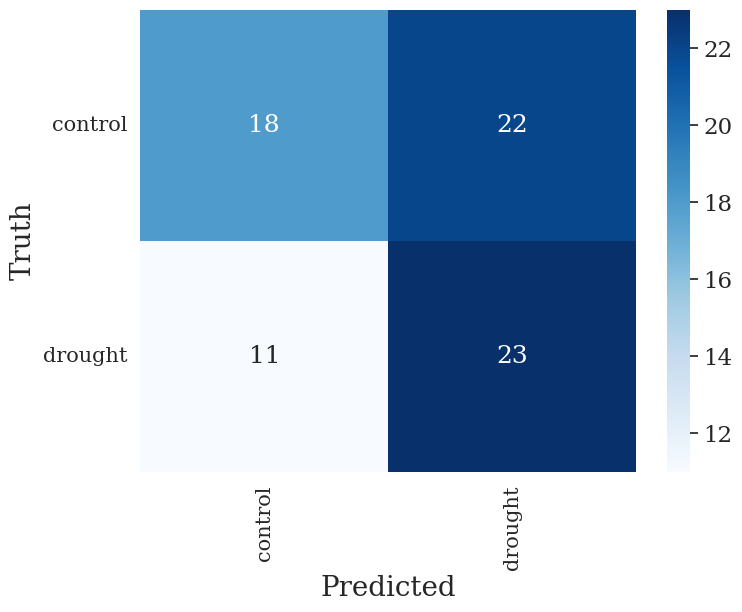

In [ ]:
y_test_pred = logreg.predict(X_test)

# print matrix
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred, pos_label='drought'))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred, pos_label='drought'))
print("Test: F1 Score:",metrics.f1_score(y_test, y_test_pred, pos_label='drought'))

###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 18},cmap="Blues")
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)

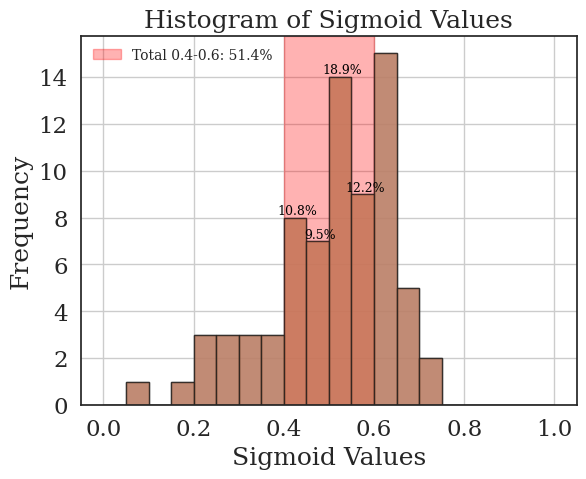

In [ ]:
# Get the sigmoid values (probabilities)
sigmoid_values = logreg.predict_proba(X_test)[:, 1]  # The second column represents the positive class

# Define the bin edges
bin_edges = np.linspace(0, 1, 21)  # 20 bins from 0 to 1

# Plot the histogram
plt.hist(sigmoid_values, bins=bin_edges, edgecolor='k', alpha=0.7)

# Highlight bins between 0.4 and 0.6 in red
plt.axvspan(0.4, 0.6, color='red', alpha=0.3, label='0.4-0.6')

# Calculate and display the count and percentage of values in each bin
counts, bin_edges, _ = plt.hist(sigmoid_values, bins=bin_edges, edgecolor='k', alpha=0.7)
total_samples = len(sigmoid_values)

# count total precentage
total_precentage = 0

# Add labels to the bins with counts and percentages
for i in range(len(counts)):
    if 0.4 <= bin_edges[i] <= 0.6:
        count = int(counts[i])
        percentage = (count / total_samples) * 100
        total_precentage+= percentage
        label = f'{percentage:.1f}%'
        plt.text(bin_edges[i] + 0.03, counts[i], label, ha='center', va='bottom', color='black', fontsize=9)

plt.xlabel('Sigmoid Values')
plt.ylabel('Frequency')
plt.title('Histogram of Sigmoid Values')
plt.grid(True)
legend_label = f'Total 0.4-0.6: {total_precentage:.1f}%'
plt.legend([legend_label], fontsize=10)
plt.show()

### SVM

In [ ]:
from scipy.stats import reciprocal, expon
param_distribs = {
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'shrinking': [False, True],
    'C': reciprocal(1, 1000),
    'coef0': expon(scale=1.0),
    'gamma': expon(scale=1.0),
    'degree': [1, 2, 3, 4, 5, 6, 7, 8],
    'tol': expon(scale=1e-4)
}

svm_clf = SVC()
rnd_search = RandomizedSearchCV(svm_clf, param_distributions=param_distribs,
                                n_iter=50, cv=3, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=False, tol=2.0799307999138624e-06; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=False, tol=2.0799307999138624e-06; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821

/usr/local/lib/python3.10/dist-packages/multiprocess/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


KeyboardInterrupt: 

In [ ]:
bset_params = {'C': 702.5166339242153, 'coef0': 3.3706303424611725, 'degree': 2, 'gamma': 0.4868104805084566, 'kernel': 'poly', 'shrinking': False, 'tol': 2.625262508953778e-05}

In [ ]:
# Create the SVC model with the best parameters from the randomized search
svc = SVC(**bset_params, probability=True)

# Fit the model to the training data
svc.fit(X_train, y_train, )

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(svc, X_train, y_train, cv=3)

# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')

print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Recall: 0.7241379310344828
Precision: 0.6923076923076923
F1 Score: 0.7078651685393258


Test: Accuracy: 0.6486486486486487
Test: Recall: 0.6764705882352942
Test: Precision: 0.6052631578947368
Test: F1 Score: 0.6388888888888888


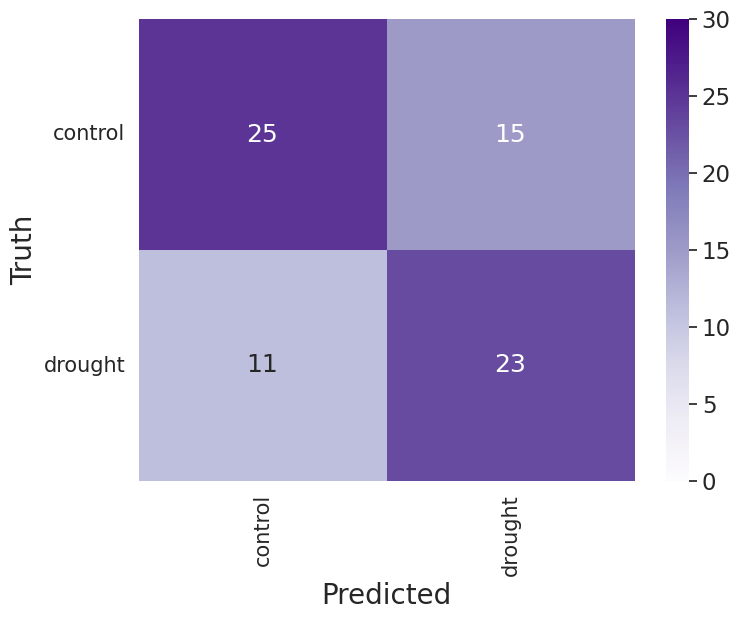

In [ ]:
y_test_pred = svc.predict(X_test)

# print matrix
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred, pos_label='drought'))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred, pos_label='drought'))
print("Test: F1 Score:",metrics.f1_score(y_test, y_test_pred, pos_label='drought'))

###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 18},cmap="Purples", vmin=0, vmax=30)
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)
plt.savefig("confusion_matrix_planet.png", dpi=600, bbox_inches='tight')
plt.show()

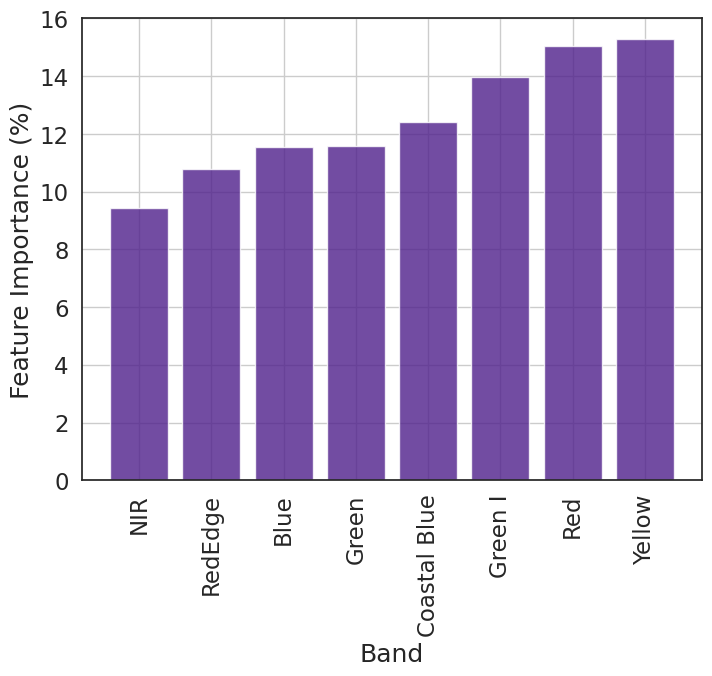

In [ ]:
# Calculate permutation feature importance
result = permutation_importance(svc, X_train, y_train, n_repeats=30, random_state=42, n_jobs=-1)

# Get feature importance and their corresponding indices
importance = result.importances_mean

# Scale to 0-100
importance = (importance / np.sum(importance)) * 100
indices = np.argsort(importance)

# Define cm
darkest_purple = cm.Purples(0.9)

# Get feature names from the original DataFrame
feature_names = planet_df.columns

# Plot feature importance
plt.figure(figsize=(8, 6))
plt.bar(range(X_train.shape[1]), importance[indices], align="center", color = darkest_purple, alpha=.8)
plt.xticks(range(X_train.shape[1]), feature_names[indices], rotation=90)
plt.ylabel("Feature Importance (%)")
plt.grid(True)
plt.xlabel("Band")
plt.ylim(0,16)
plt.savefig("feature_importance_planet.png", dpi=600, bbox_inches='tight')
plt.show()

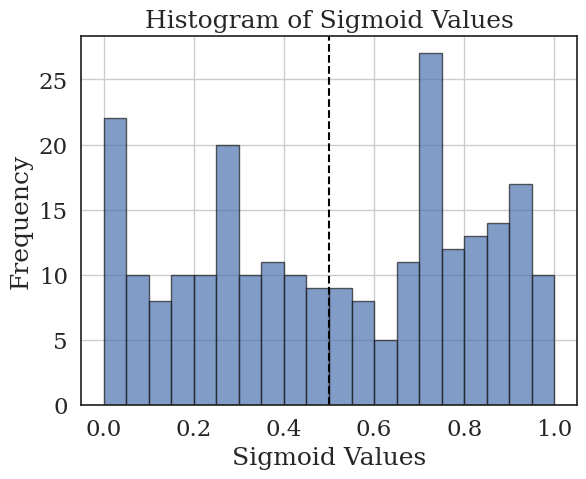

In [ ]:
# Get probabilities using predict_proba
probabilities = svc.predict_proba(X_test)[:, 1]  # Probability for the 'drought' class

# Split probabilities based on true labels
drought_values = probabilities[y_test == 'drought']
control_values = probabilities[y_test == 'control']

# Create histogram of probabilities
bin_edges = np.linspace(0, 1, 21)  # 20 bins
plt.figure(figsize=(8, 6))
plt.hist(drought_values, bins=bin_edges, edgecolor='k', alpha=0.7, color='yellow', label='Drought')
plt.hist(control_values, bins=bin_edges, edgecolor='k', alpha=0.4, color='blue', label='Control')
plt.xlabel('Predicted Probability for "Drought"')
plt.ylabel('Frequency')
plt.title('SVM')
plt.ylim(0, 25)
plt.legend()
plt.axvline(x=0.5, color='red', linestyle='--')
plt.grid(True)
plt.show()

### RF

In [ ]:
param_distribs = {
'n_estimators':[int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)],
'criterion': ['gini', 'entropy'],
'max_depth': [int(x) for x in np.linspace(10, 110, num = 11)],
'min_samples_split': [2, 5, 10],
'min_samples_leaf': [1, 2, 4],
'max_features': ['auto', 'sqrt'],
}

rf_clf = RandomForestClassifier(random_state=42)
rnd_search = RandomizedSearchCV(rf_clf, param_distributions=param_distribs,
n_iter=100, cv=3, scoring='accuracy',
verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 3 folds for each of 100 candidates, totalling 300 fits
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   4.7s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   3.4s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   3.1s
[CV] END criterion=gini, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   1.9s
[CV] END criterion=gini, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   1.9s
[CV] END criterion=gini, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1400; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1400; total time=   2.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1400; total time=   2.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1200; total time=   1.9s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1200; total time=   2.1s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1200; total time=   3.2s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   2.7s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   2.4s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   2.5s
[CV] END criterion=entropy, max_depth=7

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   4.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   3.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   2.9s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.0s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.0s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.6s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.7s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.6s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   2.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   3.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   4.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   3.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   3.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   4.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   3.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   3.2s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   1.5s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   1.6s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   2.1s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   1.1s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   1.1s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   1.0s
[CV] END criterion=entropy, 

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   3.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   2.2s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   2.2s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   2.5s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   4.6s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.1s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   0.6s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   0.6s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   0.6s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   2.5s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   2.5s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   2.5s
[CV] END criterion=entropy, max_d

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1800; total time=   3.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1800; total time=   3.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1800; total time=   3.1s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.6s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.8s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   1.9s
[CV] END criterion=gini, max_depth=

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=400; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=400; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=400; total time=   0.7s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   4.4s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   4.2s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   5.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=400; total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=400; total time=   3.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=400; total time=   1.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   6.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   9.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   5.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=   2.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=   2.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=   2.4s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   0.9s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   0.9s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.0s
[CV] END criterion=entropy, max_

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=800; total time=   1.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=800; total time=   1.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=800; total time=   1.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   1.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   2.9s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   2.8s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   2.8s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1600; total time=   2.8s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1600; total time=   3.9s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1600; total time=   2.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1000; total time=   1.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1000; total time=   1.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1000; total time=   1.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   4.4s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.6s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   5.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   4.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   3.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   2.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   2.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   4.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   5.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   2.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   2.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   3.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1600; total time=   4.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1600; total time=   2.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1600; total time=   2.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   2.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   3.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   4.1s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=1600; total time=   2.6s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=1600; total time=   2.5s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=1600; total time=   2.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   5.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.4s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=800; total time=   1.3s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=800; total time=   1.3s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=800; total time=   2.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=   4.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=   3.3s
[CV] END criterion=entropy, max_depth=100, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END criterion=entropy, max_depth=100, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END criterion=entropy, max_depth=100, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END criterion=entropy, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1400; total time=   3.3s
[CV] END criterion=entropy, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1400; total time=   3.0s
[CV] END criterion=entropy, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1400; total time=   2.3s
[CV] END criterion=

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1200; total time=   2.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1200; total time=   3.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1200; total time=   2.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=2000; total time=   3.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=2000; total time=   3.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=2000; total time=   4.2s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   7.8s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   5.5s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   4.3s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.0s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=600; total time=   0.9s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=600; total time=   0.9s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=600; total time=   1.2s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   3.3s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   2.1s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   1.9s
[CV] END criterion=entropy, max_de

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1400; total time=   4.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1400; total time=   2.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1400; total time=   2.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   5.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   5.5s
[CV] END criterion=entropy, max_depth=70, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   3.1s
[CV] END criterion=entropy, max_depth=70, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   2.5s
[CV] END criterion=entropy, max_depth=70, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=600; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=600; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=600; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   4.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   3.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   2.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=2000; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=2000; total time=   4.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=2000; total time=   3.9s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=800; total time=   1.2s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=800; total time=   1.2s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=800; total time=   1.2s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1600; total time=   2.5s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1600; total time=   3.2s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1600; total time=   3.6s
[CV] END criterion=entropy, max_depth

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   1.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   3.1s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   5.1s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   4.7s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   2.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1000; total time=   2.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1000; total time=   4.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1000; total time=   1.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   2.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   2.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   4.4s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   3.1s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   2.8s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   2.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=80, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   3.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=80, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   4.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=80, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   2.9s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=   3.2s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=   3.7s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=   4.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1400; total time=   2.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1400; total time=   2.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1400; total time=   2.4s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   3.4s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   2.7s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   2.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=   1.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=   1.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=   1.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.7s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=1200; total time=   2.4s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=1200; total time=   3.4s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=1200; total time=   3.2s
Best parameters: {'n_estimators': 1800, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 50, 'criterion': 'gini'}
Best cross-validation score: 0.48


In [ ]:
# Create the Random Forest model with the best parameters from the randomized search
best_rf = {'n_estimators': 1800, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 50, 'criterion': 'gini'}
rf = RandomForestClassifier(**best_rf, random_state=42)

# Fit the model to the training data
rf.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(rf, X_train, y_train, cv=5)

# Calculate recall, precision, and F1 score
# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')

print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Recall: 0.6666666666666666
Precision: 0.5979381443298969
F1 Score: 0.6304347826086957


Test: Accuracy: 0.6081081081081081
Test: Recall: 0.5588235294117647
Test: Precision: 0.5757575757575758
Test: F1 Score: 0.5671641791044776


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

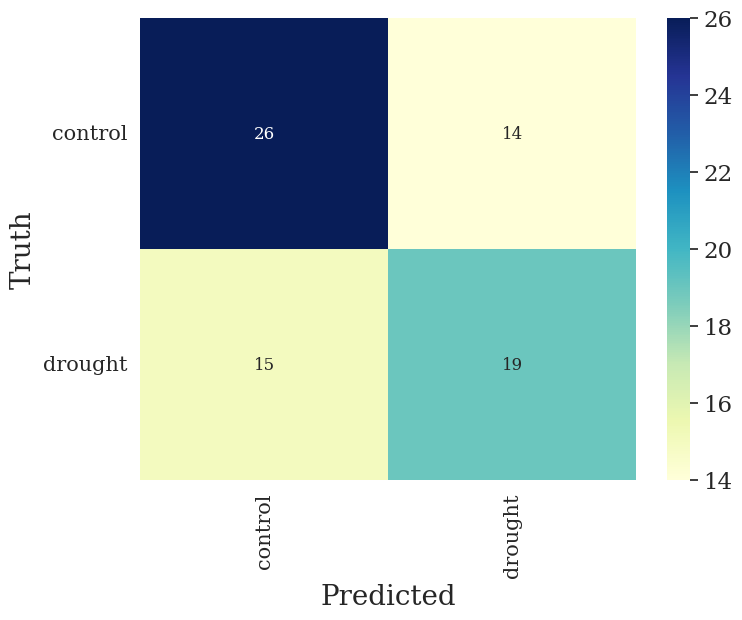

In [ ]:
y_test_pred = rf.predict(X_test)

# Print metrics
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred, pos_label='drought'))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred, pos_label='drought'))
print("Test: F1 Score:",metrics.f1_score(y_test, y_test_pred, pos_label='drought'))

# Confusion matrix
# Labels for confusion matrix:
unique_label = np.unique([y_test, y_test_pred])

# Create confusion matrix dataframe:
cmtx = pd.DataFrame(
confusion_matrix(y_test, y_test_pred, labels=unique_label),
index=[x for x in unique_label],
columns=[x for x in unique_label])
plt.figure(figsize=(8, 6))
sns.heatmap(cmtx, annot=True, fmt='d', annot_kws={"size": 12}, cmap="YlGnBu")
plt.xlabel('Predicted', fontsize=20)
plt.ylabel('Truth', fontsize=20)
plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15, rotation=0)

## Venus

In [ ]:
venus_bands = [
    (420, 40),   # Band 1
    (443, 40),   # Band 2
    (490, 40),   # Band 3
    (555, 40),   # Band 4
    (620, 40),   # Band 5
    (620, 40),   # Band 6
    (667, 30),   # Band 7
    (702, 24),   # Band 8
    (742, 16),   # Band 9
    (782, 16),   # Band 10
    (865, 40),   # Band 11
    (910, 20)    # Band 12
]

venus_bands_dict = {}

# Calculate minimum and maximum wavelength values for each band
for band in venus_bands:
    wavelength, bandwidth = band
    min_wavelength = wavelength - (bandwidth / 2)
    max_wavelength = wavelength + (bandwidth / 2)
    new_band = (int(min_wavelength), int(max_wavelength))
    venus_bands_dict[new_band] = []

print("venus_bands =", venus_bands)
print("venus_bands_dict =", venus_bands_dict)

venus_bands = [(420, 40), (443, 40), (490, 40), (555, 40), (620, 40), (620, 40), (667, 30), (702, 24), (742, 16), (782, 16), (865, 40), (910, 20)]
venus_bands_dict = {(400, 440): [], (423, 463): [], (470, 510): [], (535, 575): [], (600, 640): [], (652, 682): [], (690, 714): [], (734, 750): [], (774, 790): [], (845, 885): [], (900, 920): []}


In [ ]:
for col in df[df.columns[:-7]].columns:
    int_col = int(col)
    for band_range in venus_bands_dict:
        if int_col in range(band_range[0], band_range[1]):
            venus_bands_dict[band_range].append(col)

print(venus_bands_dict)

{(400, 440): ['400', '402', '404', '406', '409', '411', '413', '415', '417', '420', '422', '424', '426', '429', '431', '433', '435', '437'], (423, 463): ['424', '426', '429', '431', '433', '435', '437', '440', '442', '444', '446', '448', '451', '453', '455', '457', '460', '462'], (470, 510): ['471', '473', '475', '477', '479', '482', '484', '486', '488', '490', '493', '495', '497', '499', '502', '504', '506', '508'], (535, 575): ['535', '537', '539', '541', '544', '546', '548', '550', '552', '555', '557', '559', '561', '563', '566', '568', '570', '572'], (600, 640): ['601', '603', '605', '608', '610', '612', '614', '617', '619', '621', '623', '625', '628', '630', '632', '634', '636', '639'], (652, 682): ['652', '654', '656', '659', '661', '663', '665', '667', '670', '672', '674', '676', '678', '681'], (690, 714): ['690', '692', '694', '696', '698', '701', '703', '705', '707', '709', '712'], (734, 750): ['734', '736', '738', '740', '743', '745', '747', '749'], (774, 790): ['774', '776',

In [ ]:
# Create a new DataFrame for all the columns that have the same value to produce one average column of all these columns
venus_df = pd.DataFrame()
for band, cols in venus_bands_dict.items():
    if len(cols) > 0:
        new_col_name = f'{band[0]}-{band[1]}'
        venus_df[new_col_name] = df[cols].mean(axis=1)

# Convert columns names to the name of band
venus_df.columns = [f'B{i+2}' for i in range(len(venus_df.columns))]

venus_df

,B2,B3,B4,B5,B6,B7,B8,B9,B10,B11,B12
0,0.027522,0.026908,0.036917,0.059330,0.050538,0.039707,0.065559,0.194630,0.224626,0.232679,0.231613
15,0.026792,0.022476,0.029243,0.048237,0.042771,0.035763,0.056912,0.183833,0.215684,0.226146,0.228862
14,0.027736,0.019500,0.021424,0.039009,0.030381,0.023554,0.038937,0.118973,0.136067,0.142584,0.143287
12,0.043721,0.041009,0.048679,0.078949,0.067038,0.056525,0.084961,0.227591,0.258860,0.273662,0.277873
11,0.024479,0.019882,0.022328,0.043206,0.030822,0.023103,0.047697,0.200427,0.238013,0.247092,0.248417
...,...,...,...,...,...,...,...,...,...,...,...
220,0.029496,0.026785,0.030605,0.056221,0.042442,0.036056,0.069400,0.269022,0.314613,0.342809,0.346350
219,0.017970,0.018912,0.023404,0.039146,0.031104,0.024474,0.045329,0.152916,0.181580,0.193538,0.192424
244,0.024471,0.022538,0.026317,0.044239,0.035657,0.029711,0.052936,0.195553,0.234605,0.251468,0.250796
231,0.041493,0.044490,0.052988,0.091339,0.074835,0.061350,0.102848,0.264813,0.299906,0.317701,0.307887


In [ ]:
# Define features and labels
X = venus_df

# Standardize features
scaler = StandardScaler()
X = scaler.fit_transform(X)

y = df['treatment']

# Split to train-test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=42 )

X_train.shape,X_test.shape

((172, 11), (74, 11))

### Logistic regression

In [ ]:
param_distribs = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'C': reciprocal(1, 1000),
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'tol': expon(scale=1e-4),
    'fit_intercept': [False, True],
    'intercept_scaling': expon(scale=1.0),
    'max_iter': [100, 200, 300, 400, 500, 600, 700]
}

logreg_clf = LogisticRegression()
rnd_search = RandomizedSearchCV(logreg_clf, param_distributions=param_distribs,
                                n_iter=100, cv=5, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=lbfgs, tol=1.6959629191460517e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=lbfgs, tol=1.6959629191460517e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=lbfgs, tol=1.6959629191460517e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=lbfgs, tol=1.6959629191460517e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=lbfgs, tol=1.6959629191460517e-05; total time=   0.0s
[CV] END C=1.4936568554617629, fit_intercept=True, i

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/py

[CV] END C=4.928122297695502, fit_intercept=True, intercept_scaling=0.5800908425853983, max_iter=700, penalty=none, solver=saga, tol=0.00017909292843438935; total time=   0.0s
[CV] END C=4.928122297695502, fit_intercept=True, intercept_scaling=0.5800908425853983, max_iter=700, penalty=none, solver=saga, tol=0.00017909292843438935; total time=   0.0s
[CV] END C=3.312027701465945, fit_intercept=False, intercept_scaling=0.2994577768406861, max_iter=400, penalty=l2, solver=lbfgs, tol=8.38636245624803e-05; total time=   0.0s
[CV] END C=3.312027701465945, fit_intercept=False, intercept_scaling=0.2994577768406861, max_iter=400, penalty=l2, solver=lbfgs, tol=8.38636245624803e-05; total time=   0.0s
[CV] END C=3.312027701465945, fit_intercept=False, intercept_scaling=0.2994577768406861, max_iter=400, penalty=l2, solver=lbfgs, tol=8.38636245624803e-05; total time=   0.0s
[CV] END C=3.312027701465945, fit_intercept=False, intercept_scaling=0.2994577768406861, max_iter=400, penalty=l2, solver=lbfg

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(



[CV] END C=582.9384542994736, fit_intercept=True, intercept_scaling=0.845003102305618, max_iter=400, penalty=l1, solver=saga, tol=4.921302917942186e-05; total time=   0.0s
[CV] END C=582.9384542994736, fit_intercept=True, intercept_scaling=0.845003102305618, max_iter=400, penalty=l1, solver=saga, tol=4.921302917942186e-05; total time=   0.0s
[CV] END C=582.9384542994736, fit_intercept=True, intercept_scaling=0.845003102305618, max_iter=400, penalty=l1, solver=saga, tol=4.921302917942186e-05; total time=   0.0s
[CV] END C=582.9384542994736, fit_intercept=True, intercept_scaling=0.845003102305618, max_iter=400, penalty=l1, solver=saga, tol=4.921302917942186e-05; total time=   0.0s
[CV] END C=582.9384542994736, fit_intercept=True, intercept_scaling=0.845003102305618, max_iter=400, penalty=l1, solver=saga, tol=4.921302917942186e-05; total time=   0.0s
[CV] END C=6.516990611177173, fit_intercept=False, intercept_scaling=0.8837053630081474, max_iter=100, penalty=none, solver=sag, tol=7.8240

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logisti


[CV] END C=6.516990611177173, fit_intercept=False, intercept_scaling=0.8837053630081474, max_iter=100, penalty=none, solver=sag, tol=7.82407083207746e-05; total time=   0.0s
[CV] END C=6.516990611177173, fit_intercept=False, intercept_scaling=0.8837053630081474, max_iter=100, penalty=none, solver=sag, tol=7.82407083207746e-05; total time=   0.0s
[CV] END C=6.516990611177173, fit_intercept=False, intercept_scaling=0.8837053630081474, max_iter=100, penalty=none, solver=sag, tol=7.82407083207746e-05; total time=   0.0s
[CV] END C=2.6471141828218157, fit_intercept=False, intercept_scaling=0.1806432927428257, max_iter=100, penalty=elasticnet, solver=newton-cg, tol=0.00014794837762415115; total time=   0.0s
[CV] END C=2.6471141828218157, fit_intercept=False, intercept_scaling=0.1806432927428257, max_iter=100, penalty=elasticnet, solver=newton-cg, tol=0.00014794837762415115; total time=   0.0s
[CV] END C=2.6471141828218157, fit_intercept=False, intercept_scaling=0.1806432927428257, max_iter=

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour

[CV] END C=65.74760303457337, fit_intercept=True, intercept_scaling=0.4438926724162325, max_iter=100, penalty=none, solver=newton-cg, tol=9.763011917123741e-05; total time=   0.0s
[CV] END C=65.74760303457337, fit_intercept=True, intercept_scaling=0.4438926724162325, max_iter=100, penalty=none, solver=newton-cg, tol=9.763011917123741e-05; total time=   0.0s
[CV] END C=65.74760303457337, fit_intercept=True, intercept_scaling=0.4438926724162325, max_iter=100, penalty=none, solver=newton-cg, tol=9.763011917123741e-05; total time=   0.0s
[CV] END C=9.833181933644886, fit_intercept=True, intercept_scaling=0.4633351167983427, max_iter=600, penalty=none, solver=saga, tol=0.00013078757839577409; total time=   0.0s
[CV] END C=9.833181933644886, fit_intercept=True, intercept_scaling=0.4633351167983427, max_iter=600, penalty=none, solver=saga, tol=0.00013078757839577409; total time=   0.0s
[CV] END C=9.833181933644886, fit_intercept=True, intercept_scaling=0.4633351167983427, max_iter=600, penalt

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/

[CV] END C=9.833181933644886, fit_intercept=True, intercept_scaling=0.4633351167983427, max_iter=600, penalty=none, solver=saga, tol=0.00013078757839577409; total time=   0.0s
[CV] END C=9.833181933644886, fit_intercept=True, intercept_scaling=0.4633351167983427, max_iter=600, penalty=none, solver=saga, tol=0.00013078757839577409; total time=   0.0s
[CV] END C=81.78476574339537, fit_intercept=False, intercept_scaling=0.8238105204914145, max_iter=300, penalty=l1, solver=liblinear, tol=0.00014303927530768642; total time=   0.1s
[CV] END C=81.78476574339537, fit_intercept=False, intercept_scaling=0.8238105204914145, max_iter=300, penalty=l1, solver=liblinear, tol=0.00014303927530768642; total time=   0.2s
[CV] END C=81.78476574339537, fit_intercept=False, intercept_scaling=0.8238105204914145, max_iter=300, penalty=l1, solver=liblinear, tol=0.00014303927530768642; total time=   0.1s
[CV] END C=81.78476574339537, fit_intercept=False, intercept_scaling=0.8238105204914145, max_iter=300, penal

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/py

[CV] END C=2.107047280657823, fit_intercept=False, intercept_scaling=2.261093840942367, max_iter=100, penalty=none, solver=saga, tol=7.104371771341901e-05; total time=   0.0s
[CV] END C=2.107047280657823, fit_intercept=False, intercept_scaling=2.261093840942367, max_iter=100, penalty=none, solver=saga, tol=7.104371771341901e-05; total time=   0.0s
[CV] END C=2.107047280657823, fit_intercept=False, intercept_scaling=2.261093840942367, max_iter=100, penalty=none, solver=saga, tol=7.104371771341901e-05; total time=   0.0s
[CV] END C=528.0796376895362, fit_intercept=False, intercept_scaling=0.9273956116389813, max_iter=700, penalty=elasticnet, solver=saga, tol=2.5980515691739405e-05; total time=   0.0s
[CV] END C=528.0796376895362, fit_intercept=False, intercept_scaling=0.9273956116389813, max_iter=700, penalty=elasticnet, solver=saga, tol=2.5980515691739405e-05; total time=   0.0s
[CV] END C=528.0796376895362, fit_intercept=False, intercept_scaling=0.9273956116389813, max_iter=700, penalt

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/

[CV] END C=79.47147424653741, fit_intercept=True, intercept_scaling=0.6097891815881622, max_iter=400, penalty=none, solver=sag, tol=0.0002230813405235561; total time=   0.0s
[CV] END C=79.47147424653741, fit_intercept=True, intercept_scaling=0.6097891815881622, max_iter=400, penalty=none, solver=sag, tol=0.0002230813405235561; total time=   0.0s
[CV] END C=41.49795789891588, fit_intercept=True, intercept_scaling=0.1302088665616574, max_iter=100, penalty=elasticnet, solver=newton-cg, tol=3.1763590853048414e-05; total time=   0.0s
[CV] END C=41.49795789891588, fit_intercept=True, intercept_scaling=0.1302088665616574, max_iter=100, penalty=elasticnet, solver=newton-cg, tol=3.1763590853048414e-05; total time=   0.0s
[CV] END C=41.49795789891588, fit_intercept=True, intercept_scaling=0.1302088665616574, max_iter=100, penalty=elasticnet, solver=newton-cg, tol=3.1763590853048414e-05; total time=   0.0s
[CV] END C=41.49795789891588, fit_intercept=True, intercept_scaling=0.1302088665616574, max

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/py

[CV] END C=248.33353742622597, fit_intercept=False, intercept_scaling=0.3868102936673966, max_iter=600, penalty=none, solver=saga, tol=0.00019544582135766326; total time=   0.0s
[CV] END C=248.33353742622597, fit_intercept=False, intercept_scaling=0.3868102936673966, max_iter=600, penalty=none, solver=saga, tol=0.00019544582135766326; total time=   0.0s
[CV] END C=9.50334981101655, fit_intercept=True, intercept_scaling=0.01672694755847062, max_iter=300, penalty=elasticnet, solver=liblinear, tol=4.2873269199544655e-05; total time=   0.0s
[CV] END C=9.50334981101655, fit_intercept=True, intercept_scaling=0.01672694755847062, max_iter=300, penalty=elasticnet, solver=liblinear, tol=4.2873269199544655e-05; total time=   0.0s
[CV] END C=9.50334981101655, fit_intercept=True, intercept_scaling=0.01672694755847062, max_iter=300, penalty=elasticnet, solver=liblinear, tol=4.2873269199544655e-05; total time=   0.0s
[CV] END C=9.50334981101655, fit_intercept=True, intercept_scaling=0.01672694755847

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour

[CV] END C=126.20410750629124, fit_intercept=True, intercept_scaling=2.2740973491072523, max_iter=600, penalty=none, solver=newton-cg, tol=0.0001027310693567705; total time=   0.0s
[CV] END C=126.20410750629124, fit_intercept=True, intercept_scaling=2.2740973491072523, max_iter=600, penalty=none, solver=newton-cg, tol=0.0001027310693567705; total time=   0.1s
[CV] END C=1.7882156647879481, fit_intercept=True, intercept_scaling=1.5387029311670475, max_iter=400, penalty=l2, solver=liblinear, tol=4.6566547913946975e-05; total time=   0.0s
[CV] END C=1.7882156647879481, fit_intercept=True, intercept_scaling=1.5387029311670475, max_iter=400, penalty=l2, solver=liblinear, tol=4.6566547913946975e-05; total time=   0.0s
[CV] END C=1.7882156647879481, fit_intercept=True, intercept_scaling=1.5387029311670475, max_iter=400, penalty=l2, solver=liblinear, tol=4.6566547913946975e-05; total time=   0.0s
[CV] END C=1.7882156647879481, fit_intercept=True, intercept_scaling=1.5387029311670475, max_iter=

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=90.34076805537768, fit_intercept=False, intercept_scaling=0.19349404041660798, max_iter=400, penalty=l1, solver=saga, tol=1.9701624792324706e-05; total time=   0.1s
[CV] END C=90.34076805537768, fit_intercept=False, intercept_scaling=0.19349404041660798, max_iter=400, penalty=l1, solver=saga, tol=1.9701624792324706e-05; total time=   0.0s
[CV] END C=90.34076805537768, fit_intercept=False, intercept_scaling=0.19349404041660798, max_iter=400, penalty=l1, solver=saga, tol=1.9701624792324706e-05; total time=   0.1s
[CV] END C=90.34076805537768, fit_intercept=False, intercept_scaling=0.19349404041660798, max_iter=400, penalty=l1, solver=saga, tol=1.9701624792324706e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/py

[CV] END C=12.572057357983692, fit_intercept=True, intercept_scaling=1.891956077463401, max_iter=100, penalty=none, solver=newton-cg, tol=7.820663337722502e-05; total time=   0.1s
[CV] END C=12.572057357983692, fit_intercept=True, intercept_scaling=1.891956077463401, max_iter=100, penalty=none, solver=newton-cg, tol=7.820663337722502e-05; total time=   0.0s
[CV] END C=12.572057357983692, fit_intercept=True, intercept_scaling=1.891956077463401, max_iter=100, penalty=none, solver=newton-cg, tol=7.820663337722502e-05; total time=   0.0s
[CV] END C=12.572057357983692, fit_intercept=True, intercept_scaling=1.891956077463401, max_iter=100, penalty=none, solver=newton-cg, tol=7.820663337722502e-05; total time=   0.0s
[CV] END C=12.572057357983692, fit_intercept=True, intercept_scaling=1.891956077463401, max_iter=100, penalty=none, solver=newton-cg, tol=7.820663337722502e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=33.6079661042078, fit_intercept=True, intercept_scaling=0.30816014785883117, max_iter=600, penalty=l2, solver=saga, tol=6.669769342753803e-05; total time=   0.1s
[CV] END C=33.6079661042078, fit_intercept=True, intercept_scaling=0.30816014785883117, max_iter=600, penalty=l2, solver=saga, tol=6.669769342753803e-05; total time=   0.1s
[CV] END C=33.6079661042078, fit_intercept=True, intercept_scaling=0.30816014785883117, max_iter=600, penalty=l2, solver=saga, tol=6.669769342753803e-05; total time=   0.1s
[CV] END C=33.6079661042078, fit_intercept=True, intercept_scaling=0.30816014785883117, max_iter=600, penalty=l2, solver=saga, tol=6.669769342753803e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=33.6079661042078, fit_intercept=True, intercept_scaling=0.30816014785883117, max_iter=600, penalty=l2, solver=saga, tol=6.669769342753803e-05; total time=   0.1s
[CV] END C=522.752794541886, fit_intercept=False, intercept_scaling=1.5838252526883998, max_iter=600, penalty=l1, solver=sag, tol=0.00011054075029197247; total time=   0.0s
[CV] END C=522.752794541886, fit_intercept=False, intercept_scaling=1.5838252526883998, max_iter=600, penalty=l1, solver=sag, tol=0.00011054075029197247; total time=   0.0s
[CV] END C=522.752794541886, fit_intercept=False, intercept_scaling=1.5838252526883998, max_iter=600, penalty=l1, solver=sag, tol=0.00011054075029197247; total time=   0.0s
[CV] END C=522.752794541886, fit_intercept=False, intercept_scaling=1.5838252526883998, max_iter=600, penalty=l1, solver=sag, tol=0.00011054075029197247; total time=   0.0s
[CV] END C=522.752794541886, fit_intercept=False, intercept_scaling=1.5838252526883998, max_iter=600, penalty=l1, solver=sag, tol=0.000

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been depre

[CV] END C=175.04766488065064, fit_intercept=False, intercept_scaling=2.6355234573318898, max_iter=100, penalty=l2, solver=saga, tol=8.493156561671791e-05; total time=   0.0s
[CV] END C=175.04766488065064, fit_intercept=False, intercept_scaling=2.6355234573318898, max_iter=100, penalty=l2, solver=saga, tol=8.493156561671791e-05; total time=   0.0s
[CV] END C=175.04766488065064, fit_intercept=False, intercept_scaling=2.6355234573318898, max_iter=100, penalty=l2, solver=saga, tol=8.493156561671791e-05; total time=   0.0s
[CV] END C=175.04766488065064, fit_intercept=False, intercept_scaling=2.6355234573318898, max_iter=100, penalty=l2, solver=saga, tol=8.493156561671791e-05; total time=   0.0s
[CV] END C=175.04766488065064, fit_intercept=False, intercept_scaling=2.6355234573318898, max_iter=100, penalty=l2, solver=saga, tol=8.493156561671791e-05; total time=   0.0s
[CV] END C=872.9608177827158, fit_intercept=True, intercept_scaling=0.3487760681721603, max_iter=500, penalty=none, solver=ne

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(


[CV] END C=1.956723592144733, fit_intercept=True, intercept_scaling=1.1121338447386744, max_iter=700, penalty=l2, solver=liblinear, tol=3.4996974329480535e-05; total time=   0.0s
[CV] END C=1.956723592144733, fit_intercept=True, intercept_scaling=1.1121338447386744, max_iter=700, penalty=l2, solver=liblinear, tol=3.4996974329480535e-05; total time=   0.0s
[CV] END C=1.956723592144733, fit_intercept=True, intercept_scaling=1.1121338447386744, max_iter=700, penalty=l2, solver=liblinear, tol=3.4996974329480535e-05; total time=   0.0s
[CV] END C=1.956723592144733, fit_intercept=True, intercept_scaling=1.1121338447386744, max_iter=700, penalty=l2, solver=liblinear, tol=3.4996974329480535e-05; total time=   0.0s
[CV] END C=1.956723592144733, fit_intercept=True, intercept_scaling=1.1121338447386744, max_iter=700, penalty=l2, solver=liblinear, tol=3.4996974329480535e-05; total time=   0.0s
[CV] END C=9.282229301554018, fit_intercept=True, intercept_scaling=1.194074425301673, max_iter=300, pena

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been depre

[CV] END C=9.282229301554018, fit_intercept=True, intercept_scaling=1.194074425301673, max_iter=300, penalty=l2, solver=saga, tol=3.5170182136291574e-05; total time=   0.1s
[CV] END C=18.16948297499714, fit_intercept=True, intercept_scaling=2.017950047367915, max_iter=500, penalty=none, solver=lbfgs, tol=5.198350817616321e-07; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(


[CV] END C=18.16948297499714, fit_intercept=True, intercept_scaling=2.017950047367915, max_iter=500, penalty=none, solver=lbfgs, tol=5.198350817616321e-07; total time=   0.1s
[CV] END C=18.16948297499714, fit_intercept=True, intercept_scaling=2.017950047367915, max_iter=500, penalty=none, solver=lbfgs, tol=5.198350817616321e-07; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(


[CV] END C=18.16948297499714, fit_intercept=True, intercept_scaling=2.017950047367915, max_iter=500, penalty=none, solver=lbfgs, tol=5.198350817616321e-07; total time=   0.1s
[CV] END C=18.16948297499714, fit_intercept=True, intercept_scaling=2.017950047367915, max_iter=500, penalty=none, solver=lbfgs, tol=5.198350817616321e-07; total time=   0.1s
[CV] END C=76.50384182489971, fit_intercept=True, intercept_scaling=1.0497190748878003, max_iter=600, penalty=none, solver=sag, tol=0.00021769851244386477; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/py

[CV] END C=76.50384182489971, fit_intercept=True, intercept_scaling=1.0497190748878003, max_iter=600, penalty=none, solver=sag, tol=0.00021769851244386477; total time=   0.1s
[CV] END C=76.50384182489971, fit_intercept=True, intercept_scaling=1.0497190748878003, max_iter=600, penalty=none, solver=sag, tol=0.00021769851244386477; total time=   0.1s
[CV] END C=76.50384182489971, fit_intercept=True, intercept_scaling=1.0497190748878003, max_iter=600, penalty=none, solver=sag, tol=0.00021769851244386477; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=76.50384182489971, fit_intercept=True, intercept_scaling=1.0497190748878003, max_iter=600, penalty=none, solver=sag, tol=0.00021769851244386477; total time=   0.1s
[CV] END C=1.2101809594595496, fit_intercept=True, intercept_scaling=0.09869603918736056, max_iter=700, penalty=elasticnet, solver=liblinear, tol=6.266069481821097e-05; total time=   0.0s
[CV] END C=1.2101809594595496, fit_intercept=True, intercept_scaling=0.09869603918736056, max_iter=700, penalty=elasticnet, solver=liblinear, tol=6.266069481821097e-05; total time=   0.0s
[CV] END C=1.2101809594595496, fit_intercept=True, intercept_scaling=0.09869603918736056, max_iter=700, penalty=elasticnet, solver=liblinear, tol=6.266069481821097e-05; total time=   0.0s
[CV] END C=1.2101809594595496, fit_intercept=True, intercept_scaling=0.09869603918736056, max_iter=700, penalty=elasticnet, solver=liblinear, tol=6.266069481821097e-05; total time=   0.0s
[CV] END C=1.2101809594595496, fit_intercept=True, intercept_scaling=0.09

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=293.6308497763011, fit_intercept=True, intercept_scaling=0.7702062692473535, max_iter=500, penalty=l1, solver=saga, tol=3.168265649239175e-05; total time=   0.1s
[CV] END C=293.6308497763011, fit_intercept=True, intercept_scaling=0.7702062692473535, max_iter=500, penalty=l1, solver=saga, tol=3.168265649239175e-05; total time=   0.1s
[CV] END C=293.6308497763011, fit_intercept=True, intercept_scaling=0.7702062692473535, max_iter=500, penalty=l1, solver=saga, tol=3.168265649239175e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/

[CV] END C=786.6028057531652, fit_intercept=False, intercept_scaling=0.08921102898989729, max_iter=500, penalty=none, solver=sag, tol=5.299301333993761e-05; total time=   0.1s
[CV] END C=786.6028057531652, fit_intercept=False, intercept_scaling=0.08921102898989729, max_iter=500, penalty=none, solver=sag, tol=5.299301333993761e-05; total time=   0.1s
[CV] END C=786.6028057531652, fit_intercept=False, intercept_scaling=0.08921102898989729, max_iter=500, penalty=none, solver=sag, tol=5.299301333993761e-05; total time=   0.1s
[CV] END C=786.6028057531652, fit_intercept=False, intercept_scaling=0.08921102898989729, max_iter=500, penalty=none, solver=sag, tol=5.299301333993761e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:35

[CV] END C=786.6028057531652, fit_intercept=False, intercept_scaling=0.08921102898989729, max_iter=500, penalty=none, solver=sag, tol=5.299301333993761e-05; total time=   0.1s
[CV] END C=125.46905652785969, fit_intercept=True, intercept_scaling=1.2949605629166843, max_iter=500, penalty=l2, solver=sag, tol=0.00012538464198467018; total time=   0.1s
[CV] END C=125.46905652785969, fit_intercept=True, intercept_scaling=1.2949605629166843, max_iter=500, penalty=l2, solver=sag, tol=0.00012538464198467018; total time=   0.1s
[CV] END C=125.46905652785969, fit_intercept=True, intercept_scaling=1.2949605629166843, max_iter=500, penalty=l2, solver=sag, tol=0.00012538464198467018; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=125.46905652785969, fit_intercept=True, intercept_scaling=1.2949605629166843, max_iter=500, penalty=l2, solver=sag, tol=0.00012538464198467018; total time=   0.0s
[CV] END C=125.46905652785969, fit_intercept=True, intercept_scaling=1.2949605629166843, max_iter=500, penalty=l2, solver=sag, tol=0.00012538464198467018; total time=   0.0s
[CV] END C=1.328013684703794, fit_intercept=True, intercept_scaling=0.3158514654361373, max_iter=400, penalty=l2, solver=lbfgs, tol=2.567760954147438e-06; total time=   0.0s
[CV] END C=1.328013684703794, fit_intercept=True, intercept_scaling=0.3158514654361373, max_iter=400, penalty=l2, solver=lbfgs, tol=2.567760954147438e-06; total time=   0.0s
[CV] END C=1.328013684703794, fit_intercept=True, intercept_scaling=0.3158514654361373, max_iter=400, penalty=l2, solver=lbfgs, tol=2.567760954147438e-06; total time=   0.0s
[CV] END C=1.328013684703794, fit_intercept=True, intercept_scaling=0.3158514654361373, max_iter=400, penalty=l2, solver=lbfgs, to

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour

[CV] END C=2.9465317694630833, fit_intercept=True, intercept_scaling=0.2741570942534817, max_iter=600, penalty=none, solver=newton-cg, tol=0.00010793903496967986; total time=   0.1s
[CV] END C=2.9465317694630833, fit_intercept=True, intercept_scaling=0.2741570942534817, max_iter=600, penalty=none, solver=newton-cg, tol=0.00010793903496967986; total time=   0.0s
[CV] END C=2.9465317694630833, fit_intercept=True, intercept_scaling=0.2741570942534817, max_iter=600, penalty=none, solver=newton-cg, tol=0.00010793903496967986; total time=   0.1s
[CV] END C=2.9465317694630833, fit_intercept=True, intercept_scaling=0.2741570942534817, max_iter=600, penalty=none, solver=newton-cg, tol=0.00010793903496967986; total time=   0.0s
[CV] END C=2.9465317694630833, fit_intercept=True, intercept_scaling=0.2741570942534817, max_iter=600, penalty=none, solver=newton-cg, tol=0.00010793903496967986; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=6.915151366011635, fit_intercept=True, intercept_scaling=0.7271099563716479, max_iter=700, penalty=l1, solver=saga, tol=5.440378655320514e-05; total time=   0.1s
[CV] END C=6.915151366011635, fit_intercept=True, intercept_scaling=0.7271099563716479, max_iter=700, penalty=l1, solver=saga, tol=5.440378655320514e-05; total time=   0.1s
[CV] END C=6.915151366011635, fit_intercept=True, intercept_scaling=0.7271099563716479, max_iter=700, penalty=l1, solver=saga, tol=5.440378655320514e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=6.915151366011635, fit_intercept=True, intercept_scaling=0.7271099563716479, max_iter=700, penalty=l1, solver=saga, tol=5.440378655320514e-05; total time=   0.1s
[CV] END C=6.915151366011635, fit_intercept=True, intercept_scaling=0.7271099563716479, max_iter=700, penalty=l1, solver=saga, tol=5.440378655320514e-05; total time=   0.1s
[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=600, penalty=l1, solver=saga, tol=1.2338039223997605e-05; total time=   0.0s
[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=600, penalty=l1, solver=saga, tol=1.2338039223997605e-05; total time=   0.0s
[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=600, penalty=l1, solver=saga, tol=1.2338039223997605e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been depre

[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=600, penalty=l1, solver=saga, tol=1.2338039223997605e-05; total time=   0.0s
[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=600, penalty=l1, solver=saga, tol=1.2338039223997605e-05; total time=   0.0s
[CV] END C=1.374067052111572, fit_intercept=False, intercept_scaling=0.373114056454012, max_iter=600, penalty=none, solver=saga, tol=6.427845944128924e-05; total time=   0.0s
[CV] END C=1.374067052111572, fit_intercept=False, intercept_scaling=0.373114056454012, max_iter=600, penalty=none, solver=saga, tol=6.427845944128924e-05; total time=   0.0s
[CV] END C=1.374067052111572, fit_intercept=False, intercept_scaling=0.373114056454012, max_iter=600, penalty=none, solver=saga, tol=6.427845944128924e-05; total time=   0.0s
[CV] END C=1.374067052111572, fit_intercept=False, intercept_scaling=0.373114056454012, max_iter=600, penalty=none, solver=sa

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/

[CV] END C=1.374067052111572, fit_intercept=False, intercept_scaling=0.373114056454012, max_iter=600, penalty=none, solver=saga, tol=6.427845944128924e-05; total time=   0.0s
[CV] END C=1.965633213961229, fit_intercept=True, intercept_scaling=1.644614295590405, max_iter=400, penalty=l1, solver=saga, tol=5.083366145832069e-05; total time=   0.0s
[CV] END C=1.965633213961229, fit_intercept=True, intercept_scaling=1.644614295590405, max_iter=400, penalty=l1, solver=saga, tol=5.083366145832069e-05; total time=   0.0s
[CV] END C=1.965633213961229, fit_intercept=True, intercept_scaling=1.644614295590405, max_iter=400, penalty=l1, solver=saga, tol=5.083366145832069e-05; total time=   0.0s
[CV] END C=1.965633213961229, fit_intercept=True, intercept_scaling=1.644614295590405, max_iter=400, penalty=l1, solver=saga, tol=5.083366145832069e-05; total time=   0.0s
[CV] END C=1.965633213961229, fit_intercept=True, intercept_scaling=1.644614295590405, max_iter=400, penalty=l1, solver=saga, tol=5.08336

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/

[CV] END C=32.31534343074974, fit_intercept=False, intercept_scaling=0.7751763314395013, max_iter=500, penalty=none, solver=lbfgs, tol=2.686907266739443e-06; total time=   0.1s
[CV] END C=32.31534343074974, fit_intercept=False, intercept_scaling=0.7751763314395013, max_iter=500, penalty=none, solver=lbfgs, tol=2.686907266739443e-06; total time=   0.0s
[CV] END C=32.31534343074974, fit_intercept=False, intercept_scaling=0.7751763314395013, max_iter=500, penalty=none, solver=lbfgs, tol=2.686907266739443e-06; total time=   0.0s
[CV] END C=32.31534343074974, fit_intercept=False, intercept_scaling=0.7751763314395013, max_iter=500, penalty=none, solver=lbfgs, tol=2.686907266739443e-06; total time=   0.0s
[CV] END C=32.31534343074974, fit_intercept=False, intercept_scaling=0.7751763314395013, max_iter=500, penalty=none, solver=lbfgs, tol=2.686907266739443e-06; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour

[CV] END C=57.19087535188472, fit_intercept=False, intercept_scaling=1.614195686122846, max_iter=400, penalty=l2, solver=liblinear, tol=0.0001030827157844982; total time=   0.0s
[CV] END C=57.19087535188472, fit_intercept=False, intercept_scaling=1.614195686122846, max_iter=400, penalty=l2, solver=liblinear, tol=0.0001030827157844982; total time=   0.0s
[CV] END C=57.19087535188472, fit_intercept=False, intercept_scaling=1.614195686122846, max_iter=400, penalty=l2, solver=liblinear, tol=0.0001030827157844982; total time=   0.0s
[CV] END C=57.19087535188472, fit_intercept=False, intercept_scaling=1.614195686122846, max_iter=400, penalty=l2, solver=liblinear, tol=0.0001030827157844982; total time=   0.0s
[CV] END C=57.19087535188472, fit_intercept=False, intercept_scaling=1.614195686122846, max_iter=400, penalty=l2, solver=liblinear, tol=0.0001030827157844982; total time=   0.0s
[CV] END C=23.700563480372544, fit_intercept=False, intercept_scaling=1.718357396736351, max_iter=400, penalty

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/py

[CV] END C=213.42185100977318, fit_intercept=True, intercept_scaling=2.018283281264657, max_iter=500, penalty=none, solver=newton-cg, tol=0.000113894933798157; total time=   0.0s
[CV] END C=213.42185100977318, fit_intercept=True, intercept_scaling=2.018283281264657, max_iter=500, penalty=none, solver=newton-cg, tol=0.000113894933798157; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=sag, tol=0.00017513325575233303; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=sag, tol=0.00017513325575233303; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=sag, tol=0.00017513325575233303; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/py

[CV] END C=1.8787112256023886, fit_intercept=False, intercept_scaling=3.1419352729803167, max_iter=700, penalty=none, solver=sag, tol=8.519972910552638e-05; total time=   0.0s
[CV] END C=1.8787112256023886, fit_intercept=False, intercept_scaling=3.1419352729803167, max_iter=700, penalty=none, solver=sag, tol=8.519972910552638e-05; total time=   0.0s
[CV] END C=1.8787112256023886, fit_intercept=False, intercept_scaling=3.1419352729803167, max_iter=700, penalty=none, solver=sag, tol=8.519972910552638e-05; total time=   0.0s
[CV] END C=1.8787112256023886, fit_intercept=False, intercept_scaling=3.1419352729803167, max_iter=700, penalty=none, solver=sag, tol=8.519972910552638e-05; total time=   0.0s
[CV] END C=1.8787112256023886, fit_intercept=False, intercept_scaling=3.1419352729803167, max_iter=700, penalty=none, solver=sag, tol=8.519972910552638e-05; total time=   0.0s
[CV] END C=78.61612553123295, fit_intercept=False, intercept_scaling=0.09618512444110473, max_iter=400, penalty=l1, solv

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/py

[CV] END C=180.76884714446047, fit_intercept=False, intercept_scaling=1.5200362923458923, max_iter=700, penalty=l1, solver=saga, tol=6.82049596573356e-05; total time=   0.1s
[CV] END C=180.76884714446047, fit_intercept=False, intercept_scaling=1.5200362923458923, max_iter=700, penalty=l1, solver=saga, tol=6.82049596573356e-05; total time=   0.1s
[CV] END C=180.76884714446047, fit_intercept=False, intercept_scaling=1.5200362923458923, max_iter=700, penalty=l1, solver=saga, tol=6.82049596573356e-05; total time=   0.0s
[CV] END C=180.76884714446047, fit_intercept=False, intercept_scaling=1.5200362923458923, max_iter=700, penalty=l1, solver=saga, tol=6.82049596573356e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logisti

[CV] END C=180.76884714446047, fit_intercept=False, intercept_scaling=1.5200362923458923, max_iter=700, penalty=l1, solver=saga, tol=6.82049596573356e-05; total time=   0.1s
[CV] END C=1.4882513324386766, fit_intercept=False, intercept_scaling=0.057492633461122204, max_iter=300, penalty=elasticnet, solver=saga, tol=4.321916194678851e-05; total time=   0.0s
[CV] END C=1.4882513324386766, fit_intercept=False, intercept_scaling=0.057492633461122204, max_iter=300, penalty=elasticnet, solver=saga, tol=4.321916194678851e-05; total time=   0.0s
[CV] END C=1.4882513324386766, fit_intercept=False, intercept_scaling=0.057492633461122204, max_iter=300, penalty=elasticnet, solver=saga, tol=4.321916194678851e-05; total time=   0.0s
[CV] END C=1.4882513324386766, fit_intercept=False, intercept_scaling=0.057492633461122204, max_iter=300, penalty=elasticnet, solver=saga, tol=4.321916194678851e-05; total time=   0.0s
[CV] END C=1.4882513324386766, fit_intercept=False, intercept_scaling=0.05749263346112

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour

[CV] END C=528.543965850431, fit_intercept=False, intercept_scaling=1.3998992301163418, max_iter=600, penalty=none, solver=liblinear, tol=0.00015012425404546258; total time=   0.0s
[CV] END C=528.543965850431, fit_intercept=False, intercept_scaling=1.3998992301163418, max_iter=600, penalty=none, solver=liblinear, tol=0.00015012425404546258; total time=   0.0s
[CV] END C=528.543965850431, fit_intercept=False, intercept_scaling=1.3998992301163418, max_iter=600, penalty=none, solver=liblinear, tol=0.00015012425404546258; total time=   0.0s
[CV] END C=528.543965850431, fit_intercept=False, intercept_scaling=1.3998992301163418, max_iter=600, penalty=none, solver=liblinear, tol=0.00015012425404546258; total time=   0.0s
[CV] END C=528.543965850431, fit_intercept=False, intercept_scaling=1.3998992301163418, max_iter=600, penalty=none, solver=liblinear, tol=0.00015012425404546258; total time=   0.0s
[CV] END C=47.33830998424848, fit_intercept=False, intercept_scaling=0.28598239030392203, max_i

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/py

[CV] END C=403.4571204613131, fit_intercept=True, intercept_scaling=0.573296650943433, max_iter=200, penalty=none, solver=saga, tol=0.00035025269228794817; total time=   0.0s
[CV] END C=403.4571204613131, fit_intercept=True, intercept_scaling=0.573296650943433, max_iter=200, penalty=none, solver=saga, tol=0.00035025269228794817; total time=   0.0s
[CV] END C=403.4571204613131, fit_intercept=True, intercept_scaling=0.573296650943433, max_iter=200, penalty=none, solver=saga, tol=0.00035025269228794817; total time=   0.0s
[CV] END C=403.4571204613131, fit_intercept=True, intercept_scaling=0.573296650943433, max_iter=200, penalty=none, solver=saga, tol=0.00035025269228794817; total time=   0.0s
[CV] END C=403.4571204613131, fit_intercept=True, intercept_scaling=0.573296650943433, max_iter=200, penalty=none, solver=saga, tol=0.00035025269228794817; total time=   0.0s
[CV] END C=1.3473478567267632, fit_intercept=False, intercept_scaling=0.0443707665719153, max_iter=500, penalty=elasticnet, s

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/

[CV] END C=23.100596499042986, fit_intercept=False, intercept_scaling=1.1937751636729081, max_iter=300, penalty=none, solver=newton-cg, tol=0.0002468100763167833; total time=   0.0s
[CV] END C=23.100596499042986, fit_intercept=False, intercept_scaling=1.1937751636729081, max_iter=300, penalty=none, solver=newton-cg, tol=0.0002468100763167833; total time=   0.0s
[CV] END C=751.8084838209405, fit_intercept=True, intercept_scaling=2.209675828453486, max_iter=400, penalty=none, solver=sag, tol=4.0896130990072294e-05; total time=   0.0s
[CV] END C=751.8084838209405, fit_intercept=True, intercept_scaling=2.209675828453486, max_iter=400, penalty=none, solver=sag, tol=4.0896130990072294e-05; total time=   0.0s
[CV] END C=751.8084838209405, fit_intercept=True, intercept_scaling=2.209675828453486, max_iter=400, penalty=none, solver=sag, tol=4.0896130990072294e-05; total time=   0.0s
[CV] END C=751.8084838209405, fit_intercept=True, intercept_scaling=2.209675828453486, max_iter=400, penalty=none,

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/

[CV] END C=3.2287893472203675, fit_intercept=True, intercept_scaling=0.6230585988040988, max_iter=200, penalty=none, solver=lbfgs, tol=3.091616830501305e-05; total time=   0.1s
[CV] END C=3.2287893472203675, fit_intercept=True, intercept_scaling=0.6230585988040988, max_iter=200, penalty=none, solver=lbfgs, tol=3.091616830501305e-05; total time=   0.1s
[CV] END C=3.2287893472203675, fit_intercept=True, intercept_scaling=0.6230585988040988, max_iter=200, penalty=none, solver=lbfgs, tol=3.091616830501305e-05; total time=   0.1s
[CV] END C=3.2287893472203675, fit_intercept=True, intercept_scaling=0.6230585988040988, max_iter=200, penalty=none, solver=lbfgs, tol=3.091616830501305e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: Conver

[CV] END C=3.2287893472203675, fit_intercept=True, intercept_scaling=0.6230585988040988, max_iter=200, penalty=none, solver=lbfgs, tol=3.091616830501305e-05; total time=   0.1s
[CV] END C=12.051338512695743, fit_intercept=True, intercept_scaling=4.2838655755525386, max_iter=600, penalty=elasticnet, solver=newton-cg, tol=3.281756586386034e-05; total time=   0.0s
[CV] END C=12.051338512695743, fit_intercept=True, intercept_scaling=4.2838655755525386, max_iter=600, penalty=elasticnet, solver=newton-cg, tol=3.281756586386034e-05; total time=   0.0s
[CV] END C=12.051338512695743, fit_intercept=True, intercept_scaling=4.2838655755525386, max_iter=600, penalty=elasticnet, solver=newton-cg, tol=3.281756586386034e-05; total time=   0.0s
[CV] END C=12.051338512695743, fit_intercept=True, intercept_scaling=4.2838655755525386, max_iter=600, penalty=elasticnet, solver=newton-cg, tol=3.281756586386034e-05; total time=   0.0s
[CV] END C=12.051338512695743, fit_intercept=True, intercept_scaling=4.2838

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

[CV] END C=396.4529634406675, fit_intercept=False, intercept_scaling=0.18012508417146078, max_iter=100, penalty=l2, solver=newton-cg, tol=6.546384166792495e-05; total time=   0.0s
[CV] END C=396.4529634406675, fit_intercept=False, intercept_scaling=0.18012508417146078, max_iter=100, penalty=l2, solver=newton-cg, tol=6.546384166792495e-05; total time=   0.0s
[CV] END C=903.3543745481547, fit_intercept=False, intercept_scaling=0.9017241302157357, max_iter=700, penalty=l1, solver=liblinear, tol=0.00018459132074336346; total time=   0.1s
[CV] END C=903.3543745481547, fit_intercept=False, intercept_scaling=0.9017241302157357, max_iter=700, penalty=l1, solver=liblinear, tol=0.00018459132074336346; total time=   0.2s
[CV] END C=903.3543745481547, fit_intercept=False, intercept_scaling=0.9017241302157357, max_iter=700, penalty=l1, solver=liblinear, tol=0.00018459132074336346; total time=   0.1s
[CV] END C=903.3543745481547, fit_intercept=False, intercept_scaling=0.9017241302157357, max_iter=70

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=327.3302288546506, fit_intercept=True, intercept_scaling=0.03751690779575614, max_iter=700, penalty=l1, solver=saga, tol=5.802696384483622e-06; total time=   0.1s
[CV] END C=327.3302288546506, fit_intercept=True, intercept_scaling=0.03751690779575614, max_iter=700, penalty=l1, solver=saga, tol=5.802696384483622e-06; total time=   0.1s
[CV] END C=327.3302288546506, fit_intercept=True, intercept_scaling=0.03751690779575614, max_iter=700, penalty=l1, solver=saga, tol=5.802696384483622e-06; total time=   0.1s
[CV] END C=327.3302288546506, fit_intercept=True, intercept_scaling=0.03751690779575614, max_iter=700, penalty=l1, solver=saga, tol=5.802696384483622e-06; total time=   0.1s
[CV] END C=392.7960653222746, fit_intercept=False, intercept_scaling=0.7643130005392462, max_iter=500, penalty=l2, solver=liblinear, tol=8.10651592641394e-05; total time=   0.0s
[CV] END C=392.7960653222746, fit_intercept=False, intercept_scaling=0.7643130005392462, max_iter=500, penalty=l2, solver=libl

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning: 
170 fits failed out of a total of 500.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
20 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
 

In [ ]:
best_venus = {'C': 3.2287893472203675, 'fit_intercept': True, 'intercept_scaling': 0.6230585988040988, 'max_iter': 200, 'penalty': 'none', 'solver': 'lbfgs', 'tol': 3.091616830501305e-05}

# Create the Logistic Regression model with the best parameters from the randomized search
logreg = LogisticRegression(**best_venus)

# Fit the model to the training data
logreg.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(logreg, X_train, y_train, cv=5)

# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')


print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: Futur

Recall: 0.6091954022988506
Precision: 0.5578947368421052
F1 Score: 0.5824175824175823


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: Conver

Test: Accuracy: 0.6351351351351351
Test: Recall: 0.7352941176470589
Test: Precision: 0.5813953488372093
Test: F1 Score: 0.6493506493506493


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

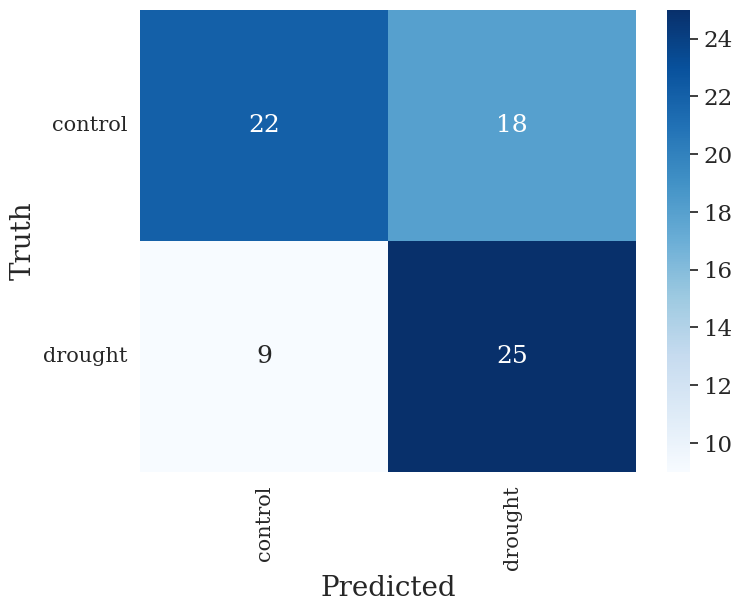

In [ ]:
y_test_pred = logreg.predict(X_test)

# print matrix
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred, pos_label='drought'))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred, pos_label='drought'))
print("Test: F1 Score:",metrics.f1_score(y_test, y_test_pred, pos_label='drought'))

###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 18},cmap="Blues")
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)

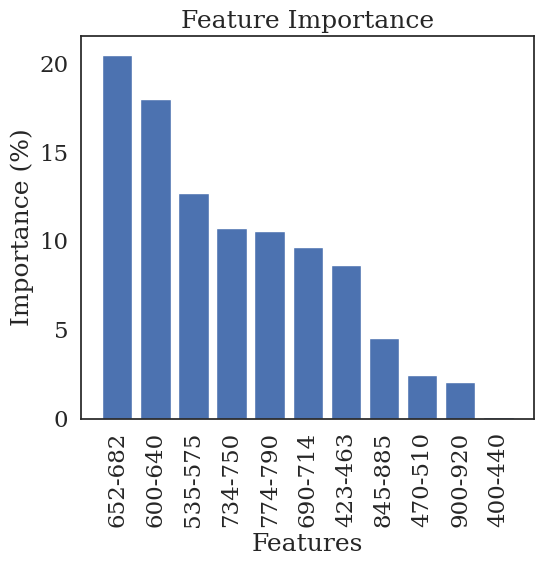

In [ ]:
# Get the coefficients of the model
coefficients = logreg.coef_[0]

# Calculate the absolute feature importance
feature_importance = np.abs(coefficients)

# Calculate the percentage of each feature importance
total_importance = np.sum(feature_importance)
percentage_importance = (feature_importance / total_importance) * 100

# Sort the feature importance in descending order
sorted_idx = np.argsort(percentage_importance)[::-1]

# Get the names of the features
feature_names = X_train.columns

# Plot the feature importance
plt.figure(figsize=(6, 6))
plt.bar(range(len(percentage_importance)), percentage_importance[sorted_idx], align='center')
plt.xticks(range(len(percentage_importance)), feature_names[sorted_idx], rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance (%)')
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

### SVM

In [ ]:
from scipy.stats import reciprocal, expon
param_distribs = {
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'shrinking': [False, True],
    'C': reciprocal(1, 1000),
    'coef0': expon(scale=1.0),
    'gamma': expon(scale=1.0),
    'degree': [1, 2, 3, 4, 5, 6, 7, 8],
    'tol': expon(scale=1e-4)
}

svm_clf = SVC()
rnd_search = RandomizedSearchCV(svm_clf, param_distributions=param_distribs,
                                n_iter=100, cv=4, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 4 folds for each of 100 candidates, totalling 400 fits
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.1s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.1s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=False, tol=2.0799307999138624e-06; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821

In [ ]:
rnd_search.best_params_

{'C': 46.302286171220985,
 'coef0': 0.7542794101939461,
 'degree': 2,
 'gamma': 5.586986528125188,
 'kernel': 'poly',
 'shrinking': True,
 'tol': 8.171095395863777e-05}

In [ ]:
best = {'C': 46.302286171220985,
 'coef0': 0.7542794101939461,
 'degree': 2,
 'gamma': 5.586986528125188,
 'kernel': 'poly',
 'shrinking': True,
 'tol': 8.171095395863777e-05}

# Create the SVC model with the best parameters from the randomized search
svc = SVC(**best)

# Fit the model to the training data
svc.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
# y_train_pred = cross_val_predict(svc, X_train, y_train, cv=3)

# # Calculate recall, precision, and F1 score
# recall = recall_score(y_train, y_train_pred, pos_label='drought')
# precision = precision_score(y_train, y_train_pred, pos_label='drought')
# f1 = f1_score(y_train, y_train_pred, pos_label='drought')

# print("Recall:", recall)
# print("Precision:", precision)
# print("F1 Score:", f1)

SVC(C=46.302286171220985, coef0=0.7542794101939461, degree=2,
    gamma=5.586986528125188, kernel='poly', tol=8.171095395863777e-05)

Test: Accuracy: 0.7432432432432432
Test: Recall: 0.7647058823529411
Test: Precision: 0.7027027027027027
Test: F1 Score: 0.7323943661971831


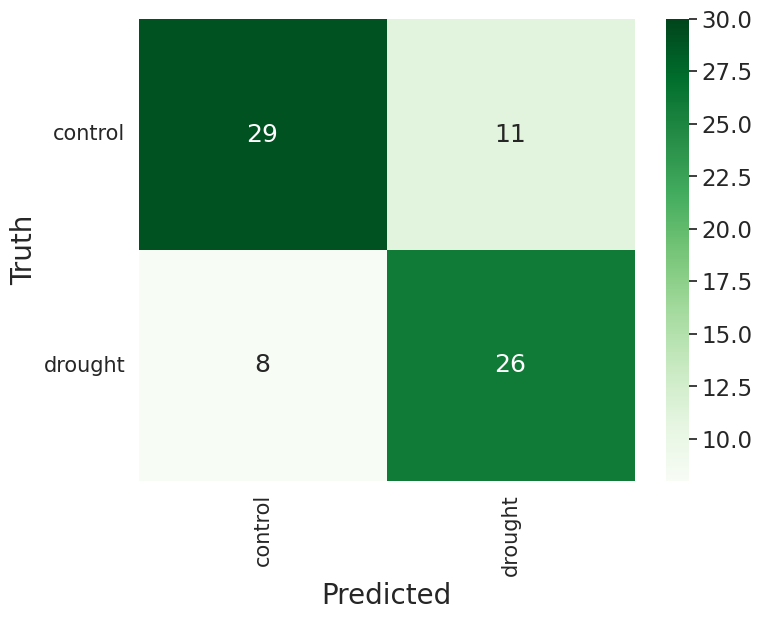

In [ ]:
y_test_pred = svc.predict(X_test)

# print matrix
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred, pos_label='drought'))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred, pos_label='drought'))
print("Test: F1 Score:",metrics.f1_score(y_test, y_test_pred, pos_label='drought'))


###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 18},cmap="Greens", vmax = 30)
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)
plt.savefig("confusion_matrix_venus.png", dpi=600, bbox_inches='tight')
plt.show()

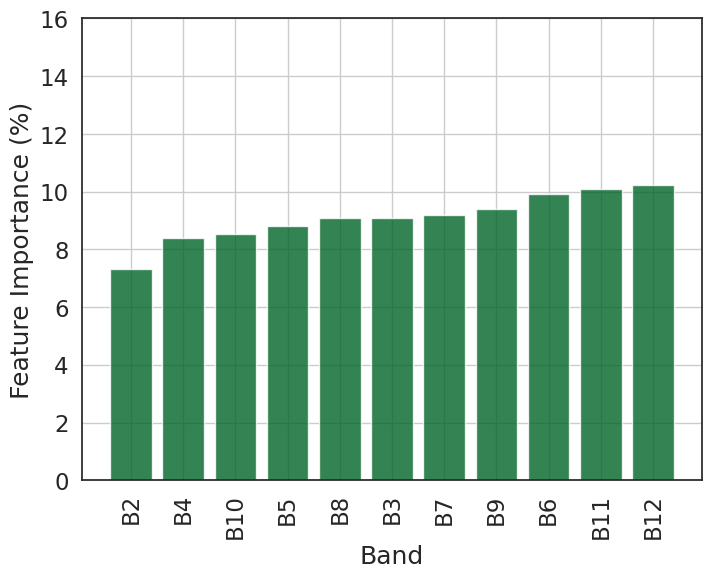

In [ ]:
# Calculate permutation feature importance
result = permutation_importance(svc, X_train, y_train, n_repeats=30, random_state=42, n_jobs=-1)

# Get feature importance and their corresponding indices
importance = result.importances_mean

# Scale to 0-100
importance = (importance / np.sum(importance)) * 100
indices = np.argsort(importance)

# Define cm
darkest_green = cm.Greens(0.9)

# Get feature names from the original DataFrame
feature_names = venus_df.columns

# Plot feature importance
plt.figure(figsize=(8, 6))
plt.bar(range(X_train.shape[1]), importance[indices], align="center", color = darkest_green, alpha=.8)
plt.xticks(range(X_train.shape[1]), feature_names[indices], rotation=90)
plt.ylabel("Feature Importance (%)")
plt.grid(True)
plt.xlabel("Band")
plt.ylim(0,16)
plt.savefig("feature_importance_venus.png", dpi=600, bbox_inches='tight')
plt.show()

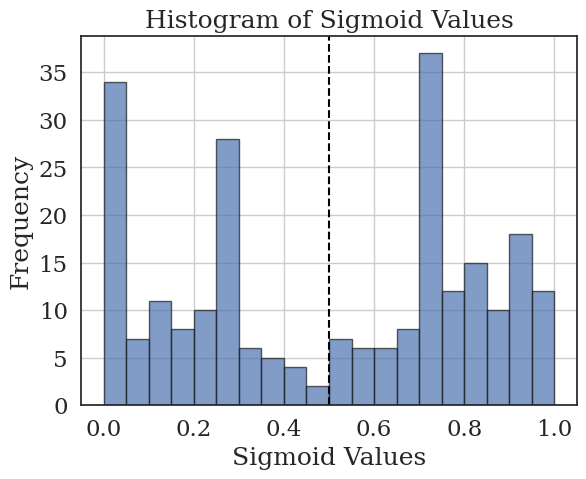

In [ ]:
# Get decision function scores
decision_scores = svc.decision_function(X)

# Apply sigmoid function to approximate probabilities
sigmoid_values = 1 / (1 + np.exp(-decision_scores))

bin_edges = np.linspace(0, 1, 21)  # 20 bins from 0 to 1

# Plot the histogram
plt.hist(sigmoid_values, bins=bin_edges, edgecolor='k', alpha=0.7)
plt.xlabel('Sigmoid Values')
plt.ylabel('Frequency')
plt.title('Histogram of Sigmoid Values')
# Add dashed line at 0.5
plt.axvline(x=0.5, color='black', linestyle='--', )
plt.grid(True)
plt.show()

#### Predict

In [ ]:
import pickle
# Save the model:
def save_model(model, scaler, filename):
    with open(filename, 'wb') as f:
        pickle.dump({'model': model, 'scaler': scaler}, f)
    print(f"Model and scaler saved to {filename}")

# Save
model = svc
scaler = scaler
filename = '/content/drive/MyDrive/LWP_Netanel/VenUs-Data/model-svm.pkl'
save_model(model, scaler, filename)

In [ ]:
!pip install rasterio
!pip install cartopy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 14.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 12.5 MB/s eta 0:00:00


In [ ]:
import pickle
import rasterio
from rasterio.windows import Window
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from rasterio.transform import from_origin

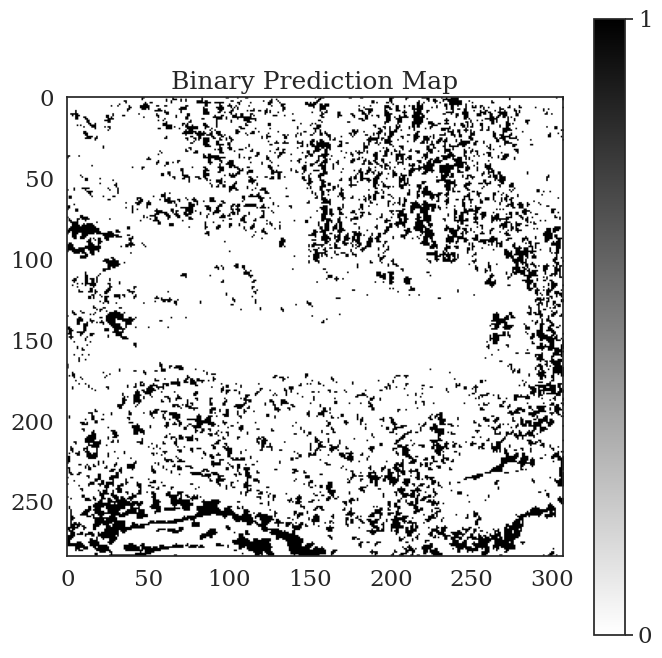

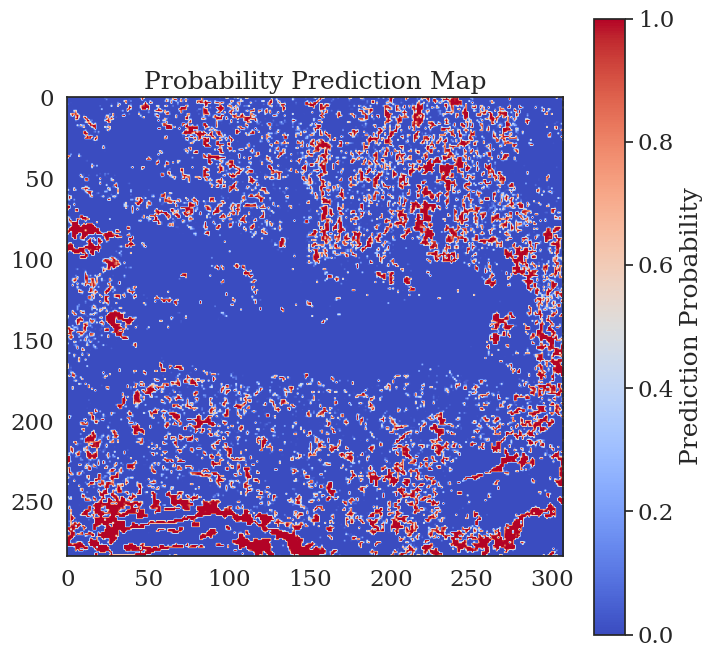

In [ ]:
# Save the model:
# def save_model(model, scaler, filename):
#     with open(filename, 'wb') as f:
#         pickle.dump({'model': model, 'scaler': scaler}, f)
#     print(f"Model and scaler saved to {filename}")

# Save
# model = svc
# scaler = scaler
# filename = '/content/drive/MyDrive/LWP_Netanel/VenUs-Data/model-svm.pkl'
# save_model(model, scaler, filename)

def load_model_and_scaler(filename='/content/drive/MyDrive/LWP_Netanel/VenUs-Data/model-svm.pkl'):
    """Load the model and scaler from a file."""
    with open(filename, 'rb') as f:
        data = pickle.load(f)
    return data['model'], data['scaler']

def predict_geotiff(model, scaler, geotiff_path, chunk_size=1000):
    """Make predictions on a GeoTIFF file using the given model and scaler, excluding the first band."""
    with rasterio.open(geotiff_path) as src:
        height = src.height
        width = src.width
        band_count = src.count

        # Initialize arrays to store predictions
        binary_predictions = np.zeros((height, width), dtype=np.float32)
        probability_predictions = np.zeros((height, width), dtype=np.float32)

        for y in range(0, height, chunk_size):
            for x in range(0, width, chunk_size):
                window = Window(x, y, min(chunk_size, width - x), min(chunk_size, height - y))
                data = src.read(window=window)

                # Exclude the first band
                data = data[1:, :, :]

                features = data.reshape(band_count - 1, -1).T

                # Normalize the features
                features_normalized = scaler.transform(features)

                # Predict probability values (decision function for SVM)
                decision_values = model.decision_function(features_normalized)

                # Convert decision function to probabilities using a logistic function
                probabilities = 1 / (1 + np.exp(-decision_values))

                # Binary predictions based on decision threshold
                binary_pred = np.where(probabilities > 0.5, 1, 0)

                # Reshape predictions back to original window size
                binary_pred = binary_pred.reshape((window.height, window.width))
                probabilities = probabilities.reshape((window.height, window.width))

                # Store predictions
                binary_predictions[y:y+window.height, x:x+window.width] = binary_pred
                probability_predictions[y:y+window.height, x:x+window.width] = probabilities

    return binary_predictions, probability_predictions, src.meta

def plot_binary_prediction(predictions, title="Binary Prediction Map"):
    """Plot binary prediction map."""
    plt.figure(figsize=(8, 8))
    plt.imshow(predictions, cmap='binary')
    # Color bar for binary (only 0 and 1 as discrete)
    plt.colorbar(ticks=[0, 1])
    plt.title(title)
    plt.show()

def plot_probability_prediction(predictions, title="Probability Prediction Map"):
    """Plot probability prediction map."""
    plt.figure(figsize=(8, 8))
    plt.imshow(predictions, cmap='coolwarm')
    plt.colorbar(label='Prediction Probability')
    plt.title(title)
    plt.show()


def save_predictions_as_geotiff(predictions, meta, output_path):
    """Save predictions as a GeoTIFF file."""
    meta.update({
        'dtype': 'float32',
        'count': 1
    })

    with rasterio.open(output_path, 'w', **meta) as dst:
        dst.write(predictions, 1)

list_files = ['/content/drive/MyDrive/LWP_Netanel/VenUs-Data/Yishi_venus_clipped_01_12_2017.tif',
              '/content/drive/MyDrive/LWP_Netanel/VenUs-Data/Yishi_venus_clipped_11_09_2018.tif',
              '/content/drive/MyDrive/LWP_Netanel/VenUs-Data/Yishi_venus_clipped_18_09_2019.tif',
              '/content/drive/MyDrive/LWP_Netanel/VenUs-Data/Yishi_venus_clipped_18_09_2020.tif']

filename = '/content/drive/MyDrive/LWP_Netanel/VenUs-Data/model-svm.pkl'
# 2. Load the model and scaler (you might do this in a separate notebook cell)
model, scaler = load_model_and_scaler()

# 3. Make predictions
geotiff_path = "/content/drive/MyDrive/LWP_Netanel/VenUs-Data/Tsora_venus_clipped_26_10_2020.tif"
binary_predictions, probability_predictions, metadata = predict_geotiff(model, scaler, geotiff_path)

# 4. Plot the results
plot_binary_prediction(binary_predictions)
plot_probability_prediction(probability_predictions)

# 5. Save
# Save binary predictions
# save_predictions_as_geotiff(binary_predictions, metadata, 'binary_predictions.tif')
# Save probability predictions
# save_predictions_as_geotiff(probability_predictions, metadata, '/content/drive/MyDrive/LWP_Netanel/VenUs-Data/Prediction_Prob_Yishi_18_09_2020.tif')


In [ ]:
import os

In [ ]:
def get_rgb_image(geotiff_path):
    """Extract RGB bands (7, 4, 3) from the GeoTIFF file."""
    with rasterio.open(geotiff_path) as src:
        red = src.read(7)
        green = src.read(4)
        blue = src.read(3)

    rgb = np.dstack((red, green, blue))
    rgb = rgb / rgb.max()  # Normalize to 0-1 range
    return rgb

def plot_multi_year_forecast_and_rgb(file_list, model, scaler):
    """Plot 4-year continuous forecasts and RGB images."""
    fig, axs = plt.subplots(2, 3, figsize=(20, 10))
    fig.suptitle('Multi-year Forecast and RGB Images', fontsize=16)

    for idx, file_path in enumerate(file_list):
        # Make predictions
        binary_predictions, probability_predictions, _ = predict_geotiff(model, scaler, file_path)

        # Get RGB image
        rgb_image = get_rgb_image(file_path)

        # Extract year and month from filename
        filename = os.path.basename(file_path)
        try:
            # Assuming the file pattern is like 'Yishi_venus_clipped_dd_mm_yyyy.tif'
            parts = filename.split('_')
            day = int(parts[3])
            month = int(parts[4])
            year = int(parts[5].split('.')[0])  # Remove the file extension
        except (IndexError, ValueError) as e:
            print(f"Error parsing date from filename {filename}: {e}")
            continue

        title = f"{day}/{month}/{year}"

        # Plot forecast
        axs[0, idx].imshow(probability_predictions, cmap='coolwarm')
        axs[0, idx].set_title(f"Forecast {title}")
        axs[0, idx].axis('off')

        # Plot RGB image
        axs[1, idx].imshow(rgb_image)
        axs[1, idx].set_title(f"RGB {title}")
        axs[1, idx].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Main execution
list_files_yishi = [
    '/content/drive/MyDrive/LWP_Netanel/VenUs-Data/Yishi_venus_clipped_01_12_2017.tif',
    '/content/drive/MyDrive/LWP_Netanel/VenUs-Data/Yishi_venus_clipped_11_09_2018.tif',
    '/content/drive/MyDrive/LWP_Netanel/VenUs-Data/Yishi_venus_clipped_18_09_2019.tif',
    '/content/drive/MyDrive/LWP_Netanel/VenUs-Data/Yishi_venus_clipped_18_09_2020.tif'
]

list_files_zora = ['/content/drive/MyDrive/LWP_Netanel/VenUs-Data/Tsora_venus_clipped_01_12_2017.tif',
                   '/content/drive/MyDrive/LWP_Netanel/VenUs-Data/Tsora_venus_clipped_04_12_2018.tif',
                   '/content/drive/MyDrive/LWP_Netanel/VenUs-Data/Tsora_venus_clipped_05_12_2019.tif',]

filename = '/content/drive/MyDrive/LWP_Netanel/VenUs-Data/model-svm.pkl'
model, scaler = load_model_and_scaler(filename)

plot_multi_year_forecast_and_rgb(list_files_zora, model, scaler)

Output hidden; open in https://colab.research.google.com to view.

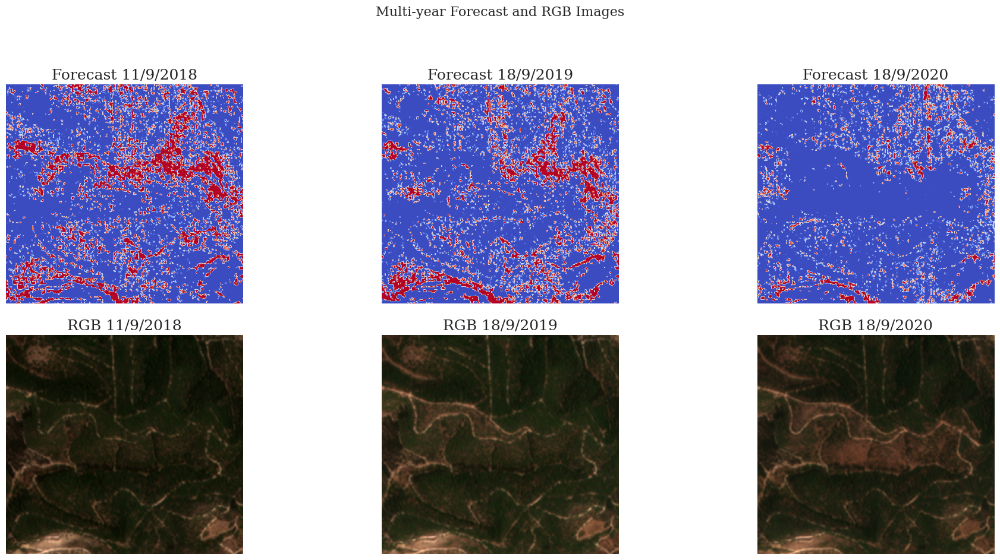

In [ ]:
def plot_multi_year_forecast_and_rgb(file_list, model, scaler):
    """Plot 4-year continuous forecasts and RGB images."""
    fig, axs = plt.subplots(2, 3, figsize=(20, 10))
    fig.suptitle('Multi-year Forecast and RGB Images', fontsize=16)

    for idx, file_path in enumerate(file_list):
        # Make predictions
        binary_predictions, probability_predictions, _ = predict_geotiff(model, scaler, file_path)

        # Get RGB image
        rgb_image = get_rgb_image(file_path)

        # Extract year and month from filename
        filename = os.path.basename(file_path)
        try:
            # Assuming the file pattern is like 'Yishi_venus_clipped_dd_mm_yyyy.tif'
            parts = filename.split('_')
            day = int(parts[3])
            month = int(parts[4])
            year = int(parts[5].split('.')[0])  # Remove the file extension
        except (IndexError, ValueError) as e:
            print(f"Error parsing date from filename {filename}: {e}")
            continue

        title = f"{day}/{month}/{year}"

        # Plot forecast
        axs[0, idx].imshow(probability_predictions, cmap='coolwarm')
        axs[0, idx].set_title(f"Forecast {title}")
        axs[0, idx].axis('off')

        # Plot RGB image
        axs[1, idx].imshow(rgb_image)
        axs[1, idx].set_title(f"RGB {title}")
        axs[1, idx].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Main execution
list_files_yishi = [
    '/content/drive/MyDrive/LWP_Netanel/VenUs-Data/Yishi_venus_clipped_01_12_2017.tif',
    '/content/drive/MyDrive/LWP_Netanel/VenUs-Data/Yishi_venus_clipped_11_09_2018.tif',
    '/content/drive/MyDrive/LWP_Netanel/VenUs-Data/Yishi_venus_clipped_18_09_2019.tif',
    '/content/drive/MyDrive/LWP_Netanel/VenUs-Data/Yishi_venus_clipped_18_09_2020.tif'
]

list_files_zora = ['/content/drive/MyDrive/LWP_Netanel/VenUs-Data/Tsora_venus_clipped_11_09_2018.tif',
                   '/content/drive/MyDrive/LWP_Netanel/VenUs-Data/Tsora_venus_clipped_18_09_2019.tif',
                   '/content/drive/MyDrive/LWP_Netanel/VenUs-Data/Tsora_venus_clipped_18_09_2020.tif']

filename = '/content/drive/MyDrive/LWP_Netanel/VenUs-Data/model-svm.pkl'
model, scaler = load_model_and_scaler(filename)

plot_multi_year_forecast_and_rgb(list_files_zora, model, scaler)

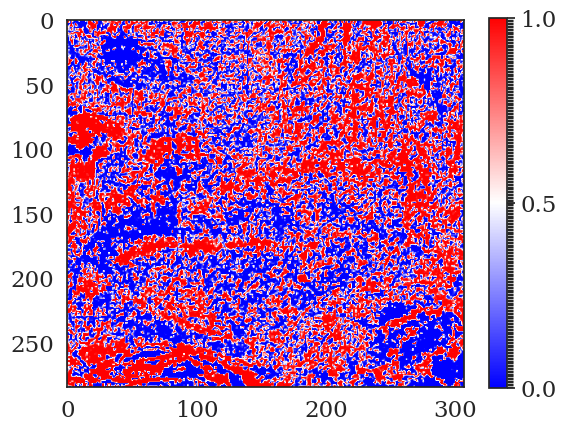

In [ ]:
# Plot color bar of coolwarm 0-1 range
cmap = mcolors.LinearSegmentedColormap.from_list("", ["blue", "white", "red"])
bounds = np.linspace(0, 1, 256)
norm = mcolors.BoundaryNorm(bounds, cmap.
    N)

plt.imshow(probability_predictions, cmap=cmap, norm=norm)
# Add ticks 0,0.5, 1
plt.colorbar(ticks=[0, 0.5, 1])
plt.show()

### RF

In [ ]:
param_distribs = {
'n_estimators':[int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)],
'criterion': ['gini', 'entropy'],
'max_depth': [int(x) for x in np.linspace(10, 110, num = 11)],
'min_samples_split': [2, 5, 10],
'min_samples_leaf': [1, 2, 4],
'max_features': ['auto', 'sqrt'],
}

rf_clf = RandomForestClassifier(random_state=42)
rnd_search = RandomizedSearchCV(rf_clf, param_distributions=param_distribs,
n_iter=100, cv=3, scoring='accuracy',
verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 3 folds for each of 100 candidates, totalling 300 fits
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=  13.8s


KeyboardInterrupt: 

In [ ]:
best = {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1,  'max_depth': 50, 'criterion': 'gini'}
# Create the Random Forest model with the best parameters from the randomized search
rf = RandomForestClassifier(**best, random_state=42)

# Fit the model to the training data
rf.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(rf, X_train, y_train, cv=5)

# Calculate recall, precision, and F1 score
# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')

print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Recall: 0.6781609195402298
Precision: 0.6344086021505376
F1 Score: 0.6555555555555556


Test: Accuracy: 0.5405405405405406
Test: Recall: 0.4117647058823529
Test: Precision: 0.5
Test: F1 Score: 0.45161290322580644


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

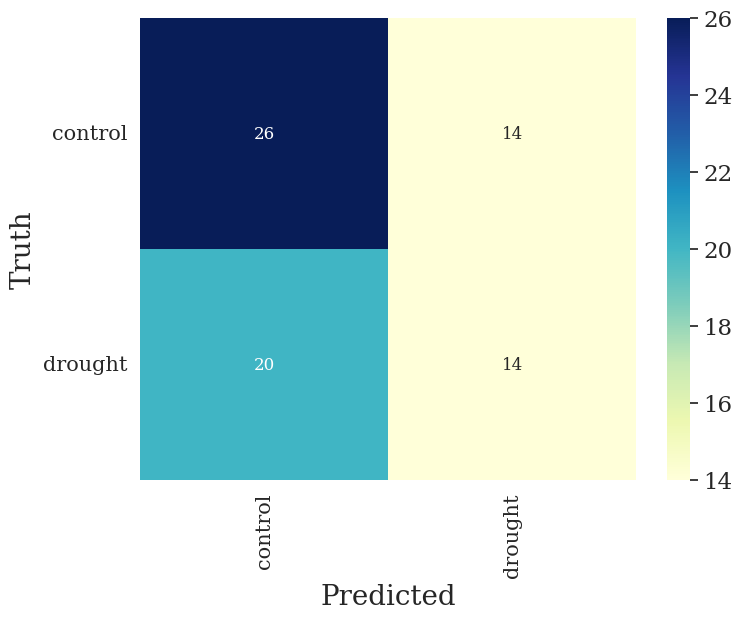

In [ ]:
y_test_pred = rf.predict(X_test)

# Print metrics
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred, pos_label='drought'))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred, pos_label='drought'))
print("Test: F1 Score:",metrics.f1_score(y_test, y_test_pred, pos_label='drought'))

# Confusion matrix
# Labels for confusion matrix:
unique_label = np.unique([y_test, y_test_pred])

# Create confusion matrix dataframe:
cmtx = pd.DataFrame(
confusion_matrix(y_test, y_test_pred, labels=unique_label),
index=[x for x in unique_label],
columns=[x for x in unique_label])
plt.figure(figsize=(8, 6))
sns.heatmap(cmtx, annot=True, fmt='d', annot_kws={"size": 12}, cmap="YlGnBu")
plt.xlabel('Predicted', fontsize=20)
plt.ylabel('Truth', fontsize=20)
plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15, rotation=0)

## Sentinel-2

In [4]:
# Define the wavelength ranges of each band in nanometers (nm)
sentinel_bands = [
    (443, 490),   # Band 1 (Coastal aerosol)
    (490, 560),   # Band 2 (Blue)
    (560, 665),   # Band 3 (Green)
    (665, 705),   # Band 4 (Red)
    (705, 740),   # Band 5 (Vegetation Red Edge)
    (740, 783),   # Band 6 (Vegetation Red Edge)
    (783, 842),   # Band 7 (Vegetation Red Edge)
    (842, 865),   # Band 8 (Near Infrared)
    (865, 945),   # Band 8A (Narrow Near Infrared)
    (945, 1375),  # Band 9 (Water vapour)
    (1375, 1610), # Band 10 (Cirrus)
    (1610, 2190), # Band 11 (Short Wave Infrared)
    (2190, 2200)  # Band 12 (Short Wave Infrared)
]

sentinel_bands_dict = {
    (443, 490): [],
    (490, 560): [],
    (560, 665): [],
    (665, 705): [],
    (705, 740): [],
    (740, 783): [],
    (783, 842): [],
    (842, 865): [],
    (865, 945): [],
    (945, 1375): [],
    (1375, 1610): [],
    (1610, 2190): [],
    (2190, 2200): []
}

In [5]:
# Loop through the columns in the DataFrame and append the column name to the list of the corresponding key
for col in df[df.columns[:-7]].columns:
    for band in sentinel_bands:
        if int(col) in range(band[0], band[1]):
            sentinel_bands_dict[band].append(col)

print(sentinel_bands_dict)

{(443, 490): ['444', '446', '448', '451', '453', '455', '457', '460', '462', '464', '466', '468', '471', '473', '475', '477', '479', '482', '484', '486', '488'], (490, 560): ['490', '493', '495', '497', '499', '502', '504', '506', '508', '510', '513', '515', '517', '519', '521', '524', '526', '528', '530', '533', '535', '537', '539', '541', '544', '546', '548', '550', '552', '555', '557', '559'], (560, 665): ['561', '563', '566', '568', '570', '572', '575', '577', '579', '581', '583', '586', '588', '590', '592', '594', '597', '599', '601', '603', '605', '608', '610', '612', '614', '617', '619', '621', '623', '625', '628', '630', '632', '634', '636', '639', '641', '643', '645', '648', '650', '652', '654', '656', '659', '661', '663'], (665, 705): ['665', '667', '670', '672', '674', '676', '678', '681', '683', '685', '687', '690', '692', '694', '696', '698', '701', '703'], (705, 740): ['705', '707', '709', '712', '714', '716', '718', '721', '723', '725', '727', '729', '732', '734', '736',

In [6]:
# Create a new DataFrame for all the columns that have the same value to produce one average column of all these columns
sentinel_df = pd.DataFrame()
for band, cols in sentinel_bands_dict.items():
    if len(cols) > 0:
        new_col_name = f'{band[0]}-{band[1]}'
        sentinel_df[new_col_name] = df[cols].mean(axis=1)

# Rename columns to bands names
sentinel_df.columns = ['B01', 'B02','B03', 'B04','B05','B06','B07', 'B08','B8A', 'B09']

sentinel_df

,B01,B02,B03,B04,B05,B06,B07,B08,B8A,B09
0,0.033770,0.048394,0.051638,0.043978,0.133212,0.215064,0.227694,0.231635,0.230752,0.221788
15,0.027025,0.038897,0.043379,0.039391,0.120278,0.206091,0.220264,0.224398,0.228789,0.225092
14,0.021098,0.030469,0.031654,0.025870,0.080441,0.130355,0.138444,0.141381,0.142170,0.135133
12,0.046543,0.064377,0.068741,0.061308,0.159779,0.249004,0.265036,0.271397,0.277139,0.271064
11,0.021761,0.032902,0.032675,0.027296,0.124336,0.227139,0.241955,0.245639,0.247818,0.237482
...,...,...,...,...,...,...,...,...,...,...
220,0.029481,0.043863,0.044709,0.042376,0.170402,0.301387,0.323257,0.340519,0.345904,0.338245
219,0.022110,0.031804,0.032251,0.028497,0.099873,0.172741,0.183248,0.193410,0.190515,0.187000
244,0.025220,0.035592,0.036974,0.033954,0.122498,0.222904,0.239148,0.250461,0.250341,0.239892
231,0.050435,0.073153,0.077304,0.069705,0.190449,0.288297,0.301719,0.314127,0.310940,0.307219


In [9]:
# Define features and labels
X = sentinel_df

# Standardize features
scaler = StandardScaler()
X = scaler.fit_transform(X)

y = df['treatment']

# Split to train-test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

X_train.shape,X_test.shape

((172, 10), (74, 10))

### SVM

In [10]:
from scipy.stats import reciprocal, expon
param_distribs = {
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'shrinking': [False, True],
    'C': reciprocal(1, 1000),
    'coef0': expon(scale=1.0),
    'gamma': expon(scale=1.0),
    'degree': [1, 2, 3, 4, 5, 6, 7, 8],
    'tol': expon(scale=1e-4)
}

svm_clf = SVC()
rnd_search = RandomizedSearchCV(svm_clf, param_distributions=param_distribs,
                                n_iter=50, cv=3, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=False, tol=2.0799307999138624e-06; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=False, tol=2.0799307999138624e-06; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821

In [11]:
BEST_SVC ={'C': 46.302286171220985, 'coef0': 0.7542794101939461, 'degree': 2, 'gamma': 5.586986528125188, 'kernel': 'poly', 'shrinking': True, 'tol': 8.171095395863777e-05}

# Create the SVC model with the best parameters from the randomized search
svc = SVC(**BEST_SVC)

# Fit the model to the training data
svc.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(svc, X_train, y_train, cv=3)

# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')

print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Recall: 0.7241379310344828
Precision: 0.6057692307692307
F1 Score: 0.6596858638743456


Save the model

In [17]:
    model_and_scaler = {
        'scaler': scaler,
        'model': svc
    }


joblib.dump(model_and_scaler, '/content/drive/MyDrive/LWP_Netanel/S2_model_and_scaler.pkl')

['/content/drive/MyDrive/LWP_Netanel/S2_model_and_scaler.pkl']

In [ ]:
loaded_container = joblib.load('/content/drive/MyDrive/LWP_Netanel/model_and_scaler.pkl')
loaded_scaler = loaded_container['scaler']
loaded_model = loaded_container['model']

    # You can now use loaded_scaler and loaded_model
    # transformed_data = loaded_scaler.transform(new_data)
    # predictions = loaded_model.predict(transformed_data)

In [12]:
import joblib

# Save the model to disk
joblib.dump(svc, '/content/drive/MyDrive/LWP_Netanel/S2_svm_classification_model.pkl')

['/content/drive/MyDrive/LWP_Netanel/S2_svm_classification_model.pkl']

In [16]:
# load model:
svc = joblib.load('/content/drive/MyDrive/LWP_Netanel/S2_svm_classification_model.pkl')
svc

SVC(C=46.302286171220985, coef0=0.7542794101939461, degree=2,
    gamma=5.586986528125188, kernel='poly', tol=8.171095395863777e-05)

Test: Accuracy: 0.7027027027027027
Test: Recall: 0.7352941176470589
Test: Precision: 0.6578947368421053
Test: F1 Score: 0.6944444444444444


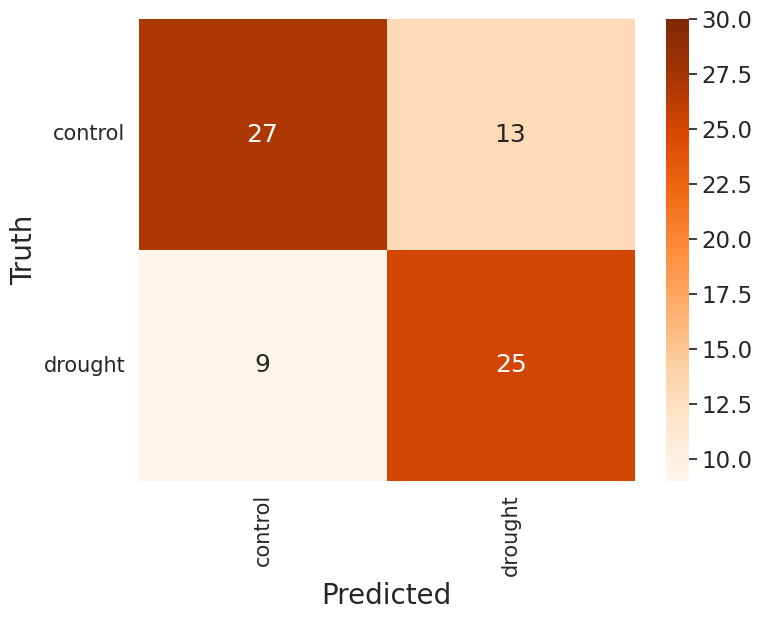

In [ ]:
y_test_pred = svc.predict(X_test)

# print matrix
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred, pos_label='drought'))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred, pos_label='drought'))
print("Test: F1 Score:",metrics.f1_score(y_test, y_test_pred, pos_label='drought'))

###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 18},cmap="Oranges", vmax = 30)
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)
plt.savefig('S2_svm_classification_confusion_matrix.png', dpi=600, bbox_inches='tight')

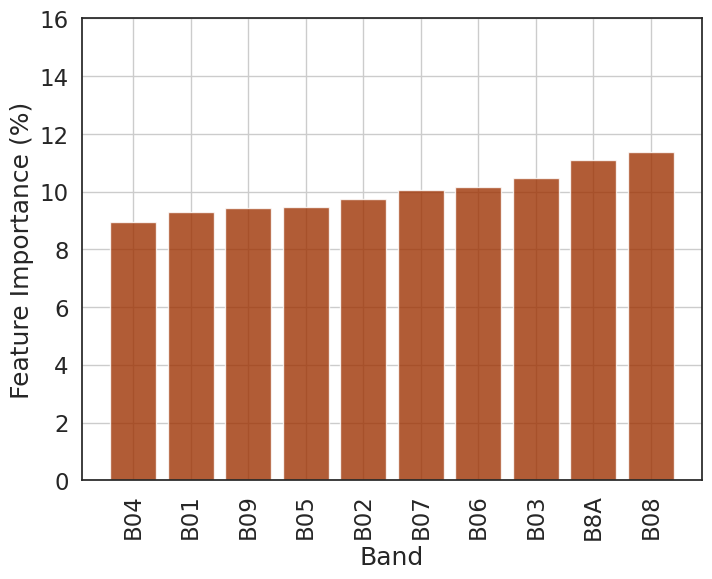

In [ ]:
# Calculate permutation feature importance
result = permutation_importance(svc, X_train, y_train, n_repeats=30, random_state=42, n_jobs=-1)

# Get feature importance and their corresponding indices
importance = result.importances_mean

# Scale to 0-100
importance = (importance / np.sum(importance)) * 100
indices = np.argsort(importance)

# Define cm
darkest_orange = cm.Oranges(0.9)

# Get feature names from the original DataFrame
feature_names = sentinel_df.columns

# Plot feature importance
plt.figure(figsize=(8, 6))
plt.bar(range(X_train.shape[1]), importance[indices], align="center", color = darkest_orange, alpha=.8)
plt.xticks(range(X_train.shape[1]), feature_names[indices], rotation=90)
plt.ylabel("Feature Importance (%)")
plt.grid(True)
plt.ylim(0,16)
plt.xlabel("Band")
plt.savefig('S2_svm_classification_feature_importance.png', dpi=600, bbox_inches='tight')
plt.show()

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


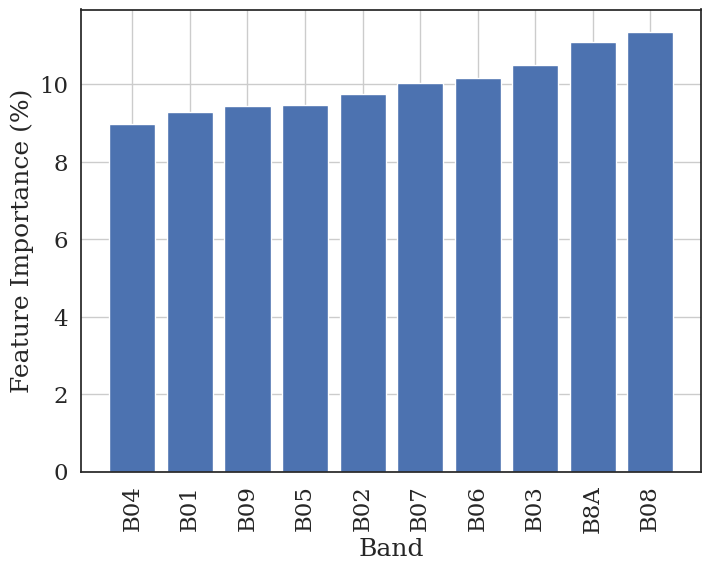

In [ ]:
# Calculate permutation feature importance
result = permutation_importance(svc, X_train, y_train, n_repeats=30, random_state=42, n_jobs=-1)

# Get feature importance and their corresponding indices
importance = result.importances_mean

# Scale to 0-100
importance = (importance / np.sum(importance)) * 100
indices = np.argsort(importance)


# Get feature names from the original DataFrame
feature_names = sentinel_df.columns

# Plot feature importance
plt.figure(figsize=(8, 6))
plt.bar(range(X_train.shape[1]), importance[indices], align="center")
plt.xticks(range(X_train.shape[1]), feature_names[indices], rotation=90)
plt.ylabel("Feature Importance (%)")
plt.grid(True)
plt.xlabel("Band")
plt.show()

### Logistic Regression

In [ ]:
param_distribs = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'C': reciprocal(1, 1000),
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'tol': expon(scale=1e-4),
    'fit_intercept': [False, True],
    'intercept_scaling': expon(scale=1.0),
    'max_iter': [100, 200, 300, 400, 500, 600, 700]
}

logreg_clf = LogisticRegression()
rnd_search = RandomizedSearchCV(logreg_clf, param_distributions=param_distribs,
                                n_iter=100, cv=5, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=lbfgs, tol=1.6959629191460517e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=lbfgs, tol=1.6959629191460517e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=lbfgs, tol=1.6959629191460517e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=lbfgs, tol=1.6959629191460517e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=lbfgs, tol=1.6959629191460517e-05; total time=   0.0s
[CV] END C=1.4936568554617629, fit_intercept=True, i

In [ ]:
# Create the Logistic Regression model with the best parameters from the randomized search
logreg = LogisticRegression(**rnd_search.best_params_)

# Fit the model to the training data
logreg.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(logreg, X_train, y_train, cv=5)

# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')


print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Recall: 0.5632183908045977
Precision: 0.550561797752809
F1 Score: 0.5568181818181818


Test: Accuracy: 0.5405405405405406
Test: Recall: 0.6176470588235294
Test: Precision: 0.5
Test: F1 Score: 0.5526315789473685


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

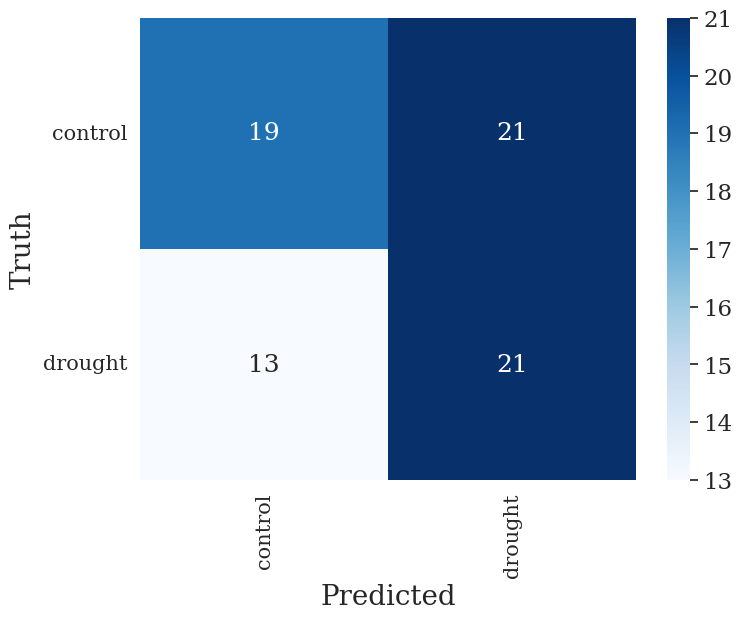

In [ ]:
y_test_pred = logreg.predict(X_test)

# print matrix
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred, pos_label='drought'))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred, pos_label='drought'))
print("Test: F1 Score:",metrics.f1_score(y_test, y_test_pred, pos_label='drought'))


###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 18},cmap="Blues")
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)

In [ ]:
# Fit the model to the training data
logreg.fit(X_train, y_train)

# Get the coefficients of the model
coefficients = logreg.coef_[0]

# Calculate the absolute feature importance
feature_importance = np.abs(coefficients)

# Calculate the percentage of each feature importance
total_importance = np.sum(feature_importance)
percentage_importance = (feature_importance / total_importance) * 100

# Sort the feature importance in descending order
sorted_idx = np.argsort(percentage_importance)[::-1]

# Get the names of the features
feature_names = X_train.columns

# Plot the feature importance
plt.figure(figsize=(10, 6))
plt.bar(range(len(percentage_importance)), percentage_importance[sorted_idx], align='center')
plt.xticks(range(len(percentage_importance)), feature_names[sorted_idx], rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance (%)')
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

AttributeError: 'numpy.ndarray' object has no attribute 'columns'

### RF

In [ ]:
param_distribs = {
'n_estimators':[int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)],
'criterion': ['gini', 'entropy'],
'max_depth': [int(x) for x in np.linspace(10, 110, num = 11)],
'min_samples_split': [2, 5, 10],
'min_samples_leaf': [1, 2, 4],
'max_features': ['auto', 'sqrt'],
}

rf_clf = RandomForestClassifier(random_state=42)
rnd_search = RandomizedSearchCV(rf_clf, param_distributions=param_distribs,
n_iter=100, cv=3, scoring='accuracy',
verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 3 folds for each of 100 candidates, totalling 300 fits
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   3.5s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   5.3s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   3.2s
[CV] END criterion=gini, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.0s
[CV] END criterion=gini, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   1.9s
[CV] END criterion=gini, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1400; total time=   3.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1400; total time=   3.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1400; total time=   3.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1200; total time=   3.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1200; total time=   2.4s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1200; total time=   3.5s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   3.0s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   2.7s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   2.7s
[CV] END criterion=entropy, max_depth=7

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   4.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   3.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   3.2s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.3s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.9s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.9s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.6s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.8s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   3.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   5.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   3.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   3.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   5.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   4.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   3.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   3.6s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   2.7s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   4.3s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   3.4s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   1.4s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   1.3s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   1.3s
[CV] END criterion=entropy, 

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   3.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   3.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   2.4s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   3.3s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   6.1s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=  10.1s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=  13.1s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=  11.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   4.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   3.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   3.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   1.2s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   2.4s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   2.1s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   1.8s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   5.1s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   5.7s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   8.3s
[CV] END criterion=entropy, max_d

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1800; total time=   8.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1800; total time=   9.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1800; total time=  11.5s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.7s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.7s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.7s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.6s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.8s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   3.8s
[CV] END criterion=gini, max_depth=

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=400; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=400; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=400; total time=   0.7s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   3.9s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   5.5s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   3.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=400; total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=400; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=400; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   4.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   5.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   3.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=   2.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=   2.5s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.7s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.7s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.7s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   2.0s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.2s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.3s
[CV] END criterion=entropy, max_

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=800; total time=   1.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=800; total time=   2.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=800; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   2.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   1.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   1.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   3.6s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   5.5s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   3.0s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1600; total time=   2.7s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1600; total time=   3.0s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1600; total time=   3.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1000; total time=   3.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1000; total time=   1.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1000; total time=   1.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.6s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   7.1s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   3.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   4.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   5.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   3.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   3.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   3.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   4.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   4.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   5.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   4.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   3.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   3.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1600; total time=   4.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1600; total time=   3.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1600; total time=   3.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   3.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   4.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   8.7s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=1600; total time=   7.5s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=1600; total time=   6.5s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=1600; total time=   3.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   6.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.8s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=800; total time=   1.5s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=800; total time=   1.5s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=800; total time=   1.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=   5.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=   5.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=   3.8s
[CV] END criterion=entropy, max_depth=100, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.5s
[CV] END criterion=entropy, max_depth=100, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END criterion=entropy, max_depth=100, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END criterion=entropy, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1400; total time=   3.3s
[CV] END criterion=entropy, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1400; total time=   4.2s
[CV] END criterion=entropy, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1400; total time=   2.6s
[CV] END criterion=

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1200; total time=   3.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1200; total time=   2.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1200; total time=   2.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=2000; total time=   4.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=2000; total time=   6.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=2000; total time=   4.9s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   3.3s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   3.1s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   6.5s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.2s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=600; total time=   1.1s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=600; total time=   1.3s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=600; total time=   1.8s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   3.8s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   2.1s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   2.2s
[CV] END criterion=entropy, max_de

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1400; total time=   4.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1400; total time=   2.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1400; total time=   2.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   4.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   5.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   4.1s
[CV] END criterion=entropy, max_depth=70, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   2.3s
[CV] END criterion=entropy, max_depth=70, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   2.6s
[CV] END criterion=entropy, max_depth=70, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   3.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=600; total time=   1.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=600; total time=   1.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   7.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   4.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   3.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=2000; total time=   3.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=2000; total time=   5.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=2000; total time=   3.6s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=800; total time=   1.4s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=800; total time=   1.4s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=800; total time=   1.4s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1600; total time=   3.4s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1600; total time=   4.4s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1600; total time=   2.8s
[CV] END criterion=entropy, max_depth

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   3.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   3.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.1s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   2.9s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   3.0s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   4.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1000; total time=   2.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1000; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1000; total time=   2.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   3.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   4.9s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   3.0s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   3.1s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=80, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   5.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=80, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=80, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   3.1s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=   3.6s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=   5.6s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=   3.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1400; total time=   2.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1400; total time=   2.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1400; total time=   4.3s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   2.5s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   2.5s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   2.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=   1.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=   3.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=   2.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.1s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=1200; total time=   2.1s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=1200; total time=   2.1s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=1200; total time=   2.1s
Best parameters: {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 110, 'criterion': 'entropy'}
Best cross-validation score: 0.65


In [ ]:
best_s2 = {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 110, 'criterion': 'entropy'}
# Create the Random Forest model with the best parameters from the randomized search
rf = RandomForestClassifier(**best_s2, random_state=42)

# Fit the model to the training data
rf.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(rf, X_train, y_train, cv=5)

# Calculate recall, precision, and F1 score
# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')

print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Recall: 0.5747126436781609
Precision: 0.5555555555555556
F1 Score: 0.5649717514124294


Test: Accuracy: 0.5135135135135135
Test: Recall: 0.4411764705882353
Test: Precision: 0.46875
Test: F1 Score: 0.45454545454545453


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

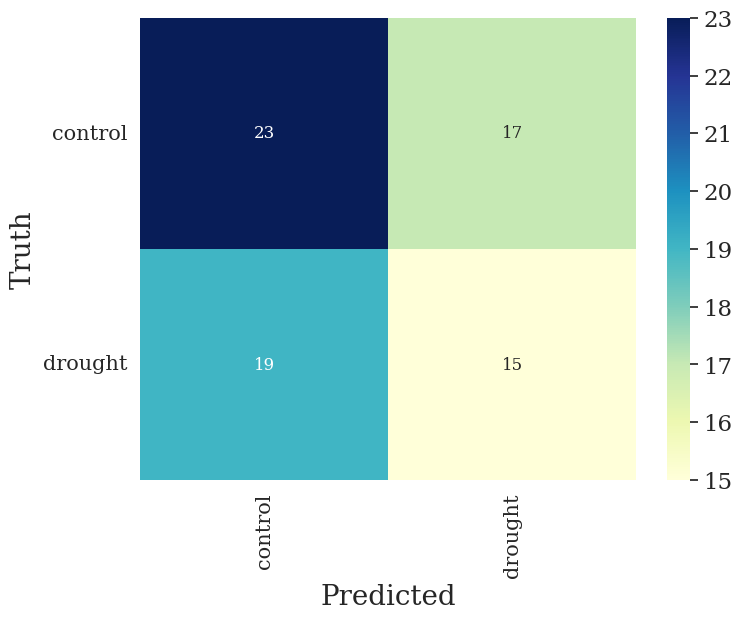

In [ ]:
y_test_pred = rf.predict(X_test)

# Print metrics
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred, pos_label='drought'))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred, pos_label='drought'))
print("Test: F1 Score:",metrics.f1_score(y_test, y_test_pred, pos_label='drought'))

# Confusion matrix
# Labels for confusion matrix:
unique_label = np.unique([y_test, y_test_pred])

# Create confusion matrix dataframe:
cmtx = pd.DataFrame(
confusion_matrix(y_test, y_test_pred, labels=unique_label),
index=[x for x in unique_label],
columns=[x for x in unique_label])
plt.figure(figsize=(8, 6))
sns.heatmap(cmtx, annot=True, fmt='d', annot_kws={"size": 12}, cmap="YlGnBu")
plt.xlabel('Predicted', fontsize=20)
plt.ylabel('Truth', fontsize=20)
plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15, rotation=0)

# Draft

In [ ]:
df_bands = df[df.columns[:-6]]

# Define features and labels
X = df_bands

# Encode "English_name"
label_encoder = LabelEncoder()
X["English_name_encoded"] = label_encoder.fit_transform(df["English_name"])
X['spectral_date'] = df['spectral_date'].values
X['English_name'] = df['English_name'].values
X['ID'] = df['ID'].values

# Print the mapping of the encoded values
english_name_mapping = dict(zip(label_encoder.transform(label_encoder.classes_),label_encoder.classes_))

y = df['treatment']

# Split to train-test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# save date of test set for research later
dates_test = X_test['spectral_date']
ids_test = X_test['ID']

# drop from sets
X_train,X_test = X_train.drop(['English_name','spectral_date', 'ID'],axis=1),X_test.drop(['English_name','spectral_date', 'ID'],axis=1)

X_train.shape,X_test.shape

<ipython-input-7-1feb80908c99>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["English_name_encoded"] = label_encoder.fit_transform(df["English_name"])
<ipython-input-7-1feb80908c99>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['spectral_date'] = df['spectral_date'].values
<ipython-input-7-1feb80908c99>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:

((172, 275), (74, 275))

Ensemble Test Accuracy: 0.5676
Ensemble Test F1 Score: 0.5676
Ensemble Test Recall: 0.6176
Ensemble Test Precision: 0.5250


Text(0.5, 0, 'Predicted')

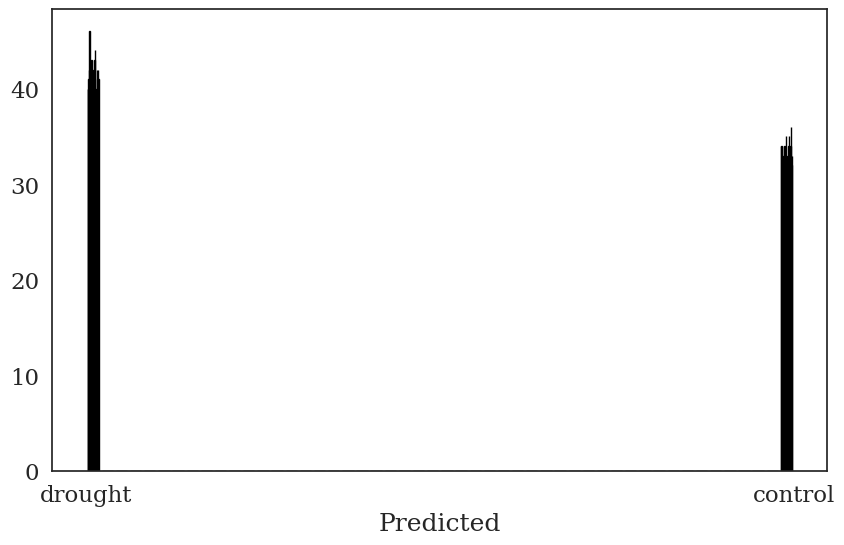

In [ ]:
import random
# -------------------------------
# 1. Define parameters
# -------------------------------
num_models = 30   # Number of models to train
num_features = 10  # Features per model
models = []       # Store trained models
selected_features_list = []  # Store selected features for each model

# -------------------------------
# 2. Train Multiple Logistic Regression Models on Random Feature Subsets
# -------------------------------
for i in range(num_models):
    # Randomly select 10 features
    selected_features = random.sample(list(X_train.columns), num_features)
    selected_features_list.append(selected_features)

    # Subset dataset
    X_train_subset = X_train[selected_features]
    X_test_subset = X_test[selected_features]

    # Train a fast Logistic Regression model
    model = LogisticRegression(max_iter=200, solver='liblinear', random_state=i)

    # Fit model
    model.fit(X_train_subset, y_train)

    # Store trained model
    models.append(model)

# -------------------------------
# 3. Generate Predictions from Each Model
# -------------------------------
predictions = np.zeros((len(X_test), num_models), dtype=object)

for i, model in enumerate(models):
    X_test_subset = X_test[selected_features_list[i]]
    predictions[:, i] = model.predict(X_test_subset)

# -------------------------------
# 4. Ensemble: Majority Voting
# -------------------------------
def majority_vote(preds):
    return np.array([Counter(row).most_common(1)[0][0] for row in preds])

ensemble_predictions = majority_vote(predictions)

# -------------------------------
# 5. Evaluate Model Performance
# -------------------------------
accuracy = accuracy_score(y_test, ensemble_predictions)
f1 = f1_score(y_test, ensemble_predictions, pos_label='drought')
recall = recall_score(y_test, ensemble_predictions, pos_label='drought')
precision = precision_score(y_test, ensemble_predictions, pos_label='drought')

print(f"Ensemble Test Accuracy: {accuracy:.4f}")
print(f"Ensemble Test F1 Score: {f1:.4f}")
print(f"Ensemble Test Recall: {recall:.4f}")
print(f"Ensemble Test Precision: {precision:.4f}")

# plot the distribution of the predictions
plt.figure(figsize=(10, 6))
plt.hist(predictions, bins=50, edgecolor='black')
plt.xlabel('Predicted')

## World View- 3

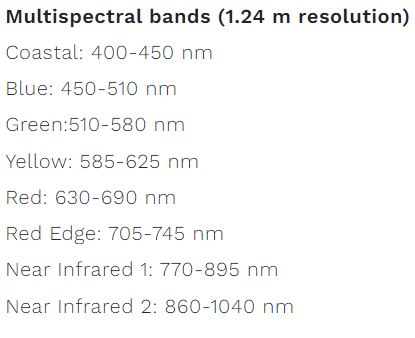

In [ ]:
wv_bands_dict = {
    (400, 450): [],
    (450, 510): [],
    (510, 580): [],
    (585, 625): [],
    (630, 690): [],
    (705, 745): [],
    (770, 895): [],
    (860, 1040): []
}

for col in df[df.columns[:-6]].columns:
    int_col = int(col)
    for band_range in wv_bands_dict:
        if int_col in range(band_range[0], band_range[1]):
            wv_bands_dict[band_range].append(col)

print(wv_bands_dict)

{(400, 450): ['400', '402', '404', '406', '409', '411', '413', '415', '417', '420', '422', '424', '426', '429', '431', '433', '435', '437', '440', '442', '444', '446', '448'], (450, 510): ['451', '453', '455', '457', '460', '462', '464', '466', '468', '471', '473', '475', '477', '479', '482', '484', '486', '488', '490', '493', '495', '497', '499', '502', '504', '506', '508'], (510, 580): ['510', '513', '515', '517', '519', '521', '524', '526', '528', '530', '533', '535', '537', '539', '541', '544', '546', '548', '550', '552', '555', '557', '559', '561', '563', '566', '568', '570', '572', '575', '577', '579'], (585, 625): ['586', '588', '590', '592', '594', '597', '599', '601', '603', '605', '608', '610', '612', '614', '617', '619', '621', '623'], (630, 690): ['630', '632', '634', '636', '639', '641', '643', '645', '648', '650', '652', '654', '656', '659', '661', '663', '665', '667', '670', '672', '674', '676', '678', '681', '683', '685', '687'], (705, 745): ['705', '707', '709', '712',

In [ ]:
# Create a new DataFrame for all the columns that have the same value to produce one average column of all these columns
wv_df = pd.DataFrame()
for band, cols in wv_bands_dict.items():
    if len(cols) > 0:
        new_col_name = f'{band[0]}-{band[1]}'
        wv_df[new_col_name] = df[cols].mean(axis=1)

wv_df

,400-450,450-510,510-580,585-625,630-690,705-745,770-895,860-1040
0,0.027575,0.035676,0.054533,0.052885,0.042283,0.140348,0.229660,0.227380
15,0.025971,0.028360,0.044123,0.044140,0.037465,0.127550,0.222474,0.227326
14,0.025990,0.021380,0.035113,0.032197,0.025186,0.084850,0.139968,0.139495
12,0.043343,0.047903,0.072481,0.069460,0.059138,0.167562,0.268282,0.274686
11,0.023581,0.022169,0.038319,0.033054,0.024849,0.133068,0.243929,0.243772
...,...,...,...,...,...,...,...,...
220,0.029117,0.030250,0.050453,0.044593,0.037535,0.181469,0.330152,0.342733
219,0.018355,0.022944,0.035892,0.032920,0.026083,0.105996,0.187104,0.189288
244,0.024228,0.025952,0.040300,0.037278,0.031132,0.130736,0.243458,0.246254
231,0.042497,0.052013,0.083376,0.078119,0.064912,0.199142,0.307984,0.309702


In [ ]:
# Define features and labels
X = wv_df

#X = X.apply(lambda row: (row - row.min()) / (row.max() - row.min()), axis=1)


y = df['treatment']

# Split to train-test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

X_train.shape,X_test.shape

((172, 8), (74, 8))

### Logistic regression

In [ ]:
param_distribs = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'C': reciprocal(1, 1000),
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'tol': expon(scale=1e-4),
    'fit_intercept': [False, True],
    'intercept_scaling': expon(scale=1.0),
    'max_iter': [100, 200, 300, 400, 500, 600, 700]
}

logreg_clf = LogisticRegression()
rnd_search = RandomizedSearchCV(logreg_clf, param_distributions=param_distribs,
                                n_iter=100, cv=5, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=lbfgs, tol=1.6959629191460517e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=lbfgs, tol=1.6959629191460517e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=lbfgs, tol=1.6959629191460517e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=lbfgs, tol=1.6959629191460517e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=lbfgs, tol=1.6959629191460517e-05; total time=   0.0s
[CV] END C=1.4936568554617629, fit_intercept=True, i

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/py

[CV] END C=1.2414804282743948, fit_intercept=True, intercept_scaling=1.4922453771381408, max_iter=200, penalty=l2, solver=sag, tol=9.110544123832751e-05; total time=   0.0s
[CV] END C=1.2414804282743948, fit_intercept=True, intercept_scaling=1.4922453771381408, max_iter=200, penalty=l2, solver=sag, tol=9.110544123832751e-05; total time=   0.0s
[CV] END C=582.9384542994736, fit_intercept=True, intercept_scaling=0.845003102305618, max_iter=400, penalty=l1, solver=saga, tol=4.921302917942186e-05; total time=   0.0s
[CV] END C=582.9384542994736, fit_intercept=True, intercept_scaling=0.845003102305618, max_iter=400, penalty=l1, solver=saga, tol=4.921302917942186e-05; total time=   0.0s
[CV] END C=582.9384542994736, fit_intercept=True, intercept_scaling=0.845003102305618, max_iter=400, penalty=l1, solver=saga, tol=4.921302917942186e-05; total time=   0.0s
[CV] END C=582.9384542994736, fit_intercept=True, intercept_scaling=0.845003102305618, max_iter=400, penalty=l1, solver=saga, tol=4.921302

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been depre

[CV] END C=65.74760303457337, fit_intercept=True, intercept_scaling=0.4438926724162325, max_iter=100, penalty=none, solver=newton-cg, tol=9.763011917123741e-05; total time=   0.0s
[CV] END C=65.74760303457337, fit_intercept=True, intercept_scaling=0.4438926724162325, max_iter=100, penalty=none, solver=newton-cg, tol=9.763011917123741e-05; total time=   0.0s
[CV] END C=65.74760303457337, fit_intercept=True, intercept_scaling=0.4438926724162325, max_iter=100, penalty=none, solver=newton-cg, tol=9.763011917123741e-05; total time=   0.0s
[CV] END C=9.833181933644886, fit_intercept=True, intercept_scaling=0.4633351167983427, max_iter=600, penalty=none, solver=saga, tol=0.00013078757839577409; total time=   0.0s
[CV] END C=9.833181933644886, fit_intercept=True, intercept_scaling=0.4633351167983427, max_iter=600, penalty=none, solver=saga, tol=0.00013078757839577409; total time=   0.0s
[CV] END C=9.833181933644886, fit_intercept=True, intercept_scaling=0.4633351167983427, max_iter=600, penalt

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/py

[CV] END C=81.78476574339537, fit_intercept=False, intercept_scaling=0.8238105204914145, max_iter=300, penalty=l1, solver=liblinear, tol=0.00014303927530768642; total time=   0.0s
[CV] END C=81.78476574339537, fit_intercept=False, intercept_scaling=0.8238105204914145, max_iter=300, penalty=l1, solver=liblinear, tol=0.00014303927530768642; total time=   0.0s
[CV] END C=81.78476574339537, fit_intercept=False, intercept_scaling=0.8238105204914145, max_iter=300, penalty=l1, solver=liblinear, tol=0.00014303927530768642; total time=   0.0s
[CV] END C=81.78476574339537, fit_intercept=False, intercept_scaling=0.8238105204914145, max_iter=300, penalty=l1, solver=liblinear, tol=0.00014303927530768642; total time=   0.0s
[CV] END C=48.287152161792086, fit_intercept=False, intercept_scaling=0.2958060800342772, max_iter=300, penalty=l1, solver=lbfgs, tol=2.574777399011373e-06; total time=   0.0s
[CV] END C=48.287152161792086, fit_intercept=False, intercept_scaling=0.2958060800342772, max_iter=300, 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/py

[CV] END C=1.7019223026554013, fit_intercept=False, intercept_scaling=1.1867386132926785, max_iter=400, penalty=l2, solver=lbfgs, tol=0.00016508870804845694; total time=   0.0s
[CV] END C=79.47147424653741, fit_intercept=True, intercept_scaling=0.6097891815881622, max_iter=400, penalty=none, solver=sag, tol=0.0002230813405235561; total time=   0.0s
[CV] END C=79.47147424653741, fit_intercept=True, intercept_scaling=0.6097891815881622, max_iter=400, penalty=none, solver=sag, tol=0.0002230813405235561; total time=   0.0s
[CV] END C=79.47147424653741, fit_intercept=True, intercept_scaling=0.6097891815881622, max_iter=400, penalty=none, solver=sag, tol=0.0002230813405235561; total time=   0.0s
[CV] END C=79.47147424653741, fit_intercept=True, intercept_scaling=0.6097891815881622, max_iter=400, penalty=none, solver=sag, tol=0.0002230813405235561; total time=   0.0s
[CV] END C=79.47147424653741, fit_intercept=True, intercept_scaling=0.6097891815881622, max_iter=400, penalty=none, solver=sag,

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/py

[CV] END C=160.56406613556388, fit_intercept=True, intercept_scaling=2.5861903971507236, max_iter=600, penalty=l2, solver=liblinear, tol=2.5948344634807654e-05; total time=   0.0s
[CV] END C=160.56406613556388, fit_intercept=True, intercept_scaling=2.5861903971507236, max_iter=600, penalty=l2, solver=liblinear, tol=2.5948344634807654e-05; total time=   0.0s
[CV] END C=160.56406613556388, fit_intercept=True, intercept_scaling=2.5861903971507236, max_iter=600, penalty=l2, solver=liblinear, tol=2.5948344634807654e-05; total time=   0.0s
[CV] END C=3.348611630346181, fit_intercept=True, intercept_scaling=0.8101323606865081, max_iter=400, penalty=l1, solver=lbfgs, tol=0.0005586986528125188; total time=   0.0s
[CV] END C=3.348611630346181, fit_intercept=True, intercept_scaling=0.8101323606865081, max_iter=400, penalty=l1, solver=lbfgs, tol=0.0005586986528125188; total time=   0.0s
[CV] END C=3.348611630346181, fit_intercept=True, intercept_scaling=0.8101323606865081, max_iter=400, penalty=l1

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour

[CV] END C=661.3027479748715, fit_intercept=False, intercept_scaling=0.005074437051797003, max_iter=600, penalty=l2, solver=lbfgs, tol=0.00011773152866548127; total time=   0.0s
[CV] END C=661.3027479748715, fit_intercept=False, intercept_scaling=0.005074437051797003, max_iter=600, penalty=l2, solver=lbfgs, tol=0.00011773152866548127; total time=   0.0s
[CV] END C=90.34076805537768, fit_intercept=False, intercept_scaling=0.19349404041660798, max_iter=400, penalty=l1, solver=saga, tol=1.9701624792324706e-05; total time=   0.0s
[CV] END C=90.34076805537768, fit_intercept=False, intercept_scaling=0.19349404041660798, max_iter=400, penalty=l1, solver=saga, tol=1.9701624792324706e-05; total time=   0.0s
[CV] END C=90.34076805537768, fit_intercept=False, intercept_scaling=0.19349404041660798, max_iter=400, penalty=l1, solver=saga, tol=1.9701624792324706e-05; total time=   0.0s
[CV] END C=90.34076805537768, fit_intercept=False, intercept_scaling=0.19349404041660798, max_iter=400, penalty=l1, 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logisti

[CV] END C=12.572057357983692, fit_intercept=True, intercept_scaling=1.891956077463401, max_iter=100, penalty=none, solver=newton-cg, tol=7.820663337722502e-05; total time=   0.0s
[CV] END C=12.572057357983692, fit_intercept=True, intercept_scaling=1.891956077463401, max_iter=100, penalty=none, solver=newton-cg, tol=7.820663337722502e-05; total time=   0.0s
[CV] END C=12.572057357983692, fit_intercept=True, intercept_scaling=1.891956077463401, max_iter=100, penalty=none, solver=newton-cg, tol=7.820663337722502e-05; total time=   0.0s
[CV] END C=12.572057357983692, fit_intercept=True, intercept_scaling=1.891956077463401, max_iter=100, penalty=none, solver=newton-cg, tol=7.820663337722502e-05; total time=   0.0s
[CV] END C=33.6079661042078, fit_intercept=True, intercept_scaling=0.30816014785883117, max_iter=600, penalty=l2, solver=saga, tol=6.669769342753803e-05; total time=   0.0s
[CV] END C=33.6079661042078, fit_intercept=True, intercept_scaling=0.30816014785883117, max_iter=600, penal

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(


[CV] END C=391.2935554728463, fit_intercept=True, intercept_scaling=1.2817618030658038, max_iter=300, penalty=none, solver=liblinear, tol=0.00014634087558173302; total time=   0.0s
[CV] END C=391.2935554728463, fit_intercept=True, intercept_scaling=1.2817618030658038, max_iter=300, penalty=none, solver=liblinear, tol=0.00014634087558173302; total time=   0.0s
[CV] END C=391.2935554728463, fit_intercept=True, intercept_scaling=1.2817618030658038, max_iter=300, penalty=none, solver=liblinear, tol=0.00014634087558173302; total time=   0.0s
[CV] END C=391.2935554728463, fit_intercept=True, intercept_scaling=1.2817618030658038, max_iter=300, penalty=none, solver=liblinear, tol=0.00014634087558173302; total time=   0.0s
[CV] END C=391.2935554728463, fit_intercept=True, intercept_scaling=1.2817618030658038, max_iter=300, penalty=none, solver=liblinear, tol=0.00014634087558173302; total time=   0.0s
[CV] END C=1.3514852657379035, fit_intercept=True, intercept_scaling=2.821083147273303, max_ite

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been depre

[CV] END C=3.2246177486423724, fit_intercept=False, intercept_scaling=0.5020169787271848, max_iter=600, penalty=l2, solver=liblinear, tol=8.441123364356556e-05; total time=   0.0s
[CV] END C=3.2246177486423724, fit_intercept=False, intercept_scaling=0.5020169787271848, max_iter=600, penalty=l2, solver=liblinear, tol=8.441123364356556e-05; total time=   0.0s
[CV] END C=3.2246177486423724, fit_intercept=False, intercept_scaling=0.5020169787271848, max_iter=600, penalty=l2, solver=liblinear, tol=8.441123364356556e-05; total time=   0.0s
[CV] END C=3.2246177486423724, fit_intercept=False, intercept_scaling=0.5020169787271848, max_iter=600, penalty=l2, solver=liblinear, tol=8.441123364356556e-05; total time=   0.0s
[CV] END C=1.956723592144733, fit_intercept=True, intercept_scaling=1.1121338447386744, max_iter=700, penalty=l2, solver=liblinear, tol=3.4996974329480535e-05; total time=   0.0s
[CV] END C=1.956723592144733, fit_intercept=True, intercept_scaling=1.1121338447386744, max_iter=700,

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour

[CV] END C=18.16948297499714, fit_intercept=True, intercept_scaling=2.017950047367915, max_iter=500, penalty=none, solver=lbfgs, tol=5.198350817616321e-07; total time=   0.0s
[CV] END C=18.16948297499714, fit_intercept=True, intercept_scaling=2.017950047367915, max_iter=500, penalty=none, solver=lbfgs, tol=5.198350817616321e-07; total time=   0.0s
[CV] END C=18.16948297499714, fit_intercept=True, intercept_scaling=2.017950047367915, max_iter=500, penalty=none, solver=lbfgs, tol=5.198350817616321e-07; total time=   0.0s
[CV] END C=76.50384182489971, fit_intercept=True, intercept_scaling=1.0497190748878003, max_iter=600, penalty=none, solver=sag, tol=0.00021769851244386477; total time=   0.0s
[CV] END C=76.50384182489971, fit_intercept=True, intercept_scaling=1.0497190748878003, max_iter=600, penalty=none, solver=sag, tol=0.00021769851244386477; total time=   0.0s
[CV] END C=76.50384182489971, fit_intercept=True, intercept_scaling=1.0497190748878003, max_iter=600, penalty=none, solver=sa

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/

[CV] END C=293.6308497763011, fit_intercept=True, intercept_scaling=0.7702062692473535, max_iter=500, penalty=l1, solver=saga, tol=3.168265649239175e-05; total time=   0.0s
[CV] END C=293.6308497763011, fit_intercept=True, intercept_scaling=0.7702062692473535, max_iter=500, penalty=l1, solver=saga, tol=3.168265649239175e-05; total time=   0.0s
[CV] END C=293.6308497763011, fit_intercept=True, intercept_scaling=0.7702062692473535, max_iter=500, penalty=l1, solver=saga, tol=3.168265649239175e-05; total time=   0.0s
[CV] END C=293.6308497763011, fit_intercept=True, intercept_scaling=0.7702062692473535, max_iter=500, penalty=l1, solver=saga, tol=3.168265649239175e-05; total time=   0.0s
[CV] END C=293.6308497763011, fit_intercept=True, intercept_scaling=0.7702062692473535, max_iter=500, penalty=l1, solver=saga, tol=3.168265649239175e-05; total time=   0.0s
[CV] END C=786.6028057531652, fit_intercept=False, intercept_scaling=0.08921102898989729, max_iter=500, penalty=none, solver=sag, tol=5

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/

[CV] END C=125.46905652785969, fit_intercept=True, intercept_scaling=1.2949605629166843, max_iter=500, penalty=l2, solver=sag, tol=0.00012538464198467018; total time=   0.0s
[CV] END C=125.46905652785969, fit_intercept=True, intercept_scaling=1.2949605629166843, max_iter=500, penalty=l2, solver=sag, tol=0.00012538464198467018; total time=   0.0s
[CV] END C=125.46905652785969, fit_intercept=True, intercept_scaling=1.2949605629166843, max_iter=500, penalty=l2, solver=sag, tol=0.00012538464198467018; total time=   0.0s
[CV] END C=125.46905652785969, fit_intercept=True, intercept_scaling=1.2949605629166843, max_iter=500, penalty=l2, solver=sag, tol=0.00012538464198467018; total time=   0.0s
[CV] END C=1.328013684703794, fit_intercept=True, intercept_scaling=0.3158514654361373, max_iter=400, penalty=l2, solver=lbfgs, tol=2.567760954147438e-06; total time=   0.0s
[CV] END C=1.328013684703794, fit_intercept=True, intercept_scaling=0.3158514654361373, max_iter=400, penalty=l2, solver=lbfgs, to

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour

[CV] END C=6.915151366011635, fit_intercept=True, intercept_scaling=0.7271099563716479, max_iter=700, penalty=l1, solver=saga, tol=5.440378655320514e-05; total time=   0.0s
[CV] END C=6.915151366011635, fit_intercept=True, intercept_scaling=0.7271099563716479, max_iter=700, penalty=l1, solver=saga, tol=5.440378655320514e-05; total time=   0.0s
[CV] END C=6.915151366011635, fit_intercept=True, intercept_scaling=0.7271099563716479, max_iter=700, penalty=l1, solver=saga, tol=5.440378655320514e-05; total time=   0.0s
[CV] END C=6.915151366011635, fit_intercept=True, intercept_scaling=0.7271099563716479, max_iter=700, penalty=l1, solver=saga, tol=5.440378655320514e-05; total time=   0.0s
[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=600, penalty=l1, solver=saga, tol=1.2338039223997605e-05; total time=   0.0s
[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=600, penalty=l1, solver=saga, tol=1

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/py

[CV] END C=1.374067052111572, fit_intercept=False, intercept_scaling=0.373114056454012, max_iter=600, penalty=none, solver=saga, tol=6.427845944128924e-05; total time=   0.0s
[CV] END C=1.374067052111572, fit_intercept=False, intercept_scaling=0.373114056454012, max_iter=600, penalty=none, solver=saga, tol=6.427845944128924e-05; total time=   0.0s
[CV] END C=1.374067052111572, fit_intercept=False, intercept_scaling=0.373114056454012, max_iter=600, penalty=none, solver=saga, tol=6.427845944128924e-05; total time=   0.0s
[CV] END C=1.965633213961229, fit_intercept=True, intercept_scaling=1.644614295590405, max_iter=400, penalty=l1, solver=saga, tol=5.083366145832069e-05; total time=   0.0s
[CV] END C=1.965633213961229, fit_intercept=True, intercept_scaling=1.644614295590405, max_iter=400, penalty=l1, solver=saga, tol=5.083366145832069e-05; total time=   0.0s
[CV] END C=1.965633213961229, fit_intercept=True, intercept_scaling=1.644614295590405, max_iter=400, penalty=l1, solver=saga, tol=5

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour

[CV] END C=57.19087535188472, fit_intercept=False, intercept_scaling=1.614195686122846, max_iter=400, penalty=l2, solver=liblinear, tol=0.0001030827157844982; total time=   0.0s
[CV] END C=23.700563480372544, fit_intercept=False, intercept_scaling=1.718357396736351, max_iter=400, penalty=elasticnet, solver=newton-cg, tol=0.0003249091861506754; total time=   0.0s
[CV] END C=23.700563480372544, fit_intercept=False, intercept_scaling=1.718357396736351, max_iter=400, penalty=elasticnet, solver=newton-cg, tol=0.0003249091861506754; total time=   0.0s
[CV] END C=23.700563480372544, fit_intercept=False, intercept_scaling=1.718357396736351, max_iter=400, penalty=elasticnet, solver=newton-cg, tol=0.0003249091861506754; total time=   0.0s
[CV] END C=23.700563480372544, fit_intercept=False, intercept_scaling=1.718357396736351, max_iter=400, penalty=elasticnet, solver=newton-cg, tol=0.0003249091861506754; total time=   0.0s
[CV] END C=23.700563480372544, fit_intercept=False, intercept_scaling=1.71

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/

[CV] END C=213.42185100977318, fit_intercept=True, intercept_scaling=2.018283281264657, max_iter=500, penalty=none, solver=newton-cg, tol=0.000113894933798157; total time=   0.0s
[CV] END C=213.42185100977318, fit_intercept=True, intercept_scaling=2.018283281264657, max_iter=500, penalty=none, solver=newton-cg, tol=0.000113894933798157; total time=   0.0s
[CV] END C=213.42185100977318, fit_intercept=True, intercept_scaling=2.018283281264657, max_iter=500, penalty=none, solver=newton-cg, tol=0.000113894933798157; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=sag, tol=0.00017513325575233303; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=sag, tol=0.00017513325575233303; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalt

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/

[CV] END C=1.8787112256023886, fit_intercept=False, intercept_scaling=3.1419352729803167, max_iter=700, penalty=none, solver=sag, tol=8.519972910552638e-05; total time=   0.1s
[CV] END C=1.8787112256023886, fit_intercept=False, intercept_scaling=3.1419352729803167, max_iter=700, penalty=none, solver=sag, tol=8.519972910552638e-05; total time=   0.1s
[CV] END C=1.8787112256023886, fit_intercept=False, intercept_scaling=3.1419352729803167, max_iter=700, penalty=none, solver=sag, tol=8.519972910552638e-05; total time=   0.1s
[CV] END C=78.61612553123295, fit_intercept=False, intercept_scaling=0.09618512444110473, max_iter=400, penalty=l1, solver=sag, tol=0.00011163235799285063; total time=   0.0s
[CV] END C=78.61612553123295, fit_intercept=False, intercept_scaling=0.09618512444110473, max_iter=400, penalty=l1, solver=sag, tol=0.00011163235799285063; total time=   0.0s
[CV] END C=78.61612553123295, fit_intercept=False, intercept_scaling=0.09618512444110473, max_iter=400, penalty=l1, solver

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=180.76884714446047, fit_intercept=False, intercept_scaling=1.5200362923458923, max_iter=700, penalty=l1, solver=saga, tol=6.82049596573356e-05; total time=   0.0s
[CV] END C=180.76884714446047, fit_intercept=False, intercept_scaling=1.5200362923458923, max_iter=700, penalty=l1, solver=saga, tol=6.82049596573356e-05; total time=   0.0s
[CV] END C=180.76884714446047, fit_intercept=False, intercept_scaling=1.5200362923458923, max_iter=700, penalty=l1, solver=saga, tol=6.82049596573356e-05; total time=   0.0s
[CV] END C=180.76884714446047, fit_intercept=False, intercept_scaling=1.5200362923458923, max_iter=700, penalty=l1, solver=saga, tol=6.82049596573356e-05; total time=   0.0s
[CV] END C=1.4882513324386766, fit_intercept=False, intercept_scaling=0.057492633461122204, max_iter=300, penalty=elasticnet, solver=saga, tol=4.321916194678851e-05; total time=   0.0s
[CV] END C=1.4882513324386766, fit_intercept=False, intercept_scaling=0.057492633461122204, max_iter=300, penalty=elast

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/


[CV] END C=2.24492093143338, fit_intercept=True, intercept_scaling=1.1648482822573274, max_iter=200, penalty=none, solver=newton-cg, tol=1.0660871224538545e-05; total time=   0.0s
[CV] END C=2.24492093143338, fit_intercept=True, intercept_scaling=1.1648482822573274, max_iter=200, penalty=none, solver=newton-cg, tol=1.0660871224538545e-05; total time=   0.0s
[CV] END C=2.24492093143338, fit_intercept=True, intercept_scaling=1.1648482822573274, max_iter=200, penalty=none, solver=newton-cg, tol=1.0660871224538545e-05; total time=   0.0s
[CV] END C=2.24492093143338, fit_intercept=True, intercept_scaling=1.1648482822573274, max_iter=200, penalty=none, solver=newton-cg, tol=1.0660871224538545e-05; total time=   0.0s
[CV] END C=1.7878061147648463, fit_intercept=False, intercept_scaling=0.2517699260241503, max_iter=100, penalty=l2, solver=liblinear, tol=0.0001224999753130005; total time=   0.0s
[CV] END C=1.7878061147648463, fit_intercept=False, intercept_scaling=0.2517699260241503, max_iter=

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/py

[CV] END C=403.4571204613131, fit_intercept=True, intercept_scaling=0.573296650943433, max_iter=200, penalty=none, solver=saga, tol=0.00035025269228794817; total time=   0.0s
[CV] END C=403.4571204613131, fit_intercept=True, intercept_scaling=0.573296650943433, max_iter=200, penalty=none, solver=saga, tol=0.00035025269228794817; total time=   0.0s
[CV] END C=403.4571204613131, fit_intercept=True, intercept_scaling=0.573296650943433, max_iter=200, penalty=none, solver=saga, tol=0.00035025269228794817; total time=   0.0s
[CV] END C=1.3473478567267632, fit_intercept=False, intercept_scaling=0.0443707665719153, max_iter=500, penalty=elasticnet, solver=sag, tol=7.666137595445494e-06; total time=   0.0s
[CV] END C=1.3473478567267632, fit_intercept=False, intercept_scaling=0.0443707665719153, max_iter=500, penalty=elasticnet, solver=sag, tol=7.666137595445494e-06; total time=   0.0s
[CV] END C=1.3473478567267632, fit_intercept=False, intercept_scaling=0.0443707665719153, max_iter=500, penalty

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/py

[CV] END C=3.2287893472203675, fit_intercept=True, intercept_scaling=0.6230585988040988, max_iter=200, penalty=none, solver=lbfgs, tol=3.091616830501305e-05; total time=   0.1s
[CV] END C=3.2287893472203675, fit_intercept=True, intercept_scaling=0.6230585988040988, max_iter=200, penalty=none, solver=lbfgs, tol=3.091616830501305e-05; total time=   0.0s
[CV] END C=3.2287893472203675, fit_intercept=True, intercept_scaling=0.6230585988040988, max_iter=200, penalty=none, solver=lbfgs, tol=3.091616830501305e-05; total time=   0.0s
[CV] END C=3.2287893472203675, fit_intercept=True, intercept_scaling=0.6230585988040988, max_iter=200, penalty=none, solver=lbfgs, tol=3.091616830501305e-05; total time=   0.0s
[CV] END C=12.051338512695743, fit_intercept=True, intercept_scaling=4.2838655755525386, max_iter=600, penalty=elasticnet, solver=newton-cg, tol=3.281756586386034e-05; total time=   0.0s
[CV] END C=12.051338512695743, fit_intercept=True, intercept_scaling=4.2838655755525386, max_iter=600, pe

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

[CV] END C=706.9679730050325, fit_intercept=True, intercept_scaling=0.8702725517737158, max_iter=100, penalty=l2, solver=lbfgs, tol=0.00026990183615471184; total time=   0.1s
[CV] END C=706.9679730050325, fit_intercept=True, intercept_scaling=0.8702725517737158, max_iter=100, penalty=l2, solver=lbfgs, tol=0.00026990183615471184; total time=   0.0s
[CV] END C=396.4529634406675, fit_intercept=False, intercept_scaling=0.18012508417146078, max_iter=100, penalty=l2, solver=newton-cg, tol=6.546384166792495e-05; total time=   0.0s
[CV] END C=396.4529634406675, fit_intercept=False, intercept_scaling=0.18012508417146078, max_iter=100, penalty=l2, solver=newton-cg, tol=6.546384166792495e-05; total time=   0.0s
[CV] END C=396.4529634406675, fit_intercept=False, intercept_scaling=0.18012508417146078, max_iter=100, penalty=l2, solver=newton-cg, tol=6.546384166792495e-05; total time=   0.0s
[CV] END C=396.4529634406675, fit_intercept=False, intercept_scaling=0.18012508417146078, max_iter=100, penalt

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=327.3302288546506, fit_intercept=True, intercept_scaling=0.03751690779575614, max_iter=700, penalty=l1, solver=saga, tol=5.802696384483622e-06; total time=   0.1s
[CV] END C=327.3302288546506, fit_intercept=True, intercept_scaling=0.03751690779575614, max_iter=700, penalty=l1, solver=saga, tol=5.802696384483622e-06; total time=   0.0s
[CV] END C=327.3302288546506, fit_intercept=True, intercept_scaling=0.03751690779575614, max_iter=700, penalty=l1, solver=saga, tol=5.802696384483622e-06; total time=   0.1s
[CV] END C=392.7960653222746, fit_intercept=False, intercept_scaling=0.7643130005392462, max_iter=500, penalty=l2, solver=liblinear, tol=8.10651592641394e-05; total time=   0.0s
[CV] END C=392.7960653222746, fit_intercept=False, intercept_scaling=0.7643130005392462, max_iter=500, penalty=l2, solver=liblinear, tol=8.10651592641394e-05; total time=   0.0s
[CV] END C=392.7960653222746, fit_intercept=False, intercept_scaling=0.7643130005392462, max_iter=500, penalty=l2, solver=

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
170 fits failed out of a total of 500.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
20 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solve

In [ ]:
# Create the Logistic Regression model with the best parameters from the randomized search
logreg = LogisticRegression(**rnd_search.best_params_)

# Fit the model to the training data
logreg.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(logreg, X_train, y_train, cv=5)

# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')


print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Recall: 0.6206896551724138
Precision: 0.5567010309278351
F1 Score: 0.5869565217391304


Test: Accuracy: 0.5135135135135135
Test: Recall: 0.5
Test: Precision: 0.4722222222222222
Test: F1 Score: 0.4857142857142857


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

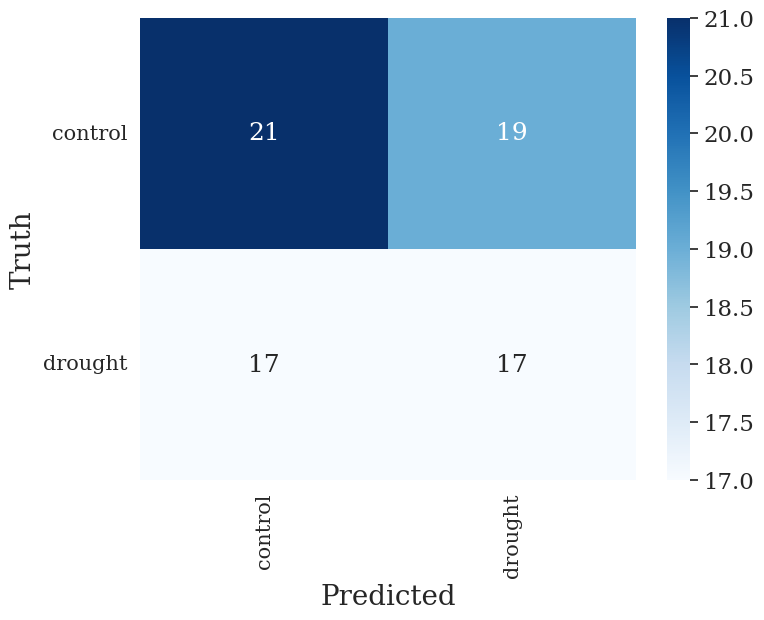

In [ ]:
y_test_pred = logreg.predict(X_test)

# print matrix
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred, pos_label='drought'))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred, pos_label='drought'))
print("Test: F1 Score:",metrics.f1_score(y_test, y_test_pred, pos_label='drought'))

###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 18},cmap="Blues")
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)

### SVM

In [ ]:
from scipy.stats import reciprocal, expon
param_distribs = {
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'shrinking': [False, True],
    'C': reciprocal(1, 1000),
    'coef0': expon(scale=1.0),
    'gamma': expon(scale=1.0),
    'degree': [1, 2, 3, 4, 5, 6, 7, 8],
    'tol': expon(scale=1e-4)
}

svm_clf = SVC()
rnd_search = RandomizedSearchCV(svm_clf, param_distributions=param_distribs,
                                n_iter=50, cv=3, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=False, tol=2.0799307999138624e-06; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=False, tol=2.0799307999138624e-06; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821

In [ ]:
# Create the SVC model with the best parameters from the randomized search
svc = SVC(**rnd_search.best_params_)

# Fit the model to the training data
svc.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(svc, X_train, y_train, cv=3)

# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')

print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Recall: 0.7471264367816092
Precision: 0.6565656565656566
F1 Score: 0.6989247311827956


Test: Accuracy: 0.6081081081081081
Test: Recall: 0.6470588235294118
Test: Precision: 0.5641025641025641
Test: F1 Score: 0.6027397260273972


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

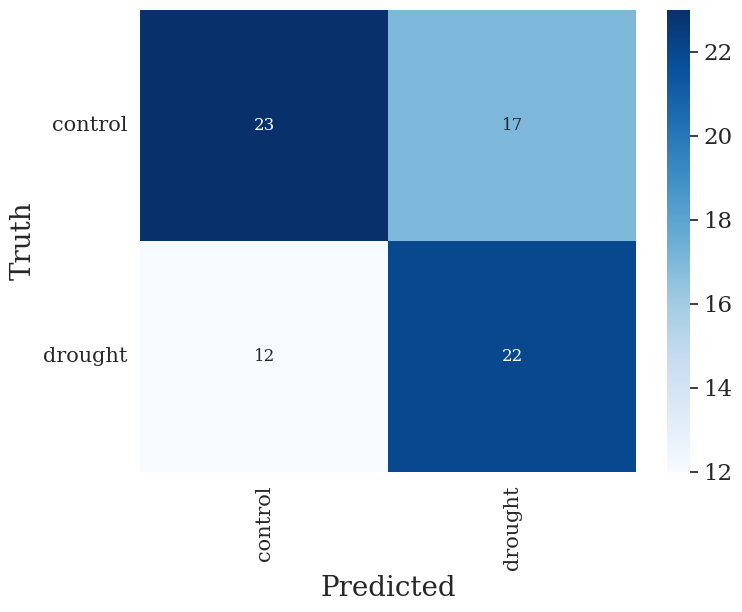

In [ ]:
y_test_pred = svc.predict(X_test)

# print matrix
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred, pos_label='drought'))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred, pos_label='drought'))
print("Test: F1 Score:",metrics.f1_score(y_test, y_test_pred, pos_label='drought'))

###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 20},cmap="Blues")
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)

## GA-PLS

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.cross_decomposition import PLSRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from genetic_selection import GeneticSelectionCV

# read clean date:
path = "/content/drive/MyDrive/LWP_Netanel/Sg_clean_data.csv"
df = pd.read_csv(path, usecols=lambda column: column not in ["Unnamed: 0","Unnamed: 223"])

# Convert date ro datetime:
df['spectral_date'] = pd.to_datetime(df['spectral_date'])

bands_df =df[df.columns[:-7]]
bands_df['treatment'] = df['treatment'].values

# Define X and y
X =  bands_df.drop(columns =['treatment'])
y = bands_df['treatment']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


<ipython-input-84-85d91348b0f3>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bands_df['treatment'] = df['treatment'].values


In [ ]:
!pip install sklearn-genetic

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.4/135.4 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 8.5 MB/s eta 0:00:00


In [ ]:
# best_params = {'C': 458.8156549160972, 'fit_intercept': False, 'intercept_scaling': 0.4827677446825112, 'max_iter': 500, 'penalty': 'l1', 'solver': 'liblinear', 'tol': 8.238874948858289e-05}
estimator = SVC()
model = GeneticSelectionCV(
    estimator, cv=3, verbose=0,
    scoring="accuracy", max_features=15,
    n_population=100, crossover_proba=0.5,
    mutation_proba=0.2, n_generations=50,
    crossover_independent_proba=0.5,
    mutation_independent_proba=0.04,
    tournament_size=3, n_gen_no_change=10,
    caching=True, n_jobs=-1)
model = model.fit(X_train, y_train)
print('Features:', X.columns[model.support_])

/usr/local/lib/python3.10/dist-packages/multiprocess/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Features: Index(['462', '477', '776', '838', '920'], dtype='object')


Recall: 0.3888888888888889
Precision: 0.5833333333333334
F1 Score: 0.4666666666666666
Accuracy: 0.5675675675675675


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

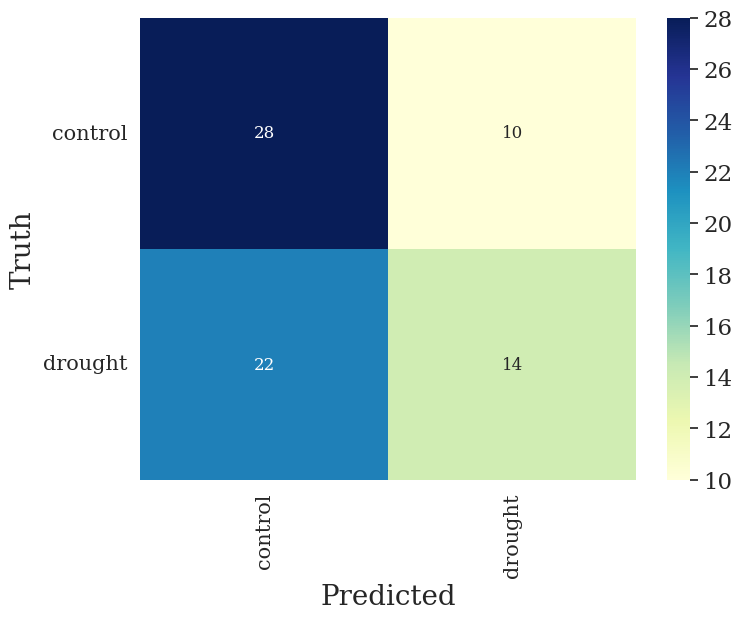

In [ ]:
X_selected = X[['398', '590', '603', '676', '709', '712', '462', '477', '776', '838', '920']]
# scaler = StandardScaler()
# X_selected = scaler.fit_transform(X_selected)
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.3, random_state=42)

# Create the LR
lr = SVC()
# lr = RandomForestClassifier()

# Fit the model to the training data
lr.fit(X_train, y_train)

# predict test set
y_pred = lr.predict(X_test)

# calc metrics
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, pos_label='drought')
precision = precision_score(y_test, y_pred, pos_label='drought')
f1 = f1_score(y_test, y_pred, pos_label='drought')

print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)
print("Accuracy:", accuracy)

# plot confusion matrix
unique_label = np.unique([y_test, y_pred])
cmtx = pd.DataFrame(
confusion_matrix(y_test, y_pred, labels=unique_label),
index=[x for x in unique_label],
columns=[x for x in unique_label])
plt.figure(figsize=(8, 6))
sns.heatmap(cmtx, annot=True, fmt='d', annot_kws={"size": 12}, cmap="YlGnBu")
plt.xlabel('Predicted', fontsize=20)
plt.ylabel('Truth', fontsize=20)
plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15, rotation=0)



In [ ]:
# Create a list of selected feature names based on the selected_features indices
selected_feature_names = X.columns[selected_features - 1]

# Create the new DataFrame with the selected features
df_selected = df[selected_feature_names]

# Append the 'treatment' column to the new DataFrame
df_selected['treatment'] = bands_df['treatment'].values

<ipython-input-92-e098cdd2e772>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected['treatment'] = bands_df['treatment'].values


In [ ]:
df_selected.to_csv("/content/drive/MyDrive/LWP_Netanel/GA-PLS_data.csv",index=False)

### ML

In [ ]:
df_selected = pd.read_csv("/content/drive/MyDrive/LWP_Netanel/GA-PLS_data.csv")

In [ ]:
# Define features and labels
X = df_selected.drop(columns =['treatment'])
X = (X- X.mean())/X.std()

# Encode "English_name"
# label_encoder = LabelEncoder()
# X["English_name_encoded"] = label_encoder.fit_transform(df["English_name"])

# Print the mapping of the encoded values
# english_name_mapping = dict(zip(label_encoder.transform(label_encoder.classes_),label_encoder.classes_))

y = df_selected['treatment']

# Split to train-test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

X_train.shape,X_test.shape

((172, 57), (74, 57))

### Logistic Regression

In [ ]:
param_distribs = {
    'penalty': ['l1', 'l2'],
    'C': reciprocal(1, 1000),
    'solver': ['liblinear', 'saga'],
    'tol': expon(scale=1e-4),
    'fit_intercept': [False, True],
    'intercept_scaling': expon(scale=1.0),
    'max_iter': [100, 200, 300, 400, 500]
}

logreg_clf = LogisticRegression()
rnd_search = RandomizedSearchCV(logreg_clf, param_distributions=param_distribs,
                                n_iter=100, cv=5, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   1.1s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   1.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.5s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.4s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.7s
[CV] END C=1.994916615063393, fi

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.994916615063393, fit_intercept=False, intercept_scaling=2.0112308644799395, max_iter=400, penalty=l2, solver=saga, tol=0.0001052363846077553; total time=   0.1s
[CV] END C=1.994916615063393, fit_intercept=False, intercept_scaling=2.0112308644799395, max_iter=400, penalty=l2, solver=saga, tol=0.0001052363846077553; total time=   0.1s
[CV] END C=1.994916615063393, fit_intercept=False, intercept_scaling=2.0112308644799395, max_iter=400, penalty=l2, solver=saga, tol=0.0001052363846077553; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.4765043713594344, fit_intercept=True, intercept_scaling=1.786429543354675, max_iter=200, penalty=l2, solver=saga, tol=2.0261142283225706e-05; total time=   0.0s
[CV] END C=1.4765043713594344, fit_intercept=True, intercept_scaling=1.786429543354675, max_iter=200, penalty=l2, solver=saga, tol=2.0261142283225706e-05; total time=   0.1s
[CV] END C=1.4765043713594344, fit_intercept=True, intercept_scaling=1.786429543354675, max_iter=200, penalty=l2, solver=saga, tol=2.0261142283225706e-05; total time=   0.1s
[CV] END C=1.4765043713594344, fit_intercept=True, intercept_scaling=1.786429543354675, max_iter=200, penalty=l2, solver=saga, tol=2.0261142283225706e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.4765043713594344, fit_intercept=True, intercept_scaling=1.786429543354675, max_iter=200, penalty=l2, solver=saga, tol=2.0261142283225706e-05; total time=   0.0s
[CV] END C=8.17949947521167, fit_intercept=True, intercept_scaling=0.00709138979446984, max_iter=100, penalty=l1, solver=liblinear, tol=9.463708738997988e-05; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=8.17949947521167, fit_intercept=True, intercept_scaling=0.00709138979446984, max_iter=100, penalty=l1, solver=liblinear, tol=9.463708738997988e-05; total time=   0.3s
[CV] END C=8.17949947521167, fit_intercept=True, intercept_scaling=0.00709138979446984, max_iter=100, penalty=l1, solver=liblinear, tol=9.463708738997988e-05; total time=   0.2s
[CV] END C=8.17949947521167, fit_intercept=True, intercept_scaling=0.00709138979446984, max_iter=100, penalty=l1, solver=liblinear, tol=9.463708738997988e-05; total time=   0.3s
[CV] END C=8.17949947521167, fit_intercept=True, intercept_scaling=0.00709138979446984, max_iter=100, penalty=l1, solver=liblinear, tol=9.463708738997988e-05; total time=   0.2s
[CV] END C=2.6210878782654397, fit_intercept=True, intercept_scaling=3.6402995536277603, max_iter=300, penalty=l2, solver=liblinear, tol=0.00040882165254596954; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=2.6210878782654397, fit_intercept=True, intercept_scaling=3.6402995536277603, max_iter=300, penalty=l2, solver=liblinear, tol=0.00040882165254596954; total time=   0.0s
[CV] END C=2.6210878782654397, fit_intercept=True, intercept_scaling=3.6402995536277603, max_iter=300, penalty=l2, solver=liblinear, tol=0.00040882165254596954; total time=   0.0s
[CV] END C=2.6210878782654397, fit_intercept=True, intercept_scaling=3.6402995536277603, max_iter=300, penalty=l2, solver=liblinear, tol=0.00040882165254596954; total time=   0.0s
[CV] END C=2.6210878782654397, fit_intercept=True, intercept_scaling=3.6402995536277603, max_iter=300, penalty=l2, solver=liblinear, tol=0.00040882165254596954; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=25.135566617708278, fit_intercept=False, intercept_scaling=0.9353330206496101, max_iter=500, penalty=l1, solver=liblinear, tol=1.3353726611249124e-06; total time=   5.0s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=25.135566617708278, fit_intercept=False, intercept_scaling=0.9353330206496101, max_iter=500, penalty=l1, solver=liblinear, tol=1.3353726611249124e-06; total time=   6.5s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=25.135566617708278, fit_intercept=False, intercept_scaling=0.9353330206496101, max_iter=500, penalty=l1, solver=liblinear, tol=1.3353726611249124e-06; total time=   3.9s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=25.135566617708278, fit_intercept=False, intercept_scaling=0.9353330206496101, max_iter=500, penalty=l1, solver=liblinear, tol=1.3353726611249124e-06; total time=   4.2s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=25.135566617708278, fit_intercept=False, intercept_scaling=0.9353330206496101, max_iter=500, penalty=l1, solver=liblinear, tol=1.3353726611249124e-06; total time=   9.3s
[CV] END C=670.8188643346283, fit_intercept=True, intercept_scaling=1.6523315728128767, max_iter=100, penalty=l2, solver=liblinear, tol=2.625262508953778e-05; total time=   0.0s
[CV] END C=670.8188643346283, fit_intercept=True, intercept_scaling=1.6523315728128767, max_iter=100, penalty=l2, solver=liblinear, tol=2.625262508953778e-05; total time=   0.1s
[CV] END C=670.8188643346283, fit_intercept=True, intercept_scaling=1.6523315728128767, max_iter=100, penalty=l2, solver=liblinear, tol=2.625262508953778e-05; total time=   0.0s
[CV] END C=670.8188643346283, fit_intercept=True, intercept_scaling=1.6523315728128767, max_iter=100, penalty=l2, solver=liblinear, tol=2.625262508953778e-05; total time=   0.0s
[CV] END C=670.8188643346283, fit_intercept=True, intercept_scaling=1.6523315728128767, max_iter=100, penal

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=14.89984747565824, fit_intercept=True, intercept_scaling=1.0862557985649803, max_iter=200, penalty=l2, solver=saga, tol=2.3312023188561704e-05; total time=   0.1s
[CV] END C=14.89984747565824, fit_intercept=True, intercept_scaling=1.0862557985649803, max_iter=200, penalty=l2, solver=saga, tol=2.3312023188561704e-05; total time=   0.1s
[CV] END C=50.47786565710602, fit_intercept=False, intercept_scaling=3.4928071327362264, max_iter=200, penalty=l2, solver=saga, tol=5.027751757587391e-05; total time=   0.0s
[CV] END C=50.47786565710602, fit_intercept=False, intercept_scaling=3.4928071327362264, max_iter=200, penalty=l2, solver=saga, tol=5.027751757587391e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=50.47786565710602, fit_intercept=False, intercept_scaling=3.4928071327362264, max_iter=200, penalty=l2, solver=saga, tol=5.027751757587391e-05; total time=   0.1s
[CV] END C=50.47786565710602, fit_intercept=False, intercept_scaling=3.4928071327362264, max_iter=200, penalty=l2, solver=saga, tol=5.027751757587391e-05; total time=   0.1s
[CV] END C=50.47786565710602, fit_intercept=False, intercept_scaling=3.4928071327362264, max_iter=200, penalty=l2, solver=saga, tol=5.027751757587391e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.1s
[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.2s
[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.1s
[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.1s
[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.1s
[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.1s
[CV] END C=6.729728537157744, fit_intercept=False, intercept_scaling=1.6204835957747312, max_iter=100, penalty=l1, solver=liblinear, tol=5.506090617769176e-05; total time=   0.3s
[CV] END C=6.729728537157744, fit_intercept=False, intercept_scaling=1.6204835957747312, max_iter=100, penalty=l1, solver=liblinear, tol=5.506090617769176e-05; total time=   0.2s
[CV] END C=6.729728537157744, fit_intercept=False, intercept_scaling=1.6204835957747312, max_iter=100, penalty=l1, solver=liblinear, tol=5.506090617769176e-05; total time=   0.2s
[CV] END C=6.729728537157744, fit_intercept=False, intercept_scaling=1.6204835957747312, max_iter=100, penalty=l1, 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=234.7073130303151, fit_intercept=False, intercept_scaling=0.07692926551379635, max_iter=200, penalty=l1, solver=saga, tol=0.00019885295716582228; total time=   0.1s
[CV] END C=234.7073130303151, fit_intercept=False, intercept_scaling=0.07692926551379635, max_iter=200, penalty=l1, solver=saga, tol=0.00019885295716582228; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=234.7073130303151, fit_intercept=False, intercept_scaling=0.07692926551379635, max_iter=200, penalty=l1, solver=saga, tol=0.00019885295716582228; total time=   0.1s
[CV] END C=234.7073130303151, fit_intercept=False, intercept_scaling=0.07692926551379635, max_iter=200, penalty=l1, solver=saga, tol=0.00019885295716582228; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=  10.0s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   9.5s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   5.8s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   4.5s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means 

[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   5.4s
[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.0s
[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.0s
[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.0s
[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.0s
[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.242474708366019, fit_intercept=False, intercept_scaling=0.6450624521653773, max_iter=500, penalty=l2, solver=saga, tol=0.00023812655298459756; total time=   0.1s
[CV] END C=1.242474708366019, fit_intercept=False, intercept_scaling=0.6450624521653773, max_iter=500, penalty=l2, solver=saga, tol=0.00023812655298459756; total time=   0.1s
[CV] END C=1.242474708366019, fit_intercept=False, intercept_scaling=0.6450624521653773, max_iter=500, penalty=l2, solver=saga, tol=0.00023812655298459756; total time=   0.1s
[CV] END C=1.242474708366019, fit_intercept=False, intercept_scaling=0.6450624521653773, max_iter=500, penalty=l2, solver=saga, tol=0.00023812655298459756; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.242474708366019, fit_intercept=False, intercept_scaling=0.6450624521653773, max_iter=500, penalty=l2, solver=saga, tol=0.00023812655298459756; total time=   0.1s
[CV] END C=5.59598687800608, fit_intercept=False, intercept_scaling=0.7761833954623697, max_iter=500, penalty=l2, solver=liblinear, tol=8.010427855017636e-06; total time=   0.0s
[CV] END C=5.59598687800608, fit_intercept=False, intercept_scaling=0.7761833954623697, max_iter=500, penalty=l2, solver=liblinear, tol=8.010427855017636e-06; total time=   0.0s
[CV] END C=5.59598687800608, fit_intercept=False, intercept_scaling=0.7761833954623697, max_iter=500, penalty=l2, solver=liblinear, tol=8.010427855017636e-06; total time=   0.0s
[CV] END C=5.59598687800608, fit_intercept=False, intercept_scaling=0.7761833954623697, max_iter=500, penalty=l2, solver=liblinear, tol=8.010427855017636e-06; total time=   0.0s
[CV] END C=5.59598687800608, fit_intercept=False, intercept_scaling=0.7761833954623697, max_iter=500, penalty=l2,

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=7.400385759087372, fit_intercept=True, intercept_scaling=2.124169814240007, max_iter=200, penalty=l1, solver=saga, tol=0.0001003494190520531; total time=   0.0s
[CV] END C=411.5113049561089, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.1s
[CV] END C=411.5113049561089, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.1s
[CV] END C=411.5113049561089, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=411.5113049561089, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=411.5113049561089, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   1.2s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   1.3s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   1.7s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.0s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.0s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.0s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.1s
[CV] END C=2.2887381144600965, fit_intercept=True, intercept_scaling=0.27987995130717197, max_iter=300, penalty=l2, solver=saga, tol=7.31452805760152e-05; total time=   0.0s
[CV] END C=2.2887381144600965, fit_intercept=True, intercept_scaling=0.27987995130717197, max_iter=300, penalty=l2, solver=saga, tol=7.31452805760152e-05; total time=   0.0s
[CV] END C=2.2887381144600965, fit_intercept=True, intercept_scaling=0.27987995130717197, max_iter=300, penalty=l2, solver=saga, tol=7.31452805760152e-05; total time=   0.0s
[CV] END C=2.2887381144600965, fit_intercept=True, intercept_scaling=0.27987995130717197, max_iter=300, penalty=l2, solver=saga, tol=7.31452805760152e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=2.2887381144600965, fit_intercept=True, intercept_scaling=0.27987995130717197, max_iter=300, penalty=l2, solver=saga, tol=7.31452805760152e-05; total time=   0.0s
[CV] END C=128.5454996487901, fit_intercept=False, intercept_scaling=0.06709351259978942, max_iter=200, penalty=l2, solver=saga, tol=2.900612949922053e-05; total time=   0.0s
[CV] END C=128.5454996487901, fit_intercept=False, intercept_scaling=0.06709351259978942, max_iter=200, penalty=l2, solver=saga, tol=2.900612949922053e-05; total time=   0.0s
[CV] END C=128.5454996487901, fit_intercept=False, intercept_scaling=0.06709351259978942, max_iter=200, penalty=l2, solver=saga, tol=2.900612949922053e-05; total time=   0.0s
[CV] END C=128.5454996487901, fit_intercept=False, intercept_scaling=0.06709351259978942, max_iter=200, penalty=l2, solver=saga, tol=2.900612949922053e-05; total time=   0.0s
[CV] END C=128.5454996487901, fit_intercept=False, intercept_scaling=0.06709351259978942, max_iter=200, penalty=l2, solver=sag

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=31.027409509128386, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   0.6s
[CV] END C=31.027409509128386, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   0.5s
[CV] END C=31.027409509128386, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   0.5s
[CV] END C=31.027409509128386, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   1.0s
[CV] END C=17.104525858990527, fit_intercept=False, intercept_scaling=0.32662592101036936, max_iter=100, penalty=l1, solver=liblinear, tol=0.0001141641252863987; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=17.104525858990527, fit_intercept=False, intercept_scaling=0.32662592101036936, max_iter=100, penalty=l1, solver=liblinear, tol=0.0001141641252863987; total time=   0.8s
[CV] END C=17.104525858990527, fit_intercept=False, intercept_scaling=0.32662592101036936, max_iter=100, penalty=l1, solver=liblinear, tol=0.0001141641252863987; total time=   0.5s
[CV] END C=17.104525858990527, fit_intercept=False, intercept_scaling=0.32662592101036936, max_iter=100, penalty=l1, solver=liblinear, tol=0.0001141641252863987; total time=   0.4s
[CV] END C=17.104525858990527, fit_intercept=False, intercept_scaling=0.32662592101036936, max_iter=100, penalty=l1, solver=liblinear, tol=0.0001141641252863987; total time=   0.6s
[CV] END C=39.15648958243001, fit_intercept=True, intercept_scaling=4.24403698261526, max_iter=400, penalty=l1, solver=liblinear, tol=4.614871275158603e-05; total time=   2.4s
[CV] END C=39.15648958243001, fit_intercept=True, intercept_scaling=4.24403698261526, max_iter=400, 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=5.3269646504596615, fit_intercept=True, intercept_scaling=0.458522799264304, max_iter=400, penalty=l2, solver=saga, tol=5.0886827802519674e-05; total time=   0.1s
[CV] END C=5.3269646504596615, fit_intercept=True, intercept_scaling=0.458522799264304, max_iter=400, penalty=l2, solver=saga, tol=5.0886827802519674e-05; total time=   0.1s
[CV] END C=5.3269646504596615, fit_intercept=True, intercept_scaling=0.458522799264304, max_iter=400, penalty=l2, solver=saga, tol=5.0886827802519674e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.1s
[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.1s
[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.1s
[CV] END C=375.90353898082674, fit_intercept=True, intercept_scaling=1.1318517342673489, max_iter=300, penalty=l2, solver=liblinear, tol=0.00016581085759775227; total time=   0.0s
[CV] END C=375.90353898082674, fit_intercept=True, intercept_scaling=1.1318517342673489, max_iter=300, penalty=l2, solver=liblinear, tol=0.00016581085759775227; total time=   0.0s
[CV] END C=375.90353898082674, fit_intercept=True, intercept_scaling=1.1318517342673489, max_iter=300, penalty=l2, solver=liblinear, tol=0.00016581085759775227; total time=   0.0s
[CV] END C=375.90353898082674, fit_intercept=True, intercept_scaling=1.1318517342673489, max_iter=300, penalty=l2, solver=liblinear, tol=0.00016581085759775227; total time=   0.0s
[CV] END C=375.90353898082674, fit_intercept=True, intercept_scaling=1.1318517342673489, max_iter=300, pena

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=11.117265099859653, fit_intercept=False, intercept_scaling=0.19160422253913376, max_iter=100, penalty=l2, solver=saga, tol=7.292954276719257e-05; total time=   0.0s
[CV] END C=325.93448872393685, fit_intercept=False, intercept_scaling=0.41713243399517175, max_iter=100, penalty=l2, solver=liblinear, tol=7.796815233359066e-05; total time=   0.0s
[CV] END C=325.93448872393685, fit_intercept=False, intercept_scaling=0.41713243399517175, max_iter=100, penalty=l2, solver=liblinear, tol=7.796815233359066e-05; total time=   0.0s
[CV] END C=325.93448872393685, fit_intercept=False, intercept_scaling=0.41713243399517175, max_iter=100, penalty=l2, solver=liblinear, tol=7.796815233359066e-05; total time=   0.0s
[CV] END C=325.93448872393685, fit_intercept=False, intercept_scaling=0.41713243399517175, max_iter=100, penalty=l2, solver=liblinear, tol=7.796815233359066e-05; total time=   0.0s
[CV] END C=325.93448872393685, fit_intercept=False, intercept_scaling=0.41713243399517175, max_iter=

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=3.6823182895763615, fit_intercept=False, intercept_scaling=0.42956761581164393, max_iter=300, penalty=l2, solver=saga, tol=5.1836753784026384e-05; total time=   0.1s
[CV] END C=3.6823182895763615, fit_intercept=False, intercept_scaling=0.42956761581164393, max_iter=300, penalty=l2, solver=saga, tol=5.1836753784026384e-05; total time=   0.1s
[CV] END C=3.6823182895763615, fit_intercept=False, intercept_scaling=0.42956761581164393, max_iter=300, penalty=l2, solver=saga, tol=5.1836753784026384e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=460.5855368582789, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.1s
[CV] END C=460.5855368582789, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.1s
[CV] END C=460.5855368582789, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=460.5855368582789, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.1s
[CV] END C=460.5855368582789, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.1s
[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol=1.7531581610419906e-05; total time=   0.0s
[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol=1.7531581610419906e-05; total time=   0.0s
[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol=1.7531581610419906e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol=1.7531581610419906e-05; total time=   0.0s
[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol=1.7531581610419906e-05; total time=   0.0s
[CV] END C=44.27936336500086, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=44.27936336500086, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.1s
[CV] END C=44.27936336500086, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.1s
[CV] END C=44.27936336500086, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=44.27936336500086, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.1s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.1s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.0s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.0s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.0s
[CV] END C=1.9099601385505387, fit_intercept=False, intercept_scaling=1.0115156153275293, max_iter=500, penalty=l1, solver=saga, tol=0.000236551198250572; total time=   0.1s
[CV] END C=1.9099601385505387, fit_intercept=False, intercept_scaling=1.0115156153275293, max_iter=500, penalty=l1, solver=saga, tol=0.000236551198250572; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.9099601385505387, fit_intercept=False, intercept_scaling=1.0115156153275293, max_iter=500, penalty=l1, solver=saga, tol=0.000236551198250572; total time=   0.1s
[CV] END C=1.9099601385505387, fit_intercept=False, intercept_scaling=1.0115156153275293, max_iter=500, penalty=l1, solver=saga, tol=0.000236551198250572; total time=   0.1s
[CV] END C=1.9099601385505387, fit_intercept=False, intercept_scaling=1.0115156153275293, max_iter=500, penalty=l1, solver=saga, tol=0.000236551198250572; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=20.099400153590373, fit_intercept=False, intercept_scaling=0.6984353243887704, max_iter=400, penalty=l1, solver=saga, tol=0.00019963332490174825; total time=   0.1s
[CV] END C=20.099400153590373, fit_intercept=False, intercept_scaling=0.6984353243887704, max_iter=400, penalty=l1, solver=saga, tol=0.00019963332490174825; total time=   0.1s
[CV] END C=20.099400153590373, fit_intercept=False, intercept_scaling=0.6984353243887704, max_iter=400, penalty=l1, solver=saga, tol=0.00019963332490174825; total time=   0.1s
[CV] END C=20.099400153590373, fit_intercept=False, intercept_scaling=0.6984353243887704, max_iter=400, penalty=l1, solver=saga, tol=0.00019963332490174825; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=20.099400153590373, fit_intercept=False, intercept_scaling=0.6984353243887704, max_iter=400, penalty=l1, solver=saga, tol=0.00019963332490174825; total time=   0.1s
[CV] END C=4.904060335291481, fit_intercept=True, intercept_scaling=0.32957736836626295, max_iter=300, penalty=l2, solver=liblinear, tol=4.4582987105486325e-06; total time=   0.0s
[CV] END C=4.904060335291481, fit_intercept=True, intercept_scaling=0.32957736836626295, max_iter=300, penalty=l2, solver=liblinear, tol=4.4582987105486325e-06; total time=   0.0s
[CV] END C=4.904060335291481, fit_intercept=True, intercept_scaling=0.32957736836626295, max_iter=300, penalty=l2, solver=liblinear, tol=4.4582987105486325e-06; total time=   0.0s
[CV] END C=4.904060335291481, fit_intercept=True, intercept_scaling=0.32957736836626295, max_iter=300, penalty=l2, solver=liblinear, tol=4.4582987105486325e-06; total time=   0.0s
[CV] END C=4.904060335291481, fit_intercept=True, intercept_scaling=0.32957736836626295, max_iter=300, p

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=723.1286044841387, fit_intercept=False, intercept_scaling=0.5589382770530613, max_iter=500, penalty=l1, solver=liblinear, tol=0.0003928741164110655; total time=   8.5s
[CV] END C=723.1286044841387, fit_intercept=False, intercept_scaling=0.5589382770530613, max_iter=500, penalty=l1, solver=liblinear, tol=0.0003928741164110655; total time=   3.6s
[CV] END C=723.1286044841387, fit_intercept=False, intercept_scaling=0.5589382770530613, max_iter=500, penalty=l1, solver=liblinear, tol=0.0003928741164110655; total time=   1.6s
[CV] END C=723.1286044841387, fit_intercept=False, intercept_scaling=0.5589382770530613, max_iter=500, penalty=l1, solver=liblinear, tol=0.0003928741164110655; total time=   3.6s
[CV] END C=1.6828242744702409, fit_intercept=False, intercept_scaling=0.4862919320986936, max_iter=100, penalty=l2, solver=liblinear, tol=1.857186162957548e-05; total time=   0.0s
[CV] END C=1.6828242744702409, fit_intercept=False, intercept_scaling=0.4862919320986936, max_iter=100, 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=46.817022250358995, fit_intercept=False, intercept_scaling=1.8592664926604465, max_iter=300, penalty=l2, solver=saga, tol=1.0222819734932289e-05; total time=   0.0s
[CV] END C=46.817022250358995, fit_intercept=False, intercept_scaling=1.8592664926604465, max_iter=300, penalty=l2, solver=saga, tol=1.0222819734932289e-05; total time=   0.0s
[CV] END C=69.98769331752378, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, tol=3.894206578010433e-05; total time=   0.0s
[CV] END C=69.98769331752378, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, tol=3.894206578010433e-05; total time=   0.0s
[CV] END C=69.98769331752378, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, tol=3.894206578010433e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=69.98769331752378, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, tol=3.894206578010433e-05; total time=   0.1s
[CV] END C=69.98769331752378, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, tol=3.894206578010433e-05; total time=   0.0s
[CV] END C=351.5680375645844, fit_intercept=False, intercept_scaling=1.21228755622449, max_iter=500, penalty=l2, solver=liblinear, tol=5.443494130895386e-05; total time=   0.0s
[CV] END C=351.5680375645844, fit_intercept=False, intercept_scaling=1.21228755622449, max_iter=500, penalty=l2, solver=liblinear, tol=5.443494130895386e-05; total time=   0.0s
[CV] END C=351.5680375645844, fit_intercept=False, intercept_scaling=1.21228755622449, max_iter=500, penalty=l2, solver=liblinear, tol=5.443494130895386e-05; total time=   0.0s
[CV] END C=351.5680375645844, fit_intercept=False, intercept_scaling=1.21228755622449, max_iter=500, penalty=l2, solver=l

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=54.524875992411665, fit_intercept=True, intercept_scaling=0.8634140266094347, max_iter=300, penalty=l1, solver=saga, tol=7.82294585687126e-05; total time=   0.1s
[CV] END C=54.524875992411665, fit_intercept=True, intercept_scaling=0.8634140266094347, max_iter=300, penalty=l1, solver=saga, tol=7.82294585687126e-05; total time=   0.1s
[CV] END C=54.524875992411665, fit_intercept=True, intercept_scaling=0.8634140266094347, max_iter=300, penalty=l1, solver=saga, tol=7.82294585687126e-05; total time=   0.1s
[CV] END C=7.238086291181392, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.00017293513695381362; total time=   0.0s
[CV] END C=7.238086291181392, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.00017293513695381362; total time=   0.0s
[CV] END C=7.238086291181392, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=7.238086291181392, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.00017293513695381362; total time=   0.0s
[CV] END C=12.038487446822948, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, tol=0.00033596283814742904; total time=   0.1s
[CV] END C=12.038487446822948, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, tol=0.00033596283814742904; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=12.038487446822948, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, tol=0.00033596283814742904; total time=   0.1s
[CV] END C=12.038487446822948, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, tol=0.00033596283814742904; total time=   0.1s
[CV] END C=12.038487446822948, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, tol=0.00033596283814742904; total time=   0.1s
[CV] END C=23.539405203496106, fit_intercept=True, intercept_scaling=0.053065095910309404, max_iter=400, penalty=l2, solver=liblinear, tol=0.00012023481606650837; total time=   0.0s
[CV] END C=23.539405203496106, fit_intercept=True, intercept_scaling=0.053065095910309404, max_iter=400, penalty=l2, solver=liblinear, tol=0.00012023481606650837; total time=   0.0s
[CV] END C=23.539405203496106, fit_intercept=True, intercept_scaling=0.053065095910309404, max_iter=400, pen

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=2.6005144855575946, fit_intercept=True, intercept_scaling=3.7235570086999927, max_iter=400, penalty=l2, solver=saga, tol=4.193460988043928e-06; total time=   0.1s
[CV] END C=2.6005144855575946, fit_intercept=True, intercept_scaling=3.7235570086999927, max_iter=400, penalty=l2, solver=saga, tol=4.193460988043928e-06; total time=   0.1s
[CV] END C=2.6005144855575946, fit_intercept=True, intercept_scaling=3.7235570086999927, max_iter=400, penalty=l2, solver=saga, tol=4.193460988043928e-06; total time=   0.1s
[CV] END C=2.6005144855575946, fit_intercept=True, intercept_scaling=3.7235570086999927, max_iter=400, penalty=l2, solver=saga, tol=4.193460988043928e-06; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=2.6005144855575946, fit_intercept=True, intercept_scaling=3.7235570086999927, max_iter=400, penalty=l2, solver=saga, tol=4.193460988043928e-06; total time=   0.1s
[CV] END C=15.720367857375772, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=15.720367857375772, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=15.720367857375772, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=15.720367857375772, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=15.720367857375772, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=322.0626495993123, fit_intercept=False, intercept_scaling=1.1663556221844276, max_iter=100, penalty=l2, solver=saga, tol=1.7012074157285414e-05; total time=   0.0s
[CV] END C=322.0626495993123, fit_intercept=False, intercept_scaling=1.1663556221844276, max_iter=100, penalty=l2, solver=saga, tol=1.7012074157285414e-05; total time=   0.0s
[CV] END C=322.0626495993123, fit_intercept=False, intercept_scaling=1.1663556221844276, max_iter=100, penalty=l2, solver=saga, tol=1.7012074157285414e-05; total time=   0.0s
[CV] END C=322.0626495993123, fit_intercept=False, intercept_scaling=1.1663556221844276, max_iter=100, penalty=l2, solver=saga, tol=1.7012074157285414e-05; total time=   0.0s
[CV] END C=322.0626495993123, fit_intercept=False, intercept_scaling=1.1663556221844276, max_iter=100, penalty=l2, solver=saga, tol=1.7012074157285414e-05; total time=   0.0s
[CV] END C=5.632856590781125, fit_intercept=True, intercept_scaling=0.09857612629574013, max_iter=100, penalty=l2, solver=lib

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=100, penalty=l1, solver=saga, tol=9.628963170556041e-06; total time=   0.0s
[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=100, penalty=l1, solver=saga, tol=9.628963170556041e-06; total time=   0.0s
[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=100, penalty=l1, solver=saga, tol=9.628963170556041e-06; total time=   0.0s
[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=100, penalty=l1, solver=saga, tol=9.628963170556041e-06; total time=   0.0s
[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, tol=1.731006019256496e-06; total time=   0.1s
[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, to

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, tol=1.731006019256496e-06; total time=   0.1s
[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, tol=1.731006019256496e-06; total time=   0.1s
[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, tol=1.731006019256496e-06; total time=   0.1s
[CV] END C=195.02633930329975, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga, tol=0.0001049175712447296; total time=   0.0s
[CV] END C=195.02633930329975, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga, tol=0.0001049175712447296; total time=   0.0s
[CV] END C=195.02633930329975, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga,

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=195.02633930329975, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga, tol=0.0001049175712447296; total time=   0.0s
[CV] END C=1.393723980460675, fit_intercept=True, intercept_scaling=1.008114536040912, max_iter=200, penalty=l2, solver=liblinear, tol=1.542286357518888e-06; total time=   0.0s
[CV] END C=1.393723980460675, fit_intercept=True, intercept_scaling=1.008114536040912, max_iter=200, penalty=l2, solver=liblinear, tol=1.542286357518888e-06; total time=   0.0s
[CV] END C=1.393723980460675, fit_intercept=True, intercept_scaling=1.008114536040912, max_iter=200, penalty=l2, solver=liblinear, tol=1.542286357518888e-06; total time=   0.0s
[CV] END C=1.393723980460675, fit_intercept=True, intercept_scaling=1.008114536040912, max_iter=200, penalty=l2, solver=liblinear, tol=1.542286357518888e-06; total time=   0.0s
[CV] END C=1.393723980460675, fit_intercept=True, intercept_scaling=1.008114536040912, max_iter=200, penalty=l2, solv

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=631.4063194652971, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.1s
[CV] END C=631.4063194652971, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=631.4063194652971, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.1s
[CV] END C=631.4063194652971, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.1s
[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.1s
[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.1s
[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.1s
[CV] END C=52.49296753461721, fit_intercept=False, intercept_scaling=0.6129559740510913, max_iter=300, penalty=l1, solver=liblinear, tol=9.833381846878036e-05; total time=   2.4s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=52.49296753461721, fit_intercept=False, intercept_scaling=0.6129559740510913, max_iter=300, penalty=l1, solver=liblinear, tol=9.833381846878036e-05; total time=   4.2s
[CV] END C=52.49296753461721, fit_intercept=False, intercept_scaling=0.6129559740510913, max_iter=300, penalty=l1, solver=liblinear, tol=9.833381846878036e-05; total time=   1.5s
[CV] END C=52.49296753461721, fit_intercept=False, intercept_scaling=0.6129559740510913, max_iter=300, penalty=l1, solver=liblinear, tol=9.833381846878036e-05; total time=   1.1s
[CV] END C=52.49296753461721, fit_intercept=False, intercept_scaling=0.6129559740510913, max_iter=300, penalty=l1, solver=liblinear, tol=9.833381846878036e-05; total time=   2.5s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=289.2547712197909, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalty=l1, solver=liblinear, tol=2.415482837490208e-05; total time=   5.8s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=289.2547712197909, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalty=l1, solver=liblinear, tol=2.415482837490208e-05; total time=   7.8s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=289.2547712197909, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalty=l1, solver=liblinear, tol=2.415482837490208e-05; total time=   6.3s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=289.2547712197909, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalty=l1, solver=liblinear, tol=2.415482837490208e-05; total time=   7.7s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=289.2547712197909, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalty=l1, solver=liblinear, tol=2.415482837490208e-05; total time=   6.1s
[CV] END C=13.544945118140927, fit_intercept=False, intercept_scaling=0.09920501165575414, max_iter=300, penalty=l1, solver=liblinear, tol=0.00010663076539900722; total time=   0.4s
[CV] END C=13.544945118140927, fit_intercept=False, intercept_scaling=0.09920501165575414, max_iter=300, penalty=l1, solver=liblinear, tol=0.00010663076539900722; total time=   0.4s
[CV] END C=13.544945118140927, fit_intercept=False, intercept_scaling=0.09920501165575414, max_iter=300, penalty=l1, solver=liblinear, tol=0.00010663076539900722; total time=   0.3s
[CV] END C=13.544945118140927, fit_intercept=False, intercept_scaling=0.09920501165575414, max_iter=300, penalty=l1, solver=liblinear, tol=0.00010663076539900722; total time=   0.2s
[CV] END C=13.544945118140927, fit_intercept=False, intercept_scaling=0.09920501165575414, max_

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=119.85911759153473, fit_intercept=True, intercept_scaling=0.9913991764332203, max_iter=500, penalty=l2, solver=saga, tol=5.411921065387352e-05; total time=   0.1s
[CV] END C=119.85911759153473, fit_intercept=True, intercept_scaling=0.9913991764332203, max_iter=500, penalty=l2, solver=saga, tol=5.411921065387352e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=119.85911759153473, fit_intercept=True, intercept_scaling=0.9913991764332203, max_iter=500, penalty=l2, solver=saga, tol=5.411921065387352e-05; total time=   0.1s
[CV] END C=119.85911759153473, fit_intercept=True, intercept_scaling=0.9913991764332203, max_iter=500, penalty=l2, solver=saga, tol=5.411921065387352e-05; total time=   0.1s
[CV] END C=799.3586052037715, fit_intercept=True, intercept_scaling=0.19533329604044697, max_iter=100, penalty=l2, solver=saga, tol=8.578439510282167e-05; total time=   0.0s
[CV] END C=799.3586052037715, fit_intercept=True, intercept_scaling=0.19533329604044697, max_iter=100, penalty=l2, solver=saga, tol=8.578439510282167e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=799.3586052037715, fit_intercept=True, intercept_scaling=0.19533329604044697, max_iter=100, penalty=l2, solver=saga, tol=8.578439510282167e-05; total time=   0.0s
[CV] END C=799.3586052037715, fit_intercept=True, intercept_scaling=0.19533329604044697, max_iter=100, penalty=l2, solver=saga, tol=8.578439510282167e-05; total time=   0.0s
[CV] END C=799.3586052037715, fit_intercept=True, intercept_scaling=0.19533329604044697, max_iter=100, penalty=l2, solver=saga, tol=8.578439510282167e-05; total time=   0.0s
[CV] END C=156.6546410800757, fit_intercept=True, intercept_scaling=0.4652439119617327, max_iter=500, penalty=l2, solver=liblinear, tol=0.000113894933798157; total time=   0.0s
[CV] END C=156.6546410800757, fit_intercept=True, intercept_scaling=0.4652439119617327, max_iter=500, penalty=l2, solver=liblinear, tol=0.000113894933798157; total time=   0.0s
[CV] END C=156.6546410800757, fit_intercept=True, intercept_scaling=0.4652439119617327, max_iter=500, penalty=l2, solver=lib

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=saga, tol=6.862931048605623e-05; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=saga, tol=6.862931048605623e-05; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=saga, tol=6.862931048605623e-05; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=saga, tol=6.862931048605623e-05; total time=   0.0s
[CV] END C=14.752113960427668, fit_intercept=False, intercept_scaling=2.258790514545926, max_iter=100, penalty=l2, solver=saga, tol=0.00031830622769002376; total time=   0.0s
[CV] END C=14.752113960427668, fit_intercept=False, intercept_scaling=2.258790514545926, max_iter=100, penalty=l2, solver

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=14.752113960427668, fit_intercept=False, intercept_scaling=2.258790514545926, max_iter=100, penalty=l2, solver=saga, tol=0.00031830622769002376; total time=   0.0s
[CV] END C=14.752113960427668, fit_intercept=False, intercept_scaling=2.258790514545926, max_iter=100, penalty=l2, solver=saga, tol=0.00031830622769002376; total time=   0.0s
[CV] END C=14.752113960427668, fit_intercept=False, intercept_scaling=2.258790514545926, max_iter=100, penalty=l2, solver=saga, tol=0.00031830622769002376; total time=   0.0s
[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.1s
[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.1s
[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=22.148104601284686, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, penalty=l1, solver=liblinear, tol=0.00013958378736630774; total time=   1.7s
[CV] END C=22.148104601284686, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, penalty=l1, solver=liblinear, tol=0.00013958378736630774; total time=   1.0s
[CV] END C=22.148104601284686, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, penalty=l1, solver=liblinear, tol=0.00013958378736630774; total time=   0.6s
[CV] END C=22.148104601284686, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, penalty=l1, solver=liblinear, tol=0.00013958378736630774; total time=   0.4s
[CV] END C=22.148104601284686, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, penalty=l1, solver=liblinear, tol=0.00013958378736630774; total time=   0.8s
[CV] END C=236.99388000283327, fit_intercept=False, intercept_scaling=0.12043422422269756, max_

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=236.99388000283327, fit_intercept=False, intercept_scaling=0.12043422422269756, max_iter=500, penalty=l2, solver=saga, tol=5.92817064487378e-06; total time=   0.1s
[CV] END C=236.99388000283327, fit_intercept=False, intercept_scaling=0.12043422422269756, max_iter=500, penalty=l2, solver=saga, tol=5.92817064487378e-06; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   3.3s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   4.5s
[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   4.3s
[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means 

[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   3.5s
[CV] END C=2.685190154647807, fit_intercept=True, intercept_scaling=1.8137834722862145, max_iter=100, penalty=l1, solver=saga, tol=8.785552166860508e-06; total time=   0.0s
[CV] END C=2.685190154647807, fit_intercept=True, intercept_scaling=1.8137834722862145, max_iter=100, penalty=l1, solver=saga, tol=8.785552166860508e-06; total time=   0.0s
[CV] END C=2.685190154647807, fit_intercept=True, intercept_scaling=1.8137834722862145, max_iter=100, penalty=l1, solver=saga, tol=8.785552166860508e-06; total time=   0.0s
[CV] END C=2.685190154647807, fit_intercept=True, intercept_scaling=1.8137834722862145, max_iter=100, penalty=l1, solver=saga, tol=8.785552166860508e-06; total time=   0.0s
[CV] END C=2.685190154647807, fit_intercept=True, intercept_scaling=1.8137834722862145, max_iter=100, penalty=l1, solver=saga, t

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=126.73815903184186, fit_intercept=True, intercept_scaling=0.5052604745654999, max_iter=300, penalty=l2, solver=saga, tol=8.484875058031207e-06; total time=   0.1s
[CV] END C=126.73815903184186, fit_intercept=True, intercept_scaling=0.5052604745654999, max_iter=300, penalty=l2, solver=saga, tol=8.484875058031207e-06; total time=   0.0s
[CV] END C=126.73815903184186, fit_intercept=True, intercept_scaling=0.5052604745654999, max_iter=300, penalty=l2, solver=saga, tol=8.484875058031207e-06; total time=   0.0s
[CV] END C=1.7968554542843702, fit_intercept=False, intercept_scaling=0.8706135442465718, max_iter=500, penalty=l1, solver=saga, tol=0.0001675575403282677; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.7968554542843702, fit_intercept=False, intercept_scaling=0.8706135442465718, max_iter=500, penalty=l1, solver=saga, tol=0.0001675575403282677; total time=   0.1s
[CV] END C=1.7968554542843702, fit_intercept=False, intercept_scaling=0.8706135442465718, max_iter=500, penalty=l1, solver=saga, tol=0.0001675575403282677; total time=   0.1s
[CV] END C=1.7968554542843702, fit_intercept=False, intercept_scaling=0.8706135442465718, max_iter=500, penalty=l1, solver=saga, tol=0.0001675575403282677; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.7968554542843702, fit_intercept=False, intercept_scaling=0.8706135442465718, max_iter=500, penalty=l1, solver=saga, tol=0.0001675575403282677; total time=   0.1s
[CV] END C=694.6175184647423, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=saga, tol=8.719399369795727e-06; total time=   0.1s
[CV] END C=694.6175184647423, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=saga, tol=8.719399369795727e-06; total time=   0.1s
[CV] END C=694.6175184647423, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=saga, tol=8.719399369795727e-06; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=694.6175184647423, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=saga, tol=8.719399369795727e-06; total time=   0.1s
[CV] END C=694.6175184647423, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=saga, tol=8.719399369795727e-06; total time=   0.1s
[CV] END C=214.5066437415383, fit_intercept=True, intercept_scaling=1.2210659442092298, max_iter=200, penalty=l2, solver=liblinear, tol=1.1788020797188026e-05; total time=   0.0s
[CV] END C=214.5066437415383, fit_intercept=True, intercept_scaling=1.2210659442092298, max_iter=200, penalty=l2, solver=liblinear, tol=1.1788020797188026e-05; total time=   0.0s
[CV] END C=214.5066437415383, fit_intercept=True, intercept_scaling=1.2210659442092298, max_iter=200, penalty=l2, solver=liblinear, tol=1.1788020797188026e-05; total time=   0.0s
[CV] END C=214.5066437415383, fit_intercept=True, intercept_scaling=1.2210659442092298, max_iter=200, penalty=l2, s

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=30.0521337382307, fit_intercept=False, intercept_scaling=0.5195335727772361, max_iter=200, penalty=l2, solver=saga, tol=0.0001457553454729091; total time=   0.0s
[CV] END C=30.0521337382307, fit_intercept=False, intercept_scaling=0.5195335727772361, max_iter=200, penalty=l2, solver=saga, tol=0.0001457553454729091; total time=   0.0s
[CV] END C=294.0160614626455, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.1s
[CV] END C=294.0160614626455, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=294.0160614626455, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.1s
[CV] END C=294.0160614626455, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.1s
[CV] END C=294.0160614626455, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.1s
[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.1s
[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.1s
[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.1s
[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.1s
[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.1s
[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.1s
[CV] END C=45.87360314978283, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, tol=3.488399277677909e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=45.87360314978283, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, tol=3.488399277677909e-05; total time=   0.0s
[CV] END C=45.87360314978283, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, tol=3.488399277677909e-05; total time=   0.0s
[CV] END C=45.87360314978283, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, tol=3.488399277677909e-05; total time=   0.0s
[CV] END C=45.87360314978283, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, tol=3.488399277677909e-05; total time=   0.0s
[CV] END C=971.6148079839163, fit_intercept=True, intercept_scaling=0.8778258618057556, max_iter=100, penalty=l1, solver=saga, tol=0.0003186951071461003; total time=   0.0s
[CV] END C=971.6148079839163, fit_intercept=True, intercept_scaling=0.8778258618057556, max_iter=100, penalty=l1, solver=saga, tol=

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=971.6148079839163, fit_intercept=True, intercept_scaling=0.8778258618057556, max_iter=100, penalty=l1, solver=saga, tol=0.0003186951071461003; total time=   0.0s
[CV] END C=971.6148079839163, fit_intercept=True, intercept_scaling=0.8778258618057556, max_iter=100, penalty=l1, solver=saga, tol=0.0003186951071461003; total time=   0.0s
[CV] END C=971.6148079839163, fit_intercept=True, intercept_scaling=0.8778258618057556, max_iter=100, penalty=l1, solver=saga, tol=0.0003186951071461003; total time=   0.0s
[CV] END C=1.4913916020557285, fit_intercept=True, intercept_scaling=0.60817526195962, max_iter=400, penalty=l1, solver=saga, tol=1.8594399458125908e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.4913916020557285, fit_intercept=True, intercept_scaling=0.60817526195962, max_iter=400, penalty=l1, solver=saga, tol=1.8594399458125908e-05; total time=   0.1s
[CV] END C=1.4913916020557285, fit_intercept=True, intercept_scaling=0.60817526195962, max_iter=400, penalty=l1, solver=saga, tol=1.8594399458125908e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.4913916020557285, fit_intercept=True, intercept_scaling=0.60817526195962, max_iter=400, penalty=l1, solver=saga, tol=1.8594399458125908e-05; total time=   0.1s
[CV] END C=1.4913916020557285, fit_intercept=True, intercept_scaling=0.60817526195962, max_iter=400, penalty=l1, solver=saga, tol=1.8594399458125908e-05; total time=   0.1s
[CV] END C=87.20574266688077, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=87.20574266688077, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.1s
[CV] END C=87.20574266688077, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.0s
[CV] END C=87.20574266688077, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.0s
[CV] END C=87.20574266688077, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.0s
[CV] END C=6.023509346536343, fit_intercept=False, intercept_scaling=1.1978638819127894, max_iter=100, penalty=l1, solver=liblinear, tol=5.296801261573896e-05; total time=   0.3s
[CV] END C=6.023509346536343, fit_intercept=False, intercept_scaling=1.1978638819127894, max_iter=100, penalty=l1, solver=lib

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=6.023509346536343, fit_intercept=False, intercept_scaling=1.1978638819127894, max_iter=100, penalty=l1, solver=liblinear, tol=5.296801261573896e-05; total time=   0.2s
[CV] END C=6.023509346536343, fit_intercept=False, intercept_scaling=1.1978638819127894, max_iter=100, penalty=l1, solver=liblinear, tol=5.296801261573896e-05; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.1s
[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.1s
[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.1s
[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.1s
[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.0s
[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.0s
[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.0s
[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.0s
[CV] END C=1.3666459236837378, fit_intercept=False, intercept_scaling=0.5297623242801334, max_iter=100, penalty=l2, solver=saga, tol=0.0004218959300831557; total time=   0.0s
[CV] END C=1.3666459236837378, fit_intercept=False, intercept_scaling=0.5297623242801334, max_iter=100, penalty=l2, solver=saga, tol=0.0004218959300831557; total time=   0.0s
[CV] END C=1.3666459236837378, fit_intercept=False, intercept_scaling=0.5297623242801334, max_iter=100, penalty=l2, solver=saga,

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.3666459236837378, fit_intercept=False, intercept_scaling=0.5297623242801334, max_iter=100, penalty=l2, solver=saga, tol=0.0004218959300831557; total time=   0.0s
[CV] END C=1.3666459236837378, fit_intercept=False, intercept_scaling=0.5297623242801334, max_iter=100, penalty=l2, solver=saga, tol=0.0004218959300831557; total time=   0.0s
[CV] END C=13.4963679483995, fit_intercept=True, intercept_scaling=0.4794736997580961, max_iter=300, penalty=l1, solver=liblinear, tol=0.00018221900464698574; total time=   0.5s
[CV] END C=13.4963679483995, fit_intercept=True, intercept_scaling=0.4794736997580961, max_iter=300, penalty=l1, solver=liblinear, tol=0.00018221900464698574; total time=   0.5s
[CV] END C=13.4963679483995, fit_intercept=True, intercept_scaling=0.4794736997580961, max_iter=300, penalty=l1, solver=liblinear, tol=0.00018221900464698574; total time=   0.3s
[CV] END C=13.4963679483995, fit_intercept=True, intercept_scaling=0.4794736997580961, max_iter=300, penalty=l1, sol

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=274.60157724496037, fit_intercept=False, intercept_scaling=1.3859374227098722, max_iter=300, penalty=l1, solver=liblinear, tol=0.00014652830902062608; total time=  14.2s
[CV] END C=274.60157724496037, fit_intercept=False, intercept_scaling=1.3859374227098722, max_iter=300, penalty=l1, solver=liblinear, tol=0.00014652830902062608; total time=   7.3s
[CV] END C=274.60157724496037, fit_intercept=False, intercept_scaling=1.3859374227098722, max_iter=300, penalty=l1, solver=liblinear, tol=0.00014652830902062608; total time=   6.4s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=274.60157724496037, fit_intercept=False, intercept_scaling=1.3859374227098722, max_iter=300, penalty=l1, solver=liblinear, tol=0.00014652830902062608; total time=   5.6s
Best parameters: {'C': 274.60157724496037, 'fit_intercept': False, 'intercept_scaling': 1.3859374227098722, 'max_iter': 300, 'penalty': 'l1', 'solver': 'liblinear', 'tol': 0.00014652830902062608}
Best cross-validation score: 0.88


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [ ]:
# Create the Logistic Regression model with the best parameters from the randomized search
logreg = LogisticRegression(**rnd_search.best_params_)

# Fit the model to the training data
logreg.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(logreg, X_train, y_train, cv=5)

# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')


print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Recall: 0.9176470588235294
Precision: 0.8478260869565217
F1 Score: 0.8813559322033897


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Test: Accuracy: 0.7837837837837838
Test: Precision: 0.7865186615186615
Test: Recall: 0.7837837837837838
Test: f1: 0.7828298887122417


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

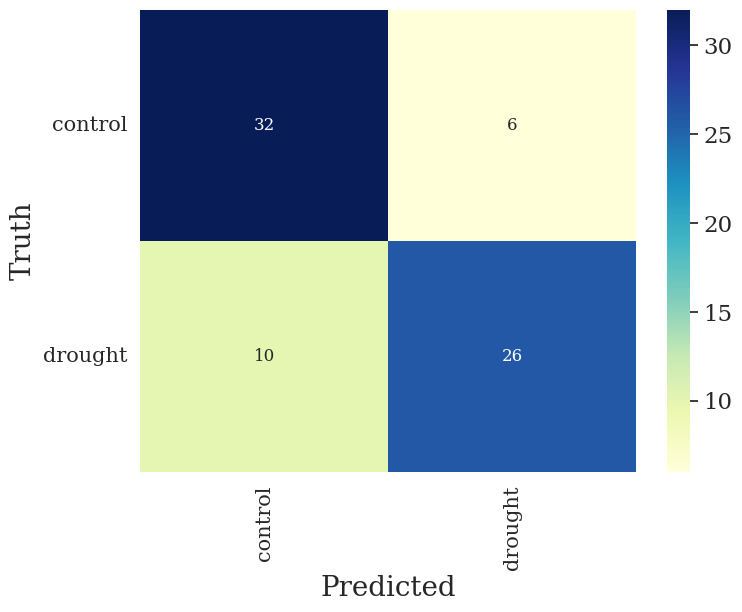

In [ ]:
y_test_pred = logreg.predict(X_test)

# print matrix
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred,average='weighted'))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred,average='weighted'))
print("Test: f1:",metrics.f1_score(y_test, y_test_pred,average='weighted'))

###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 12},cmap="YlGnBu")
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)

### SVM

In [ ]:
from scipy.stats import reciprocal, expon
param_distribs = {
    'kernel': ['rbf', 'linear','sigmoid'],
    'shrinking': [False, True],
    'C': reciprocal(1, 1000),
    'coef0': expon(scale=1.0),
    'gamma': expon(scale=1.0),
    'degree': [1, 2, 3, 4, 5, 6],
    'tol': expon(scale=1e-4)
}

svm_clf = SVC()
rnd_search = RandomizedSearchCV(svm_clf, param_distributions=param_distribs,
                                n_iter=50, cv=3, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=rbf, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=rbf, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=rbf, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=True, tol=5.806520264207262e-06; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=True, tol=5.806520264207262e-06; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, ke

In [ ]:
# Create the SVC model with the best parameters from the randomized search
svc = SVC(**rnd_search.best_params_)

# Fit the model to the training data
svc.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(svc, X_train, y_train, cv=3)

# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')

print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Recall: 0.8352941176470589
Precision: 0.8255813953488372
F1 Score: 0.8304093567251463


Test: Accuracy: 0.7702702702702703
Test: Precision: 0.7744774031345674
Test: Recall: 0.7702702702702703
Test: f1: 0.7687886891866992


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

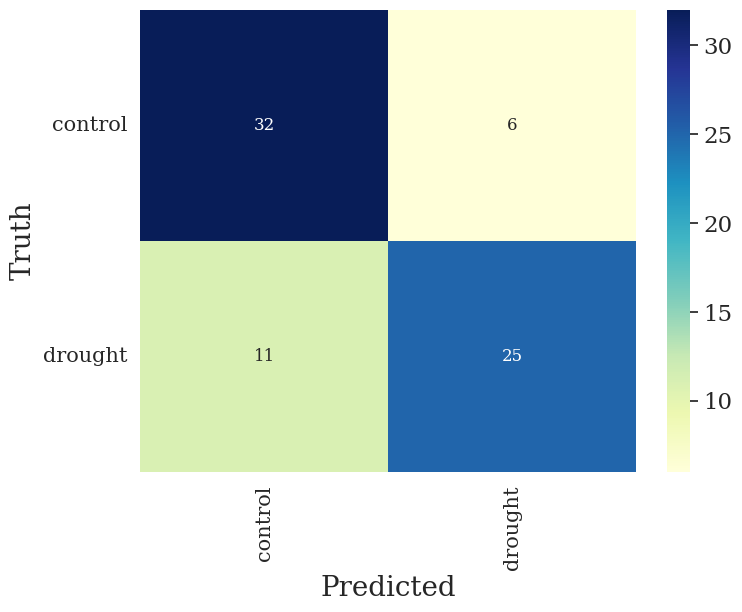

In [ ]:
y_test_pred = svc.predict(X_test)

# print matrix
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred,average='weighted'))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred,average='weighted'))
print("Test: f1:",metrics.f1_score(y_test, y_test_pred,average='weighted'))

###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 12},cmap="YlGnBu")
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)

## Chi Squered Feature Selection

In [ ]:
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.model_selection import train_test_split

# read clean date:
path = "/content/drive/MyDrive/LWP_Netanel/Sg_clean_data.csv"
df = pd.read_csv(path, usecols=lambda column: column not in ["Unnamed: 0","Unnamed: 223"])

# read ID table
df_ids = pd.read_csv('/content/drive/MyDrive/LWP_Netanel/central_data_table_2.csv', usecols=lambda column: column not in ["Unnamed: 0","Unnamed: 223"])

# Drop nan values based on ID column
df_ids = df_ids.dropna(subset=['ID'])

# Create a mapping from spectral_date to ID
date_to_id = df_ids.set_index('spectral_date')['ID'].to_dict()

# Add the ID column to df based on spectral_date
df['ID'] = df['spectral_date'].map(date_to_id)

# Convert date ro datetime:
df['spectral_date'] = pd.to_datetime(df['spectral_date'])
df = df.sort_values(by='spectral_date')

df_bands = df[df.columns[:-7]]
df_bands['treatment'] = df['treatment'].values

# Drop Na values
df_bands = df_bands.dropna()

# Extract the target column
target = df_bands['treatment']

# First, let's split the data into training and testing sets
# First, let's split the data into training and testing sets
X = df_bands.drop('treatment', axis=1)
y = target

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply Min-Max scaling to ensure all values are non-negative
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Now, let's perform chi-squared feature selection
# We'll select the top k features. You can adjust k as needed.
k = 20  # for example, select top 20 features

# Create the selector
selector = SelectKBest(chi2, k=k)

# Fit the selector to the scaled training data
X_train_selected = selector.fit_transform(X_train_scaled, y_train)

# Get the indices of the selected features
selected_feature_indices = selector.get_support(indices=True)

# Get the names of the selected features
selected_features = X.columns[selected_feature_indices]

# Print the selected features
print("Selected features:")
for feature in selected_features:
    print(feature)

# Transform the scaled test set
X_test_selected = selector.transform(X_test_scaled)

<ipython-input-127-566a2d7d9881>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bands['treatment'] = df['treatment'].values


Selected features:
915
922
924
928
931
933
935
937
966
968
970
973
975
977
979
982
984
986
988
990


In [ ]:
from scipy.stats import reciprocal, expon
param_distribs = {
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'shrinking': [False, True],
    'C': reciprocal(1, 1000),
    'coef0': expon(scale=1.0),
    'gamma': expon(scale=1.0),
    'degree': [1, 2, 3, 4, 5, 6, 7, 8],
    'tol': expon(scale=1e-4)
}

svm_clf = SVC()
rnd_search = RandomizedSearchCV(svm_clf, param_distributions=param_distribs,
                                n_iter=50, cv=3, scoring='accuracy',
                                verbose=2, random_state=42)
# fit the selected
rnd_search.fit(X_train_selected, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=False, tol=2.0799307999138624e-06; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=False, tol=2.0799307999138624e-06; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821

Recall: 0.83
Precision: 0.7545454545454545
F1 Score: 0.7904761904761904
Test: Accuracy: 0.8
Test: Recall: 0.6190476190476191
Test: Precision: 0.8666666666666667
Test: F1 Score: 0.7222222222222222


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

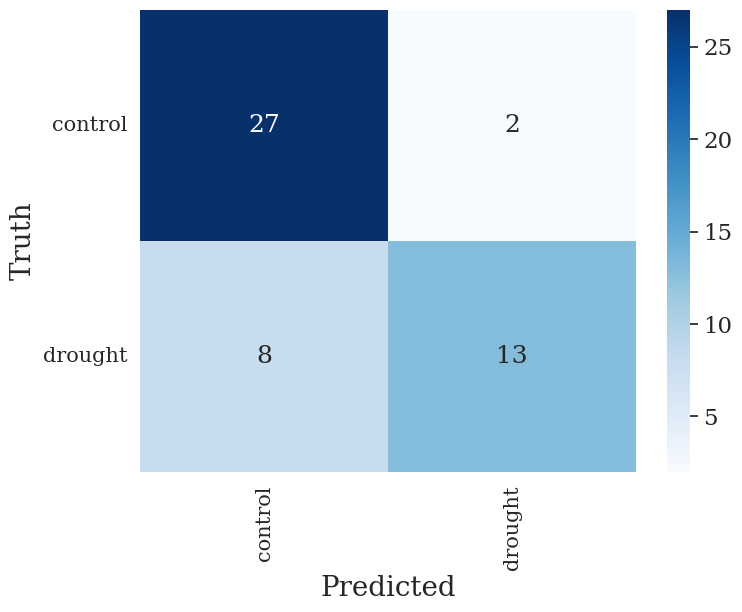

In [ ]:
# Create the SVC model with the best parameters from the randomized search
svc = SVC(**rnd_search.best_params_)

# Fit the model to the training data
svc.fit(X_train_selected, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(svc, X_train_selected, y_train, cv=3)

# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')

print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

y_test_pred = svc.predict(X_test_selected)

# print matrix
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred, pos_label='drought'))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred, pos_label='drought'))
print("Test: F1 Score:",metrics.f1_score(y_test, y_test_pred, pos_label='drought'))


###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 18},cmap="Blues")
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)

## PCA

In [ ]:
def pca_cumulative_var(df,target_col, standardize=True):
    """
    Perform PCA on the input DataFrame and plot the cumulative
    percentage of explained variance for each principal component.

    Args:
    df (pd.DataFrame): DataFrame containing the data to be used for PCA.
    standardize (bool): Whether or not to standardize the data. Default is True.
    target_col (str) = Name oftarget column (label)
    Returns:
    df_trans (pd.DataFrame): Data after perform PCA.
    """
    # Drop Na values
    df = df.dropna()

    # Extract the target column
    target = df[target_col]

    # Remove the target column and any non-numeric columns
    df = df.select_dtypes(include=[np.number])
    df = df.drop(columns=[target_col])

    # Standardize the data if specified
    if standardize:
        df_std = (df - df.mean()) / df.std()
    else:
        df_std = df

    # Fit the PCA model
    pca = PCA().fit(df_std)

    # Assume that pca.transform(df_std) returns a numpy array with shape (n_samples, n_components)
    n_components = pca.n_components_
    pc_col_names = [f"PC_{i+1}" for i in range(n_components)]
    df_pca = pd.DataFrame(data=pca.transform(df_std), columns=pc_col_names)

    # Add label column
    df_pca[target_col] = target

    # Calculate the cumulative percentage of explained variance for each component
    cum_var = np.cumsum(pca.explained_variance_ratio_)

    # Plot the cumulative percentage of explained variance for each component
    fig, ax = plt.subplots(1, figsize=(10,7))
    ax.plot(pca.explained_variance_ratio_*100, lw =2,color = "blue")
    ax.plot(pca.explained_variance_ratio_*100,'o',lw = 8,color = "black")
    ax.set_xlabel(" Components",fontsize=20)
    ax.set_ylabel("Explained Variance (%)",fontsize=20)
    ax.set_title("PCA",fontsize=25)

    # Compute cumulative explained variance ratio up to each component
    cumulative_var = np.cumsum(pca.explained_variance_ratio_)

    # Print cumulative explained variance up to first 10 components
    print(f'the cumulative variance explained by the first 10 principal components is {cumulative_var[:10]}')

    return df_pca

def pca_reduce_dim(df_pca, n_components,target_col):
    """
    Reduce the dimensions of the input DataFrame to n_components using PCA.

    Args:
    df_pca (pd.DataFrame): DataFrame containing the data after PCA.
    n_components (int): The number of principal components to retain.

    Returns:
    df_reduced (pd.DataFrame): DataFrame containing the data after dimensionality reduction.
    """

    # Extract the target column
    target = df_pca[target_col]

    df_pc = df_pca[df_pca.columns[:n_components]]

    # Combine the principal components and the target column
    df_reduced = pd.concat([df_pc, target], axis=1)

    return df_reduced

def plot_pca(df, target_col):
    """
    Plot a scatterplot of PC1 vs PC2 with color-coded points based on the target column.

    Args:
    - df (pandas DataFrame): DataFrame of PC components after PCA, including the target column
    - target_col (str): Name of the target column in df

    Returns:
    - None
    """
    colors = df[target_col] #colors by species

    fig, ax = plt.subplots(1, figsize=(8,6))
    ax = sns.scatterplot(x=df[df.columns[0]], y=df[df.columns[1]],s=30, hue=colors,palette = 'Reds')
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_title(f"PCA by {target_col}",fontsize=22)
    plt.legend(loc=6, bbox_to_anchor=(1.05, 0.5),fontsize=12)

<ipython-input-122-d91c712d8d68>:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bands['treatment'] = df['treatment'].values


the cumulative variance explained by the first 10 principal components is [0.83506095 0.97895814 0.98842981 0.99281364 0.99695652 0.99817285
 0.99887324 0.9992133  0.99939105 0.99950329]


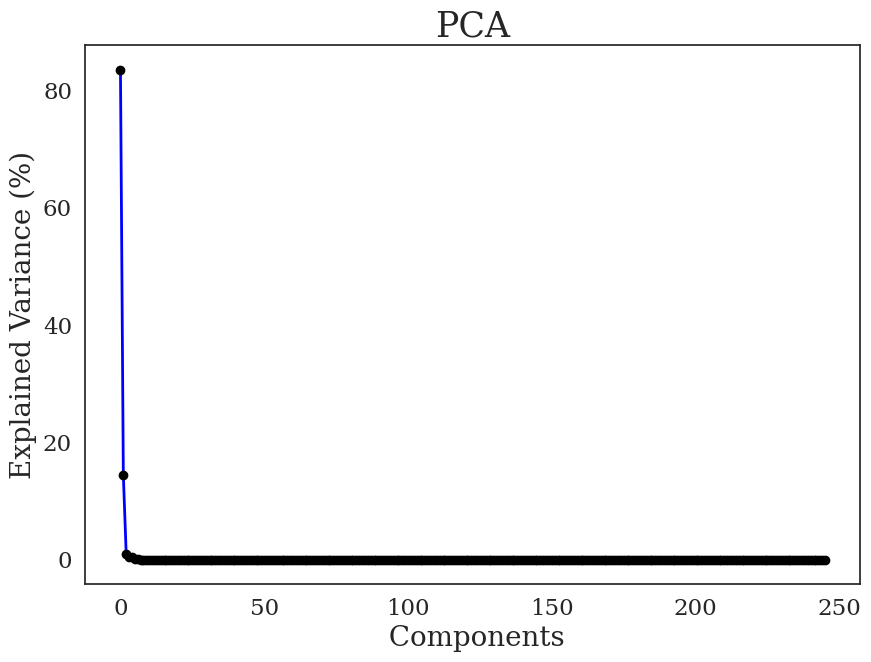

In [ ]:
# read clean date:
path = "/content/drive/MyDrive/LWP_Netanel/Sg_clean_data.csv"
df = pd.read_csv(path, usecols=lambda column: column not in ["Unnamed: 0","Unnamed: 223"])

# read ID table
df_ids = pd.read_csv('/content/drive/MyDrive/LWP_Netanel/central_data_table_2.csv', usecols=lambda column: column not in ["Unnamed: 0","Unnamed: 223"])

# Drop nan values based on ID column
df_ids = df_ids.dropna(subset=['ID'])

# Create a mapping from spectral_date to ID
date_to_id = df_ids.set_index('spectral_date')['ID'].to_dict()

# Add the ID column to df based on spectral_date
df['ID'] = df['spectral_date'].map(date_to_id)

# Convert date ro datetime:
df['spectral_date'] = pd.to_datetime(df['spectral_date'])
df = df.sort_values(by='spectral_date')

df_bands = df[df.columns[:-7]]
df_bands['treatment'] = df['treatment'].values

# Drop Na values
df_bands = df_bands.dropna()

# Extract the target column
target = df_bands['treatment']

# Remove the target column and any non-numeric columns
df_bands = df_bands.select_dtypes(include=[np.number])

# Standardize the data if specified
df_std = (df_bands - df_bands.mean()) / df_bands.std()


# Fit the PCA model
pca = PCA().fit(df_std)

# Assume that pca.transform(df_std) returns a numpy array with shape (n_samples, n_components)
n_components = pca.n_components_
pc_col_names = [f"PC_{i+1}" for i in range(n_components)]
df_pca = pd.DataFrame(data=pca.transform(df_std), columns=pc_col_names)

# Add label column
df_pca['treatment'] = df['treatment']

# Calculate the cumulative percentage of explained variance for each component
cum_var = np.cumsum(pca.explained_variance_ratio_)

# Plot the cumulative percentage of explained variance for each component
fig, ax = plt.subplots(1, figsize=(10,7))
ax.plot(pca.explained_variance_ratio_*100, lw =2,color = "blue")
ax.plot(pca.explained_variance_ratio_*100,'o',lw = 8,color = "black")
ax.set_xlabel(" Components",fontsize=20)
ax.set_ylabel("Explained Variance (%)",fontsize=20)
ax.set_title("PCA",fontsize=25)

# Compute cumulative explained variance ratio up to each component
cumulative_var = np.cumsum(pca.explained_variance_ratio_)

# Print cumulative explained variance up to first 10 components
print(f'the cumulative variance explained by the first 10 principal components is {cumulative_var[:10]}')

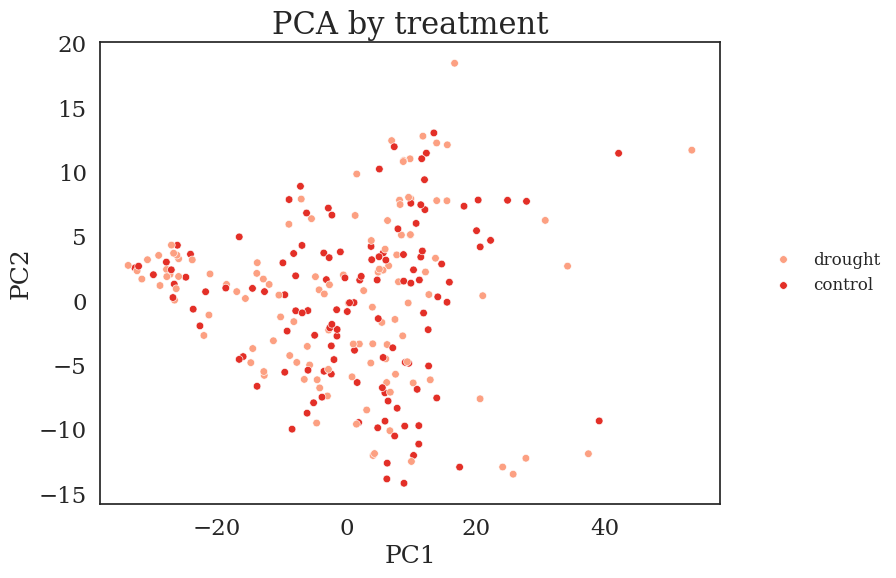

In [ ]:
df_reduced = pca_reduce_dim(df_pca, 3,'treatment')
plot_pca(df_reduced,'treatment')

## Time Series

In [ ]:
def time_serise_feature_extraction(df, target_col):
    """
    Extract time series features from a DataFrame with hyperspectral data.

    Parameters
    ----------
    df : pandas DataFrame
        The input DataFrame with hyperspectral data.
    target_col : str
        The name of the target column in the DataFrame.

    Returns
    -------
    pandas DataFrame
        The output DataFrame with computed features and the target column.
    """
    # Save the target data
    target_col_data = df[target_col].values

    # Get the hyperspectral data columns
    data_cols = [col for col in df.columns if col != target_col]

    df = df[data_cols]

    # calculate means
    means = df.mean(axis=1).values

    # calculate medians
    medians = df.median(axis=1).values

    # calculate standard deviations
    stds = df.std(axis=1).values

    # calculate percent of data beyond 1 std
    percent_beyond_1_std = df.apply(lambda x: np.sum(np.abs(x - x.mean()) > x.std()) / len(x), axis=1)
    percent_beyond_1_std = percent_beyond_1_std.values

    # calculate amplitudes
    amplitudes = df.apply(lambda row: np.ptp(row), axis=1)
    amplitudes = amplitudes.values

    # calculate max values
    maxs = df.max(axis=1).values

    # calculate min values
    mins = df.max(axis=1).values

    # calculate max slopes
    max_slopes = df.apply(lambda row: np.max(np.abs(np.diff(row))), axis=1)
    max_slopes = max_slopes.values

    # calculate median absolute deviations (MAD)
    mads = df.apply(lambda row: np.median(np.abs(row - np.median(row))), axis=1)
    mads = mads.values

    # calculate percent close to median
    percent_close_to_median = df.apply(lambda x: np.sum(np.abs(x - np.median(x)) < 0.5 * np.median(x)) / len(x) * 100, axis=1)
    percent_close_to_median = percent_close_to_median.values

    # calculate skewness
    skewness = df.apply(lambda x: x.skew(), axis=1)
    skewness = skewness.values

    # calculate flux percentile
    flux_percentile = df.quantile(q=0.9, axis=1)

    # calculate percent difference in flux percentile
    percent_difference = flux_percentile.pct_change().fillna(0)
    percent_difference = percent_difference.values

    # define the weights as a numpy array of the column names
    wavelengths = np.array(df.columns)

    # convert the column names to floats if necessary
    if wavelengths.dtype == 'object':
        wavelengths = wavelengths.astype(float)

    # calculate the weighted average for each row in the DataFrame
    weighted_average = df.apply(lambda row: np.average(row, weights=wavelengths), axis=1)
    weighted_average = weighted_average.values

    # create a new DataFrame to store the parameter values for each row
    parameters_df = pd.DataFrame({
        'Mean': means,
        'Median': medians,
        'Std': stds,
        'Percent_Beyond_Std': percent_beyond_1_std,
        'Amplitude': amplitudes,
        'Max': maxs,
        'Min': mins,
        'Max_Slope': max_slopes,
        'MAD': mads,
        'Percent_Close_to_Median': percent_close_to_median,
        'Skew': skewness,
        'Flux_Percentile': flux_percentile.values,
        'Percent_Difference_Flux_Percentile': percent_difference,
        'Weighted_Average': weighted_average
    })
    # Add the target column
    parameters_df[target_col] = target_col_data

    return parameters_df


In [ ]:
# read clean date:
path = "/content/drive/MyDrive/LWP_Netanel/Sg_clean_data.csv"
df = pd.read_csv(path, usecols=lambda column: column not in ["Unnamed: 0","Unnamed: 223"])

# Convert date ro datetime:
df['spectral_date'] = pd.to_datetime(df['spectral_date'])
df

,398,400,402,404,406,409,411,413,415,417,...,993,995,997,999,1001,LWP,spectral_date,treatment,plot,English_name
0,0.056127,0.050410,0.045164,0.040390,0.036088,0.032257,0.028898,0.026011,0.023595,0.021651,...,0.222754,0.225129,0.227839,0.230886,0.234268,-1.150,2022-03-14,drought,5,cypress
1,0.056986,0.051272,0.046001,0.041172,0.036785,0.032840,0.029338,0.026278,0.023660,0.021485,...,0.327153,0.330478,0.334300,0.338619,0.343433,-2.750,2022-03-14,drought,5,carob
2,0.058759,0.053196,0.048060,0.043349,0.039063,0.035203,0.031768,0.028759,0.026176,0.024018,...,0.271355,0.273903,0.276832,0.280141,0.283831,-2.350,2022-03-14,drought,6,carob
3,0.022455,0.019661,0.017084,0.014725,0.012584,0.010661,0.008955,0.007468,0.006198,0.005145,...,0.026978,0.027121,0.027282,0.027462,0.027660,-2.300,2022-03-14,control,1,pine
4,0.056687,0.051226,0.046198,0.041603,0.037441,0.033712,0.030417,0.027554,0.025125,0.023129,...,0.257415,0.260070,0.263109,0.266533,0.270341,-1.620,2022-03-14,drought,6,cypress
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
241,0.037854,0.033429,0.029375,0.025693,0.022381,0.019441,0.016872,0.014674,0.012847,0.011391,...,0.254123,0.253133,0.252045,0.250859,0.249576,-0.875,2023-02-13,control,1,oak
242,0.042819,0.038807,0.035169,0.031907,0.029020,0.026507,0.024369,0.022606,0.021218,0.020205,...,0.281425,0.280196,0.278753,0.277096,0.275225,-1.261,2023-02-13,control,1,cypress
243,0.013891,0.012588,0.011396,0.010316,0.009346,0.008488,0.007741,0.007105,0.006580,0.006166,...,0.110415,0.109811,0.109198,0.108575,0.107943,-0.906,2023-02-13,drought,6,oak
244,0.049915,0.044643,0.039817,0.035437,0.031504,0.028017,0.024976,0.022381,0.020232,0.018530,...,0.240941,0.241184,0.241376,0.241517,0.241606,-1.960,2023-02-13,control,3,carob


In [ ]:
bands_df =df[df.columns[:-7]]
bands_df['treatment'] = df['treatment'].values

<ipython-input-11-267acc9c3e02>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bands_df['treatment'] = df['treatment'].values


In [ ]:
ts_df = time_serise_feature_extraction(bands_df, 'treatment')
ts_df

,Mean,Median,Std,Percent_Beyond_Std,Amplitude,Max,Min,Max_Slope,MAD,Percent_Close_to_Median,Skew,Flux_Percentile,Percent_Difference_Flux_Percentile,Weighted_Average,treatment
0,0.127981,0.062215,0.089126,0.576642,0.217541,0.237336,0.237336,0.008241,0.040818,44.890511,0.132035,0.231466,0.000000,0.148022,drought
1,0.166018,0.055886,0.140922,0.518248,0.324694,0.343433,0.343433,0.013037,0.036591,31.751825,0.181986,0.335547,0.449658,0.197755,drought
2,0.141928,0.059739,0.111029,0.532847,0.263007,0.283831,0.283831,0.010042,0.038304,35.036496,0.156435,0.274573,-0.181716,0.167117,drought
3,0.015898,0.012173,0.009980,0.616788,0.023534,0.027788,0.027788,0.002794,0.007695,30.291971,0.078333,0.027186,-0.900988,0.018063,control
4,0.140391,0.060285,0.104568,0.558394,0.249580,0.270341,0.270341,0.009558,0.038497,44.890511,0.156343,0.263529,8.693514,0.164022,drought
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
241,0.131218,0.047582,0.111720,0.602190,0.262008,0.272108,0.272108,0.010886,0.035721,26.277372,0.156321,0.260421,-0.209955,0.156289,control
242,0.149726,0.062062,0.114578,0.521898,0.272846,0.292160,0.292160,0.010830,0.039816,44.525547,0.166798,0.284104,0.090943,0.175669,control
243,0.057990,0.018284,0.050551,0.456204,0.121346,0.127086,0.127086,0.005133,0.012047,28.102190,0.186573,0.116442,-0.590145,0.069298,drought
244,0.128450,0.049808,0.101811,0.529197,0.234488,0.252668,0.252668,0.009531,0.030902,44.890511,0.173285,0.249973,1.146766,0.151321,control


In [ ]:
# Define features and labels
X = ts_df[ts_df.columns[:-1]]

# Encode "English_name"
# label_encoder = LabelEncoder()
# X["English_name_encoded"] = label_encoder.fit_transform(df["English_name"])

# Print the mapping of the encoded values
# english_name_mapping = dict(zip(label_encoder.transform(label_encoder.classes_),label_encoder.classes_))

y = ts_df['treatment']

# Split to train-test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

X_train.shape,X_test.shape

((172, 14), (74, 14))

### Logistic Regression

In [ ]:
param_distribs = {
    'penalty': ['l1', 'l2'],
    'C': reciprocal(1, 1000),
    'solver': ['liblinear', 'saga'],
    'tol': expon(scale=1e-4),
    'fit_intercept': [False, True],
    'intercept_scaling': expon(scale=1.0),
    'max_iter': [100, 200, 300, 400, 500]
}

logreg_clf = LogisticRegression()
rnd_search = RandomizedSearchCV(logreg_clf, param_distributions=param_distribs,
                                n_iter=100, cv=5, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=1.994916615063393, fi

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=1.4765043713594344, fit_intercept=True, intercept_scaling=1.786429543354675, max_iter=200, penalty=l2, solver=saga, tol=2.0261142283225706e-05; total time=   0.0s
[CV] END C=1.4765043713594344, fit_intercept=True, intercept_scaling=1.786429543354675, max_iter=200, penalty=l2, solver=saga, tol=2.0261142283225706e-05; total time=   0.0s
[CV] END C=1.4765043713594344, fit_intercept=True, intercept_scaling=1.786429543354675, max_iter=200, penalty=l2, solver=saga, tol=2.0261142283225706e-05; total time=   0.0s
[CV] END C=8.17949947521167, fit_intercept=True, intercept_scaling=0.00709138979446984, max_iter=100, penalty=l1, solver=liblinear, tol=9.463708738997988e-05; total time=   0.0s
[CV] END C=8.17949947521167, fit_intercept=True, intercept_scaling=0.00709138979446984, max_iter=100, penalty=l1, solver=liblinear, tol=9.463708738997988e-05; total time=   0.0s
[CV] END C=8.17949947521167, fit_intercept=True, intercept_scaling=0.00709138979446984, max_iter=100, penalty=l1, solver=l

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.0s
[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.0s
[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.0s
[CV] END C=14.656553886225332, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.0s
[CV] END C=14.656553886225332, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.0s
[CV] END C=14.656553886225332, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, to

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=15.298348658397897, fit_intercept=True, intercept_scaling=0.005537420375935475, max_iter=300, penalty=l1, solver=liblinear, tol=0.00012425125189400213; total time=   0.0s
[CV] END C=15.298348658397897, fit_intercept=True, intercept_scaling=0.005537420375935475, max_iter=300, penalty=l1, solver=liblinear, tol=0.00012425125189400213; total time=   0.0s
[CV] END C=234.70731303031525, fit_intercept=False, intercept_scaling=0.07692926551379635, max_iter=200, penalty=l1, solver=saga, tol=0.00019885295716582228; total time=   0.0s
[CV] END C=234.70731303031525, fit_intercept=False, intercept_scaling=0.07692926551379635, max_iter=200, penalty=l1, solver=saga, tol=0.00019885295716582228; total time=   0.0s
[CV] END C=234.70731303031525, fit_intercept=False, intercept_scaling=0.07692926551379635, max_iter=200, penalty=l1, solver=saga, tol=0.00019885295716582228; total time=   0.0s
[CV] END C=234.70731303031525, fit_intercept=False, intercept_scaling=0.07692926551379635, max_iter=200, 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.0s
[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.0s
[CV] END C=458.81565491609706, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=458.81565491609706, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   0.6s
[CV] END C=458.81565491609706, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   0.7s
[CV] END C=458.81565491609706, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   0.8s
[CV] END C=458.81565491609706, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   1.0s
[CV] END C=205.54245520150744, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.0s
[CV] END C=205.54245520150744, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=205.54245520150744, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.1s
[CV] END C=1.2424747083660193, fit_intercept=False, intercept_scaling=0.6450624521653773, max_iter=500, penalty=l2, solver=saga, tol=0.00023812655298459756; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.2424747083660193, fit_intercept=False, intercept_scaling=0.6450624521653773, max_iter=500, penalty=l2, solver=saga, tol=0.00023812655298459756; total time=   0.1s
[CV] END C=1.2424747083660193, fit_intercept=False, intercept_scaling=0.6450624521653773, max_iter=500, penalty=l2, solver=saga, tol=0.00023812655298459756; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.2424747083660193, fit_intercept=False, intercept_scaling=0.6450624521653773, max_iter=500, penalty=l2, solver=saga, tol=0.00023812655298459756; total time=   0.1s
[CV] END C=1.2424747083660193, fit_intercept=False, intercept_scaling=0.6450624521653773, max_iter=500, penalty=l2, solver=saga, tol=0.00023812655298459756; total time=   0.1s
[CV] END C=5.59598687800608, fit_intercept=False, intercept_scaling=0.7761833954623697, max_iter=500, penalty=l2, solver=liblinear, tol=8.010427855017636e-06; total time=   0.0s
[CV] END C=5.59598687800608, fit_intercept=False, intercept_scaling=0.7761833954623697, max_iter=500, penalty=l2, solver=liblinear, tol=8.010427855017636e-06; total time=   0.0s
[CV] END C=5.59598687800608, fit_intercept=False, intercept_scaling=0.7761833954623697, max_iter=500, penalty=l2, solver=liblinear, tol=8.010427855017636e-06; total time=   0.0s
[CV] END C=5.59598687800608, fit_intercept=False, intercept_scaling=0.7761833954623697, max_iter=500, penalty=l2, 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=7.400385759087373, fit_intercept=True, intercept_scaling=2.124169814240007, max_iter=200, penalty=l1, solver=saga, tol=0.0001003494190520531; total time=   0.1s
[CV] END C=7.400385759087373, fit_intercept=True, intercept_scaling=2.124169814240007, max_iter=200, penalty=l1, solver=saga, tol=0.0001003494190520531; total time=   0.1s
[CV] END C=7.400385759087373, fit_intercept=True, intercept_scaling=2.124169814240007, max_iter=200, penalty=l1, solver=saga, tol=0.0001003494190520531; total time=   0.1s
[CV] END C=7.400385759087373, fit_intercept=True, intercept_scaling=2.124169814240007, max_iter=200, penalty=l1, solver=saga, tol=0.0001003494190520531; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=7.400385759087373, fit_intercept=True, intercept_scaling=2.124169814240007, max_iter=200, penalty=l1, solver=saga, tol=0.0001003494190520531; total time=   0.1s
[CV] END C=411.51130495610886, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.1s
[CV] END C=411.51130495610886, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=411.51130495610886, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.1s
[CV] END C=411.51130495610886, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.1s
[CV] END C=411.51130495610886, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=264.43593078398624, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   0.3s
[CV] END C=264.43593078398624, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=264.43593078398624, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   0.5s
[CV] END C=264.43593078398624, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=264.43593078398624, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   0.8s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.1s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.1s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.1s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.1s
[CV] END C=2.2887381144600965, fit_intercept=True, intercept_scaling=0.27987995130717197, max_iter=300, penalty=l2, solver=saga, tol=7.31452805760152e-05; total time=   0.0s
[CV] END C=2.2887381144600965, fit_intercept=True, intercept_scaling=0.27987995130717197, max_iter=300, penalty=l2, solver=saga, tol=7.31452805760152e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=2.2887381144600965, fit_intercept=True, intercept_scaling=0.27987995130717197, max_iter=300, penalty=l2, solver=saga, tol=7.31452805760152e-05; total time=   0.1s
[CV] END C=2.2887381144600965, fit_intercept=True, intercept_scaling=0.27987995130717197, max_iter=300, penalty=l2, solver=saga, tol=7.31452805760152e-05; total time=   0.0s
[CV] END C=2.2887381144600965, fit_intercept=True, intercept_scaling=0.27987995130717197, max_iter=300, penalty=l2, solver=saga, tol=7.31452805760152e-05; total time=   0.0s
[CV] END C=128.5454996487901, fit_intercept=False, intercept_scaling=0.06709351259978942, max_iter=200, penalty=l2, solver=saga, tol=2.900612949922053e-05; total time=   0.0s
[CV] END C=128.5454996487901, fit_intercept=False, intercept_scaling=0.06709351259978942, max_iter=200, penalty=l2, solver=saga, tol=2.900612949922053e-05; total time=   0.0s
[CV] END C=128.5454996487901, fit_intercept=False, intercept_scaling=0.06709351259978942, max_iter=200, penalty=l2, solver=saga,

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=128.5454996487901, fit_intercept=False, intercept_scaling=0.06709351259978942, max_iter=200, penalty=l2, solver=saga, tol=2.900612949922053e-05; total time=   0.0s
[CV] END C=128.5454996487901, fit_intercept=False, intercept_scaling=0.06709351259978942, max_iter=200, penalty=l2, solver=saga, tol=2.900612949922053e-05; total time=   0.1s
[CV] END C=31.027409509128393, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   0.0s
[CV] END C=31.027409509128393, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   0.0s
[CV] END C=31.027409509128393, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   0.0s
[CV] END C=31.027409509128393, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, pe

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=5.3269646504596615, fit_intercept=True, intercept_scaling=0.458522799264304, max_iter=400, penalty=l2, solver=saga, tol=5.0886827802519674e-05; total time=   0.0s
[CV] END C=5.3269646504596615, fit_intercept=True, intercept_scaling=0.458522799264304, max_iter=400, penalty=l2, solver=saga, tol=5.0886827802519674e-05; total time=   0.0s
[CV] END C=5.3269646504596615, fit_intercept=True, intercept_scaling=0.458522799264304, max_iter=400, penalty=l2, solver=saga, tol=5.0886827802519674e-05; total time=   0.0s
[CV] END C=281.3815513117021, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.1s
[CV] END C=281.3815513117021, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=281.3815513117021, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.1s
[CV] END C=281.3815513117021, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.1s
[CV] END C=281.3815513117021, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.0s
[CV] END C=375.903538980827, fit_intercept=True, intercept_scaling=1.1318517342673489, max_iter=300, penalty=l2, solver=liblinear, tol=0.00016581085759775227; total time=   0.0s
[CV] END C=375.903538980827, fit_intercept=True, intercept_scaling=1.1318517342673489, max_iter=300, penalty=l2, solver=liblinear, tol=0.00016581085759775227; total time=   0.0s
[CV] END C=375.903538980827, fit_intercept=True, intercept_scaling=1.1318517342673489, max_iter=300, penalty=l2, solver=libli

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=11.117265099859654, fit_intercept=False, intercept_scaling=0.19160422253913376, max_iter=100, penalty=l2, solver=saga, tol=7.292954276719257e-05; total time=   0.0s
[CV] END C=11.117265099859654, fit_intercept=False, intercept_scaling=0.19160422253913376, max_iter=100, penalty=l2, solver=saga, tol=7.292954276719257e-05; total time=   0.0s
[CV] END C=11.117265099859654, fit_intercept=False, intercept_scaling=0.19160422253913376, max_iter=100, penalty=l2, solver=saga, tol=7.292954276719257e-05; total time=   0.0s
[CV] END C=11.117265099859654, fit_intercept=False, intercept_scaling=0.19160422253913376, max_iter=100, penalty=l2, solver=saga, tol=7.292954276719257e-05; total time=   0.0s
[CV] END C=11.117265099859654, fit_intercept=False, intercept_scaling=0.19160422253913376, max_iter=100, penalty=l2, solver=saga, tol=7.292954276719257e-05; total time=   0.0s
[CV] END C=325.93448872393685, fit_intercept=False, intercept_scaling=0.41713243399517175, max_iter=100, penalty=l2, sol

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=325.93448872393685, fit_intercept=False, intercept_scaling=0.41713243399517175, max_iter=100, penalty=l2, solver=liblinear, tol=7.796815233359066e-05; total time=   0.0s
[CV] END C=325.93448872393685, fit_intercept=False, intercept_scaling=0.41713243399517175, max_iter=100, penalty=l2, solver=liblinear, tol=7.796815233359066e-05; total time=   0.0s
[CV] END C=325.93448872393685, fit_intercept=False, intercept_scaling=0.41713243399517175, max_iter=100, penalty=l2, solver=liblinear, tol=7.796815233359066e-05; total time=   0.0s
[CV] END C=325.93448872393685, fit_intercept=False, intercept_scaling=0.41713243399517175, max_iter=100, penalty=l2, solver=liblinear, tol=7.796815233359066e-05; total time=   0.0s
[CV] END C=122.27937155416554, fit_intercept=False, intercept_scaling=1.0787627390439145, max_iter=200, penalty=l2, solver=liblinear, tol=7.269850610302966e-05; total time=   0.0s
[CV] END C=122.27937155416554, fit_intercept=False, intercept_scaling=1.0787627390439145, max_it

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=460.58553685827906, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.1s
[CV] END C=460.58553685827906, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.0s
[CV] END C=460.58553685827906, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.0s
[CV] END C=460.58553685827906, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.1s
[CV] END C=460.58553685827906, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.0s
[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol=1.7531581610419906e-05; total time=   0.0s
[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol=1.7531581610419906e-05; total time=   0.0s
[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol=1.7531581610419906e-05; total time=   0.0s
[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol=1.7531581610419906e-05; total time=   0.0s
[CV] END C=44.279363365000876, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.1s
[CV] END C=44.279363365000876, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, to

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=44.279363365000876, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.0s
[CV] END C=44.279363365000876, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.0s
[CV] END C=44.279363365000876, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.0s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.0s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.0s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.0s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.0s
[CV] END C=1.9099601385505387, fit_intercept=False, intercept_scaling=1.0115156153275293, max_iter=500, penalty=l1, solver=saga, tol=0.000236551198250572; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.9099601385505387, fit_intercept=False, intercept_scaling=1.0115156153275293, max_iter=500, penalty=l1, solver=saga, tol=0.000236551198250572; total time=   0.1s
[CV] END C=1.9099601385505387, fit_intercept=False, intercept_scaling=1.0115156153275293, max_iter=500, penalty=l1, solver=saga, tol=0.000236551198250572; total time=   0.1s
[CV] END C=1.9099601385505387, fit_intercept=False, intercept_scaling=1.0115156153275293, max_iter=500, penalty=l1, solver=saga, tol=0.000236551198250572; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.9099601385505387, fit_intercept=False, intercept_scaling=1.0115156153275293, max_iter=500, penalty=l1, solver=saga, tol=0.000236551198250572; total time=   0.1s
[CV] END C=20.099400153590377, fit_intercept=False, intercept_scaling=0.6984353243887704, max_iter=400, penalty=l1, solver=saga, tol=0.00019963332490174825; total time=   0.1s
[CV] END C=20.099400153590377, fit_intercept=False, intercept_scaling=0.6984353243887704, max_iter=400, penalty=l1, solver=saga, tol=0.00019963332490174825; total time=   0.1s
[CV] END C=20.099400153590377, fit_intercept=False, intercept_scaling=0.6984353243887704, max_iter=400, penalty=l1, solver=saga, tol=0.00019963332490174825; total time=   0.0s
[CV] END C=20.099400153590377, fit_intercept=False, intercept_scaling=0.6984353243887704, max_iter=400, penalty=l1, solver=saga, tol=0.00019963332490174825; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=20.099400153590377, fit_intercept=False, intercept_scaling=0.6984353243887704, max_iter=400, penalty=l1, solver=saga, tol=0.00019963332490174825; total time=   0.1s
[CV] END C=4.904060335291481, fit_intercept=True, intercept_scaling=0.32957736836626295, max_iter=300, penalty=l2, solver=liblinear, tol=4.4582987105486325e-06; total time=   0.0s
[CV] END C=4.904060335291481, fit_intercept=True, intercept_scaling=0.32957736836626295, max_iter=300, penalty=l2, solver=liblinear, tol=4.4582987105486325e-06; total time=   0.0s
[CV] END C=4.904060335291481, fit_intercept=True, intercept_scaling=0.32957736836626295, max_iter=300, penalty=l2, solver=liblinear, tol=4.4582987105486325e-06; total time=   0.0s
[CV] END C=4.904060335291481, fit_intercept=True, intercept_scaling=0.32957736836626295, max_iter=300, penalty=l2, solver=liblinear, tol=4.4582987105486325e-06; total time=   0.0s
[CV] END C=4.904060335291481, fit_intercept=True, intercept_scaling=0.32957736836626295, max_iter=300, p

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=46.817022250359, fit_intercept=False, intercept_scaling=1.8592664926604465, max_iter=300, penalty=l2, solver=saga, tol=1.0222819734932289e-05; total time=   0.1s
[CV] END C=69.98769331752382, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, tol=3.894206578010433e-05; total time=   0.0s
[CV] END C=69.98769331752382, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, tol=3.894206578010433e-05; total time=   0.0s
[CV] END C=69.98769331752382, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, tol=3.894206578010433e-05; total time=   0.0s
[CV] END C=69.98769331752382, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, tol=3.894206578010433e-05; total time=   0.0s
[CV] END C=69.98769331752382, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, tol

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=5.869766574033026, fit_intercept=True, intercept_scaling=2.4446159618366363, max_iter=200, penalty=l1, solver=liblinear, tol=9.885776341980908e-05; total time=   0.0s
[CV] END C=5.869766574033026, fit_intercept=True, intercept_scaling=2.4446159618366363, max_iter=200, penalty=l1, solver=liblinear, tol=9.885776341980908e-05; total time=   0.0s
[CV] END C=5.869766574033026, fit_intercept=True, intercept_scaling=2.4446159618366363, max_iter=200, penalty=l1, solver=liblinear, tol=9.885776341980908e-05; total time=   0.0s
[CV] END C=5.869766574033026, fit_intercept=True, intercept_scaling=2.4446159618366363, max_iter=200, penalty=l1, solver=liblinear, tol=9.885776341980908e-05; total time=   0.0s
[CV] END C=5.869766574033026, fit_intercept=True, intercept_scaling=2.4446159618366363, max_iter=200, penalty=l1, solver=liblinear, tol=9.885776341980908e-05; total time=   0.0s
[CV] END C=3.8266774797637018, fit_intercept=True, intercept_scaling=1.210550648511517, max_iter=400, penalty=

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=54.52487599241167, fit_intercept=True, intercept_scaling=0.8634140266094347, max_iter=300, penalty=l1, solver=saga, tol=7.82294585687126e-05; total time=   0.0s
[CV] END C=54.52487599241167, fit_intercept=True, intercept_scaling=0.8634140266094347, max_iter=300, penalty=l1, solver=saga, tol=7.82294585687126e-05; total time=   0.1s
[CV] END C=54.52487599241167, fit_intercept=True, intercept_scaling=0.8634140266094347, max_iter=300, penalty=l1, solver=saga, tol=7.82294585687126e-05; total time=   0.0s
[CV] END C=54.52487599241167, fit_intercept=True, intercept_scaling=0.8634140266094347, max_iter=300, penalty=l1, solver=saga, tol=7.82294585687126e-05; total time=   0.0s
[CV] END C=54.52487599241167, fit_intercept=True, intercept_scaling=0.8634140266094347, max_iter=300, penalty=l1, solver=saga, tol=7.82294585687126e-05; total time=   0.0s
[CV] END C=7.238086291181393, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.0001729

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=7.238086291181393, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.00017293513695381362; total time=   0.0s
[CV] END C=7.238086291181393, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.00017293513695381362; total time=   0.0s
[CV] END C=7.238086291181393, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.00017293513695381362; total time=   0.0s
[CV] END C=7.238086291181393, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.00017293513695381362; total time=   0.0s
[CV] END C=12.03848744682295, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, tol=0.00033596283814742904; total time=   0.1s
[CV] END C=12.03848744682295, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, t

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=12.03848744682295, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, tol=0.00033596283814742904; total time=   0.0s
[CV] END C=12.03848744682295, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, tol=0.00033596283814742904; total time=   0.1s
[CV] END C=12.03848744682295, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, tol=0.00033596283814742904; total time=   0.1s
[CV] END C=23.539405203496106, fit_intercept=True, intercept_scaling=0.053065095910309404, max_iter=400, penalty=l2, solver=liblinear, tol=0.00012023481606650837; total time=   0.0s
[CV] END C=23.539405203496106, fit_intercept=True, intercept_scaling=0.053065095910309404, max_iter=400, penalty=l2, solver=liblinear, tol=0.00012023481606650837; total time=   0.0s
[CV] END C=23.539405203496106, fit_intercept=True, intercept_scaling=0.053065095910309404, max_iter=400, penalt

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=2.600514485557595, fit_intercept=True, intercept_scaling=3.7235570086999927, max_iter=400, penalty=l2, solver=saga, tol=4.193460988043928e-06; total time=   0.0s
[CV] END C=15.720367857375773, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=15.720367857375773, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=15.720367857375773, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=15.720367857375773, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=15.720367857375773, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=5.632856590781124, fit_intercept=True, intercept_scaling=0.09857612629574013, max_iter=100, penalty=l2, solver=liblinear, tol=3.28412261388996e-05; total time=   0.0s
[CV] END C=5.632856590781124, fit_intercept=True, intercept_scaling=0.09857612629574013, max_iter=100, penalty=l2, solver=liblinear, tol=3.28412261388996e-05; total time=   0.0s
[CV] END C=5.632856590781124, fit_intercept=True, intercept_scaling=0.09857612629574013, max_iter=100, penalty=l2, solver=liblinear, tol=3.28412261388996e-05; total time=   0.0s
[CV] END C=5.632856590781124, fit_intercept=True, intercept_scaling=0.09857612629574013, max_iter=100, penalty=l2, solver=liblinear, tol=3.28412261388996e-05; total time=   0.0s
[CV] END C=5.632856590781124, fit_intercept=True, intercept_scaling=0.09857612629574013, max_iter=100, penalty=l2, solver=liblinear, tol=3.28412261388996e-05; total time=   0.0s
[CV] END C=732.1428778380784, fit_intercept=False, intercept_scaling=1.070349457388161, max_iter=500, penalty=

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, tol=1.731006019256496e-06; total time=   0.1s
[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, tol=1.731006019256496e-06; total time=   0.0s
[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, tol=1.731006019256496e-06; total time=   0.0s
[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, tol=1.731006019256496e-06; total time=   0.0s
[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, tol=1.731006019256496e-06; total time=   0.0s
[CV] END C=195.02633930329986, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga, t

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=195.02633930329986, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga, tol=0.0001049175712447296; total time=   0.0s
[CV] END C=195.02633930329986, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga, tol=0.0001049175712447296; total time=   0.0s
[CV] END C=195.02633930329986, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga, tol=0.0001049175712447296; total time=   0.0s
[CV] END C=1.393723980460675, fit_intercept=True, intercept_scaling=1.008114536040912, max_iter=200, penalty=l2, solver=liblinear, tol=1.542286357518888e-06; total time=   0.0s
[CV] END C=1.393723980460675, fit_intercept=True, intercept_scaling=1.008114536040912, max_iter=200, penalty=l2, solver=liblinear, tol=1.542286357518888e-06; total time=   0.0s
[CV] END C=1.393723980460675, fit_intercept=True, intercept_scaling=1.008114536040912, max_iter=200, penalty=l2, solver=l

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=631.4063194652973, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.1s
[CV] END C=631.4063194652973, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.1s
[CV] END C=631.4063194652973, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.0s
[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.0s
[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.0s
[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.0s
[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.0s
[CV] END C=52.49296753461722, fit_intercept=False, intercept_scaling=0.6129559740510913, max_iter=300, penalty=l1, solver=liblinear, tol=9.833381846878036e-05; total time=   0.0s
[CV] END C=52.49296753461722, fit_intercept=False, intercept_scaling=0.6129559740510913, max_iter=300, penalty=l1, solver=liblinear, tol=9.833381846878036e-05; total time=   0.0s
[CV] END C=52.49296753461722, fit_intercept=False, intercept_scaling=0.6129559740510913, max_iter=300, penalty=l1, solver=liblinear, tol=9.833381846878036e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=52.49296753461722, fit_intercept=False, intercept_scaling=0.6129559740510913, max_iter=300, penalty=l1, solver=liblinear, tol=9.833381846878036e-05; total time=   0.0s
[CV] END C=52.49296753461722, fit_intercept=False, intercept_scaling=0.6129559740510913, max_iter=300, penalty=l1, solver=liblinear, tol=9.833381846878036e-05; total time=   0.0s
[CV] END C=289.25477121979094, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalty=l1, solver=liblinear, tol=2.415482837490208e-05; total time=   0.2s
[CV] END C=289.25477121979094, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalty=l1, solver=liblinear, tol=2.415482837490208e-05; total time=   0.8s
[CV] END C=289.25477121979094, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalty=l1, solver=liblinear, tol=2.415482837490208e-05; total time=   0.3s
[CV] END C=289.25477121979094, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalt

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=119.85911759153474, fit_intercept=True, intercept_scaling=0.9913991764332203, max_iter=500, penalty=l2, solver=saga, tol=5.411921065387352e-05; total time=   0.1s
[CV] END C=119.85911759153474, fit_intercept=True, intercept_scaling=0.9913991764332203, max_iter=500, penalty=l2, solver=saga, tol=5.411921065387352e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=119.85911759153474, fit_intercept=True, intercept_scaling=0.9913991764332203, max_iter=500, penalty=l2, solver=saga, tol=5.411921065387352e-05; total time=   0.1s
[CV] END C=119.85911759153474, fit_intercept=True, intercept_scaling=0.9913991764332203, max_iter=500, penalty=l2, solver=saga, tol=5.411921065387352e-05; total time=   0.1s
[CV] END C=799.3586052037714, fit_intercept=True, intercept_scaling=0.19533329604044697, max_iter=100, penalty=l2, solver=saga, tol=8.578439510282167e-05; total time=   0.0s
[CV] END C=799.3586052037714, fit_intercept=True, intercept_scaling=0.19533329604044697, max_iter=100, penalty=l2, solver=saga, tol=8.578439510282167e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=799.3586052037714, fit_intercept=True, intercept_scaling=0.19533329604044697, max_iter=100, penalty=l2, solver=saga, tol=8.578439510282167e-05; total time=   0.0s
[CV] END C=799.3586052037714, fit_intercept=True, intercept_scaling=0.19533329604044697, max_iter=100, penalty=l2, solver=saga, tol=8.578439510282167e-05; total time=   0.0s
[CV] END C=799.3586052037714, fit_intercept=True, intercept_scaling=0.19533329604044697, max_iter=100, penalty=l2, solver=saga, tol=8.578439510282167e-05; total time=   0.0s
[CV] END C=156.65464108007572, fit_intercept=True, intercept_scaling=0.4652439119617327, max_iter=500, penalty=l2, solver=liblinear, tol=0.000113894933798157; total time=   0.0s
[CV] END C=156.65464108007572, fit_intercept=True, intercept_scaling=0.4652439119617327, max_iter=500, penalty=l2, solver=liblinear, tol=0.000113894933798157; total time=   0.0s
[CV] END C=156.65464108007572, fit_intercept=True, intercept_scaling=0.4652439119617327, max_iter=500, penalty=l2, solver=

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=saga, tol=6.862931048605623e-05; total time=   0.0s
[CV] END C=14.752113960427668, fit_intercept=False, intercept_scaling=2.258790514545926, max_iter=100, penalty=l2, solver=saga, tol=0.00031830622769002376; total time=   0.0s
[CV] END C=14.752113960427668, fit_intercept=False, intercept_scaling=2.258790514545926, max_iter=100, penalty=l2, solver=saga, tol=0.00031830622769002376; total time=   0.0s
[CV] END C=14.752113960427668, fit_intercept=False, intercept_scaling=2.258790514545926, max_iter=100, penalty=l2, solver=saga, tol=0.00031830622769002376; total time=   0.0s
[CV] END C=14.752113960427668, fit_intercept=False, intercept_scaling=2.258790514545926, max_iter=100, penalty=l2, solver=saga, tol=0.00031830622769002376; total time=   0.0s
[CV] END C=14.752113960427668, fit_intercept=False, intercept_scaling=2.258790514545926, max_iter=100, penalty=l2, solver=sa

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=347.8799766775241, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.1s
[CV] END C=347.8799766775241, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.1s
[CV] END C=347.8799766775241, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=347.8799766775241, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.1s
[CV] END C=347.8799766775241, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.1s
[CV] END C=22.14810460128469, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, penalty=l1, solver=liblinear, tol=0.00013958378736630774; total time=   0.0s
[CV] END C=22.14810460128469, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, penalty=l1, solver=liblinear, tol=0.00013958378736630774; total time=   0.0s
[CV] END C=22.14810460128469, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, penalty=l1, solver=liblinear, tol=0.00013958378736630774; total time=   0.0s
[CV] END C=22.14810460128469, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, penalty=l

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=236.99388000283324, fit_intercept=False, intercept_scaling=0.12043422422269756, max_iter=500, penalty=l2, solver=saga, tol=5.92817064487378e-06; total time=   0.1s
[CV] END C=236.99388000283324, fit_intercept=False, intercept_scaling=0.12043422422269756, max_iter=500, penalty=l2, solver=saga, tol=5.92817064487378e-06; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=236.99388000283324, fit_intercept=False, intercept_scaling=0.12043422422269756, max_iter=500, penalty=l2, solver=saga, tol=5.92817064487378e-06; total time=   0.1s
[CV] END C=44.52322832535508, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   0.0s
[CV] END C=44.52322832535508, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   0.0s
[CV] END C=44.52322832535508, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   0.2s
[CV] END C=44.52322832535508, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   0.0s
[CV] END C=44.52322832535508, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, pe

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=2.685190154647807, fit_intercept=True, intercept_scaling=1.8137834722862145, max_iter=100, penalty=l1, solver=saga, tol=8.785552166860508e-06; total time=   0.1s
[CV] END C=2.685190154647807, fit_intercept=True, intercept_scaling=1.8137834722862145, max_iter=100, penalty=l1, solver=saga, tol=8.785552166860508e-06; total time=   0.0s
[CV] END C=2.685190154647807, fit_intercept=True, intercept_scaling=1.8137834722862145, max_iter=100, penalty=l1, solver=saga, tol=8.785552166860508e-06; total time=   0.0s
[CV] END C=2.685190154647807, fit_intercept=True, intercept_scaling=1.8137834722862145, max_iter=100, penalty=l1, solver=saga, tol=8.785552166860508e-06; total time=   0.0s
[CV] END C=2.685190154647807, fit_intercept=True, intercept_scaling=1.8137834722862145, max_iter=100, penalty=l1, solver=saga, tol=8.785552166860508e-06; total time=   0.1s
[CV] END C=126.73815903184187, fit_intercept=True, intercept_scaling=0.5052604745654999, max_iter=300, penalty=l2, solver=saga, tol=8.4

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=126.73815903184187, fit_intercept=True, intercept_scaling=0.5052604745654999, max_iter=300, penalty=l2, solver=saga, tol=8.484875058031207e-06; total time=   0.1s
[CV] END C=126.73815903184187, fit_intercept=True, intercept_scaling=0.5052604745654999, max_iter=300, penalty=l2, solver=saga, tol=8.484875058031207e-06; total time=   0.1s
[CV] END C=1.7968554542843702, fit_intercept=False, intercept_scaling=0.8706135442465718, max_iter=500, penalty=l1, solver=saga, tol=0.0001675575403282677; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=1.7968554542843702, fit_intercept=False, intercept_scaling=0.8706135442465718, max_iter=500, penalty=l1, solver=saga, tol=0.0001675575403282677; total time=   0.1s
[CV] END C=1.7968554542843702, fit_intercept=False, intercept_scaling=0.8706135442465718, max_iter=500, penalty=l1, solver=saga, tol=0.0001675575403282677; total time=   0.0s
[CV] END C=1.7968554542843702, fit_intercept=False, intercept_scaling=0.8706135442465718, max_iter=500, penalty=l1, solver=saga, tol=0.0001675575403282677; total time=   0.0s
[CV] END C=1.7968554542843702, fit_intercept=False, intercept_scaling=0.8706135442465718, max_iter=500, penalty=l1, solver=saga, tol=0.0001675575403282677; total time=   0.0s
[CV] END C=694.6175184647421, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=saga, tol=8.719399369795727e-06; total time=   0.0s
[CV] END C=694.6175184647421, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=saga

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=694.6175184647421, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=saga, tol=8.719399369795727e-06; total time=   0.0s
[CV] END C=694.6175184647421, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=saga, tol=8.719399369795727e-06; total time=   0.0s
[CV] END C=694.6175184647421, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=saga, tol=8.719399369795727e-06; total time=   0.0s
[CV] END C=214.50664374153837, fit_intercept=True, intercept_scaling=1.2210659442092298, max_iter=200, penalty=l2, solver=liblinear, tol=1.1788020797188026e-05; total time=   0.0s
[CV] END C=214.50664374153837, fit_intercept=True, intercept_scaling=1.2210659442092298, max_iter=200, penalty=l2, solver=liblinear, tol=1.1788020797188026e-05; total time=   0.0s
[CV] END C=214.50664374153837, fit_intercept=True, intercept_scaling=1.2210659442092298, max_iter=200, penalty=l2, sol

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=30.052133738230705, fit_intercept=False, intercept_scaling=0.5195335727772361, max_iter=200, penalty=l2, solver=saga, tol=0.0001457553454729091; total time=   0.0s
[CV] END C=294.01606146264544, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.0s
[CV] END C=294.01606146264544, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=294.01606146264544, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.1s
[CV] END C=294.01606146264544, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.1s
[CV] END C=294.01606146264544, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.0s
[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.1s
[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.0s
[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.1s
[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.0s
[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.1s
[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.0s
[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.0s
[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.0s
[CV] END C=45.87360314978285, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, tol=3.488399277677909e-05; total time=   0.0s
[CV] END C=45.87360314978285, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, to

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=45.87360314978285, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, tol=3.488399277677909e-05; total time=   0.0s
[CV] END C=45.87360314978285, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, tol=3.488399277677909e-05; total time=   0.0s
[CV] END C=45.87360314978285, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, tol=3.488399277677909e-05; total time=   0.1s
[CV] END C=971.6148079839168, fit_intercept=True, intercept_scaling=0.8778258618057556, max_iter=100, penalty=l1, solver=saga, tol=0.0003186951071461003; total time=   0.0s
[CV] END C=971.6148079839168, fit_intercept=True, intercept_scaling=0.8778258618057556, max_iter=100, penalty=l1, solver=saga, tol=0.0003186951071461003; total time=   0.0s
[CV] END C=971.6148079839168, fit_intercept=True, intercept_scaling=0.8778258618057556, max_iter=100, penalty=l1, solver=saga, tol=0

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=971.6148079839168, fit_intercept=True, intercept_scaling=0.8778258618057556, max_iter=100, penalty=l1, solver=saga, tol=0.0003186951071461003; total time=   0.0s
[CV] END C=1.4913916020557285, fit_intercept=True, intercept_scaling=0.60817526195962, max_iter=400, penalty=l1, solver=saga, tol=1.8594399458125908e-05; total time=   0.0s
[CV] END C=1.4913916020557285, fit_intercept=True, intercept_scaling=0.60817526195962, max_iter=400, penalty=l1, solver=saga, tol=1.8594399458125908e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.4913916020557285, fit_intercept=True, intercept_scaling=0.60817526195962, max_iter=400, penalty=l1, solver=saga, tol=1.8594399458125908e-05; total time=   0.1s
[CV] END C=1.4913916020557285, fit_intercept=True, intercept_scaling=0.60817526195962, max_iter=400, penalty=l1, solver=saga, tol=1.8594399458125908e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.4913916020557285, fit_intercept=True, intercept_scaling=0.60817526195962, max_iter=400, penalty=l1, solver=saga, tol=1.8594399458125908e-05; total time=   0.1s
[CV] END C=87.2057426668808, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.1s
[CV] END C=87.2057426668808, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.1s
[CV] END C=87.2057426668808, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=87.2057426668808, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.1s
[CV] END C=87.2057426668808, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.0s
[CV] END C=6.023509346536343, fit_intercept=False, intercept_scaling=1.1978638819127894, max_iter=100, penalty=l1, solver=liblinear, tol=5.296801261573896e-05; total time=   0.0s
[CV] END C=6.023509346536343, fit_intercept=False, intercept_scaling=1.1978638819127894, max_iter=100, penalty=l1, solver=liblinear, tol=5.296801261573896e-05; total time=   0.0s
[CV] END C=6.023509346536343, fit_intercept=False, intercept_scaling=1.1978638819127894, max_iter=100, penalty=l1, solver=liblinear, tol=5.296801261573896e-05; total time=   0.0s
[CV] END C=6.023509346536343, fit_intercept=False, intercept_scaling=1.1978638819127894, max_iter=100, penalty=l1, so

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.1s
[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.0s
[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.0s
[CV] END C=150.36907396360982, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.0s
[CV] END C=150.36907396360982, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.0s
[CV] END C=150.36907396360982, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=150.36907396360982, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.0s
[CV] END C=1.3666459236837378, fit_intercept=False, intercept_scaling=0.5297623242801334, max_iter=100, penalty=l2, solver=saga, tol=0.0004218959300831557; total time=   0.0s
[CV] END C=1.3666459236837378, fit_intercept=False, intercept_scaling=0.5297623242801334, max_iter=100, penalty=l2, solver=saga, tol=0.0004218959300831557; total time=   0.0s
[CV] END C=1.3666459236837378, fit_intercept=False, intercept_scaling=0.5297623242801334, max_iter=100, penalty=l2, solver=saga, tol=0.0004218959300831557; total time=   0.0s
[CV] END C=1.3666459236837378, fit_intercept=False, intercept_scaling=0.5297623242801334, max_iter=100, penalty=l2, solver=saga, tol=0.0004218959300831557; total time=   0.0s
[CV] END C=1.3666459236837378, fit_intercept=False, intercept_scaling=0.5297623242801334, max_iter=100, penalty=l2, solver=sa

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=13.4963679483995, fit_intercept=True, intercept_scaling=0.4794736997580961, max_iter=300, penalty=l1, solver=liblinear, tol=0.00018221900464698574; total time=   0.0s
[CV] END C=25.47296385667094, fit_intercept=False, intercept_scaling=0.14369962148846896, max_iter=500, penalty=l2, solver=liblinear, tol=0.00020004261400033104; total time=   0.0s
[CV] END C=25.47296385667094, fit_intercept=False, intercept_scaling=0.14369962148846896, max_iter=500, penalty=l2, solver=liblinear, tol=0.00020004261400033104; total time=   0.0s
[CV] END C=25.47296385667094, fit_intercept=False, intercept_scaling=0.14369962148846896, max_iter=500, penalty=l2, solver=liblinear, tol=0.00020004261400033104; total time=   0.0s
[CV] END C=25.47296385667094, fit_intercept=False, intercept_scaling=0.14369962148846896, max_iter=500, penalty=l2, solver=liblinear, tol=0.00020004261400033104; total time=   0.0s
[CV] END C=25.47296385667094, fit_intercept=False, intercept_scaling=0.14369962148846896, max_iter

In [ ]:
# Create the Logistic Regression model with the best parameters from the randomized search
logreg = LogisticRegression(**rnd_search.best_params_)

# Fit the model to the training data
logreg.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(logreg, X_train, y_train, cv=5)

# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')


print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Recall: 0.6588235294117647
Precision: 0.6829268292682927
F1 Score: 0.6706586826347305


Test: Accuracy: 0.5540540540540541
Test: Precision: 0.5537669537669537
Test: Recall: 0.5540540540540541
Test: f1: 0.553809342541737


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

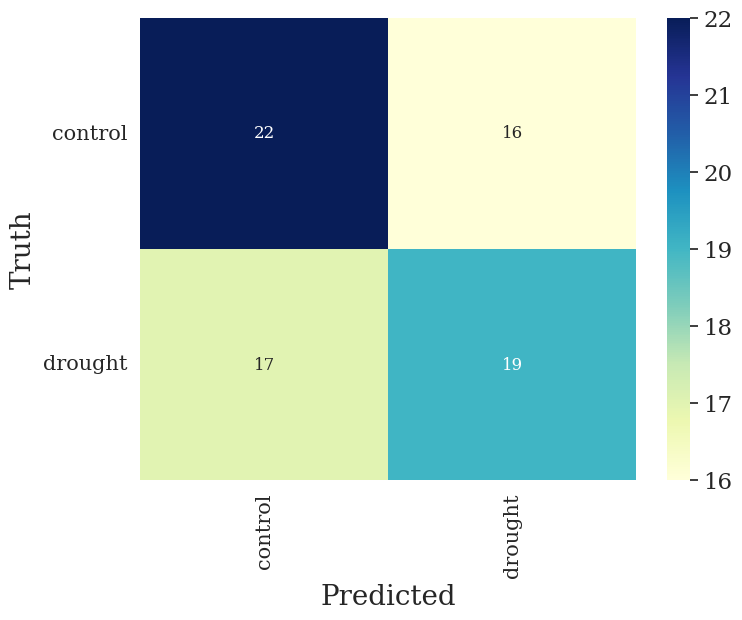

In [ ]:
y_test_pred = logreg.predict(X_test)

# print matrix
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred,average='weighted'))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred,average='weighted'))
print("Test: f1:",metrics.f1_score(y_test, y_test_pred,average='weighted'))

###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 12},cmap="YlGnBu")
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)

### SVM

In [ ]:
from scipy.stats import reciprocal, expon
param_distribs = {
    'kernel': ['rbf', 'linear','sigmoid'],
    'shrinking': [False, True],
    'C': reciprocal(10, 200),
    'coef0': expon(scale=1.0),
    'gamma': expon(scale=1.0),
    'degree': [1, 2, 3, 4, 5, 6],
    'tol': expon(scale=1e-4)
}

svm_clf = SVC()
rnd_search = RandomizedSearchCV(svm_clf, param_distributions=param_distribs,
                                n_iter=50, cv=3, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV] END C=30.710573677773706, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=rbf, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=30.710573677773706, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=rbf, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=30.710573677773706, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=rbf, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.49181458957517, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=True, tol=5.806520264207262e-06; total time=   0.0s
[CV] END C=13.49181458957517, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=True, tol=5.806520264207262e-06; total time=   0.0s
[CV] END C=13.49181458957517, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, ke

In [ ]:
# Create the SVC model with the best parameters from the randomized search
svc = SVC(**rnd_search.best_params_)

# Fit the model to the training data
svc.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(svc, X_train, y_train, cv=3)

# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')

print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Recall: 0.6235294117647059
Precision: 0.6625
F1 Score: 0.6424242424242423


Test: Accuracy: 0.5540540540540541
Test: Precision: 0.5534248217175046
Test: Recall: 0.5540540540540541
Test: f1: 0.5528269050558539


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

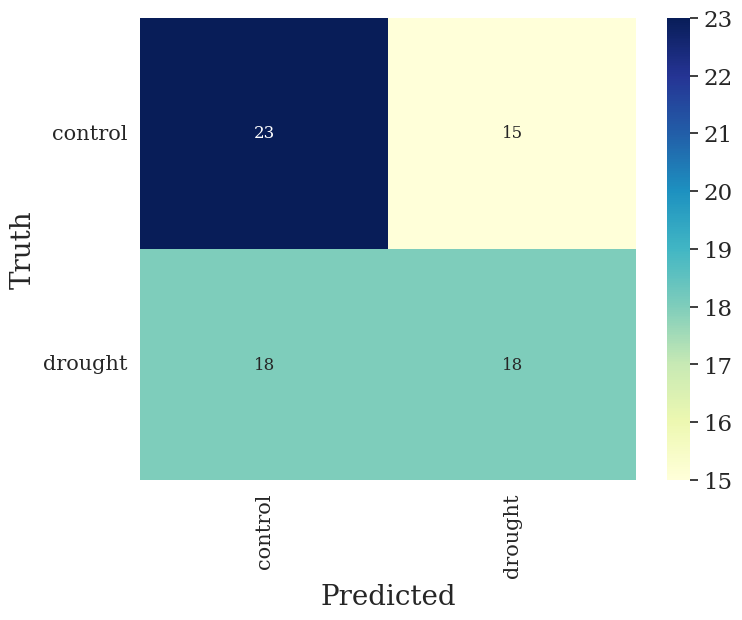

In [ ]:
y_test_pred = svc.predict(X_test)

# print matrix
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred,average='weighted'))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred,average='weighted'))
print("Test: f1:",metrics.f1_score(y_test, y_test_pred,average='weighted'))

###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 12},cmap="YlGnBu")
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)

### RF

In [ ]:
param_distribs = {
'n_estimators':[int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)],
'criterion': ['gini', 'entropy'],
'max_depth': [int(x) for x in np.linspace(10, 110, num = 11)],
'min_samples_split': [2, 5, 10],
'min_samples_leaf': [1, 2, 4],
'max_features': ['auto', 'sqrt'],
}

rf_clf = RandomForestClassifier(random_state=42)
rnd_search = RandomizedSearchCV(rf_clf, param_distributions=param_distribs,
n_iter=100, cv=3, scoring='accuracy',
verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 3 folds for each of 100 candidates, totalling 300 fits
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   3.4s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   4.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   4.0s
[CV] END criterion=gini, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.0s
[CV] END criterion=gini, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.0s
[CV] END criterion=gini, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1400; total time=   2.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1400; total time=   3.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1400; total time=   2.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1200; total time=   2.1s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1200; total time=   2.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1200; total time=   2.0s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   4.2s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   2.6s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   2.6s
[CV] END criterion=entropy, max_depth=7

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   4.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   3.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   3.1s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.1s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.1s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.1s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.1s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   3.9s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   3.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   4.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   4.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   3.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   3.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   5.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   3.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   3.6s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   1.7s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   2.2s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   2.6s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   0.8s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   0.7s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   0.7s
[CV] END criterion=entropy, 

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.1s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   2.4s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   3.5s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   3.0s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   4.7s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.4s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   4.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   0.7s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   0.6s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   0.7s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   3.8s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   3.5s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   2.8s
[CV] END criterion=entropy, max_d

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1800; total time=   3.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1800; total time=   4.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1800; total time=   3.3s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.0s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.3s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   3.3s
[CV] END criterion=gini, max_depth=

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=400; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=400; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=400; total time=   0.7s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   2.7s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   3.5s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   3.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=400; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=400; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=400; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   3.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   3.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   4.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=   1.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=   1.7s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.0s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.0s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.3s
[CV] END criterion=entropy, max_

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=800; total time=   2.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=800; total time=   2.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=800; total time=   1.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   3.4s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   4.3s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   3.1s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1600; total time=   2.6s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1600; total time=   2.6s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1600; total time=   3.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1000; total time=   2.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1000; total time=   1.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1000; total time=   1.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.4s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   4.9s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   3.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   4.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   3.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   3.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   4.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   3.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   3.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1600; total time=   3.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1600; total time=   4.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1600; total time=   2.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   3.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   3.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   4.2s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=1600; total time=   3.1s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=1600; total time=   2.9s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=1600; total time=   2.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   4.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   4.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   4.1s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=800; total time=   6.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=800; total time=   5.0s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=800; total time=   2.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=  10.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=   5.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=   5.5s
[CV] END criterion=entropy, max_depth=100, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.6s
[CV] END criterion=entropy, max_depth=100, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.6s
[CV] END criterion=entropy, max_depth=100, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.6s
[CV] END criterion=entropy, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1400; total time=   2.6s
[CV] END criterion=entropy, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1400; total time=   2.4s
[CV] END criterion=entropy, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1400; total time=   2.4s
[CV] END criterion=

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1200; total time=   2.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1200; total time=   2.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1200; total time=   2.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=2000; total time=   3.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=2000; total time=   5.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=2000; total time=   3.5s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   3.1s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   3.1s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   4.5s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.1s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=600; total time=   1.0s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=600; total time=   1.0s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=600; total time=   1.5s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   3.1s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   2.1s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   2.1s
[CV] END criterion=entropy, max_de

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1400; total time=   2.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1400; total time=   2.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1400; total time=   2.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   7.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   4.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.6s
[CV] END criterion=entropy, max_depth=70, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   2.1s
[CV] END criterion=entropy, max_depth=70, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   3.2s
[CV] END criterion=entropy, max_depth=70, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   2.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=600; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=600; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=600; total time=   1.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   4.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   3.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   3.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=2000; total time=   4.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=2000; total time=   4.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=2000; total time=   3.5s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=800; total time=   1.4s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=800; total time=   1.3s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=800; total time=   1.4s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1600; total time=   4.4s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1600; total time=   4.2s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1600; total time=   2.7s
[CV] END criterion=entropy, max_depth

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   3.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.1s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   3.0s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   7.5s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   5.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1000; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1000; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1000; total time=   2.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   4.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   3.2s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   3.4s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   4.2s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   3.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=80, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   3.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=80, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   3.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=80, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   4.4s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=   3.4s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=   3.5s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=   3.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1400; total time=   3.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1400; total time=   2.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1400; total time=   2.6s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   2.3s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   3.1s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   3.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=   1.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.7s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=1200; total time=   2.9s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=1200; total time=   2.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=1200; total time=   2.0s
Best parameters: {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 50, 'criterion': 'entropy'}
Best cross-validation score: 0.67


In [ ]:
# Create the Random Forest model with the best parameters from the randomized search
rf = RandomForestClassifier(**rnd_search.best_params_, random_state=42)

# Fit the model to the training data
rf.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(rf, X_train, y_train, cv=5)

# Calculate recall, precision, and F1 score
# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')

print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Recall: 0.5294117647058824
Precision: 0.5625
F1 Score: 0.5454545454545455


Test: Accuracy: 0.5675675675675675
Test: Precision: 0.5671303656597775
Test: Recall: 0.5675675675675675
Test: f1: 0.5669339669339668


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

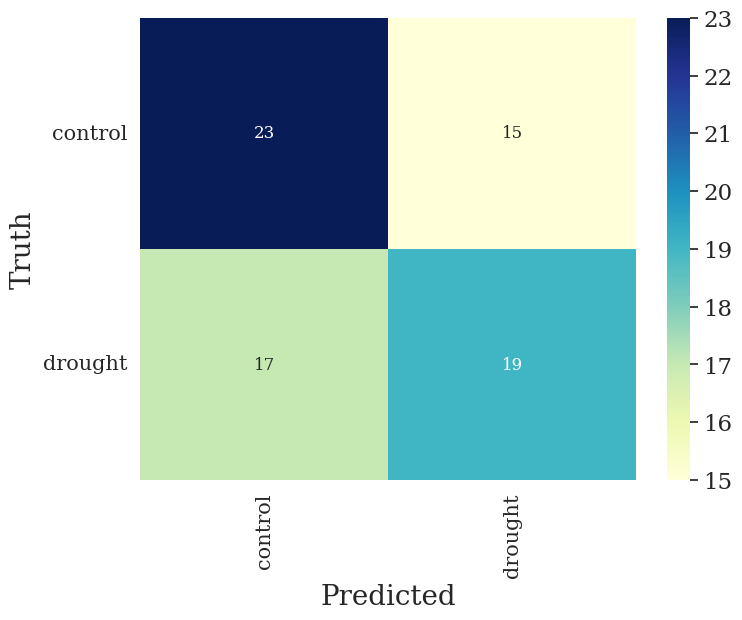

In [ ]:
y_test_pred = rf.predict(X_test)

# Print metrics
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred,average='weighted'))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred,average='weighted'))
print("Test: f1:",metrics.f1_score(y_test, y_test_pred,average='weighted'))

# Confusion matrix
# Labels for confusion matrix:
unique_label = np.unique([y_test, y_test_pred])

# Create confusion matrix dataframe:
cmtx = pd.DataFrame(
confusion_matrix(y_test, y_test_pred, labels=unique_label),
index=[x for x in unique_label],
columns=[x for x in unique_label])
plt.figure(figsize=(8, 6))
sns.heatmap(cmtx, annot=True, fmt='d', annot_kws={"size": 12}, cmap="YlGnBu")
plt.xlabel('Predicted', fontsize=20)
plt.ylabel('Truth', fontsize=20)
plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15, rotation=0)

## NDSI

In [ ]:
# Normalized index
def nvi_column(df,band1,band2):
  data = (df[str(band1)]-df[str(band2)])/(df[str(band1)]+df[str(band2)])
  return data

# fraction index
def frac_column(df,band1,band2):
  data = df[str(band1)]/df[str(band2)]
  return data

In [ ]:
df_ndsi = df.copy()

In [ ]:
df_ndsi["409-398"] = nvi_column(df,409,398)
df_ndsi["422-420"] = nvi_column(df,422,420)
df_ndsi["490-484"] = nvi_column(df,490,484)
df_ndsi["993-990"] = nvi_column(df,993,990)
df_ndsi["970-968"] = nvi_column(df,970,968)
df_ndsi["880-878"] = frac_column(df,880,878)
df_ndsi["873-871"] = frac_column(df,873,871)
df_ndsi["869-866"] = frac_column(df,869,866)

# Add new bands
df_ndsi["977-911"] = frac_column(df,977, 911)
df_ndsi["884-836"] = frac_column(df,884,836)
df_ndsi["836-732"] = frac_column(df,836,732)
df_ndsi["506-473"] = frac_column(df,506,473)

In [ ]:
X = df_ndsi[['977-911', '884-836', '836-732', '506-473']]
y = df_ndsi["treatment"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

X_train.shape, X_test.shape

((172, 4), (74, 4))

### Logistic Regression

In [ ]:
param_distribs = {
    'penalty': ['l1', 'l2'],
    'C': reciprocal(1, 1000),
    'solver': ['liblinear', 'saga'],
    'tol': expon(scale=1e-4),
    'fit_intercept': [False, True],
    'intercept_scaling': expon(scale=1.0),
    'max_iter': [100, 200, 300, 400, 500]
}

logreg_clf = LogisticRegression()
rnd_search = RandomizedSearchCV(logreg_clf, param_distributions=param_distribs,
                                n_iter=100, cv=5, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.1s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.1s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.1s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.1s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.1s
[CV] END C=1.994916615063393, fi

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=8.17949947521167, fit_intercept=True, intercept_scaling=0.00709138979446984, max_iter=100, penalty=l1, solver=liblinear, tol=9.463708738997988e-05; total time=   0.1s
[CV] END C=8.17949947521167, fit_intercept=True, intercept_scaling=0.00709138979446984, max_iter=100, penalty=l1, solver=liblinear, tol=9.463708738997988e-05; total time=   0.1s
[CV] END C=8.17949947521167, fit_intercept=True, intercept_scaling=0.00709138979446984, max_iter=100, penalty=l1, solver=liblinear, tol=9.463708738997988e-05; total time=   0.0s
[CV] END C=8.17949947521167, fit_intercept=True, intercept_scaling=0.00709138979446984, max_iter=100, penalty=l1, solver=liblinear, tol=9.463708738997988e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=8.17949947521167, fit_intercept=True, intercept_scaling=0.00709138979446984, max_iter=100, penalty=l1, solver=liblinear, tol=9.463708738997988e-05; total time=   0.1s
[CV] END C=2.6210878782654397, fit_intercept=True, intercept_scaling=3.6402995536277603, max_iter=300, penalty=l2, solver=liblinear, tol=0.00040882165254596954; total time=   0.0s
[CV] END C=2.6210878782654397, fit_intercept=True, intercept_scaling=3.6402995536277603, max_iter=300, penalty=l2, solver=liblinear, tol=0.00040882165254596954; total time=   0.0s
[CV] END C=2.6210878782654397, fit_intercept=True, intercept_scaling=3.6402995536277603, max_iter=300, penalty=l2, solver=liblinear, tol=0.00040882165254596954; total time=   0.0s
[CV] END C=2.6210878782654397, fit_intercept=True, intercept_scaling=3.6402995536277603, max_iter=300, penalty=l2, solver=liblinear, tol=0.00040882165254596954; total time=   0.0s
[CV] END C=2.6210878782654397, fit_intercept=True, intercept_scaling=3.6402995536277603, max_iter=300,

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 


[CV] END C=14.89984747565824, fit_intercept=True, intercept_scaling=1.0862557985649803, max_iter=200, penalty=l2, solver=saga, tol=2.3312023188561704e-05; total time=   0.0s
[CV] END C=14.89984747565824, fit_intercept=True, intercept_scaling=1.0862557985649803, max_iter=200, penalty=l2, solver=saga, tol=2.3312023188561704e-05; total time=   0.0s
[CV] END C=14.89984747565824, fit_intercept=True, intercept_scaling=1.0862557985649803, max_iter=200, penalty=l2, solver=saga, tol=2.3312023188561704e-05; total time=   0.0s
[CV] END C=14.89984747565824, fit_intercept=True, intercept_scaling=1.0862557985649803, max_iter=200, penalty=l2, solver=saga, tol=2.3312023188561704e-05; total time=   0.0s
[CV] END C=50.47786565710602, fit_intercept=False, intercept_scaling=3.4928071327362264, max_iter=200, penalty=l2, solver=saga, tol=5.027751757587391e-05; total time=   0.0s
[CV] END C=50.47786565710602, fit_intercept=False, intercept_scaling=3.4928071327362264, max_iter=200, penalty=l2, solver=saga, t

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=50.47786565710602, fit_intercept=False, intercept_scaling=3.4928071327362264, max_iter=200, penalty=l2, solver=saga, tol=5.027751757587391e-05; total time=   0.0s
[CV] END C=50.47786565710602, fit_intercept=False, intercept_scaling=3.4928071327362264, max_iter=200, penalty=l2, solver=saga, tol=5.027751757587391e-05; total time=   0.0s
[CV] END C=50.47786565710602, fit_intercept=False, intercept_scaling=3.4928071327362264, max_iter=200, penalty=l2, solver=saga, tol=5.027751757587391e-05; total time=   0.0s
[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.0s
[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.1s
[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(



[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.1s
[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.0s
[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.0s
[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.0s
[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.0s
[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.0s
[CV] END C=6.729728537157744, fit_intercept=False, intercept_scaling=1.6204835957747312, max_iter=100, penalty=l1, solver=liblinear, tol=5.506090617769176e-05; total time=   0.1s
[CV] END C=6.729728537157744, fit_intercept=False, intercept_scaling=1.6204835957747312, max_iter=100, penalty=l1, solver=liblinear, tol=5.506090617769176e-05; total time=   0.1s
[CV] END C=6.729728537157744, fit_intercept=False, intercept_scaling=1.6204835957747312, max_iter=100, penalty=l1, solve

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=15.298348658397893, fit_intercept=True, intercept_scaling=0.005537420375935475, max_iter=300, penalty=l1, solver=liblinear, tol=0.00012425125189400213; total time=   0.0s
[CV] END C=15.298348658397893, fit_intercept=True, intercept_scaling=0.005537420375935475, max_iter=300, penalty=l1, solver=liblinear, tol=0.00012425125189400213; total time=   0.0s
[CV] END C=15.298348658397893, fit_intercept=True, intercept_scaling=0.005537420375935475, max_iter=300, penalty=l1, solver=liblinear, tol=0.00012425125189400213; total time=   0.0s
[CV] END C=15.298348658397893, fit_intercept=True, intercept_scaling=0.005537420375935475, max_iter=300, penalty=l1, solver=liblinear, tol=0.00012425125189400213; total time=   0.0s
[CV] END C=234.7073130303151, fit_intercept=False, intercept_scaling=0.07692926551379635, max_iter=200, penalty=l1, solver=saga, tol=0.00019885295716582228; total time=   0.0s
[CV] END C=234.7073130303151, fit_intercept=False, intercept_scaling=0.07692926551379635, max_it

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=234.7073130303151, fit_intercept=False, intercept_scaling=0.07692926551379635, max_iter=200, penalty=l1, solver=saga, tol=0.00019885295716582228; total time=   0.0s
[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.0s
[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.0s
[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.0s
[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.0s
[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   0.1s
[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   0.1s
[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   0.0s
[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   0.0s
[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.0s
[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, pe

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.0s
[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.0s
[CV] END C=1.242474708366019, fit_intercept=False, intercept_scaling=0.6450624521653773, max_iter=500, penalty=l2, solver=saga, tol=0.00023812655298459756; total time=   0.0s
[CV] END C=1.242474708366019, fit_intercept=False, intercept_scaling=0.6450624521653773, max_iter=500, penalty=l2, solver=saga, tol=0.00023812655298459756; total time=   0.0s
[CV] END C=1.242474708366019, fit_intercept=False, intercept_scaling=0.6450624521653773, max_iter=500, penalty=l2, solver=saga, tol=0.00023812655298459756; total time=   0.0s
[CV] END C=1.242474708366019, fit_intercept=False, intercept_scaling=0.6450624521653773, max_iter=500, penalty=l2, solver

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=411.5113049561089, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.0s
[CV] END C=411.5113049561089, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.0s
[CV] END C=411.5113049561089, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.0s
[CV] END C=411.5113049561089, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.0s
[CV] END C=411.5113049561089, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.0s
[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   0.0s
[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   0.1s
[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   0.0s
[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   0.0s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.0s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=31.027409509128386, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   0.0s
[CV] END C=31.027409509128386, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   0.0s
[CV] END C=31.027409509128386, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   0.0s
[CV] END C=31.027409509128386, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   0.0s
[CV] END C=17.104525858990527, fit_intercept=False, intercept_scaling=0.32662592101036936, max_iter=100, penalty=l1, solver=liblinear, tol=0.0001141641252863987; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=17.104525858990527, fit_intercept=False, intercept_scaling=0.32662592101036936, max_iter=100, penalty=l1, solver=liblinear, tol=0.0001141641252863987; total time=   0.0s
[CV] END C=17.104525858990527, fit_intercept=False, intercept_scaling=0.32662592101036936, max_iter=100, penalty=l1, solver=liblinear, tol=0.0001141641252863987; total time=   0.0s
[CV] END C=17.104525858990527, fit_intercept=False, intercept_scaling=0.32662592101036936, max_iter=100, penalty=l1, solver=liblinear, tol=0.0001141641252863987; total time=   0.0s
[CV] END C=17.104525858990527, fit_intercept=False, intercept_scaling=0.32662592101036936, max_iter=100, penalty=l1, solver=liblinear, tol=0.0001141641252863987; total time=   0.0s
[CV] END C=39.15648958243001, fit_intercept=True, intercept_scaling=4.24403698261526, max_iter=400, penalty=l1, solver=liblinear, tol=4.614871275158603e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=39.15648958243001, fit_intercept=True, intercept_scaling=4.24403698261526, max_iter=400, penalty=l1, solver=liblinear, tol=4.614871275158603e-05; total time=   0.1s
[CV] END C=39.15648958243001, fit_intercept=True, intercept_scaling=4.24403698261526, max_iter=400, penalty=l1, solver=liblinear, tol=4.614871275158603e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=39.15648958243001, fit_intercept=True, intercept_scaling=4.24403698261526, max_iter=400, penalty=l1, solver=liblinear, tol=4.614871275158603e-05; total time=   0.1s
[CV] END C=39.15648958243001, fit_intercept=True, intercept_scaling=4.24403698261526, max_iter=400, penalty=l1, solver=liblinear, tol=4.614871275158603e-05; total time=   0.1s
[CV] END C=5.3269646504596615, fit_intercept=True, intercept_scaling=0.458522799264304, max_iter=400, penalty=l2, solver=saga, tol=5.0886827802519674e-05; total time=   0.0s
[CV] END C=5.3269646504596615, fit_intercept=True, intercept_scaling=0.458522799264304, max_iter=400, penalty=l2, solver=saga, tol=5.0886827802519674e-05; total time=   0.0s
[CV] END C=5.3269646504596615, fit_intercept=True, intercept_scaling=0.458522799264304, max_iter=400, penalty=l2, solver=saga, tol=5.0886827802519674e-05; total time=   0.0s
[CV] END C=5.3269646504596615, fit_intercept=True, intercept_scaling=0.458522799264304, max_iter=400, penalty=l2, solver=saga,

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.0s
[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.0s
[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.0s
[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.0s
[CV] END C=375.90353898082674, fit_intercept=True, intercept_scaling=1.1318517342673489, max_iter=300, penalty=l2, solver=liblinear, tol=0.00016581085759775227; total time=   0.0s
[CV] END C=375.90353898082674, fit_intercept=True, intercept_scaling=1.1318517342673489, max_iter=300, penalty=l2, solver=liblin

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=325.93448872393685, fit_intercept=False, intercept_scaling=0.41713243399517175, max_iter=100, penalty=l2, solver=liblinear, tol=7.796815233359066e-05; total time=   0.0s
[CV] END C=122.27937155416551, fit_intercept=False, intercept_scaling=1.0787627390439145, max_iter=200, penalty=l2, solver=liblinear, tol=7.269850610302966e-05; total time=   0.0s
[CV] END C=122.27937155416551, fit_intercept=False, intercept_scaling=1.0787627390439145, max_iter=200, penalty=l2, solver=liblinear, tol=7.269850610302966e-05; total time=   0.0s
[CV] END C=122.27937155416551, fit_intercept=False, intercept_scaling=1.0787627390439145, max_iter=200, penalty=l2, solver=liblinear, tol=7.269850610302966e-05; total time=   0.0s
[CV] END C=122.27937155416551, fit_intercept=False, intercept_scaling=1.0787627390439145, max_iter=200, penalty=l2, solver=liblinear, tol=7.269850610302966e-05; total time=   0.0s
[CV] END C=122.27937155416551, fit_intercept=False, intercept_scaling=1.0787627390439145, max_iter=

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 


[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol=1.7531581610419906e-05; total time=   0.0s
[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol=1.7531581610419906e-05; total time=   0.0s
[CV] END C=44.27936336500086, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.0s
[CV] END C=44.27936336500086, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.0s
[CV] END C=44.27936336500086, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.0s
[CV] END C=44.27936336500086, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.0s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.0s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.0s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.0s
[CV] END C=1.9099601385505387, fit_intercept=False, intercept_scaling=1.0115156153275293, max_iter=500, penalty=l1, solver=saga, tol=0.000236551198250572; total time=   0.0s
[CV] END C=1.9099601385505387, fit_intercept=False, intercept_scaling=1.0115156153275293, max_iter=500, penalty=l1, solver=sag

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=20.099400153590373, fit_intercept=False, intercept_scaling=0.6984353243887704, max_iter=400, penalty=l1, solver=saga, tol=0.00019963332490174825; total time=   0.0s
[CV] END C=20.099400153590373, fit_intercept=False, intercept_scaling=0.6984353243887704, max_iter=400, penalty=l1, solver=saga, tol=0.00019963332490174825; total time=   0.0s
[CV] END C=20.099400153590373, fit_intercept=False, intercept_scaling=0.6984353243887704, max_iter=400, penalty=l1, solver=saga, tol=0.00019963332490174825; total time=   0.0s
[CV] END C=4.904060335291481, fit_intercept=True, intercept_scaling=0.32957736836626295, max_iter=300, penalty=l2, solver=liblinear, tol=4.4582987105486325e-06; total time=   0.0s
[CV] END C=4.904060335291481, fit_intercept=True, intercept_scaling=0.32957736836626295, max_iter=300, penalty=l2, solver=liblinear, tol=4.4582987105486325e-06; total time=   0.0s
[CV] END C=4.904060335291481, fit_intercept=True, intercept_scaling=0.32957736836626295, max_iter=300, penalty=l

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=46.817022250358995, fit_intercept=False, intercept_scaling=1.8592664926604465, max_iter=300, penalty=l2, solver=saga, tol=1.0222819734932289e-05; total time=   0.0s
[CV] END C=46.817022250358995, fit_intercept=False, intercept_scaling=1.8592664926604465, max_iter=300, penalty=l2, solver=saga, tol=1.0222819734932289e-05; total time=   0.0s
[CV] END C=46.817022250358995, fit_intercept=False, intercept_scaling=1.8592664926604465, max_iter=300, penalty=l2, solver=saga, tol=1.0222819734932289e-05; total time=   0.0s
[CV] END C=46.817022250358995, fit_intercept=False, intercept_scaling=1.8592664926604465, max_iter=300, penalty=l2, solver=saga, tol=1.0222819734932289e-05; total time=   0.0s
[CV] END C=69.98769331752378, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, tol=3.894206578010433e-05; total time=   0.0s
[CV] END C=69.98769331752378, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=5.869766574033025, fit_intercept=True, intercept_scaling=2.4446159618366363, max_iter=200, penalty=l1, solver=liblinear, tol=9.885776341980908e-05; total time=   0.1s
[CV] END C=3.8266774797637018, fit_intercept=True, intercept_scaling=1.210550648511517, max_iter=400, penalty=l1, solver=liblinear, tol=2.8005284605107367e-06; total time=   0.0s
[CV] END C=3.8266774797637018, fit_intercept=True, intercept_scaling=1.210550648511517, max_iter=400, penalty=l1, solver=liblinear, tol=2.8005284605107367e-06; total time=   0.1s
[CV] END C=3.8266774797637018, fit_intercept=True, intercept_scaling=1.210550648511517, max_iter=400, penalty=l1, solver=liblinear, tol=2.8005284605107367e-06; total time=   0.0s
[CV] END C=3.8266774797637018, fit_intercept=True, intercept_scaling=1.210550648511517, max_iter=400, penalty=l1, solver=liblinear, tol=2.8005284605107367e-06; total time=   0.0s
[CV] END C=3.8266774797637018, fit_intercept=True, intercept_scaling=1.210550648511517, max_iter=400, pena

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=12.038487446822948, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, tol=0.00033596283814742904; total time=   0.0s
[CV] END C=12.038487446822948, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, tol=0.00033596283814742904; total time=   0.0s
[CV] END C=12.038487446822948, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, tol=0.00033596283814742904; total time=   0.0s
[CV] END C=23.539405203496106, fit_intercept=True, intercept_scaling=0.053065095910309404, max_iter=400, penalty=l2, solver=liblinear, tol=0.00012023481606650837; total time=   0.0s
[CV] END C=23.539405203496106, fit_intercept=True, intercept_scaling=0.053065095910309404, max_iter=400, penalty=l2, solver=liblinear, tol=0.00012023481606650837; total time=   0.0s
[CV] END C=23.539405203496106, fit_intercept=True, intercept_scaling=0.053065095910309404, max_iter=400, pen

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=15.720367857375772, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=15.720367857375772, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=15.720367857375772, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=15.720367857375772, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=15.720367857375772, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=322.0626495993123, fit_intercept=False, intercept_scaling=1.1663556221844276, max_iter=100, penalty=l2, solve

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=732.142877838078, fit_intercept=False, intercept_scaling=1.070349457388161, max_iter=500, penalty=l2, solver=liblinear, tol=5.440378655320514e-05; total time=   0.0s
[CV] END C=732.142877838078, fit_intercept=False, intercept_scaling=1.070349457388161, max_iter=500, penalty=l2, solver=liblinear, tol=5.440378655320514e-05; total time=   0.0s
[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=100, penalty=l1, solver=saga, tol=9.628963170556041e-06; total time=   0.0s
[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=100, penalty=l1, solver=saga, tol=9.628963170556041e-06; total time=   0.0s
[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=100, penalty=l1, solver=saga, tol=9.628963170556041e-06; total time=   0.0s
[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=100, penalty=l1, solver=sa

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=195.02633930329975, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga, tol=0.0001049175712447296; total time=   0.0s
[CV] END C=195.02633930329975, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga, tol=0.0001049175712447296; total time=   0.0s
[CV] END C=195.02633930329975, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga, tol=0.0001049175712447296; total time=   0.0s
[CV] END C=195.02633930329975, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga, tol=0.0001049175712447296; total time=   0.0s
[CV] END C=1.393723980460675, fit_intercept=True, intercept_scaling=1.008114536040912, max_iter=200, penalty=l2, solver=liblinear, tol=1.542286357518888e-06; total time=   0.0s
[CV] END C=1.393723980460675, fit_intercept=True, intercept_scaling=1.008114536040912, max_iter=200, penalty=l2, solver=lib

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=631.4063194652971, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.0s
[CV] END C=631.4063194652971, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.0s
[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.0s
[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.0s
[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.0s
[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, t

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=289.2547712197909, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalty=l1, solver=liblinear, tol=2.415482837490208e-05; total time=   0.2s
[CV] END C=289.2547712197909, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalty=l1, solver=liblinear, tol=2.415482837490208e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=289.2547712197909, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalty=l1, solver=liblinear, tol=2.415482837490208e-05; total time=   0.2s
[CV] END C=289.2547712197909, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalty=l1, solver=liblinear, tol=2.415482837490208e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=289.2547712197909, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalty=l1, solver=liblinear, tol=2.415482837490208e-05; total time=   0.1s
[CV] END C=13.544945118140927, fit_intercept=False, intercept_scaling=0.09920501165575414, max_iter=300, penalty=l1, solver=liblinear, tol=0.00010663076539900722; total time=   0.0s
[CV] END C=13.544945118140927, fit_intercept=False, intercept_scaling=0.09920501165575414, max_iter=300, penalty=l1, solver=liblinear, tol=0.00010663076539900722; total time=   0.0s
[CV] END C=13.544945118140927, fit_intercept=False, intercept_scaling=0.09920501165575414, max_iter=300, penalty=l1, solver=liblinear, tol=0.00010663076539900722; total time=   0.0s
[CV] END C=13.544945118140927, fit_intercept=False, intercept_scaling=0.09920501165575414, max_iter=300, penalty=l1, solver=liblinear, tol=0.00010663076539900722; total time=   0.0s
[CV] END C=13.544945118140927, fit_intercept=False, intercept_scaling=0.09920501165575414, max_

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=156.6546410800757, fit_intercept=True, intercept_scaling=0.4652439119617327, max_iter=500, penalty=l2, solver=liblinear, tol=0.000113894933798157; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=saga, tol=6.862931048605623e-05; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=saga, tol=6.862931048605623e-05; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=saga, tol=6.862931048605623e-05; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=saga, tol=6.862931048605623e-05; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, so

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.0s
[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.0s
[CV] END C=22.148104601284686, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, penalty=l1, solver=liblinear, tol=0.00013958378736630774; total time=   0.0s
[CV] END C=22.148104601284686, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, penalty=l1, solver=liblinear, tol=0.00013958378736630774; total time=   0.0s
[CV] END C=22.148104601284686, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, penalty=l1, solver=liblinear, tol=0.00013958378736630774; total time=   0.0s
[CV] END C=22.148104601284686, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, pen

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   0.1s
[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   0.1s
[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   0.0s
[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   0.1s
[CV] END C=2.685190154647807, fit_intercept=True, intercept_scaling=1.8137834722862145, max_iter=100, penalty=l1, solver=saga, tol=8.785552166860508e-06; total time=   0.0s
[CV] END C=2.685190154647807, fit_intercept=True, intercept_scaling=1.8137834722862145, max_iter=100, penal

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=2.685190154647807, fit_intercept=True, intercept_scaling=1.8137834722862145, max_iter=100, penalty=l1, solver=saga, tol=8.785552166860508e-06; total time=   0.0s
[CV] END C=2.685190154647807, fit_intercept=True, intercept_scaling=1.8137834722862145, max_iter=100, penalty=l1, solver=saga, tol=8.785552166860508e-06; total time=   0.0s
[CV] END C=126.73815903184186, fit_intercept=True, intercept_scaling=0.5052604745654999, max_iter=300, penalty=l2, solver=saga, tol=8.484875058031207e-06; total time=   0.0s
[CV] END C=126.73815903184186, fit_intercept=True, intercept_scaling=0.5052604745654999, max_iter=300, penalty=l2, solver=saga, tol=8.484875058031207e-06; total time=   0.0s
[CV] END C=126.73815903184186, fit_intercept=True, intercept_scaling=0.5052604745654999, max_iter=300, penalty=l2, solver=saga, tol=8.484875058031207e-06; total time=   0.0s
[CV] END C=126.73815903184186, fit_intercept=True, intercept_scaling=0.5052604745654999, max_iter=300, penalty=l2, solver=saga, tol=

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 


[CV] END C=694.6175184647423, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=saga, tol=8.719399369795727e-06; total time=   0.0s
[CV] END C=694.6175184647423, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=saga, tol=8.719399369795727e-06; total time=   0.0s
[CV] END C=694.6175184647423, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=saga, tol=8.719399369795727e-06; total time=   0.0s
[CV] END C=694.6175184647423, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=saga, tol=8.719399369795727e-06; total time=   0.0s
[CV] END C=214.5066437415383, fit_intercept=True, intercept_scaling=1.2210659442092298, max_iter=200, penalty=l2, solver=liblinear, tol=1.1788020797188026e-05; total time=   0.0s
[CV] END C=214.5066437415383, fit_intercept=True, intercept_scaling=1.2210659442092298, max_iter=200, penalty=l2, solver=lib

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=294.0160614626455, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.0s
[CV] END C=294.0160614626455, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.0s
[CV] END C=294.0160614626455, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.0s
[CV] END C=294.0160614626455, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.0s
[CV] END C=294.0160614626455, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.0s
[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, t

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.0s
[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.0s
[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.0s
[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.0s
[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.0s
[CV] END C=45.87360314978283, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, to

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=971.6148079839163, fit_intercept=True, intercept_scaling=0.8778258618057556, max_iter=100, penalty=l1, solver=saga, tol=0.0003186951071461003; total time=   0.0s
[CV] END C=971.6148079839163, fit_intercept=True, intercept_scaling=0.8778258618057556, max_iter=100, penalty=l1, solver=saga, tol=0.0003186951071461003; total time=   0.0s
[CV] END C=971.6148079839163, fit_intercept=True, intercept_scaling=0.8778258618057556, max_iter=100, penalty=l1, solver=saga, tol=0.0003186951071461003; total time=   0.0s
[CV] END C=971.6148079839163, fit_intercept=True, intercept_scaling=0.8778258618057556, max_iter=100, penalty=l1, solver=saga, tol=0.0003186951071461003; total time=   0.0s
[CV] END C=971.6148079839163, fit_intercept=True, intercept_scaling=0.8778258618057556, max_iter=100, penalty=l1, solver=saga, tol=0.0003186951071461003; total time=   0.0s
[CV] END C=1.4913916020557285, fit_intercept=True, intercept_scaling=0.60817526195962, max_iter=400, penalty=l1, solver=saga, tol=1.859

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=87.20574266688077, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.0s
[CV] END C=87.20574266688077, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.0s
[CV] END C=87.20574266688077, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.0s
[CV] END C=6.023509346536343, fit_intercept=False, intercept_scaling=1.1978638819127894, max_iter=100, penalty=l1, solver=liblinear, tol=5.296801261573896e-05; total time=   0.0s
[CV] END C=6.023509346536343, fit_intercept=False, intercept_scaling=1.1978638819127894, max_iter=100, penalty=l1, solver=liblinear, tol=5.296801261573896e-05; total time=   0.0s
[CV] END C=6.023509346536343, fit_intercept=False, intercept_scaling=1.1978638819127894, max_iter=100, penalty=l1, solve

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=6.023509346536343, fit_intercept=False, intercept_scaling=1.1978638819127894, max_iter=100, penalty=l1, solver=liblinear, tol=5.296801261573896e-05; total time=   0.1s
[CV] END C=6.023509346536343, fit_intercept=False, intercept_scaling=1.1978638819127894, max_iter=100, penalty=l1, solver=liblinear, tol=5.296801261573896e-05; total time=   0.1s
[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.0s
[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.0s
[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.0s
[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.0s
[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.0s
[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.0s
[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.0s
[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol

In [ ]:
# Create the Logistic Regression model with the best parameters from the randomized search
logreg = LogisticRegression(**rnd_search.best_params_)

# Fit the model to the training data
logreg.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(logreg, X_train, y_train, cv=5)

# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')


print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Recall: 0.7126436781609196
Precision: 0.7126436781609196
F1 Score: 0.7126436781609196


Test: Accuracy: 0.5540540540540541
Test: Precision: 0.570342756549653
Test: Recall: 0.5540540540540541
Test: f1: 0.5495545077273201


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

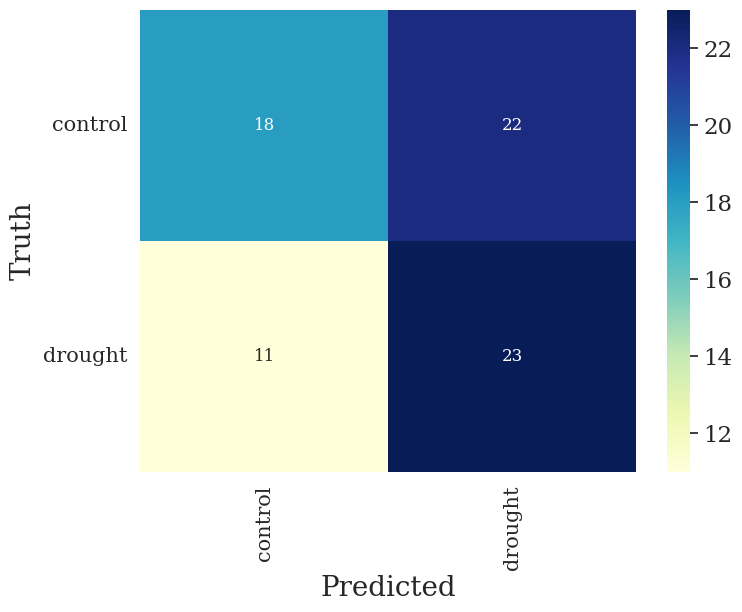

In [ ]:
y_test_pred = logreg.predict(X_test)

# print matrix
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred,average='weighted'))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred,average='weighted'))
print("Test: f1:",metrics.f1_score(y_test, y_test_pred,average='weighted'))

###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 12},cmap="YlGnBu")
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)

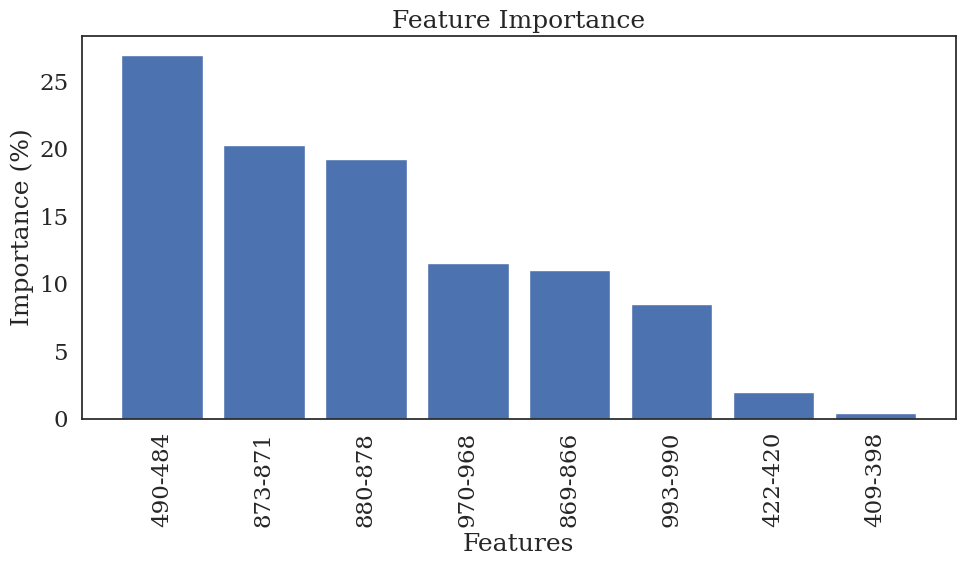

In [ ]:

# Get the coefficients of the model
coefficients = logreg.coef_[0]

# Calculate the absolute feature importance
feature_importance = np.abs(coefficients)

# Calculate the percentage of each feature importance
total_importance = np.sum(feature_importance)
percentage_importance = (feature_importance / total_importance) * 100

# Sort the feature importance in descending order
sorted_idx = np.argsort(percentage_importance)[::-1]

# Get the names of the features
feature_names = X_train.columns

# Plot the feature importance
plt.figure(figsize=(10, 6))
plt.bar(range(len(percentage_importance)), percentage_importance[sorted_idx], align='center')
plt.xticks(range(len(percentage_importance)), feature_names[sorted_idx], rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance (%)')
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

### SVM

In [ ]:
param_distribs = {
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'shrinking': [False, True],
    'C': reciprocal(1, 1000),
    'coef0': expon(scale=1.0),
    'gamma': expon(scale=1.0),
    'degree': [1, 2, 3, 4, 5, 6, 7, 8],
    'tol': expon(scale=1e-4)
}

svm_clf = SVC()
rnd_search = RandomizedSearchCV(svm_clf, param_distributions=param_distribs,
                                n_iter=50, cv=3, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=False, tol=2.0799307999138624e-06; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=False, tol=2.0799307999138624e-06; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821

In [ ]:
# Create the SVC model with the best parameters from the randomized search
svc = SVC(**rnd_search.best_params_)

# Fit the model to the training data
svc.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(svc, X_train, y_train, cv=3)

# Calculate recall, precision, and F1 score
accuracy = accuracy_score(y_train, y_train_pred)
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')

# Print the results
print("Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Accuracy: 0.9011627906976745
Recall: 0.9425287356321839
Precision: 0.8723404255319149
F1 Score: 0.9060773480662984


Test: Accuracy: 0.8108108108108109
Test: Precision: 0.7380952380952381 
Test: Recall: 0.9117647058823529 
Test: F1 Score: 0.8157894736842106


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

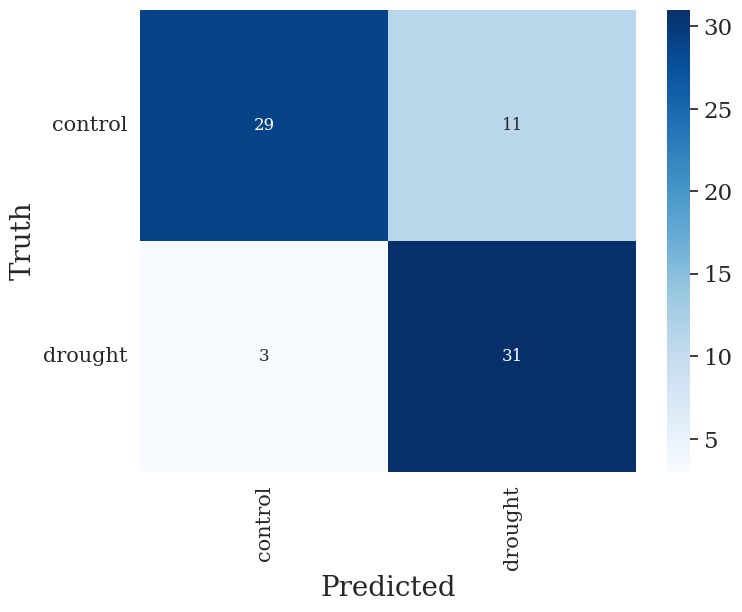

In [ ]:
y_test_pred = svc.predict(X_test)

# print matrix
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Precision:",precision_score(y_test, y_test_pred, pos_label='drought')
      ,"\nTest: Recall:",recall_score(y_test, y_test_pred, pos_label='drought')
      ,"\nTest: F1 Score:",f1_score(y_test, y_test_pred, pos_label='drought'))

###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 12},cmap="Blues")
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)

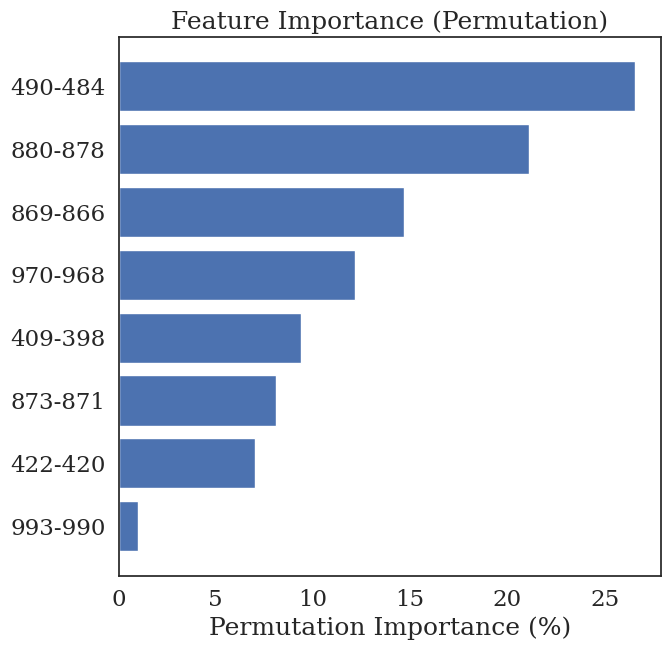

In [ ]:
# Use permutation importance to calculate feature importance
result = permutation_importance(svc, X_train, y_train, n_repeats=10, random_state=42, n_jobs=-1)

# Get feature importance scores and normalize them to percentages
importance = result.importances_mean

# normalize to precentages
importance = (importance / np.sum(importance))*100


# Plot feature importance
sorted_idx = importance.argsort()
fig, ax = plt.subplots(figsize=(7, 7))
plt.barh(X_train.columns[sorted_idx], importance[sorted_idx])

plt.xlabel("Permutation Importance (%)")
plt.title("Feature Importance (Permutation)")
plt.show()

### RF

In [ ]:
param_distribs = {
'n_estimators':[int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)],
'criterion': ['gini', 'entropy'],
'max_depth': [int(x) for x in np.linspace(10, 110, num = 11)],
'min_samples_split': [2, 5, 10],
'min_samples_leaf': [1, 2, 4],
'max_features': ['auto', 'sqrt'],
}

rf_clf = RandomForestClassifier(random_state=42)
rnd_search = RandomizedSearchCV(rf_clf, param_distributions=param_distribs,
n_iter=50, cv=3, scoring='accuracy',
verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   7.7s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   5.1s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=  10.3s
[CV] END criterion=gini, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   3.6s
[CV] END criterion=gini, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   3.1s
[CV] END criterion=gini, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   3.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1400; total time=   6.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1400; total time=   4.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1400; total time=   3.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1200; total time=   4.6s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1200; total time=   5.1s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1200; total time=   3.1s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   4.1s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   6.0s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   9.6s
[CV] END criterion=entropy, max_depth=7

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   6.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   5.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   3.6s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   0.9s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   0.9s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   0.9s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.5s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.5s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   5.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   3.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   2.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   3.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   3.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   5.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   3.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   3.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   3.1s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   2.0s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   5.5s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   2.9s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   0.8s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   0.6s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   0.6s
[CV] END criterion=entropy, 

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   1.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   1.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   1.9s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   2.1s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   2.2s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   3.4s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   4.2s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.6s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   0.9s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   0.6s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   0.6s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   2.4s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   2.4s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   2.4s
[CV] END criterion=entropy, max_d

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1800; total time=   4.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1800; total time=   3.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1800; total time=   2.9s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   1.8s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   1.8s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.5s
[CV] END criterion=gini, max_depth=

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=400; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=400; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=400; total time=   0.6s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   2.4s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   2.4s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=400; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=400; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=400; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   3.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   3.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   3.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=   1.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=   2.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=   2.5s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.7s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.7s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   0.9s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   0.9s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   0.9s
[CV] END criterion=entropy, max_

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=800; total time=   1.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=800; total time=   1.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=800; total time=   1.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   4.8s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   3.4s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   2.6s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1600; total time=   2.4s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1600; total time=   2.3s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1600; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1000; total time=   2.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1000; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1000; total time=   1.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.0s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.0s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   4.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   3.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   2.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   2.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


Best parameters: {'n_estimators': 1800, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 80, 'criterion': 'entropy'}
Best cross-validation score: 0.92


In [ ]:
# Create the Random Forest model with the best parameters from the randomized search
rf = RandomForestClassifier(**rnd_search.best_params_, random_state=42)

# Fit the model to the training data
rf.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(rf, X_train, y_train, cv=5)

# Calculate recall, precision, and F1 score
# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')

print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Recall: 0.9310344827586207
Precision: 0.9204545454545454
F1 Score: 0.9257142857142858


Test: Accuracy: 0.8243243243243243
Test: Precision: 0.8276113951789628
Test: Recall: 0.8243243243243243
Test: f1: 0.8246135288388811


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

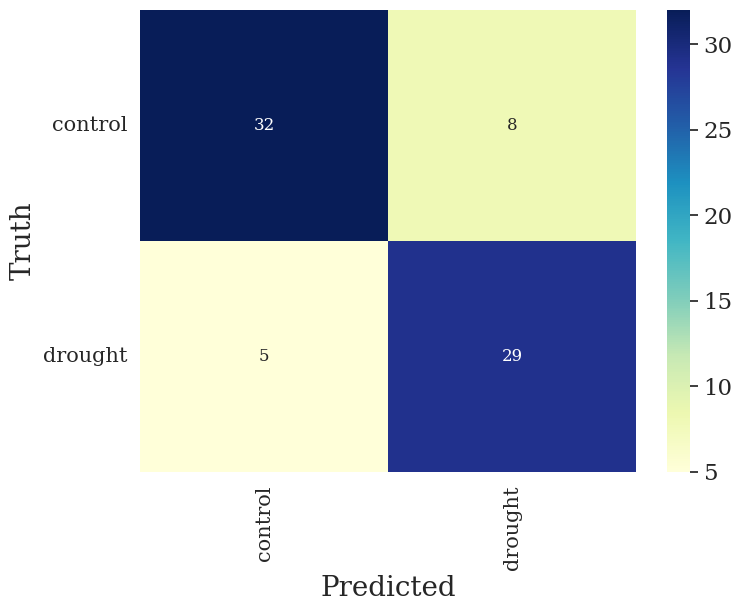

In [ ]:
y_test_pred = rf.predict(X_test)

# Print metrics
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred,average='weighted'))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred,average='weighted'))
print("Test: f1:",metrics.f1_score(y_test, y_test_pred,average='weighted'))

# Confusion matrix
# Labels for confusion matrix:
unique_label = np.unique([y_test, y_test_pred])

# Create confusion matrix dataframe:
cmtx = pd.DataFrame(
confusion_matrix(y_test, y_test_pred, labels=unique_label),
index=[x for x in unique_label],
columns=[x for x in unique_label])
plt.figure(figsize=(8, 6))
sns.heatmap(cmtx, annot=True, fmt='d', annot_kws={"size": 12}, cmap="YlGnBu")
plt.xlabel('Predicted', fontsize=20)
plt.ylabel('Truth', fontsize=20)
plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15, rotation=0)

## Draft classifiation on Venus

In [ ]:
!pip install lazypredict
import lazypredict

from lazypredict.Supervised import LazyClassifier
from sklearn.model_selection import train_test_split

clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train, y_test)

models

100%|██████████| 29/29 [00:04<00:00,  6.77it/s]

[LightGBM] [Info] Number of positive: 87, number of negative: 85
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000083 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 649
[LightGBM] [Info] Number of data points in the train set: 172, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.505814 -> initscore=0.023257
[LightGBM] [Info] Start training from score 0.023257
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
QuadraticDiscriminantAnalysis,0.68,0.68,None,0.67,0.06
NuSVC,0.68,0.68,None,0.68,0.11
LinearDiscriminantAnalysis,0.61,0.62,None,0.61,0.07
BernoulliNB,0.61,0.61,None,0.61,0.10
SVC,0.61,0.61,None,0.61,0.05
BaggingClassifier,0.61,0.60,None,0.60,0.25
KNeighborsClassifier,0.59,0.60,None,0.59,0.09
RidgeClassifierCV,0.58,0.59,None,0.57,0.08
RidgeClassifier,0.57,0.59,None,0.54,0.11


In [ ]:
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

param_distribs = {
    'reg_param': uniform(0, 1),
    'tol': uniform(1e-6, 1e-2),
    'store_covariance': [True, False],
}

qda_clf = QuadraticDiscriminantAnalysis()
rnd_search = RandomizedSearchCV(qda_clf, param_distributions=param_distribs,
                                n_iter=100, cv=5, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END reg_param=0.3745401188473625, store_covariance=True, tol=0.001835347898661638; total time=   0.0s
[CV] END reg_param=0.3745401188473625, store_covariance=True, tol=0.001835347898661638; total time=   0.0s
[CV] END reg_param=0.3745401188473625, store_covariance=True, tol=0.001835347898661638; total time=   0.0s
[CV] END reg_param=0.3745401188473625, store_covariance=True, tol=0.001835347898661638; total time=   0.0s
[CV] END reg_param=0.3745401188473625, store_covariance=True, tol=0.001835347898661638; total time=   0.0s
[CV] END reg_param=0.7796910002727693, store_covariance=True, tol=0.001561186404424365; total time=   0.0s
[CV] END reg_param=0.7796910002727693, store_covariance=True, tol=0.001561186404424365; total time=   0.0s
[CV] END reg_param=0.7796910002727693, store_covariance=True, tol=0.001561186404424365; total time=   0.0s
[CV] END reg_param=0.7796910002727693, store_covariance=True, tol=0.0015611864044

Recall: 0.8735632183908046
Precision: 0.5757575757575758
F1 Score: 0.6940639269406393


 Test Set: 


Test: Accuracy: 0.5405405405405406
Test: Recall: 0.8823529411764706
Test: Precision: 0.5
Test: F1 Score: 0.6382978723404256


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

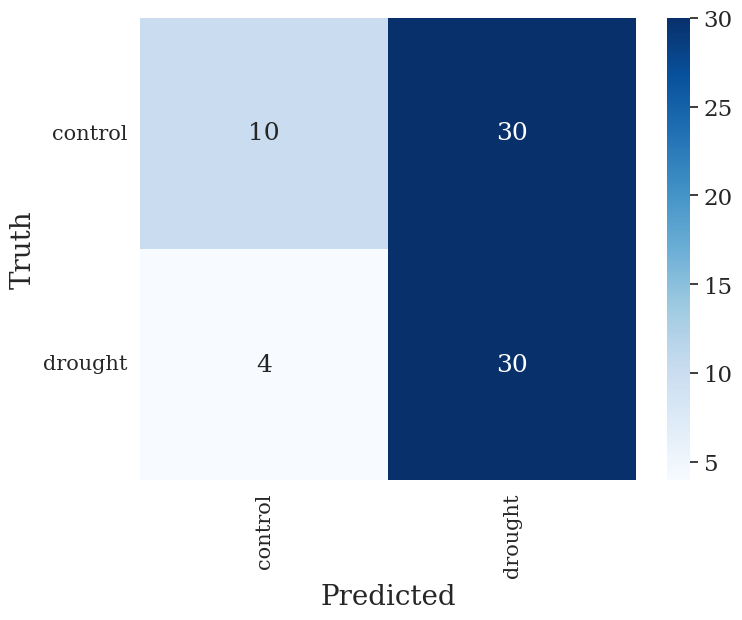

In [ ]:
qda = QuadraticDiscriminantAnalysis(**rnd_search.best_params_)

# Fit the model to the training data
qda.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(qda, X_train, y_train, cv=5)

# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')


print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

print('\n\n Test Set: \n\n')
y_test_pred = qda.predict(X_test)

# print matrix
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred, pos_label='drought'))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred, pos_label='drought'))
print("Test: F1 Score:",metrics.f1_score(y_test, y_test_pred, pos_label='drought'))

###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 18},cmap="Blues")
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)

In [ ]:
from sklearn.svm import NuSVC
param_distribs = {
    'nu': uniform(0, 1),
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'degree': [2, 3, 4, 5],
    'gamma': ['scale', 'auto'] + list(expon(scale=0.1).rvs(10)),
    'coef0': uniform(-1, 1),
    'shrinking': [True, False],
    'tol': expon(scale=1e-4),
}

nusvc_clf = NuSVC(random_state=42)
rnd_search = RandomizedSearchCV(nusvc_clf, param_distributions=param_distribs,
                                n_iter=100, cv=5, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END coef0=-0.6254598811526375, degree=2, gamma=0.01637905849505552, kernel=sigmoid, nu=0.5986584841970366, shrinking=True, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END coef0=-0.6254598811526375, degree=2, gamma=0.01637905849505552, kernel=sigmoid, nu=0.5986584841970366, shrinking=True, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END coef0=-0.6254598811526375, degree=2, gamma=0.01637905849505552, kernel=sigmoid, nu=0.5986584841970366, shrinking=True, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END coef0=-0.6254598811526375, degree=2, gamma=0.01637905849505552, kernel=sigmoid, nu=0.5986584841970366, shrinking=True, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END coef0=-0.6254598811526375, degree=2, gamma=0.01637905849505552, kernel=sigmoid, nu=0.5986584841970366, shrinking=True, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END coef0=-0.9000250841819971, degree=4, gamma=0.22078450

Recall: 0.7586206896551724
Precision: 0.6804123711340206
F1 Score: 0.717391304347826


 Test Set: 


Test: Accuracy: 0.6216216216216216
Test: Recall: 0.6470588235294118
Test: Precision: 0.5789473684210527
Test: F1 Score: 0.6111111111111113


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

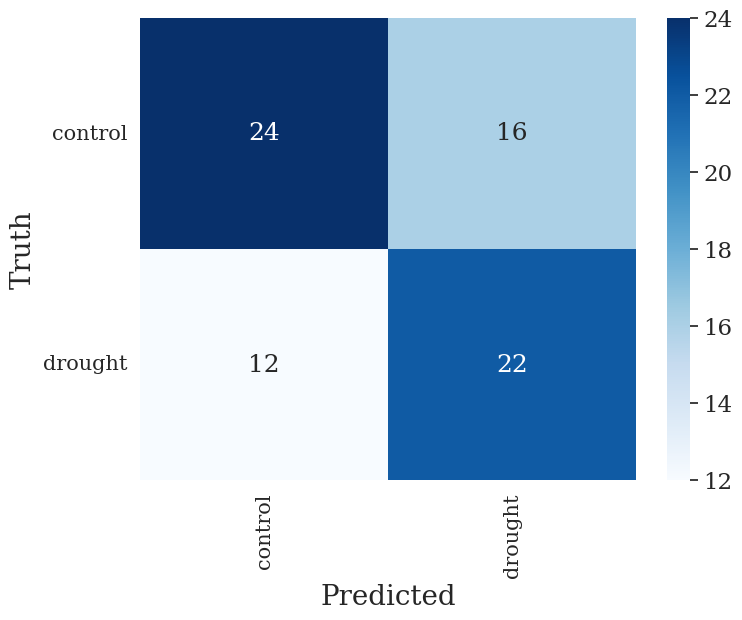

In [ ]:
nusvc = NuSVC(**rnd_search.best_params_)

# Fit the model to the training data
nusvc.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(nusvc, X_train, y_train, cv=5)

# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')


print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

print('\n\n Test Set: \n\n')
y_test_pred = nusvc.predict(X_test)

# print matrix
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred, pos_label='drought'))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred, pos_label='drought'))
print("Test: F1 Score:",metrics.f1_score(y_test, y_test_pred, pos_label='drought'))

###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 18},cmap="Blues")
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)

### MLP

In [ ]:
param_distribs = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50), (100, 100)],
    'activation': ['tanh', 'relu', 'logistic'],
    'solver': ['sgd', 'adam'],
    'alpha': reciprocal(1e-5, 1e-1),
    'learning_rate': ['constant', 'invscaling', 'adaptive'],
    'learning_rate_init': reciprocal(1e-5, 1e-1),
    'max_iter': [500, 1000, 1500, 2000],
    'tol': uniform(1e-5, 1e-3),
    'momentum': uniform(0.1, 0.9),
    'early_stopping': [True, False],
    'n_iter_no_change': [5, 10, 20],
    'batch_size': ['auto', 32, 64, 128, 256]
}

mlp_clf = MLPClassifier(random_state=42)
rnd_search = RandomizedSearchCV(mlp_clf, param_distributions=param_distribs,
                                n_iter=100, cv=5, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END activation=logistic, alpha=0.015352246941973482, batch_size=64, early_stopping=False, hidden_layer_sizes=(100, 100), learning_rate=constant, learning_rate_init=4.207988669606632e-05, max_iter=1500, momentum=0.18997742423620262, n_iter_no_change=20, solver=adam, tol=0.00034370861113902185; total time=   0.5s
[CV] END activation=logistic, alpha=0.015352246941973482, batch_size=64, early_stopping=False, hidden_layer_sizes=(100, 100), learning_rate=constant, learning_rate_init=4.207988669606632e-05, max_iter=1500, momentum=0.18997742423620262, n_iter_no_change=20, solver=adam, tol=0.00034370861113902185; total time=   0.6s
[CV] END activation=logistic, alpha=0.015352246941973482, batch_size=64, early_stopping=False, hidden_layer_sizes=(100, 100), learning_rate=constant, learning_rate_init=4.207988669606632e-05, max_iter=1500, momentum=0.18997742423620262, n_iter_no_change=20, solver=adam, tol=0.00034370861113902185; to

Recall: 0.6896551724137931
Precision: 0.7058823529411765
F1 Score: 0.6976744186046512


 Test Set: 


Test: Accuracy: 0.7297297297297297
Test: Recall: 0.7941176470588235
Test: Precision: 0.675
Test: F1 Score: 0.7297297297297296


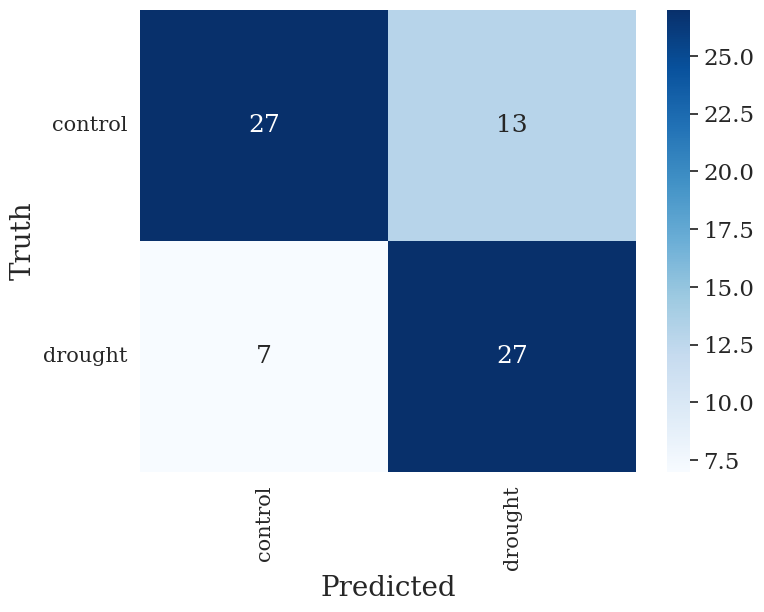

In [ ]:
# Create and fit the MLP model with best parameters
mlp = MLPClassifier(**rnd_search.best_params_, random_state=42)
mlp.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(mlp, X_train, y_train, cv=5)

# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')

print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

print('\n\n Test Set: \n\n')
y_test_pred = mlp.predict(X_test)

# print metrics
print("Test: Accuracy:", accuracy_score(y_test, y_test_pred))
print("Test: Recall:", recall_score(y_test, y_test_pred, pos_label='drought'))
print("Test: Precision:", precision_score(y_test, y_test_pred, pos_label='drought'))
print("Test: F1 Score:", f1_score(y_test, y_test_pred, pos_label='drought'))

###### Confusion matrix ######
# labels for confusion matrix:
unique_label = np.unique([y_test, y_test_pred])

# df of confusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])

plt.figure(figsize=(8,6))
sns.heatmap(cmtx, annot=True, fmt='d', annot_kws={"size": 18}, cmap="Blues")
plt.xlabel('Predicted', fontsize=20)
plt.ylabel('Truth', fontsize=20)
plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15, rotation=0)
plt.show()

## Feature importance Based ML

In [ ]:
important_df = pd.read_csv("/content/drive/MyDrive/LWP_Netanel/feature_importance.csv")
important_df

,402,415,437,453,471,475,508,550,570,583,...,884,911,926,948,957,973,988,English_name,treatment,spectral_date
0,0.045164,0.023595,0.024455,0.031595,0.035394,0.035766,0.039400,0.060341,0.059917,0.056291,...,0.236759,0.231844,0.226857,0.224508,0.226143,0.219061,0.219013,cypress,drought,2022-03-14
1,0.047686,0.022939,0.020764,0.025466,0.028135,0.028376,0.031089,0.049113,0.048718,0.046018,...,0.231208,0.229275,0.228504,0.228315,0.227710,0.222673,0.223066,cypress,drought,2022-03-14
2,0.051725,0.024182,0.018600,0.020949,0.021544,0.021377,0.022654,0.040223,0.038266,0.034869,...,0.145599,0.143349,0.141286,0.134210,0.134894,0.134403,0.135354,oak,drought,2022-03-14
3,0.062196,0.041287,0.038701,0.045286,0.047731,0.047842,0.051449,0.080592,0.078566,0.073241,...,0.279762,0.278420,0.276875,0.275804,0.275137,0.268456,0.267665,pine,drought,2022-03-14
4,0.040648,0.022117,0.019039,0.021580,0.022134,0.022060,0.023710,0.044840,0.042140,0.036963,...,0.251829,0.248910,0.246115,0.243206,0.241969,0.234615,0.233724,carob,drought,2022-03-14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
241,0.048544,0.023973,0.025815,0.029394,0.029727,0.029724,0.032932,0.058043,0.055138,0.048619,...,0.341843,0.348039,0.342762,0.346894,0.335776,0.333938,0.340165,pistacia,control,2023-02-13
242,0.026936,0.014638,0.017977,0.021510,0.022604,0.022704,0.025125,0.039937,0.038553,0.035581,...,0.189929,0.194997,0.184811,0.189713,0.185181,0.185199,0.188133,cypress,control,2023-02-13
243,0.039817,0.020232,0.021611,0.024966,0.025601,0.025610,0.028164,0.045365,0.043903,0.039972,...,0.249571,0.251967,0.246058,0.247218,0.239147,0.236201,0.240302,carob,control,2023-02-13
244,0.054281,0.036745,0.042966,0.049124,0.051387,0.051867,0.057031,0.093205,0.090754,0.082888,...,0.317808,0.308292,0.303065,0.309560,0.304544,0.303973,0.308368,pine,control,2023-02-13


In [ ]:
important_df = new_df

In [ ]:
# Define features and labels
X = important_df[important_df.columns[:-3]]

# X = (X- X.mean())/X.std()

# Encode "English_name"
label_encoder = LabelEncoder()
X["English_name_encoded"] = label_encoder.fit_transform(important_df["English_name"])

X['English_name'] = important_df['English_name'].values
X['spectral_date'] = important_df['spectral_date'].values


# Print the mapping of the encoded values
english_name_mapping = dict(zip(label_encoder.transform(label_encoder.classes_),label_encoder.classes_))

y = important_df['treatment']

# Split to train-test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# save date of test set for research later
test_species = X_test['English_name'].values
test_dates = X_test['spectral_date'].values

# drop from sets spectral_date column
X_train = X_train.drop(columns=['spectral_date']).drop(columns=['English_name'])
X_test = X_test.drop(columns=['spectral_date']).drop(columns=['English_name'])



X_train.shape,X_test.shape

<ipython-input-98-6c401f501b14>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["English_name_encoded"] = label_encoder.fit_transform(important_df["English_name"])
<ipython-input-98-6c401f501b14>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['English_name'] = important_df['English_name'].values


((172, 17), (74, 17))

### Logistic Regression

In [ ]:
param_distribs = {
    'penalty': ['l1', 'l2'],
    'C': reciprocal(1, 1000),
    'solver': ['liblinear', 'saga'],
    'tol': expon(scale=1e-4),
    'fit_intercept': [False, True],
    'intercept_scaling': expon(scale=1.0),
    'max_iter': [100, 200, 300, 400, 500]
}

logreg_clf = LogisticRegression()
rnd_search = RandomizedSearchCV(logreg_clf, param_distributions=param_distribs,
                                n_iter=100, cv=5, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=1.994916615063393, fi

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=14.89984747565824, fit_intercept=True, intercept_scaling=1.0862557985649803, max_iter=200, penalty=l2, solver=saga, tol=2.3312023188561704e-05; total time=   0.0s
[CV] END C=50.47786565710602, fit_intercept=False, intercept_scaling=3.4928071327362264, max_iter=200, penalty=l2, solver=saga, tol=5.027751757587391e-05; total time=   0.0s
[CV] END C=50.47786565710602, fit_intercept=False, intercept_scaling=3.4928071327362264, max_iter=200, penalty=l2, solver=saga, tol=5.027751757587391e-05; total time=   0.0s
[CV] END C=50.47786565710602, fit_intercept=False, intercept_scaling=3.4928071327362264, max_iter=200, penalty=l2, solver=saga, tol=5.027751757587391e-05; total time=   0.0s
[CV] END C=50.47786565710602, fit_intercept=False, intercept_scaling=3.4928071327362264, max_iter=200, penalty=l2, solver=saga, tol=5.027751757587391e-05; total time=   0.0s
[CV] END C=50.47786565710602, fit_intercept=False, intercept_scaling=3.4928071327362264, max_iter=200, penalty=l2, solver=saga, to

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.1s
[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.1s
[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.1s
[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.1s
[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.1s
[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.1s
[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.0s
[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.1s
[CV] END C=6.729728537157744, fit_intercept=False, intercept_scaling=1.6204835957747312, max_iter=100, penalty=l1, solver=liblinear, tol=5.506090617769176e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=6.729728537157744, fit_intercept=False, intercept_scaling=1.6204835957747312, max_iter=100, penalty=l1, solver=liblinear, tol=5.506090617769176e-05; total time=   0.0s
[CV] END C=6.729728537157744, fit_intercept=False, intercept_scaling=1.6204835957747312, max_iter=100, penalty=l1, solver=liblinear, tol=5.506090617769176e-05; total time=   0.0s
[CV] END C=6.729728537157744, fit_intercept=False, intercept_scaling=1.6204835957747312, max_iter=100, penalty=l1, solver=liblinear, tol=5.506090617769176e-05; total time=   0.0s
[CV] END C=6.729728537157744, fit_intercept=False, intercept_scaling=1.6204835957747312, max_iter=100, penalty=l1, solver=liblinear, tol=5.506090617769176e-05; total time=   0.0s
[CV] END C=15.298348658397893, fit_intercept=True, intercept_scaling=0.005537420375935475, max_iter=300, penalty=l1, solver=liblinear, tol=0.00012425125189400213; total time=   0.0s
[CV] END C=15.298348658397893, fit_intercept=True, intercept_scaling=0.005537420375935475, max_iter=30

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=234.7073130303151, fit_intercept=False, intercept_scaling=0.07692926551379635, max_iter=200, penalty=l1, solver=saga, tol=0.00019885295716582228; total time=   0.0s
[CV] END C=234.7073130303151, fit_intercept=False, intercept_scaling=0.07692926551379635, max_iter=200, penalty=l1, solver=saga, tol=0.00019885295716582228; total time=   0.1s
[CV] END C=234.7073130303151, fit_intercept=False, intercept_scaling=0.07692926551379635, max_iter=200, penalty=l1, solver=saga, tol=0.00019885295716582228; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.1s
[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.1s
[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.1s
[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   2.3s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   2.3s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   1.7s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   3.0s
[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.1s
[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.0s
[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.1s
[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.1s
[CV] END C=1.242474708366019, fit_intercept=False, intercept_scaling=0.6450624521653773, max_iter=500, penalty=l2, solver=saga, tol=0.00023812655298459756; total time=   0.0s
[CV] END C=1.242474708366019, fit_intercept=False, intercept_scaling=0.6450624521653773, max_iter=500, penalty=l2, solver=saga, tol=0.00023812655298459756; total time=   0.0s
[CV] END C=1.242474708366019, fit_intercept=False, intercept_scaling=0.6450624521653773, max_iter=500, penalty=l2, solver=saga, tol=0.00023812655298459756; total time=   0.0s
[CV] END C=1.242474708366019, fit_intercept=False, intercept_scaling=0.6450624521653773, max_iter=500, penalty=l2, solver

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=7.400385759087372, fit_intercept=True, intercept_scaling=2.124169814240007, max_iter=200, penalty=l1, solver=saga, tol=0.0001003494190520531; total time=   0.1s
[CV] END C=7.400385759087372, fit_intercept=True, intercept_scaling=2.124169814240007, max_iter=200, penalty=l1, solver=saga, tol=0.0001003494190520531; total time=   0.1s
[CV] END C=7.400385759087372, fit_intercept=True, intercept_scaling=2.124169814240007, max_iter=200, penalty=l1, solver=saga, tol=0.0001003494190520531; total time=   0.1s
[CV] END C=7.400385759087372, fit_intercept=True, intercept_scaling=2.124169814240007, max_iter=200, penalty=l1, solver=saga, tol=0.0001003494190520531; total time=   0.1s
[CV] END C=7.400385759087372, fit_intercept=True, intercept_scaling=2.124169814240007, max_iter=200, penalty=l1, solver=saga, tol=0.0001003494190520531; total time=   0.1s
[CV] END C=411.5113049561089, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.750999

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=411.5113049561089, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.1s
[CV] END C=411.5113049561089, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=411.5113049561089, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.1s
[CV] END C=411.5113049561089, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   1.6s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   0.8s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.0s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.0s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.0s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.0s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=sag

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=128.5454996487901, fit_intercept=False, intercept_scaling=0.06709351259978942, max_iter=200, penalty=l2, solver=saga, tol=2.900612949922053e-05; total time=   0.1s
[CV] END C=128.5454996487901, fit_intercept=False, intercept_scaling=0.06709351259978942, max_iter=200, penalty=l2, solver=saga, tol=2.900612949922053e-05; total time=   0.0s
[CV] END C=128.5454996487901, fit_intercept=False, intercept_scaling=0.06709351259978942, max_iter=200, penalty=l2, solver=saga, tol=2.900612949922053e-05; total time=   0.0s
[CV] END C=31.027409509128386, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   0.0s
[CV] END C=31.027409509128386, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=31.027409509128386, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   0.1s
[CV] END C=31.027409509128386, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   0.1s
[CV] END C=31.027409509128386, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   0.1s
[CV] END C=17.104525858990527, fit_intercept=False, intercept_scaling=0.32662592101036936, max_iter=100, penalty=l1, solver=liblinear, tol=0.0001141641252863987; total time=   0.1s
[CV] END C=17.104525858990527, fit_intercept=False, intercept_scaling=0.32662592101036936, max_iter=100, penalty=l1, solver=liblinear, tol=0.0001141641252863987; total time=   0.1s
[CV] END C=17.104525858990527, fit_intercept=False, intercept_scaling=0.32662592101036936, max_

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.1s
[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.2s
[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.1s
[CV] END C=375.90353898082674, fit_intercept=True, intercept_scaling=1.1318517342673489, max_iter=300, penalty=l2, solver=liblinear, tol=0.00016581085759775227; total time=   0.0s
[CV] END C=375.90353898082674, fit_intercept=True, intercept_scaling=1.1318517342673489, max_iter=300, penalty=l2, solver=liblinear, tol=0.00016581085759775227; total time=   0.0s
[CV] END C=375.90353898082674, fit_intercept=True, intercept_scaling=1.1318517342673489, max_iter=300, penalty=l2, solver=liblinear, tol=0.00016581085759775227; total time=   0.0s
[CV] END C=375.90353898082674, fit_intercept=True, intercept_scaling=1.1318517342673489, max_iter=300, penalty=l2, solver=liblinear, tol=0.00016581085759775227; total time=   0.0s
[CV] END C=375.90353898082674, fit_intercept=True, intercept_scaling=1.1318517342673489, max_iter=300, pena

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=11.117265099859653, fit_intercept=False, intercept_scaling=0.19160422253913376, max_iter=100, penalty=l2, solver=saga, tol=7.292954276719257e-05; total time=   0.1s
[CV] END C=11.117265099859653, fit_intercept=False, intercept_scaling=0.19160422253913376, max_iter=100, penalty=l2, solver=saga, tol=7.292954276719257e-05; total time=   0.0s
[CV] END C=11.117265099859653, fit_intercept=False, intercept_scaling=0.19160422253913376, max_iter=100, penalty=l2, solver=saga, tol=7.292954276719257e-05; total time=   0.0s
[CV] END C=11.117265099859653, fit_intercept=False, intercept_scaling=0.19160422253913376, max_iter=100, penalty=l2, solver=saga, tol=7.292954276719257e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=11.117265099859653, fit_intercept=False, intercept_scaling=0.19160422253913376, max_iter=100, penalty=l2, solver=saga, tol=7.292954276719257e-05; total time=   0.1s
[CV] END C=325.93448872393685, fit_intercept=False, intercept_scaling=0.41713243399517175, max_iter=100, penalty=l2, solver=liblinear, tol=7.796815233359066e-05; total time=   0.0s
[CV] END C=325.93448872393685, fit_intercept=False, intercept_scaling=0.41713243399517175, max_iter=100, penalty=l2, solver=liblinear, tol=7.796815233359066e-05; total time=   0.0s
[CV] END C=325.93448872393685, fit_intercept=False, intercept_scaling=0.41713243399517175, max_iter=100, penalty=l2, solver=liblinear, tol=7.796815233359066e-05; total time=   0.0s
[CV] END C=325.93448872393685, fit_intercept=False, intercept_scaling=0.41713243399517175, max_iter=100, penalty=l2, solver=liblinear, tol=7.796815233359066e-05; total time=   0.0s
[CV] END C=325.93448872393685, fit_intercept=False, intercept_scaling=0.41713243399517175, max_iter=

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=3.6823182895763615, fit_intercept=False, intercept_scaling=0.42956761581164393, max_iter=300, penalty=l2, solver=saga, tol=5.1836753784026384e-05; total time=   0.0s
[CV] END C=460.5855368582789, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.1s
[CV] END C=460.5855368582789, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.1s
[CV] END C=460.5855368582789, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=460.5855368582789, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.1s
[CV] END C=460.5855368582789, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.0s
[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol=1.7531581610419906e-05; total time=   0.0s
[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol=1.7531581610419906e-05; total time=   0.0s
[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol=1.7531581610419906e-05; total time=   0.0s
[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=44.27936336500086, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=44.27936336500086, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.2s
[CV] END C=44.27936336500086, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=44.27936336500086, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.2s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.1s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.1s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.0s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.0s
[CV] END C=1.9099601385505387, fit_intercept=False, intercept_scaling=1.0115156153275293, max_iter=500, penalty=l1, solver=saga, tol=0.000236551198250572; total time=   0.0s
[CV] END C=1.9099601385505387, fit_intercept=False, intercept_scaling=1.0115156153275293, max_iter=500, penalty=l1, solver=saga, tol=0.000236551198250572; total time=   0.0s
[CV] END C=1.9099601385505387, fit_intercept=False, intercept_scaling=1.0115156153275293, max_iter=500, penalty=l1, solver=saga, tol=0.000236551198250572; total time=   0.0s
[CV] END C=1.9099601385505387, fit_intercept=False, intercept_scaling=1.0115156153275293, max_iter=500, penalty=l1, solver=saga, tol=0.000236551198250572; total time=   0.0s
[CV] END C=1.9099601385505387, fit_intercept=False, intercept_scaling=1.0115156153275293, max_iter=500, penalty=l1, solver=saga, 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=963.0559802166861, fit_intercept=True, intercept_scaling=3.0775624127880232, max_iter=500, penalty=l2, solver=liblinear, tol=0.000137721083711214; total time=   0.0s
[CV] END C=963.0559802166861, fit_intercept=True, intercept_scaling=3.0775624127880232, max_iter=500, penalty=l2, solver=liblinear, tol=0.000137721083711214; total time=   0.0s
[CV] END C=963.0559802166861, fit_intercept=True, intercept_scaling=3.0775624127880232, max_iter=500, penalty=l2, solver=liblinear, tol=0.000137721083711214; total time=   0.0s
[CV] END C=963.0559802166861, fit_intercept=True, intercept_scaling=3.0775624127880232, max_iter=500, penalty=l2, solver=liblinear, tol=0.000137721083711214; total time=   0.0s
[CV] END C=963.0559802166861, fit_intercept=True, intercept_scaling=3.0775624127880232, max_iter=500, penalty=l2, solver=liblinear, tol=0.000137721083711214; total time=   0.0s
[CV] END C=723.1286044841387, fit_intercept=False, intercept_scaling=0.5589382770530613, max_iter=500, penalty=l1, 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=46.817022250358995, fit_intercept=False, intercept_scaling=1.8592664926604465, max_iter=300, penalty=l2, solver=saga, tol=1.0222819734932289e-05; total time=   0.0s
[CV] END C=69.98769331752378, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, tol=3.894206578010433e-05; total time=   0.0s
[CV] END C=69.98769331752378, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, tol=3.894206578010433e-05; total time=   0.0s
[CV] END C=69.98769331752378, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, tol=3.894206578010433e-05; total time=   0.0s
[CV] END C=69.98769331752378, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, tol=3.894206578010433e-05; total time=   0.0s
[CV] END C=69.98769331752378, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=351.5680375645844, fit_intercept=False, intercept_scaling=1.21228755622449, max_iter=500, penalty=l2, solver=liblinear, tol=5.443494130895386e-05; total time=   0.0s
[CV] END C=351.5680375645844, fit_intercept=False, intercept_scaling=1.21228755622449, max_iter=500, penalty=l2, solver=liblinear, tol=5.443494130895386e-05; total time=   0.0s
[CV] END C=351.5680375645844, fit_intercept=False, intercept_scaling=1.21228755622449, max_iter=500, penalty=l2, solver=liblinear, tol=5.443494130895386e-05; total time=   0.0s
[CV] END C=5.869766574033025, fit_intercept=True, intercept_scaling=2.4446159618366363, max_iter=200, penalty=l1, solver=liblinear, tol=9.885776341980908e-05; total time=   0.0s
[CV] END C=5.869766574033025, fit_intercept=True, intercept_scaling=2.4446159618366363, max_iter=200, penalty=l1, solver=liblinear, tol=9.885776341980908e-05; total time=   0.0s
[CV] END C=5.869766574033025, fit_intercept=True, intercept_scaling=2.4446159618366363, max_iter=200, penalty=l1,

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=54.524875992411665, fit_intercept=True, intercept_scaling=0.8634140266094347, max_iter=300, penalty=l1, solver=saga, tol=7.82294585687126e-05; total time=   0.0s
[CV] END C=54.524875992411665, fit_intercept=True, intercept_scaling=0.8634140266094347, max_iter=300, penalty=l1, solver=saga, tol=7.82294585687126e-05; total time=   0.1s
[CV] END C=54.524875992411665, fit_intercept=True, intercept_scaling=0.8634140266094347, max_iter=300, penalty=l1, solver=saga, tol=7.82294585687126e-05; total time=   0.0s
[CV] END C=54.524875992411665, fit_intercept=True, intercept_scaling=0.8634140266094347, max_iter=300, penalty=l1, solver=saga, tol=7.82294585687126e-05; total time=   0.0s
[CV] END C=7.238086291181392, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.00017293513695381362; total time=   0.0s
[CV] END C=7.238086291181392, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.0

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=7.238086291181392, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.00017293513695381362; total time=   0.0s
[CV] END C=7.238086291181392, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.00017293513695381362; total time=   0.0s
[CV] END C=12.038487446822948, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, tol=0.00033596283814742904; total time=   0.0s
[CV] END C=12.038487446822948, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, tol=0.00033596283814742904; total time=   0.0s
[CV] END C=12.038487446822948, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, tol=0.00033596283814742904; total time=   0.0s
[CV] END C=12.038487446822948, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=s

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=15.720367857375772, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=15.720367857375772, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=15.720367857375772, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=15.720367857375772, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=15.720367857375772, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=322.0626495993123, fit_intercept=False, intercept_scaling=1.1663556221844276, max_iter=100, penalty=l2, solve

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=322.0626495993123, fit_intercept=False, intercept_scaling=1.1663556221844276, max_iter=100, penalty=l2, solver=saga, tol=1.7012074157285414e-05; total time=   0.0s
[CV] END C=5.632856590781125, fit_intercept=True, intercept_scaling=0.09857612629574013, max_iter=100, penalty=l2, solver=liblinear, tol=3.28412261388996e-05; total time=   0.0s
[CV] END C=5.632856590781125, fit_intercept=True, intercept_scaling=0.09857612629574013, max_iter=100, penalty=l2, solver=liblinear, tol=3.28412261388996e-05; total time=   0.0s
[CV] END C=5.632856590781125, fit_intercept=True, intercept_scaling=0.09857612629574013, max_iter=100, penalty=l2, solver=liblinear, tol=3.28412261388996e-05; total time=   0.0s
[CV] END C=5.632856590781125, fit_intercept=True, intercept_scaling=0.09857612629574013, max_iter=100, penalty=l2, solver=liblinear, tol=3.28412261388996e-05; total time=   0.0s
[CV] END C=5.632856590781125, fit_intercept=True, intercept_scaling=0.09857612629574013, max_iter=100, penalty=l2

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, tol=1.731006019256496e-06; total time=   0.1s
[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, tol=1.731006019256496e-06; total time=   0.1s
[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, tol=1.731006019256496e-06; total time=   0.1s
[CV] END C=195.02633930329975, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga, tol=0.0001049175712447296; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=195.02633930329975, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga, tol=0.0001049175712447296; total time=   0.0s
[CV] END C=195.02633930329975, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga, tol=0.0001049175712447296; total time=   0.0s
[CV] END C=195.02633930329975, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga, tol=0.0001049175712447296; total time=   0.0s
[CV] END C=195.02633930329975, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga, tol=0.0001049175712447296; total time=   0.0s
[CV] END C=1.393723980460675, fit_intercept=True, intercept_scaling=1.008114536040912, max_iter=200, penalty=l2, solver=liblinear, tol=1.542286357518888e-06; total time=   0.0s
[CV] END C=1.393723980460675, fit_intercept=True, intercept_scaling=1.008114536040912, max_iter=200, penalty=l2, solver=lib

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=631.4063194652971, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.1s
[CV] END C=631.4063194652971, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.1s
[CV] END C=631.4063194652971, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=631.4063194652971, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.1s
[CV] END C=631.4063194652971, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.1s
[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.1s
[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.1s
[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.1s
[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.1s
[CV] END C=52.49296753461721, fit_intercept=False, intercept_scaling=0.6129559740510913, max_iter=300, penalty=l1, solver=liblinear, tol=9.833381846878036e-05; total time=   0.1s
[CV] END C=52.49296753461721, fit_intercept=False, intercept_scaling=0.6129559740510913, max_iter=300, penalty=l1, solver

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=289.2547712197909, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalty=l1, solver=liblinear, tol=2.415482837490208e-05; total time=   1.6s
[CV] END C=289.2547712197909, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalty=l1, solver=liblinear, tol=2.415482837490208e-05; total time=   2.3s
[CV] END C=13.544945118140927, fit_intercept=False, intercept_scaling=0.09920501165575414, max_iter=300, penalty=l1, solver=liblinear, tol=0.00010663076539900722; total time=   0.0s
[CV] END C=13.544945118140927, fit_intercept=False, intercept_scaling=0.09920501165575414, max_iter=300, penalty=l1, solver=liblinear, tol=0.00010663076539900722; total time=   0.0s
[CV] END C=13.544945118140927, fit_intercept=False, intercept_scaling=0.09920501165575414, max_iter=300, penalty=l1, solver=liblinear, tol=0.00010663076539900722; total time=   0.0s
[CV] END C=13.544945118140927, fit_intercept=False, intercept_scaling=0.09920501165575414, max_iter=

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=119.85911759153473, fit_intercept=True, intercept_scaling=0.9913991764332203, max_iter=500, penalty=l2, solver=saga, tol=5.411921065387352e-05; total time=   0.0s
[CV] END C=119.85911759153473, fit_intercept=True, intercept_scaling=0.9913991764332203, max_iter=500, penalty=l2, solver=saga, tol=5.411921065387352e-05; total time=   0.0s
[CV] END C=799.3586052037715, fit_intercept=True, intercept_scaling=0.19533329604044697, max_iter=100, penalty=l2, solver=saga, tol=8.578439510282167e-05; total time=   0.0s
[CV] END C=799.3586052037715, fit_intercept=True, intercept_scaling=0.19533329604044697, max_iter=100, penalty=l2, solver=saga, tol=8.578439510282167e-05; total time=   0.0s
[CV] END C=799.3586052037715, fit_intercept=True, intercept_scaling=0.19533329604044697, max_iter=100, penalty=l2, solver=saga, tol=8.578439510282167e-05; total time=   0.0s
[CV] END C=799.3586052037715, fit_intercept=True, intercept_scaling=0.19533329604044697, max_iter=100, penalty=l2, solver=saga, to

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=156.6546410800757, fit_intercept=True, intercept_scaling=0.4652439119617327, max_iter=500, penalty=l2, solver=liblinear, tol=0.000113894933798157; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=saga, tol=6.862931048605623e-05; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=saga, tol=6.862931048605623e-05; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=saga, tol=6.862931048605623e-05; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=saga, tol=6.862931048605623e-05; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, so

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=14.752113960427668, fit_intercept=False, intercept_scaling=2.258790514545926, max_iter=100, penalty=l2, solver=saga, tol=0.00031830622769002376; total time=   0.0s
[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.1s
[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.0s
[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.1s
[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.0s
[CV] END C=22.148104601284686, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, penalty=l1, solver=liblinear, tol=0.00013958378736630774; total time=   0.0s
[CV] END C=22.148104601284686, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, penalty=l1, solver=liblinear, tol=0.00013958378736630774; total time=   0.1s
[CV] END C=22.148104601284686, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, penalty=l1, solver=liblinear, tol=0.00013958378736630774; total time=   0.0s
[CV] END C=22.148104601284686, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, pen

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=236.99388000283327, fit_intercept=False, intercept_scaling=0.12043422422269756, max_iter=500, penalty=l2, solver=saga, tol=5.92817064487378e-06; total time=   0.0s
[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   0.1s
[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   0.1s
[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   0.2s
[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   0.1s
[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, pe

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=2.685190154647807, fit_intercept=True, intercept_scaling=1.8137834722862145, max_iter=100, penalty=l1, solver=saga, tol=8.785552166860508e-06; total time=   0.0s
[CV] END C=2.685190154647807, fit_intercept=True, intercept_scaling=1.8137834722862145, max_iter=100, penalty=l1, solver=saga, tol=8.785552166860508e-06; total time=   0.0s
[CV] END C=2.685190154647807, fit_intercept=True, intercept_scaling=1.8137834722862145, max_iter=100, penalty=l1, solver=saga, tol=8.785552166860508e-06; total time=   0.0s
[CV] END C=2.685190154647807, fit_intercept=True, intercept_scaling=1.8137834722862145, max_iter=100, penalty=l1, solver=saga, tol=8.785552166860508e-06; total time=   0.0s
[CV] END C=126.73815903184186, fit_intercept=True, intercept_scaling=0.5052604745654999, max_iter=300, penalty=l2, solver=saga, tol=8.484875058031207e-06; total time=   0.0s
[CV] END C=126.73815903184186, fit_intercept=True, intercept_scaling=0.5052604745654999, max_iter=300, penalty=l2, solver=saga, tol=8.

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=126.73815903184186, fit_intercept=True, intercept_scaling=0.5052604745654999, max_iter=300, penalty=l2, solver=saga, tol=8.484875058031207e-06; total time=   0.0s
[CV] END C=126.73815903184186, fit_intercept=True, intercept_scaling=0.5052604745654999, max_iter=300, penalty=l2, solver=saga, tol=8.484875058031207e-06; total time=   0.0s
[CV] END C=1.7968554542843702, fit_intercept=False, intercept_scaling=0.8706135442465718, max_iter=500, penalty=l1, solver=saga, tol=0.0001675575403282677; total time=   0.0s
[CV] END C=1.7968554542843702, fit_intercept=False, intercept_scaling=0.8706135442465718, max_iter=500, penalty=l1, solver=saga, tol=0.0001675575403282677; total time=   0.0s
[CV] END C=1.7968554542843702, fit_intercept=False, intercept_scaling=0.8706135442465718, max_iter=500, penalty=l1, solver=saga, tol=0.0001675575403282677; total time=   0.0s
[CV] END C=1.7968554542843702, fit_intercept=False, intercept_scaling=0.8706135442465718, max_iter=500, penalty=l1, solver=saga

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=694.6175184647423, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=saga, tol=8.719399369795727e-06; total time=   0.1s
[CV] END C=694.6175184647423, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=saga, tol=8.719399369795727e-06; total time=   0.0s
[CV] END C=694.6175184647423, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=saga, tol=8.719399369795727e-06; total time=   0.0s
[CV] END C=214.5066437415383, fit_intercept=True, intercept_scaling=1.2210659442092298, max_iter=200, penalty=l2, solver=liblinear, tol=1.1788020797188026e-05; total time=   0.0s
[CV] END C=214.5066437415383, fit_intercept=True, intercept_scaling=1.2210659442092298, max_iter=200, penalty=l2, solver=liblinear, tol=1.1788020797188026e-05; total time=   0.0s
[CV] END C=214.5066437415383, fit_intercept=True, intercept_scaling=1.2210659442092298, max_iter=200, penalty=l2, solver

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=30.0521337382307, fit_intercept=False, intercept_scaling=0.5195335727772361, max_iter=200, penalty=l2, solver=saga, tol=0.0001457553454729091; total time=   0.0s
[CV] END C=30.0521337382307, fit_intercept=False, intercept_scaling=0.5195335727772361, max_iter=200, penalty=l2, solver=saga, tol=0.0001457553454729091; total time=   0.0s
[CV] END C=30.0521337382307, fit_intercept=False, intercept_scaling=0.5195335727772361, max_iter=200, penalty=l2, solver=saga, tol=0.0001457553454729091; total time=   0.0s
[CV] END C=294.0160614626455, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.0s
[CV] END C=294.0160614626455, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=294.0160614626455, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.1s
[CV] END C=294.0160614626455, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.0s
[CV] END C=294.0160614626455, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.0s
[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.0s
[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.0s
[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.0s
[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.0s
[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.1s
[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.1s
[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.1s
[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=45.87360314978283, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, tol=3.488399277677909e-05; total time=   0.0s
[CV] END C=45.87360314978283, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, tol=3.488399277677909e-05; total time=   0.0s
[CV] END C=45.87360314978283, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, tol=3.488399277677909e-05; total time=   0.0s
[CV] END C=45.87360314978283, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, tol=3.488399277677909e-05; total time=   0.0s
[CV] END C=45.87360314978283, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, tol=3.488399277677909e-05; total time=   0.0s
[CV] END C=971.6148079839163, fit_intercept=True, intercept_scaling=0.8778258618057556, max_iter=100, penalty=l1, solver=saga, tol

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=971.6148079839163, fit_intercept=True, intercept_scaling=0.8778258618057556, max_iter=100, penalty=l1, solver=saga, tol=0.0003186951071461003; total time=   0.0s
[CV] END C=1.4913916020557285, fit_intercept=True, intercept_scaling=0.60817526195962, max_iter=400, penalty=l1, solver=saga, tol=1.8594399458125908e-05; total time=   0.0s
[CV] END C=1.4913916020557285, fit_intercept=True, intercept_scaling=0.60817526195962, max_iter=400, penalty=l1, solver=saga, tol=1.8594399458125908e-05; total time=   0.0s
[CV] END C=1.4913916020557285, fit_intercept=True, intercept_scaling=0.60817526195962, max_iter=400, penalty=l1, solver=saga, tol=1.8594399458125908e-05; total time=   0.1s
[CV] END C=1.4913916020557285, fit_intercept=True, intercept_scaling=0.60817526195962, max_iter=400, penalty=l1, solver=saga, tol=1.8594399458125908e-05; total time=   0.1s
[CV] END C=1.4913916020557285, fit_intercept=True, intercept_scaling=0.60817526195962, max_iter=400, penalty=l1, solver=saga, tol=1.859

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=87.20574266688077, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.0s
[CV] END C=87.20574266688077, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.1s
[CV] END C=6.023509346536343, fit_intercept=False, intercept_scaling=1.1978638819127894, max_iter=100, penalty=l1, solver=liblinear, tol=5.296801261573896e-05; total time=   0.0s
[CV] END C=6.023509346536343, fit_intercept=False, intercept_scaling=1.1978638819127894, max_iter=100, penalty=l1, solver=liblinear, tol=5.296801261573896e-05; total time=   0.0s
[CV] END C=6.023509346536343, fit_intercept=False, intercept_scaling=1.1978638819127894, max_iter=100, penalty=l1, solver=liblinear, tol=5.296801261573896e-05; total time=   0.0s
[CV] END C=6.023509346536343, fit_intercept=False, intercept_scaling=1.1978638819127894, max_iter=100, penalty=l1, 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.1s
[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.1s
[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.1s
[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.1s
[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.0s
[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.1s
[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.1s
[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.1s
[CV] END C=1.3666459236837378, fit_intercept=False, intercept_scaling=0.5297623242801334, max_iter=100, penalty=l2, solver=saga, tol=0.0004218959300831557; total time=   0.0s
[CV] END C=1.3666459236837378, fit_intercept=False, intercept_scaling=0.5297623242801334, max_iter=100, penalty=l2, solver=saga, tol=0.0004218959300831557; total time=   0.0s
[CV] END C=1.3666459236837378, fit_intercept=False, intercept_scaling=0.5297623242801334, max_iter=100, penalty=l2, solver=saga,

In [ ]:
# Create the Logistic Regression model with the best parameters from the randomized search
logreg = LogisticRegression(**rnd_search.best_params_)

# Fit the model to the training data
logreg.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(logreg, X_train, y_train, cv=5)

# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')


print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Recall: 0.7816091954022989
Precision: 0.8607594936708861
F1 Score: 0.8192771084337349


Test: Accuracy: 0.7837837837837838
Test: Precision: 0.8 
Test: Recall: 0.7058823529411765 
Test: F1 Score: 0.7500000000000001


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

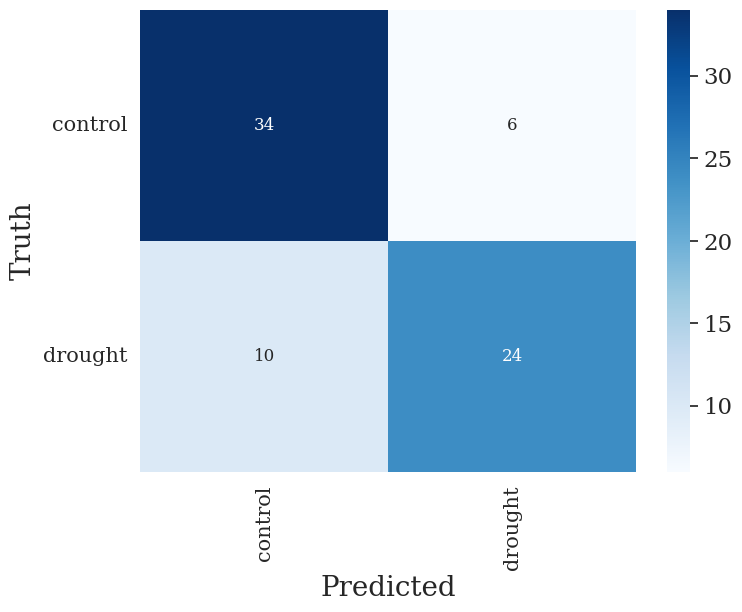

In [ ]:
y_test_pred = logreg.predict(X_test)

print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Precision:",precision_score(y_test, y_test_pred, pos_label='drought')
      ,"\nTest: Recall:",recall_score(y_test, y_test_pred, pos_label='drought')
      ,"\nTest: F1 Score:",f1_score(y_test, y_test_pred, pos_label='drought'))

###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 12},cmap="Blues")
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)

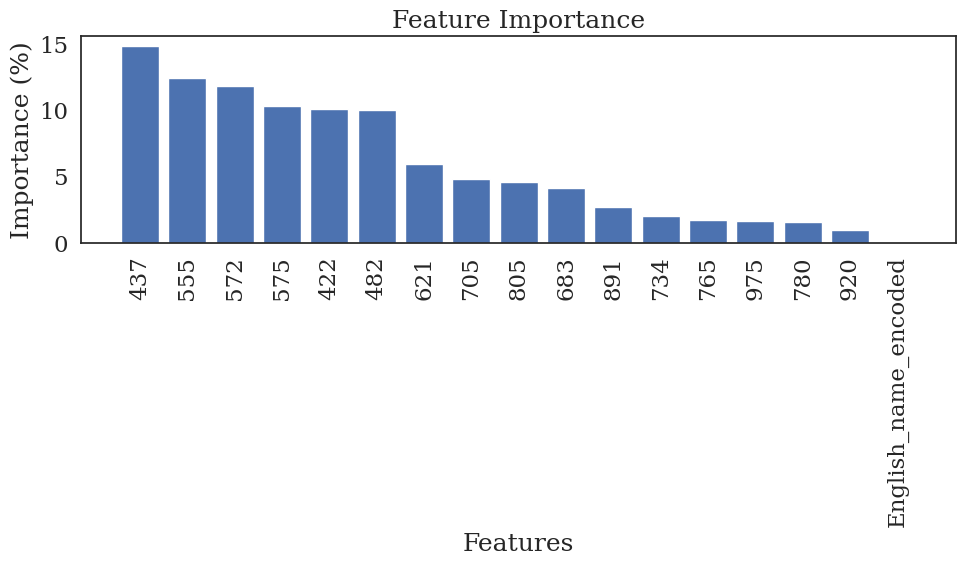

In [ ]:
# Fit the model to the training data
logreg.fit(X_train, y_train)

# Get the coefficients of the model
coefficients = logreg.coef_[0]

# Calculate the absolute feature importance
feature_importance = np.abs(coefficients)

# Calculate the percentage of each feature importance
total_importance = np.sum(feature_importance)
percentage_importance = (feature_importance / total_importance) * 100

# Sort the feature importance in descending order
sorted_idx = np.argsort(percentage_importance)[::-1]

# Get the names of the features
feature_names = X_train.columns

# Plot the feature importance
plt.figure(figsize=(10, 6))
plt.bar(range(len(percentage_importance)), percentage_importance[sorted_idx], align='center')
plt.xticks(range(len(percentage_importance)), feature_names[sorted_idx], rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance (%)')
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

#### Reduce to 15 bands

In [ ]:
# Create a mask to filter the columns with importance greater than 0.1%
mask = percentage_importance > 2

# Get the names of the features that meet the importance threshold
selected_features = X_train.columns[mask]

# Create a new DataFrame with the selected features
new_df = df[selected_features].copy()

# Nםormalize
# new_df = new_df.apply(lambda row: (row - row.min()) / (row.max() - row.min()), axis=1)

# Print the new DataFrame
new_df

,422,437,482,555,572,575,621,683,705,734,805,891
0,0.019893,0.024455,0.035987,0.061217,0.059309,0.058652,0.050144,0.036692,0.075632,0.175720,0.225985,0.237316
15,0.017948,0.020764,0.028539,0.049718,0.048221,0.047684,0.042537,0.033969,0.064906,0.163319,0.218211,0.232447
14,0.018276,0.018600,0.021049,0.040514,0.037678,0.037050,0.029878,0.021470,0.045062,0.106802,0.137346,0.146230
12,0.035401,0.038701,0.047747,0.081364,0.077631,0.076643,0.066466,0.053528,0.095841,0.207104,0.262009,0.281426
11,0.017679,0.019039,0.021860,0.045315,0.041219,0.040256,0.030411,0.021284,0.057093,0.176019,0.239873,0.252956
...,...,...,...,...,...,...,...,...,...,...,...,...
220,0.022690,0.025815,0.029790,0.058587,0.054045,0.052843,0.041909,0.034965,0.081584,0.239103,0.320953,0.339982
219,0.014326,0.017977,0.022879,0.040435,0.038093,0.037615,0.030668,0.023257,0.052914,0.136523,0.182278,0.188110
244,0.018285,0.021611,0.025630,0.045794,0.043256,0.042529,0.035260,0.028379,0.061511,0.171374,0.238109,0.247745
231,0.035362,0.042966,0.052033,0.094780,0.089378,0.088002,0.073673,0.058557,0.117766,0.243357,0.301181,0.315694


In [ ]:
new_df['spectral_date'] = important_df['spectral_date'].values
new_df['English_name'] = important_df['English_name'].values
new_df.columns

Index(['422', '437', '482', '555', '572', '575', '621', '683', '705', '734',
       '805', '891', 'spectral_date', 'English_name'],
      dtype='object')

In [ ]:
# Define features and labels
X = new_df
y = important_df['treatment']

# Split to train-test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

test_species = X_test['English_name'].values
test_dates = X_test['spectral_date'].values

X_train, X_test = X_train.drop(columns = ['spectral_date']).drop(columns = ['English_name']), X_test.drop(columns = ['spectral_date']).drop(columns = ['English_name'])

X_train.shape,X_test.shape

((172, 12), (74, 12))

In [ ]:
param_distribs = {
    'penalty': ['l1', 'l2'],
    'C': reciprocal(1, 1000),
    'solver': ['liblinear', 'saga'],
    'tol': expon(scale=1e-4),
    'fit_intercept': [False, True],
    'intercept_scaling': expon(scale=1.0),
    'max_iter': [100, 200, 300, 400, 500]
}

logreg_clf = LogisticRegression()
rnd_search = RandomizedSearchCV(logreg_clf, param_distributions=param_distribs,
                                n_iter=100, cv=5, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=1.994916615063393, fi

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.0s
[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.0s
[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.0s
[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.0s
[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.0s
[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, to

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=15.298348658397893, fit_intercept=True, intercept_scaling=0.005537420375935475, max_iter=300, penalty=l1, solver=liblinear, tol=0.00012425125189400213; total time=   0.0s
[CV] END C=15.298348658397893, fit_intercept=True, intercept_scaling=0.005537420375935475, max_iter=300, penalty=l1, solver=liblinear, tol=0.00012425125189400213; total time=   0.0s
[CV] END C=15.298348658397893, fit_intercept=True, intercept_scaling=0.005537420375935475, max_iter=300, penalty=l1, solver=liblinear, tol=0.00012425125189400213; total time=   0.0s
[CV] END C=15.298348658397893, fit_intercept=True, intercept_scaling=0.005537420375935475, max_iter=300, penalty=l1, solver=liblinear, tol=0.00012425125189400213; total time=   0.0s
[CV] END C=15.298348658397893, fit_intercept=True, intercept_scaling=0.005537420375935475, max_iter=300, penalty=l1, solver=liblinear, tol=0.00012425125189400213; total time=   0.0s
[CV] END C=234.7073130303151, fit_intercept=False, intercept_scaling=0.07692926551379635, 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.1s
[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.0s
[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.0s
[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.0s
[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   0.8s
[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means 

[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   0.8s
[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.0s
[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.0s
[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.0s
[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.0s
[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   0.3s
[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   0.2s
[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means 

[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   0.1s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.0s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.0s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.0s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.0s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=sag

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.0s
[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.0s
[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.0s
[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.0s
[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.0s
[CV] END C=375.90353898082674, fit_intercept=True, intercept_scaling=1.1318517342673489, max_iter=300, penalty=l2, solver=liblinear, to

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=460.5855368582789, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.0s
[CV] END C=460.5855368582789, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.0s
[CV] END C=460.5855368582789, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.0s
[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol=1.7531581610419906e-05; total time=   0.0s
[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol=1.7531581610419906e-05; total time=   0.0s
[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=44.27936336500086, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.0s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.0s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.0s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.0s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.0s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=4.904060335291481, fit_intercept=True, intercept_scaling=0.32957736836626295, max_iter=300, penalty=l2, solver=liblinear, tol=4.4582987105486325e-06; total time=   0.0s
[CV] END C=4.904060335291481, fit_intercept=True, intercept_scaling=0.32957736836626295, max_iter=300, penalty=l2, solver=liblinear, tol=4.4582987105486325e-06; total time=   0.0s
[CV] END C=4.904060335291481, fit_intercept=True, intercept_scaling=0.32957736836626295, max_iter=300, penalty=l2, solver=liblinear, tol=4.4582987105486325e-06; total time=   0.0s
[CV] END C=4.904060335291481, fit_intercept=True, intercept_scaling=0.32957736836626295, max_iter=300, penalty=l2, solver=liblinear, tol=4.4582987105486325e-06; total time=   0.0s
[CV] END C=963.0559802166861, fit_intercept=True, intercept_scaling=3.0775624127880232, max_iter=500, penalty=l2, solver=liblinear, tol=0.000137721083711214; total time=   0.0s
[CV] END C=963.0559802166861, fit_intercept=True, intercept_scaling=3.0775624127880232, max_iter=500, p

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=351.5680375645844, fit_intercept=False, intercept_scaling=1.21228755622449, max_iter=500, penalty=l2, solver=liblinear, tol=5.443494130895386e-05; total time=   0.0s
[CV] END C=351.5680375645844, fit_intercept=False, intercept_scaling=1.21228755622449, max_iter=500, penalty=l2, solver=liblinear, tol=5.443494130895386e-05; total time=   0.0s
[CV] END C=351.5680375645844, fit_intercept=False, intercept_scaling=1.21228755622449, max_iter=500, penalty=l2, solver=liblinear, tol=5.443494130895386e-05; total time=   0.0s
[CV] END C=351.5680375645844, fit_intercept=False, intercept_scaling=1.21228755622449, max_iter=500, penalty=l2, solver=liblinear, tol=5.443494130895386e-05; total time=   0.0s
[CV] END C=5.869766574033025, fit_intercept=True, intercept_scaling=2.4446159618366363, max_iter=200, penalty=l1, solver=liblinear, tol=9.885776341980908e-05; total time=   0.0s
[CV] END C=5.869766574033025, fit_intercept=True, intercept_scaling=2.4446159618366363, max_iter=200, penalty=l1, 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=7.238086291181392, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.00017293513695381362; total time=   0.0s
[CV] END C=7.238086291181392, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.00017293513695381362; total time=   0.0s
[CV] END C=7.238086291181392, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.00017293513695381362; total time=   0.0s
[CV] END C=7.238086291181392, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.00017293513695381362; total time=   0.0s
[CV] END C=7.238086291181392, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.00017293513695381362; total time=   0.0s
[CV] END C=12.038487446822948, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, t

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=15.720367857375772, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=15.720367857375772, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=322.0626495993123, fit_intercept=False, intercept_scaling=1.1663556221844276, max_iter=100, penalty=l2, solver=saga, tol=1.7012074157285414e-05; total time=   0.0s
[CV] END C=322.0626495993123, fit_intercept=False, intercept_scaling=1.1663556221844276, max_iter=100, penalty=l2, solver=saga, tol=1.7012074157285414e-05; total time=   0.0s
[CV] END C=322.0626495993123, fit_intercept=False, intercept_scaling=1.1663556221844276, max_iter=100, penalty=l2, solver=saga, tol=1.7012074157285414e-05; total time=   0.0s
[CV] END C=322.0626495993123, fit_intercept=False, intercept_scaling=1.1663556221844276, max_iter=100, penalty=l2, solver=s

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=100, penalty=l1, solver=saga, tol=9.628963170556041e-06; total time=   0.0s
[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=100, penalty=l1, solver=saga, tol=9.628963170556041e-06; total time=   0.0s
[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, tol=1.731006019256496e-06; total time=   0.0s
[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, tol=1.731006019256496e-06; total time=   0.0s
[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, tol=1.731006019256496e-06; total time=   0.0s
[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, to

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=631.4063194652971, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.0s
[CV] END C=631.4063194652971, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.0s
[CV] END C=631.4063194652971, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.0s
[CV] END C=631.4063194652971, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.0s
[CV] END C=631.4063194652971, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.0s
[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.0

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=289.2547712197909, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalty=l1, solver=liblinear, tol=2.415482837490208e-05; total time=   1.0s
[CV] END C=289.2547712197909, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalty=l1, solver=liblinear, tol=2.415482837490208e-05; total time=   0.9s
[CV] END C=289.2547712197909, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalty=l1, solver=liblinear, tol=2.415482837490208e-05; total time=   1.4s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=289.2547712197909, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalty=l1, solver=liblinear, tol=2.415482837490208e-05; total time=   1.3s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=289.2547712197909, fit_intercept=True, intercept_scaling=2.357576183769919, max_iter=400, penalty=l1, solver=liblinear, tol=2.415482837490208e-05; total time=   0.7s
[CV] END C=13.544945118140927, fit_intercept=False, intercept_scaling=0.09920501165575414, max_iter=300, penalty=l1, solver=liblinear, tol=0.00010663076539900722; total time=   0.0s
[CV] END C=13.544945118140927, fit_intercept=False, intercept_scaling=0.09920501165575414, max_iter=300, penalty=l1, solver=liblinear, tol=0.00010663076539900722; total time=   0.0s
[CV] END C=13.544945118140927, fit_intercept=False, intercept_scaling=0.09920501165575414, max_iter=300, penalty=l1, solver=liblinear, tol=0.00010663076539900722; total time=   0.0s
[CV] END C=13.544945118140927, fit_intercept=False, intercept_scaling=0.09920501165575414, max_iter=300, penalty=l1, solver=liblinear, tol=0.00010663076539900722; total time=   0.0s
[CV] END C=13.544945118140927, fit_intercept=False, intercept_scaling=0.09920501165575414, max_

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=156.6546410800757, fit_intercept=True, intercept_scaling=0.4652439119617327, max_iter=500, penalty=l2, solver=liblinear, tol=0.000113894933798157; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=saga, tol=6.862931048605623e-05; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=saga, tol=6.862931048605623e-05; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=saga, tol=6.862931048605623e-05; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=saga, tol=6.862931048605623e-05; total time=   0.0s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, so

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.0s
[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.0s
[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.0s
[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.0s
[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.0s
[CV] END C=22.148104601284686, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, penalty=l1, solver=li

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=22.148104601284686, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, penalty=l1, solver=liblinear, tol=0.00013958378736630774; total time=   0.0s
[CV] END C=22.148104601284686, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, penalty=l1, solver=liblinear, tol=0.00013958378736630774; total time=   0.0s
[CV] END C=22.148104601284686, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, penalty=l1, solver=liblinear, tol=0.00013958378736630774; total time=   0.0s
[CV] END C=236.99388000283327, fit_intercept=False, intercept_scaling=0.12043422422269756, max_iter=500, penalty=l2, solver=saga, tol=5.92817064487378e-06; total time=   0.0s
[CV] END C=236.99388000283327, fit_intercept=False, intercept_scaling=0.12043422422269756, max_iter=500, penalty=l2, solver=saga, tol=5.92817064487378e-06; total time=   0.0s
[CV] END C=236.99388000283327, fit_intercept=False, intercept_scaling=0.12043422422269756, max_iter=500, pe

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=236.99388000283327, fit_intercept=False, intercept_scaling=0.12043422422269756, max_iter=500, penalty=l2, solver=saga, tol=5.92817064487378e-06; total time=   0.0s
[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   0.0s
[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   0.0s
[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   0.0s
[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   0.0s
[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, pe

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=126.73815903184186, fit_intercept=True, intercept_scaling=0.5052604745654999, max_iter=300, penalty=l2, solver=saga, tol=8.484875058031207e-06; total time=   0.0s
[CV] END C=126.73815903184186, fit_intercept=True, intercept_scaling=0.5052604745654999, max_iter=300, penalty=l2, solver=saga, tol=8.484875058031207e-06; total time=   0.0s
[CV] END C=126.73815903184186, fit_intercept=True, intercept_scaling=0.5052604745654999, max_iter=300, penalty=l2, solver=saga, tol=8.484875058031207e-06; total time=   0.0s
[CV] END C=126.73815903184186, fit_intercept=True, intercept_scaling=0.5052604745654999, max_iter=300, penalty=l2, solver=saga, tol=8.484875058031207e-06; total time=   0.0s
[CV] END C=1.7968554542843702, fit_intercept=False, intercept_scaling=0.8706135442465718, max_iter=500, penalty=l1, solver=saga, tol=0.0001675575403282677; total time=   0.0s
[CV] END C=1.7968554542843702, fit_intercept=False, intercept_scaling=0.8706135442465718, max_iter=500, penalty=l1, solver=saga, 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=694.6175184647423, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=saga, tol=8.719399369795727e-06; total time=   0.0s
[CV] END C=214.5066437415383, fit_intercept=True, intercept_scaling=1.2210659442092298, max_iter=200, penalty=l2, solver=liblinear, tol=1.1788020797188026e-05; total time=   0.0s
[CV] END C=214.5066437415383, fit_intercept=True, intercept_scaling=1.2210659442092298, max_iter=200, penalty=l2, solver=liblinear, tol=1.1788020797188026e-05; total time=   0.0s
[CV] END C=214.5066437415383, fit_intercept=True, intercept_scaling=1.2210659442092298, max_iter=200, penalty=l2, solver=liblinear, tol=1.1788020797188026e-05; total time=   0.0s
[CV] END C=214.5066437415383, fit_intercept=True, intercept_scaling=1.2210659442092298, max_iter=200, penalty=l2, solver=liblinear, tol=1.1788020797188026e-05; total time=   0.0s
[CV] END C=214.5066437415383, fit_intercept=True, intercept_scaling=1.2210659442092298, max_iter=200, penalty=

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=294.0160614626455, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.0s
[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.0s
[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.0s
[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.0s
[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.0s
[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.0s
[CV] END C=45.87360314978283, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, tol=3.488399277677909e-05; total time=   0.0s
[CV] END C=45.87360314978283, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, tol=3.488399277677909e-05; total time=   0.0s
[CV] END C=45.87360314978283, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, tol=3.488399277677909e-05; total time=   0.0s
[CV] END C=45.87360314978283, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, tol=3.488399277677909e-05; total time=   0.0s
[CV] END C=45.87360314978283, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, to

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=87.20574266688077, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.0s
[CV] END C=87.20574266688077, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.0s
[CV] END C=87.20574266688077, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.0s
[CV] END C=87.20574266688077, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.0s
[CV] END C=87.20574266688077, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.0s
[CV] END C=6.023509346536343, fit_intercept=False, intercept_scaling=1.1978638819127894, max_iter=100, penalty=l1, solver=liblinea

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.0s
[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.0s
[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.0s
[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.0s
[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.0s
[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol

In [ ]:
# Create the Logistic Regression model with the best parameters from the randomized search
logreg = LogisticRegression(**rnd_search.best_params_)

# Fit the model to the training data
logreg.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(logreg, X_train, y_train, cv=5)

# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')


print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Recall: 0.6896551724137931
Precision: 0.7317073170731707
F1 Score: 0.7100591715976332


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


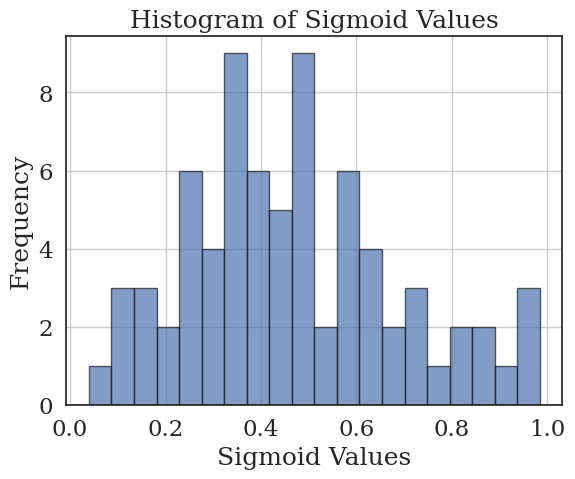

In [ ]:
# Get the sigmoid values (probabilities)
sigmoid_values = logreg.predict_proba(X_test)[:, 1]  # The second column represents the positive class

# Plot the histogram
plt.hist(sigmoid_values, bins=20, edgecolor='k', alpha=0.7)
plt.xlabel('Sigmoid Values')
plt.ylabel('Frequency')
plt.title('Histogram of Sigmoid Values')
plt.grid(True)
plt.show()

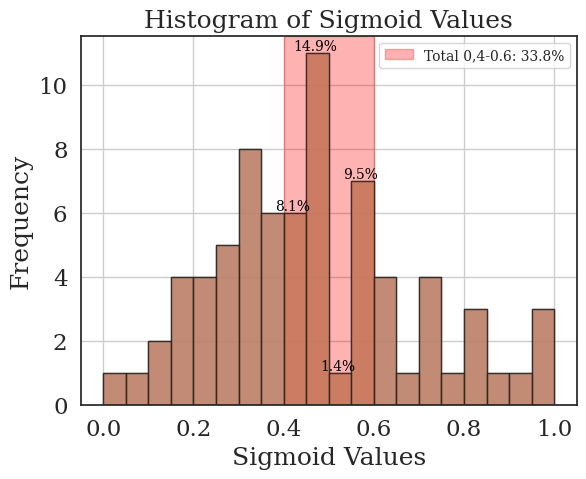

In [ ]:
# Get the sigmoid values (probabilities)
sigmoid_values = logreg.predict_proba(X_test)[:, 1]  # The second column represents the positive class

# Define the bin edges
bin_edges = np.linspace(0, 1, 21)  # 20 bins from 0 to 1

# Plot the histogram
plt.hist(sigmoid_values, bins=bin_edges, edgecolor='k', alpha=0.7)

# Highlight bins between 0.4 and 0.6 in red
plt.axvspan(0.4, 0.6, color='red', alpha=0.3, label='0.4-0.6')

# Calculate and display the count and percentage of values in each bin
counts, bin_edges, _ = plt.hist(sigmoid_values, bins=bin_edges, edgecolor='k', alpha=0.7)
total_samples = len(sigmoid_values)

# count total precentage
total_precentage = 0

# Add labels to the bins with counts and percentages
for i in range(len(counts)):
    if 0.4 <= bin_edges[i] <= 0.6:
        count = int(counts[i])
        percentage = (count / total_samples) * 100
        total_precentage+= percentage
        label = f'{percentage:.1f}%'
        plt.text(bin_edges[i] + 0.02, counts[i], label, ha='center', va='bottom', color='black', fontsize=10)

plt.xlabel('Sigmoid Values')
plt.ylabel('Frequency')
plt.title('Histogram of Sigmoid Values')
plt.grid(True)
legend_label = f'Total 0,4-0.6: {total_precentage:.1f}%'
plt.legend([legend_label], fontsize=10)
plt.show()

Test: Accuracy: 0.6756756756756757
Test: Recall: 0.5294117647058824
Test: Precision: 0.6923076923076923
Test: F1 Score: 0.5999999999999999


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

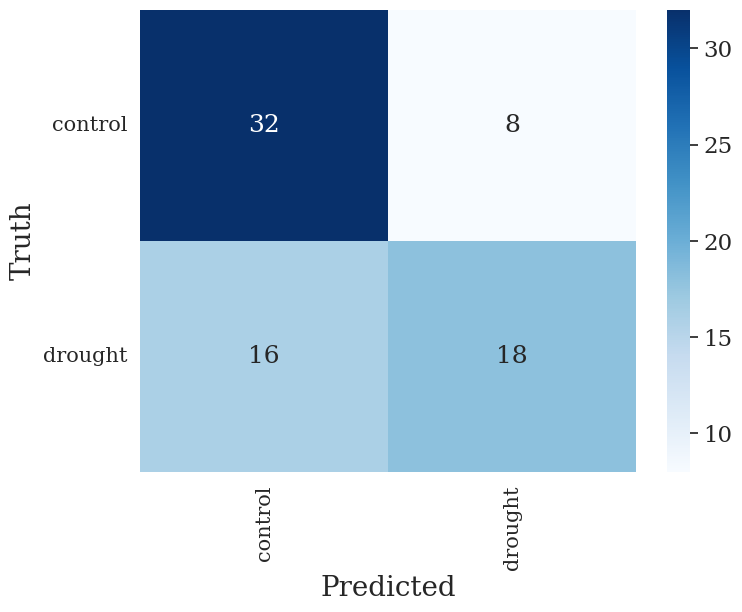

In [ ]:
y_test_pred = logreg.predict(X_test)

# print matrix
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred, pos_label='drought'))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred, pos_label='drought'))
print("Test: F1 Score:",metrics.f1_score(y_test, y_test_pred, pos_label='drought'))


###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 18},cmap="Blues")
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)

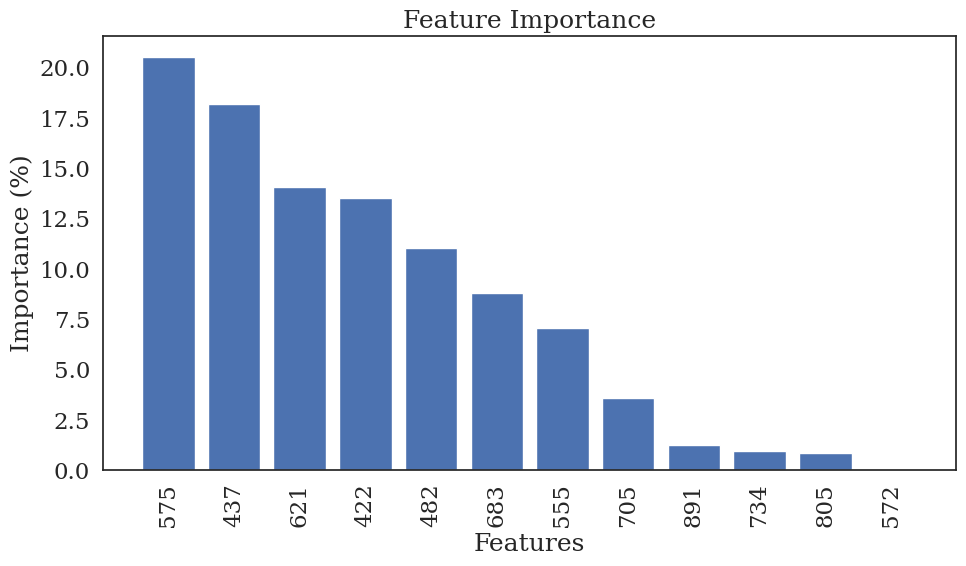

In [ ]:
# Fit the model to the training data
logreg.fit(X_train, y_train)

# Get the coefficients of the model
coefficients = logreg.coef_[0]

# Calculate the absolute feature importance
feature_importance = np.abs(coefficients)

# Calculate the percentage of each feature importance
total_importance = np.sum(feature_importance)
percentage_importance = (feature_importance / total_importance) * 100

# Sort the feature importance in descending order
sorted_idx = np.argsort(percentage_importance)[::-1]

# Get the names of the features
feature_names = X_train.columns

# Plot the feature importance
plt.figure(figsize=(10, 6))
plt.bar(range(len(percentage_importance)), percentage_importance[sorted_idx], align='center')
plt.xticks(range(len(percentage_importance)), feature_names[sorted_idx], rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance (%)')
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

Check dates and species of the wrong

In [ ]:
# Get predictions on the test set
y_test_pred = logreg.predict(X_test)

# Calculate accuracy on the test set
accuracy = accuracy_score(y_test, y_test_pred)
print("Test accuracy: {:.2f}".format(accuracy))

# Find misclassified samples
misclassified_indices = y_test != y_test_pred

# Extract species and dates for misclassified samples
misclassified_species = test_species[misclassified_indices]
misclassified_dates = test_dates[misclassified_indices]

# Display misclassified species and dates
for species, date in zip(misclassified_species, misclassified_dates):
    print("Misclassified Species:", species, " | Spectral Date:", date)

Test accuracy: 0.68
Misclassified Species: cypress  | Spectral Date: 2022-11-23T00:00:00.000000000
Misclassified Species: cypress  | Spectral Date: 2022-12-20T00:00:00.000000000
Misclassified Species: oak  | Spectral Date: 2022-03-14T00:00:00.000000000
Misclassified Species: carob  | Spectral Date: 2023-02-13T00:00:00.000000000
Misclassified Species: oak  | Spectral Date: 2022-12-20T00:00:00.000000000
Misclassified Species: oak  | Spectral Date: 2023-02-13T00:00:00.000000000
Misclassified Species: cypress  | Spectral Date: 2022-12-20T00:00:00.000000000
Misclassified Species: carob  | Spectral Date: 2022-04-12T00:00:00.000000000
Misclassified Species: pine  | Spectral Date: 2022-08-11T00:00:00.000000000
Misclassified Species: carob  | Spectral Date: 2023-02-13T00:00:00.000000000
Misclassified Species: pistacia  | Spectral Date: 2023-01-10T00:00:00.000000000
Misclassified Species: cypress  | Spectral Date: 2022-03-14T00:00:00.000000000
Misclassified Species: carob  | Spectral Date: 2022-

In [ ]:
from datetime import datetime

# Convert test dates to datetime objects
test_dates_datetime = [datetime.strptime(date, '%Y-%m-%d') for date in misclassified_dates]

# Extract month-year format (mm-yyyy) from datetime objects
test_dates_month_year = [date.strftime('%m-%Y') for date in test_dates_datetime]

# Create a DataFrame to store misclassified species and dates
misclassified_data = pd.DataFrame({'Species': misclassified_species, 'Date': test_dates_month_year})

# Sort the DataFrame by datetime objects
misclassified_data['Date'] = pd.to_datetime(misclassified_data['Date'])
misclassified_data = misclassified_data.sort_values(by='Date')

# Plot misclassified samples
plt.figure(figsize=(8, 6))
plt.scatter(misclassified_data['Date'], misclassified_data['Species'], color='red',)
plt.xlabel('Date (mm-yyyy)')
plt.ylabel('Species')
plt.title('Misclassified Samples')
# plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

TypeError: strptime() argument 1 must be str, not numpy.datetime64

In [ ]:
# Extract month-year format (mm-yyyy) from datetime objects
test_dates_month_year = [date.strftime('%m-%Y') for date in test_dates_datetime]

# Count the occurrences of each month-year combination
date_counter = Counter(test_dates_month_year)

# Convert the Counter to a DataFrame
date_counts_df = pd.DataFrame.from_dict(date_counter, orient='index', columns=['Count'])
date_counts_df.index.name = 'Month-Year'

# Transform index to yyyy-mm format for sorting
date_counts_df['Sortable_Date'] = pd.to_datetime(date_counts_df.index)

# Sort the DataFrame by sortable date
date_counts_df = date_counts_df.sort_values(by='Sortable_Date')

# Create subplots for dates and species
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# Plot misclassified dates
date_counts_df.plot(kind='bar', y='Count', color='red', legend=None, ax=axs[0])
axs[0].set_xlabel('Month-Year')
axs[0].set_ylabel('Count')
axs[0].set_title('Misclassified Counts by Month-Year')
axs[0].tick_params(axis='x', rotation=45)

# Plot misclassified species
species_counts = misclassified_data['Species'].value_counts()
species_counts.plot(kind='bar', color='red', ax=axs[1])
axs[1].set_xlabel('Species')
axs[1].set_ylabel('Count')
axs[1].set_title('Misclassified Species')
axs[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

Analize the 13 samples that the model predict as Control but were drought

In [ ]:
# Find misclassified false positive samples
false_positive_indices = (y_test_pred == 'control') & (y_test == 'drought')

# Extract species and dates for false positive samples
false_positive_species = test_species[false_positive_indices]
false_positive_dates = test_dates[false_positive_indices]

# Display false positive species and dates
for species, date in zip(false_positive_species, false_positive_dates):
    print("Misclassified as Control (False Positive):", species, " | Spectral Date:", date)

In [ ]:
# create df of all false positive values
df_miss = pd.DataFrame(zip(false_positive_species, false_positive_dates),columns=['species','false_positive_dates',	])

# Convert the false_positive_dates to datetime objects
df_miss['false_positive_dates'] = pd.to_datetime(df_miss['false_positive_dates']).dt.strftime('%m-%Y')

# create df with all test set dates
date_objs = [pd.to_datetime(date_str) for date_str in test_dates]

# Extract month-year formatted strings
month_year_strings = [date_obj.strftime('%m-%Y') for date_obj in date_objs]

# Create a dictionary for the DataFrame
data = {
    'All_Dates': month_year_strings,
}

df_all = pd.DataFrame(data).drop_duplicates().reset_index(drop=True)

# Merge the two DataFrames based on the dates
merged_df = pd.merge(df_all, df_miss, how='left', left_on='All_Dates', right_on='false_positive_dates')

# Convert 'All_Dates' column to datetime objects for sorting
merged_df['All_Dates'] = pd.to_datetime(merged_df['All_Dates'], format='%m-%Y')

# Sort the DataFrame by 'All_Dates'
merged_df = merged_df.sort_values(by='All_Dates')

# Rename the 'species' column to match the desired output
merged_df.rename(columns={'species': 'false_positive_species'}, inplace=True)

merged_df['All_Dates'] = merged_df['All_Dates'].dt.strftime('%m-%Y')


# merged_df

In [ ]:
species = df['English_name'].unique()


# Create a dictionary to store species and their counts
species_counts = {'Species': [], 'Count': []}

# Count occurrences of each species in merged_df
for sp in species:
    count = len(merged_df[merged_df['false_positive_species'] == sp])
    species_counts['Species'].append(sp)
    species_counts['Count'].append(count)

# Create a DataFrame from the species_counts dictionary
species_df = pd.DataFrame(species_counts)
# species_df

In [ ]:
#  Reindex the data to include all unique dates from All_Dates
unique_dates = merged_df['All_Dates'].unique()
reindexed_data = merged_df.groupby('All_Dates')['false_positive_dates'].count().reindex(unique_dates).fillna(0)

# Create the figure and subplots
fig, axs = plt.subplots(1, 2, figsize=(14, 5))

# Left Subplot: Column Graph for false_positive_dates
reindexed_data.plot(kind='bar', ax=axs[0],color = 'red',alpha=0.4)
axs[0].set_xticklabels(reindexed_data.index, rotation=90)
axs[0].set_title('False Positive Counts by Date')
axs[0].set_yticks([0,1,2,3])
axs[0].set_xlabel('Date')
axs[0].set_ylabel('Count')

# Right Subplot: Column Graph for species
axs[1].bar(species_df['Species'],species_df['Count'],color = 'red',alpha=0.4)
axs[1].set_xticklabels(axs[1].get_xticklabels(), rotation=90)
axs[1].set_title('False Positive Species Counts')
axs[1].set_yticks([0,1,2,3])
axs[1].set_xlabel('Species')
axs[1].set_ylabel('Count')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
# Convert test dates to datetime objects
test_dates_datetime = [datetime.strptime(date, '%Y-%m-%d') for date in false_positive_dates]

# Extract month-year format (mm-yyyy) from datetime objects
test_dates_month_year = [date.strftime('%m-%Y') for date in test_dates_datetime]

# Create a DataFrame to store misclassified species and dates
misclassified_data = pd.DataFrame({'Species': false_positive_species, 'Date': test_dates_month_year})

# Sort the DataFrame by datetime objects
misclassified_data['Date'] = pd.to_datetime(misclassified_data['Date'])
misclassified_data = misclassified_data.sort_values(by='Date')

# Plot misclassified samples
plt.figure(figsize=(8, 5))
plt.scatter(misclassified_data['Date'], misclassified_data['Species'], color='red',)
plt.xlabel('Date ')
plt.ylabel('Species')
plt.title('False Positive Samples')
# plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### SVM

In [ ]:
# Define features and labels
X = important_df[important_df.columns[:-3]]

# X = (X- X.mean())/X.std()

# Encode "English_name"
label_encoder = LabelEncoder()
X["English_name_encoded"] = label_encoder.fit_transform(important_df["English_name"])

X['English_name'] = important_df['English_name'].values
X['spectral_date'] = important_df['spectral_date'].values


# Print the mapping of the encoded values
english_name_mapping = dict(zip(label_encoder.transform(label_encoder.classes_),label_encoder.classes_))

y = important_df['treatment']

# Split to train-test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# save date of test set for research later
test_species = X_test['English_name'].values
test_dates = X_test['spectral_date'].values

# drop from sets spectral_date column
X_train = X_train.drop(columns=['spectral_date']).drop(columns=['English_name'])
X_test = X_test.drop(columns=['spectral_date']).drop(columns=['English_name'])



X_train.shape,X_test.shape

<ipython-input-10-6c401f501b14>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["English_name_encoded"] = label_encoder.fit_transform(important_df["English_name"])
<ipython-input-10-6c401f501b14>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['English_name'] = important_df['English_name'].values


((172, 29), (74, 29))

In [ ]:
param_distribs = {
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'shrinking': [False, True],
    'C': reciprocal(1, 1000),
    'coef0': expon(scale=1.0),
    'gamma': expon(scale=1.0),
    'degree': [1, 2, 3, 4, 5, 6, 7, 8],
    'tol': expon(scale=1e-4)
}

svm_clf = SVC()
rnd_search = RandomizedSearchCV(svm_clf, param_distributions=param_distribs,
                                n_iter=50, cv=3, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=False, tol=2.0799307999138624e-06; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=False, tol=2.0799307999138624e-06; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821

In [ ]:
# Create the SVC model with the best parameters from the randomized search
svc = SVC(**rnd_search.best_params_)

# Fit the model to the training data
svc.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(svc, X_train, y_train, cv=3)

# Calculate recall, precision, and F1 score
accuracy = accuracy_score(y_train, y_train_pred)
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')

# Print the results
print("Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Accuracy: 0.75
Recall: 0.8735632183908046
Precision: 0.7037037037037037
F1 Score: 0.7794871794871796


Test: Accuracy: 0.7702702702702703
Test: Precision: 0.7073170731707317 
Test: Recall: 0.8529411764705882 
Test: F1 Score: 0.7733333333333334


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

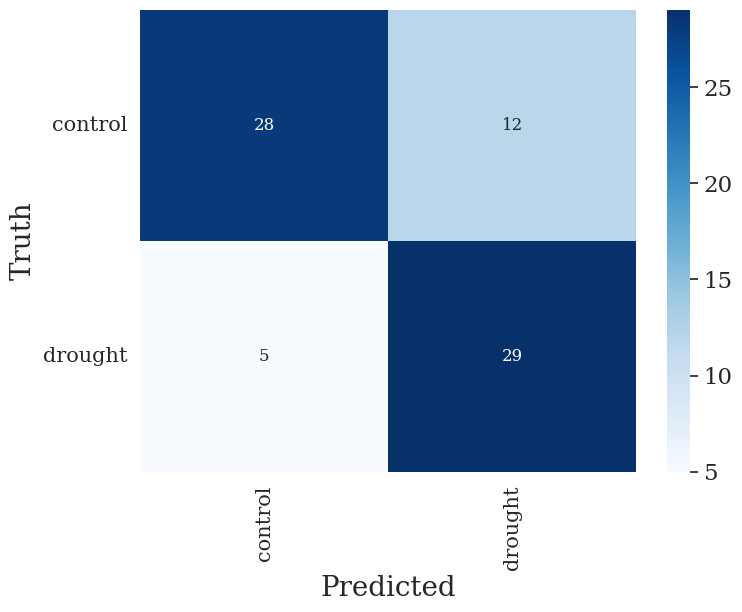

In [ ]:
y_test_pred = svc.predict(X_test)

# print matrix
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Precision:",precision_score(y_test, y_test_pred, pos_label='drought')
      ,"\nTest: Recall:",recall_score(y_test, y_test_pred, pos_label='drought')
      ,"\nTest: F1 Score:",f1_score(y_test, y_test_pred, pos_label='drought'))

###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 12},cmap="Blues")
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


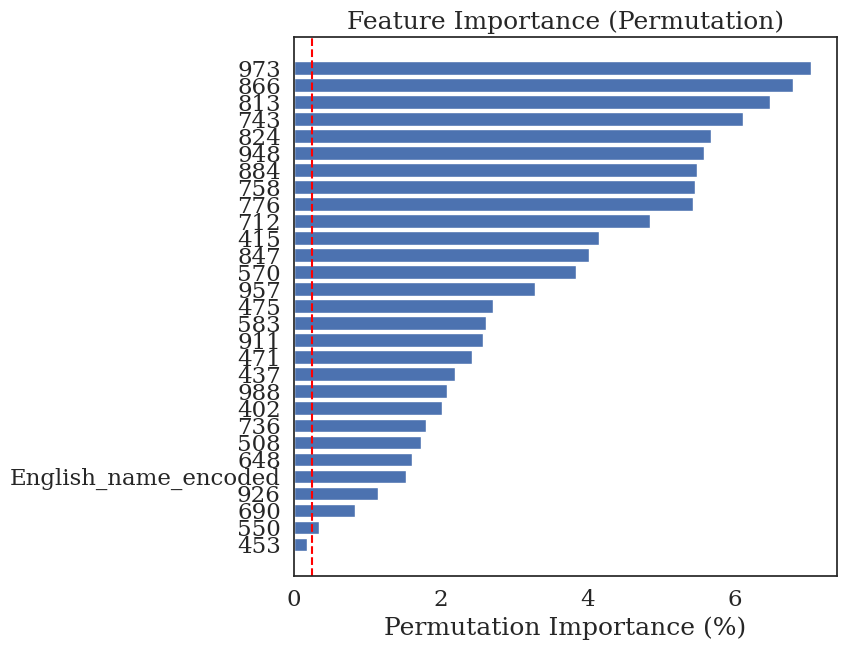

In [ ]:
# Use permutation importance to calculate feature importance
result = permutation_importance(svc, X_train, y_train, n_repeats=10, random_state=42, n_jobs=-1)

# Get feature importance scores and normalize them to percentages
importance = result.importances_mean

# normalize to precentages
importance = (importance / np.sum(importance))*100


# Plot feature importance
sorted_idx = importance.argsort()
fig, ax = plt.subplots(figsize=(7, 7))
plt.barh(X_train.columns[sorted_idx], importance[sorted_idx])
# Add verical line at X = 2.5%
plt.axvline(x=0.25, color='red', linestyle='--')
plt.xlabel("Permutation Importance (%)")
plt.title("Feature Importance (Permutation)")
plt.show()

#### Reduce to 17 bands

In [ ]:
# Create a mask to filter the columns with importance greater than 0.1%
mask = importance > 2.5

# Get the names of the features that meet the importance threshold
selected_features = X_train.columns[mask]

# Create a new DataFrame with the selected features
new_df = df[selected_features].copy()

# Print the new DataFrame
new_df

,415,475,570,583,712,743,758,776,813,824,847,866,884,911,948,957,973
0,0.023595,0.035766,0.059917,0.056291,0.097547,0.199924,0.216088,0.222603,0.227312,0.229133,0.231435,0.231835,0.236759,0.231844,0.224508,0.226143,0.219061
15,0.022939,0.028376,0.048718,0.046018,0.084586,0.188417,0.208196,0.213411,0.220505,0.222753,0.223649,0.225633,0.231208,0.229275,0.228315,0.227710,0.222673
14,0.024182,0.021377,0.038266,0.034869,0.058516,0.121905,0.130964,0.133837,0.138336,0.139148,0.140629,0.142374,0.145599,0.143349,0.134210,0.134894,0.134403
12,0.041287,0.047842,0.078566,0.073241,0.120057,0.232521,0.250579,0.256094,0.265331,0.268606,0.270273,0.273187,0.279762,0.278420,0.275804,0.275137,0.268456
11,0.022117,0.022060,0.042140,0.036963,0.081243,0.206103,0.229769,0.235927,0.242066,0.244301,0.245068,0.246511,0.251829,0.248910,0.243206,0.241969,0.234615
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220,0.023973,0.029724,0.055138,0.048619,0.113831,0.273418,0.303956,0.312947,0.325064,0.325284,0.337577,0.343742,0.341843,0.348039,0.346894,0.335776,0.333938
219,0.014638,0.022704,0.038553,0.035581,0.069845,0.156290,0.172889,0.182192,0.183193,0.182844,0.192152,0.194271,0.189929,0.194997,0.189713,0.185181,0.185199
244,0.020232,0.025610,0.043903,0.039972,0.082989,0.199512,0.224665,0.233346,0.240146,0.239389,0.248656,0.252036,0.249571,0.251967,0.247218,0.239147,0.236201
231,0.036745,0.051867,0.090754,0.082888,0.146207,0.270950,0.287887,0.299395,0.300460,0.300937,0.311973,0.318640,0.317808,0.308292,0.309560,0.304544,0.303973


In [ ]:
# Define features and labels
X = new_df
y = important_df['treatment']

# Split to train-test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

X_train.shape,X_test.shape

((172, 17), (74, 17))

In [ ]:
param_distribs = {
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'shrinking': [False, True],
    'C': reciprocal(1, 1000),
    'coef0': expon(scale=1.0),
    'gamma': expon(scale=1.0),
    'degree': [1, 2, 3, 4, 5, 6, 7, 8],
    'tol': expon(scale=1e-4)
}

svm_clf = SVC()
rnd_search = RandomizedSearchCV(svm_clf, param_distributions=param_distribs,
                                n_iter=50, cv=3, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, coef0=3.010121430917521, degree=3, gamma=1.5127241738646855, kernel=linear, shrinking=False, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=False, tol=2.0799307999138624e-06; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821536272645, kernel=sigmoid, shrinking=False, tol=2.0799307999138624e-06; total time=   0.0s
[CV] END C=1.994916615063393, coef0=0.6147961650819368, degree=5, gamma=0.9190821

In [ ]:
# Create the SVC model with the best parameters from the randomized search
svc = SVC(**rnd_search.best_params_)

# Fit the model to the training data
svc.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(svc, X_train, y_train, cv=5)

# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')


print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Recall: 0.8275862068965517
Precision: 0.7058823529411765
F1 Score: 0.7619047619047619


Test: Accuracy: 0.7162162162162162
Test: Precision: 0.6382978723404256 
Test: Recall: 0.8823529411764706 
Test: F1 Score: 0.7407407407407407


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

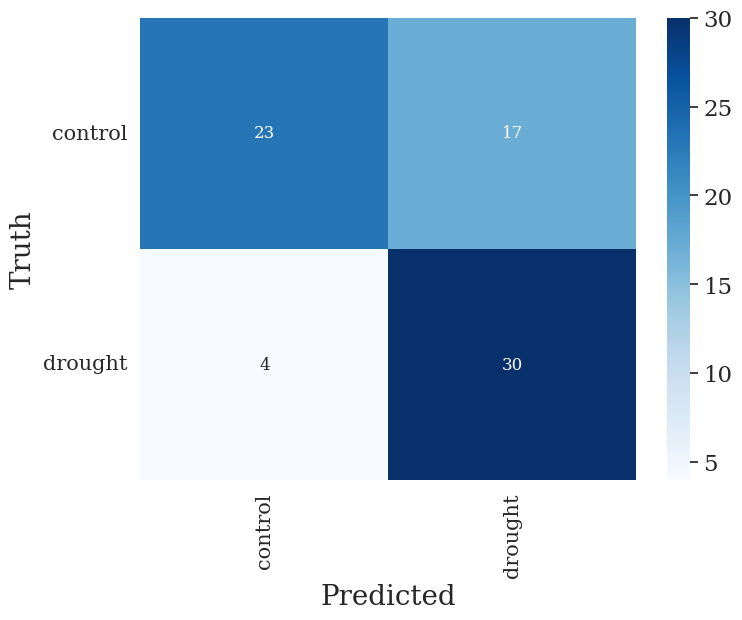

In [ ]:
y_test_pred = svc.predict(X_test)

# print matrix
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Precision:",precision_score(y_test, y_test_pred, pos_label='drought')
      ,"\nTest: Recall:",recall_score(y_test, y_test_pred, pos_label='drought')
      ,"\nTest: F1 Score:",f1_score(y_test, y_test_pred, pos_label='drought'))

###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 12},cmap="Blues")
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)

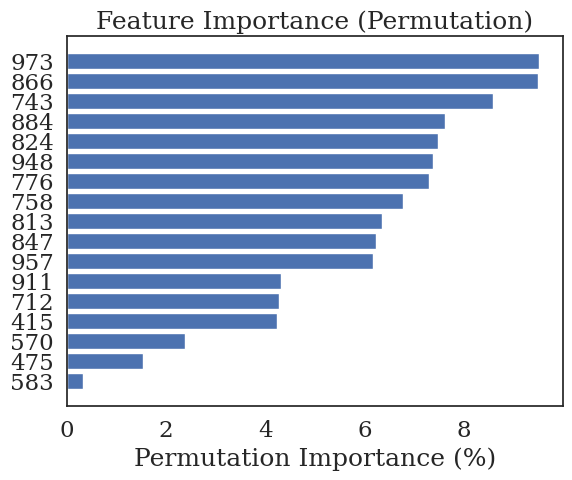

In [ ]:
# Use permutation importance to calculate feature importance
result = permutation_importance(svc, X_train, y_train, n_repeats=10, random_state=42, n_jobs=-1)

# Get feature importance scores and normalize them to percentages
importance = result.importances_mean

# normalize to precentages
importance = (importance / np.sum(importance))*100


# Plot feature importance
sorted_idx = importance.argsort()
plt.barh(X_train.columns[sorted_idx], importance[sorted_idx])
plt.xlabel("Permutation Importance (%)")
plt.title("Feature Importance (Permutation)")
plt.show()

In [ ]:
importance.sum()

100.0

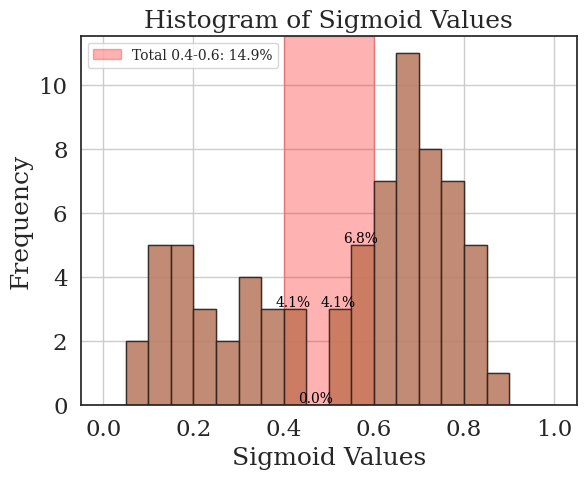

In [ ]:
# Get decision function scores
decision_scores = svc.decision_function(X_test)

# Apply sigmoid function to approximate probabilities
sigmoid_values = 1 / (1 + np.exp(-decision_scores))

# Define the bin edges
bin_edges = np.linspace(0, 1, 21)  # 20 bins from 0 to 1

# Plot the histogram
plt.hist(sigmoid_values, bins=bin_edges, edgecolor='k', alpha=0.7)

# Highlight bins between 0.4 and 0.6 in red
plt.axvspan(0.4, 0.6, color='red', alpha=0.3, label='0.4-0.6')

# Calculate and display the count and percentage of values in each bin
counts, bin_edges, _ = plt.hist(sigmoid_values, bins=bin_edges, edgecolor='k', alpha=0.7)
total_samples = len(sigmoid_values)

# count total percentage
total_percentage = 0

# Add labels to the bins with counts and percentages
for i in range(len(counts)):
    if 0.4 <= bin_edges[i] <= 0.6:
        count = int(counts[i])
        percentage = (count / total_samples) * 100
        total_percentage += percentage
        label = f'{percentage:.1f}%'
        plt.text(bin_edges[i] + 0.02, counts[i], label, ha='center', va='bottom', color='black', fontsize=10)

plt.xlabel('Sigmoid Values')
plt.ylabel('Frequency')
plt.title('Histogram of Sigmoid Values')
plt.grid(True)
legend_label = f'Total 0.4-0.6: {total_percentage:.1f}%'
plt.legend([legend_label], fontsize=10)
plt.show()


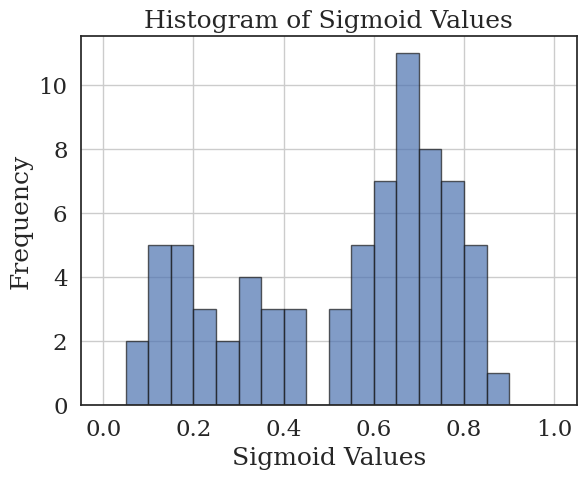

In [ ]:
# Get decision function scores
decision_scores = svc.decision_function(X_test)

# Apply sigmoid function to approximate probabilities
sigmoid_values = 1 / (1 + np.exp(-decision_scores))

bin_edges = np.linspace(0, 1, 21)  # 20 bins from 0 to 1

# Plot the histogram
plt.hist(sigmoid_values, bins=bin_edges, edgecolor='k', alpha=0.7)
plt.xlabel('Sigmoid Values')
plt.ylabel('Frequency')
plt.title('Histogram of Sigmoid Values')
plt.grid(True)
plt.show()

Check dates and species of the wrong

In [ ]:
# Get predictions on the test set
y_test_pred = svc.predict(X_test)

# Calculate accuracy on the test set
accuracy = accuracy_score(y_test, y_test_pred)
print("Test accuracy: {:.2f}".format(accuracy))

# Find misclassified samples
misclassified_indices = y_test != y_test_pred

# Extract species, dates, and predicted species for misclassified samples
misclassified_species = test_species[misclassified_indices]
misclassified_dates = test_dates[misclassified_indices]
misclassified_dates = [date[:7] for date in misclassified_dates]
# Display misclassified species and dates along with predicted species
print("Misclassified samples:")
for i in range(len(misclassified_species)):
    print(f"Species: {misclassified_species[i]}, Date: {misclassified_dates[i]} ")



Test accuracy: 0.72
Misclassified samples:
Species: cypress, Date: 2022-12 
Species: cypress, Date: 2022-08 
Species: pine, Date: 2023-01 
Species: oak, Date: 2023-02 
Species: cypress, Date: 2023-01 
Species: pistacia, Date: 2023-01 
Species: pistacia, Date: 2023-01 
Species: pistacia, Date: 2022-08 
Species: oak, Date: 2022-04 
Species: oak, Date: 2023-01 
Species: pine, Date: 2022-12 
Species: pine, Date: 2022-08 
Species: oak, Date: 2022-12 
Species: carob, Date: 2022-08 
Species: pistacia, Date: 2023-01 
Species: oak, Date: 2022-11 
Species: pistacia, Date: 2022-07 
Species: cypress, Date: 2022-08 
Species: carob, Date: 2022-08 
Species: pine, Date: 2022-08 
Species: pine, Date: 2022-07 


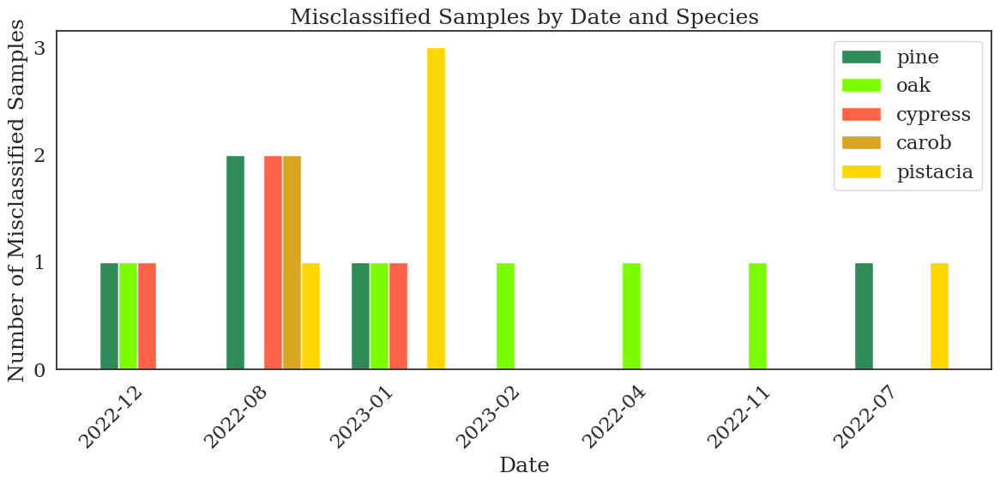

In [ ]:
# Define the species order and colors
species_order = ['pine', 'oak', 'cypress', 'carob', 'pistacia']
species_colors = ['seagreen', 'lawngreen', 'tomato', 'goldenrod', 'gold']

# Group misclassified samples by date and species
misclassified_data = {}
for species, date in zip(misclassified_species, misclassified_dates):
    if date not in misclassified_data:
        misclassified_data[date] = {s: 0 for s in species_order}
    misclassified_data[date][species] += 1

# Plot the bar graph
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
bar_width = 0.15
index = np.arange(len(misclassified_data))  # Index for x-axis

# Plot bars for each date and species
for j, species in enumerate(species_order):
    counts = [misclassified_data[date][species] if species in misclassified_data[date] else 0 for date in misclassified_data]
    plt.bar(index + j * bar_width, counts, bar_width, color=species_colors[j], label=species)

# Set x-axis labels as dates
plt.xticks(index + bar_width * 2, misclassified_data.keys(), rotation=45, ha='right')

# set y ticks 1,2,3
plt.yticks(np.arange(0, max([max(species_counts.values()) for species_counts in misclassified_data.values()]) + 1, 1))
plt.xlabel('Date')
plt.ylabel('Number of Misclassified Samples')
plt.title('Misclassified Samples by Date and Species')

# Create single legend from species order and colors
plt.legend(species_order, loc='upper right')

plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

Analize the samples that the model predict as Control but were drought

In [ ]:
# Find misclassified false positive samples
false_positive_indices = (y_test_pred == 'control') & (y_test == 'drought')

# Extract species and dates for false positive samples
false_positive_species = test_species[false_positive_indices]
false_positive_dates = test_dates[false_positive_indices]

# convert dates to yyyy-mm format
false_positive_dates = [date[:7] for date in false_positive_dates]

# Display false positive species and dates
for species, date in zip(false_positive_species, false_positive_dates):
    print("Misclassified as Control (False Positive):", species, " | Spectral Date:", date)

Misclassified as Control (False Positive): oak  | Spectral Date: 2023-02
Misclassified as Control (False Positive): oak  | Spectral Date: 2022-04
Misclassified as Control (False Positive): oak  | Spectral Date: 2022-12
Misclassified as Control (False Positive): oak  | Spectral Date: 2022-11


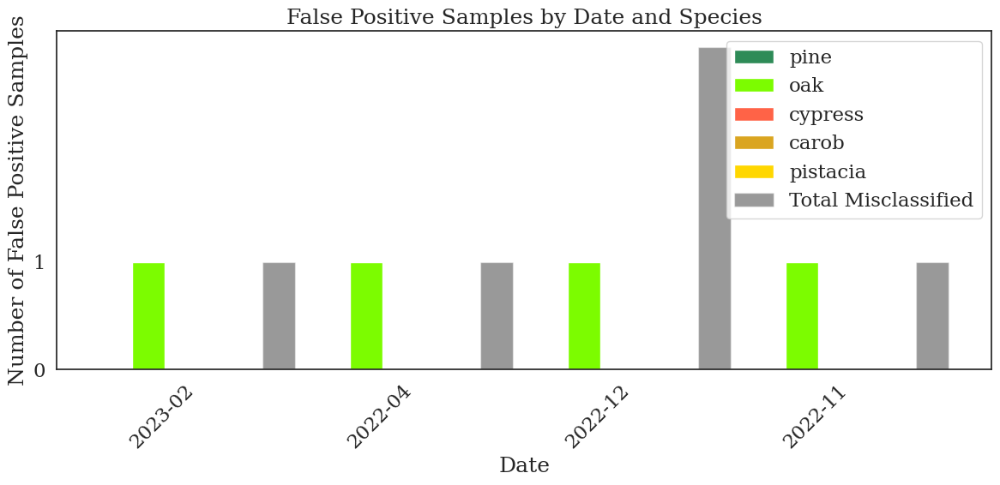

In [ ]:
# Group false positive samples by date and species
false_positive_data = {}
for species, date in zip(false_positive_species, false_positive_dates):
    if date not in false_positive_data:
        false_positive_data[date] = {s: 0 for s in species_order}
    false_positive_data[date][species] += 1

# Plot the bar graph
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
bar_width = 0.15
index = np.arange(len(false_positive_data))  # Index for x-axis

# Plot bars for false positives for each date and species
for j, species in enumerate(species_order):
    counts = [false_positive_data[date][species] if species in false_positive_data[date] else 0 for date in false_positive_data]
    plt.bar(index + j * bar_width, counts, bar_width, color=species_colors[j], label=species)

# Plot total misclassified samples for each date
total_misclassified = [sum(misclassified_data[date].values()) for date in false_positive_data]
plt.bar(index + len(species_order) * bar_width, total_misclassified, bar_width, color='black', alpha=0.4, label='Total Misclassified')

# Set x-axis labels as dates
plt.xticks(index + len(species_order) * bar_width / 2, false_positive_data.keys(), rotation=45, ha='right')

# set y ticks 1,2,3
plt.yticks(np.arange(0, max([max(species_counts.values()) for species_counts in false_positive_data.values()]) + 1, 1))
plt.xlabel('Date')
plt.ylabel('Number of False Positive Samples')
plt.title('False Positive Samples by Date and Species')

# Create single legend from species order and a label for total misclassified samples
plt.legend(species_order + ['Total Misclassified'], loc='upper right')

plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

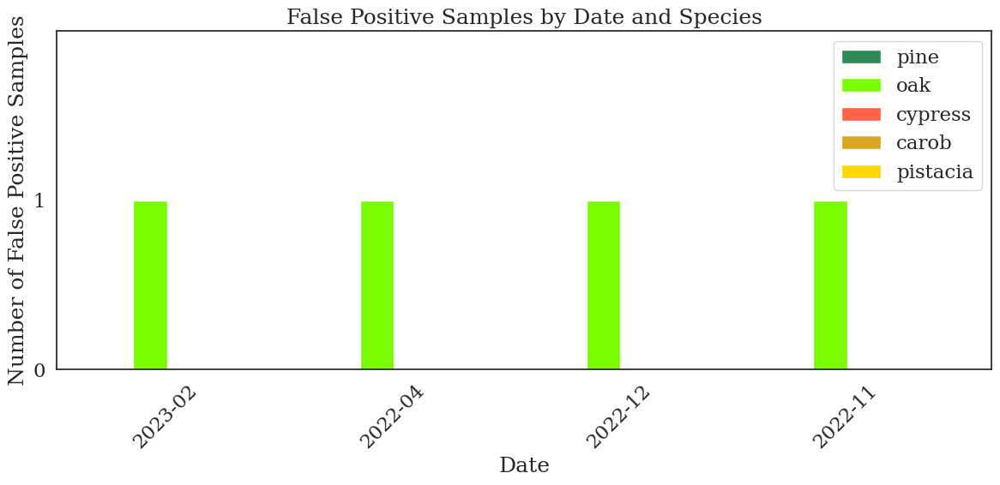

In [ ]:
# Group false positive samples by date and species
false_positive_data = {}
for species, date in zip(false_positive_species, false_positive_dates):
    if date not in false_positive_data:
        false_positive_data[date] = {s: 0 for s in species_order}
    false_positive_data[date][species] += 1

# Plot the bar graph
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
bar_width = 0.15
index = np.arange(len(false_positive_data))  # Index for x-axis

# Plot bars for false positives for each date and species
for j, species in enumerate(species_order):
    counts = [false_positive_data[date][species] if species in false_positive_data[date] else 0 for date in false_positive_data]
    plt.bar(index + j * bar_width, counts, bar_width, color=species_colors[j], label=species)

# Set x-axis labels as dates
plt.xticks(index + len(species_order) * bar_width / 2, false_positive_data.keys(), rotation=45, ha='right')

# set y ticks 1,2,3
plt.yticks(np.arange(0, max([max(species_counts.values()) for species_counts in false_positive_data.values()]) + 1, 1))
plt.xlabel('Date')
plt.ylabel('Number of False Positive Samples')
plt.title('False Positive Samples by Date and Species')
plt.ylim(0,2)
# Create single legend from species order
plt.legend(species_order, loc='upper right')

plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

In [ ]:
# create df of all false positive values
df_miss = pd.DataFrame(zip(false_positive_species, false_positive_dates),columns=['species','false_positive_dates',	])

# Convert the false_positive_dates to datetime objects
df_miss['false_positive_dates'] = pd.to_datetime(df_miss['false_positive_dates']).dt.strftime('%m-%Y')

# create df with all test set dates
date_objs = [pd.to_datetime(date_str) for date_str in test_dates]

# Extract month-year formatted strings
month_year_strings = [date_obj.strftime('%m-%Y') for date_obj in date_objs]

# Create a dictionary for the DataFrame
data = {
    'All_Dates': month_year_strings,
}

df_all = pd.DataFrame(data).drop_duplicates().reset_index(drop=True)

# Merge the two DataFrames based on the dates
merged_df = pd.merge(df_all, df_miss, how='left', left_on='All_Dates', right_on='false_positive_dates')

# Convert 'All_Dates' column to datetime objects for sorting
merged_df['All_Dates'] = pd.to_datetime(merged_df['All_Dates'], format='%m-%Y')

# Sort the DataFrame by 'All_Dates'
merged_df = merged_df.sort_values(by='All_Dates')

# Rename the 'species' column to match the desired output
merged_df.rename(columns={'species': 'false_positive_species'}, inplace=True)

merged_df['All_Dates'] = merged_df['All_Dates'].dt.strftime('%m-%Y')


df_miss

,species,false_positive_dates
0,oak,02-2023
1,oak,04-2022
2,oak,12-2022
3,oak,11-2022


In [ ]:
species = df['English_name'].unique()


# Create a dictionary to store species and their counts
species_counts = {'Species': [], 'Count': []}

# Count occurrences of each species in merged_df
for sp in species:
    count = len(merged_df[merged_df['false_positive_species'] == sp])
    species_counts['Species'].append(sp)
    species_counts['Count'].append(count)

# Create a DataFrame from the species_counts dictionary
species_df = pd.DataFrame(species_counts)
# species_df

### RF

In [ ]:
param_distribs = {
'n_estimators':[int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)],
'criterion': ['gini', 'entropy'],
'max_depth': [int(x) for x in np.linspace(10, 110, num = 11)],
'min_samples_split': [2, 5, 10],
'min_samples_leaf': [1, 2, 4],
'max_features': ['auto', 'sqrt'],
}

rf_clf = RandomForestClassifier(random_state=42)
rnd_search = RandomizedSearchCV(rf_clf, param_distributions=param_distribs,
n_iter=100, cv=3, scoring='accuracy',
verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 3 folds for each of 100 candidates, totalling 300 fits
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   8.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=  14.2s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=  12.2s
[CV] END criterion=gini, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   4.2s
[CV] END criterion=gini, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   7.3s
[CV] END criterion=gini, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   9.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1400; total time=   7.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1400; total time=   5.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1400; total time=   4.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.9s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1200; total time=   5.8s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1200; total time=   3.3s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1200; total time=   2.1s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   2.7s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   3.5s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   3.9s
[CV] END criterion=entropy, max_depth=7

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   4.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   4.1s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.1s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.1s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.1s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.8s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.8s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   5.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   3.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   3.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   4.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   5.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   3.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   3.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=  11.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=2000; total time=   3.7s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   1.7s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   2.3s
[CV] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   3.8s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   0.8s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   0.7s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   0.7s
[CV] END criterion=entropy, 

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.3s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   2.5s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   3.9s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   3.0s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.5s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.8s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   7.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   0.7s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   0.7s
[CV] END criterion=gini, max_depth=70, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   0.7s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   3.8s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   4.0s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   2.9s
[CV] END criterion=entropy, max_d

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1800; total time=   3.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1800; total time=   6.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1800; total time=   3.8s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.4s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.5s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.4s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   3.9s
[CV] END criterion=gini, max_depth=

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=400; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=400; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=400; total time=   0.7s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   4.3s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   4.1s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1600; total time=   2.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=400; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=400; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=400; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   3.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   5.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=2000; total time=   3.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=   1.8s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.6s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.7s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.5s
[CV] END criterion=entropy, max_

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=800; total time=   1.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=800; total time=   1.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=800; total time=   1.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   4.5s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   3.1s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   3.1s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1600; total time=   2.7s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1600; total time=   4.1s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1600; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1000; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1000; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1000; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.4s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   4.3s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   5.5s
[CV] END criterion=gini, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   3.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   5.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   3.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1800; total time=   5.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   4.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   5.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   3.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   3.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1800; total time=   3.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1600; total time=   4.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1600; total time=   3.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1600; total time=   3.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   3.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   6.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   3.5s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=1600; total time=   2.7s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=1600; total time=   2.7s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=1600; total time=   3.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   5.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=90, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.8s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=800; total time=   1.8s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=800; total time=   2.3s
[CV] END criterion=entropy, max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=800; total time=   2.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=   3.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=   3.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=   4.0s
[CV] END criterion=entropy, max_depth=100, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.6s
[CV] END criterion=entropy, max_depth=100, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.6s
[CV] END criterion=entropy, max_depth=100, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.6s
[CV] END criterion=entropy, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1400; total time=   3.5s
[CV] END criterion=entropy, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1400; total time=   2.6s
[CV] END criterion=entropy, max_depth=60, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1400; total time=   2.5s
[CV] END criterion=

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   1.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   1.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=400; total time=   1.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1200; total time=   2.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1200; total time=   2.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1200; total time=   2.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=2000; total time=   3.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=2000; total time=   5.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=2000; total time=   3.8s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   3.2s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   3.3s
[CV] END criterion=entropy, max_depth=90, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   4.9s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END criterion=entropy, max_depth=80, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.1s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=600; total time=   1.0s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=600; total time=   1.0s
[CV] END criterion=gini, max_depth=90, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=600; total time=   1.5s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   3.6s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   2.3s
[CV] END criterion=entropy, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   2.2s
[CV] END criterion=entropy, max_de

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1400; total time=   3.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1400; total time=   2.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1400; total time=   2.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=110, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   4.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   4.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=   3.8s
[CV] END criterion=entropy, max_depth=70, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   2.2s
[CV] END criterion=entropy, max_depth=70, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   2.4s
[CV] END criterion=entropy, max_depth=70, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=   3.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=600; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=600; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=600; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   5.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=1800; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=2000; total time=   3.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=2000; total time=   6.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=2000; total time=   4.8s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=800; total time=   1.4s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=800; total time=   1.3s
[CV] END criterion=gini, max_depth=110, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=800; total time=   1.3s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1600; total time=   3.6s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1600; total time=   3.9s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=1600; total time=   2.8s
[CV] END criterion=entropy, max_depth

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=50, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1200; total time=   2.1s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   4.6s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   3.3s
[CV] END criterion=gini, max_depth=100, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   3.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1000; total time=   1.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1000; total time=   1.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=70, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=1000; total time=   2.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   4.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   3.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=80, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=1800; total time=   3.2s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   3.8s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   4.4s
[CV] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   3.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=80, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   3.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=80, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   3.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=80, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=1800; total time=   4.4s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=   3.7s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=   3.7s
[CV] END criterion=entropy, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=2000; total time=   4.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=30, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1400; total time=   2.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1400; total time=   2.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=1400; total time=   2.7s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   2.8s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   4.0s
[CV] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=1400; total time=   2.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=gini, max_depth=90, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=   1.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=   1.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=60, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=   1.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END criterion=entropy, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   1.8s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=1200; total time=   2.4s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=1200; total time=   2.0s
[CV] END criterion=gini, max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=1200; total time=   2.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


Best parameters: {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 50, 'criterion': 'gini'}
Best cross-validation score: 0.62


In [ ]:
# Create the Random Forest model with the best parameters from the randomized search
rf = RandomForestClassifier(**rnd_search.best_params_, random_state=42)

# Fit the model to the training data
rf.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(rf, X_train, y_train, cv=5)

# Calculate recall, precision, and F1 score
# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')

print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Recall: 0.7126436781609196
Precision: 0.6458333333333334
F1 Score: 0.6775956284153006


Test: Accuracy: 0.5540540540540541
Test: Precision: 0.555073755073755
Test: Recall: 0.5540540540540541
Test: f1: 0.5544631037201208


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

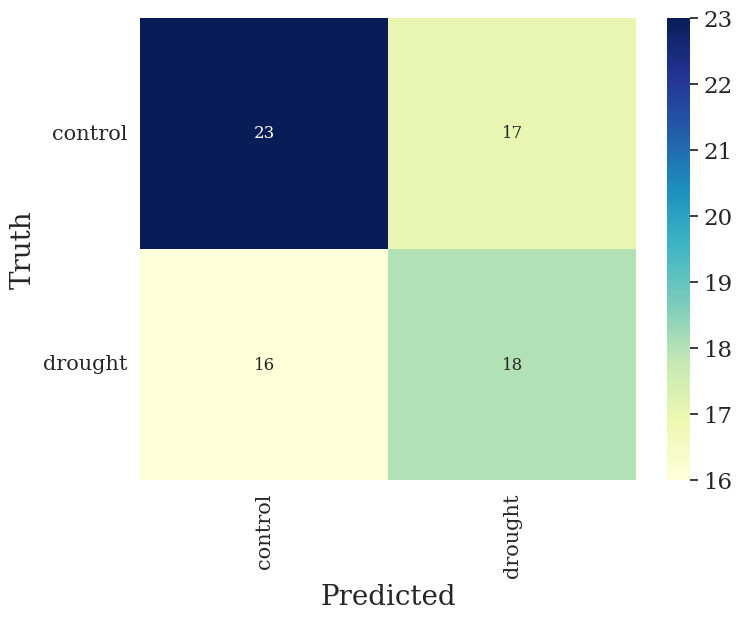

In [ ]:
y_test_pred = rf.predict(X_test)

# Print metrics
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred,average='weighted'))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred,average='weighted'))
print("Test: f1:",metrics.f1_score(y_test, y_test_pred,average='weighted'))

# Confusion matrix
# Labels for confusion matrix:
unique_label = np.unique([y_test, y_test_pred])

# Create confusion matrix dataframe:
cmtx = pd.DataFrame(
confusion_matrix(y_test, y_test_pred, labels=unique_label),
index=[x for x in unique_label],
columns=[x for x in unique_label])
plt.figure(figsize=(8, 6))
sns.heatmap(cmtx, annot=True, fmt='d', annot_kws={"size": 12}, cmap="YlGnBu")
plt.xlabel('Predicted', fontsize=20)
plt.ylabel('Truth', fontsize=20)
plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15, rotation=0)

## Reduce Bands

In [ ]:
# Create df for bands data only
df_bands = df[df.columns[:-6]]
df_bands.head()

# Define the number of contiguous columns to keep
n_cols = 8

# Calculate the number of contiguous blocks of columns
n_blocks = df_bands.shape[1] // n_cols

# Initialize an empty list to hold the column indices to keep
cols_to_keep = []

# Loop over each contiguous block of columns
for i in range(n_blocks):
    # Calculate the starting and ending indices of the current block
    start_idx = i * n_cols
    end_idx = start_idx + n_cols

    # Randomly select one column index from the current block
    rand_idx = np.random.randint(start_idx, end_idx)

    # Add the selected index to the list of columns to keep
    cols_to_keep.append(rand_idx)

# Create a new dataframe with only the selected columns
df_new = df_bands.iloc[:, cols_to_keep]

df_new

,402,429,442,451,479,490,519,537,552,563,...,836,853,871,878,909,913,944,962,970,988
0,0.045164,0.020430,0.026564,0.030882,0.035935,0.036703,0.044102,0.055201,0.060846,0.061189,...,0.229911,0.232924,0.232251,0.233721,0.231557,0.230308,0.223955,0.222415,0.217366,0.219013
15,0.047686,0.018168,0.022207,0.025005,0.028465,0.029128,0.034999,0.044801,0.049467,0.049736,...,0.222225,0.225524,0.226223,0.227706,0.229224,0.227203,0.228660,0.224519,0.220895,0.223066
14,0.051725,0.017537,0.019247,0.020751,0.021140,0.021101,0.026813,0.036664,0.040415,0.039701,...,0.139281,0.142263,0.142718,0.143540,0.143485,0.142215,0.134763,0.133785,0.133198,0.135354
12,0.062196,0.034980,0.040787,0.044735,0.047751,0.048300,0.058569,0.074495,0.081068,0.080692,...,0.268383,0.272790,0.273893,0.275650,0.278445,0.276063,0.276233,0.271096,0.266459,0.267665
11,0.040648,0.017389,0.019869,0.021433,0.021902,0.022057,0.028208,0.039894,0.045162,0.044341,...,0.243828,0.246888,0.246971,0.248354,0.248821,0.246614,0.243802,0.237969,0.232903,0.233724
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220,0.048544,0.022970,0.027258,0.029137,0.029650,0.030407,0.038485,0.052075,0.058377,0.057751,...,0.327415,0.341841,0.344452,0.344023,0.346887,0.345968,0.353857,0.337482,0.334162,0.340165
219,0.026936,0.015041,0.019284,0.021241,0.022767,0.023258,0.029156,0.037101,0.040192,0.039915,...,0.186010,0.194344,0.194229,0.193011,0.193506,0.194037,0.191334,0.186847,0.185640,0.188133
244,0.039817,0.018989,0.022886,0.024708,0.025529,0.026137,0.031972,0.041158,0.045621,0.045434,...,0.241142,0.251536,0.252297,0.251749,0.251119,0.250755,0.252026,0.239916,0.236595,0.240302
231,0.054281,0.037396,0.045148,0.048619,0.052104,0.052261,0.066981,0.085493,0.094164,0.093936,...,0.306340,0.313485,0.320440,0.321989,0.306098,0.309287,0.307305,0.302476,0.304274,0.308368


In [ ]:
# Define features and labels
X = df_new

# Encode "English_name"
label_encoder = LabelEncoder()
X["English_name_encoded"] = label_encoder.fit_transform(df["English_name"])
X['spectral_date'] = df['spectral_date'].values
X['English_name'] = df['English_name'].values

# Print the mapping of the encoded values
english_name_mapping = dict(zip(label_encoder.transform(label_encoder.classes_),label_encoder.classes_))

y = df['treatment']

# Split to train-test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# save date of test set for research later
dates_test = df['spectral_date']

# drop from sets
X_train,X_test = X_train.drop(['English_name','spectral_date'],axis=1),X_test.drop(['English_name','spectral_date'],axis=1)

X_train.shape,X_test.shape

<ipython-input-6-4e8483c431c3>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["English_name_encoded"] = label_encoder.fit_transform(df["English_name"])
<ipython-input-6-4e8483c431c3>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['spectral_date'] = df['spectral_date'].values
<ipython-input-6-4e8483c431c3>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

((172, 35), (74, 35))

### Logistic Regression

In [ ]:
param_distribs = {
    'penalty': ['l1', 'l2'],
    'C': reciprocal(1, 1000),
    'solver': ['liblinear', 'saga'],
    'tol': expon(scale=1e-4),
    'fit_intercept': [False, True],
    'intercept_scaling': expon(scale=1.0),
    'max_iter': [100, 200, 300, 400, 500]
}

logreg_clf = LogisticRegression()
rnd_search = RandomizedSearchCV(logreg_clf, param_distributions=param_distribs,
                                n_iter=100, cv=5, scoring='accuracy',
                                verbose=2, random_state=42)
rnd_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: {}".format(rnd_search.best_params_))
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.1s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.1s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.0s
[CV] END C=13.292918943162162, fit_intercept=False, intercept_scaling=0.2026485043181491, max_iter=500, penalty=l1, solver=liblinear, tol=5.9028874763854456e-05; total time=   0.1s
[CV] END C=1.994916615063393, fi

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=14.89984747565824, fit_intercept=True, intercept_scaling=1.0862557985649803, max_iter=200, penalty=l2, solver=saga, tol=2.3312023188561704e-05; total time=   0.2s
[CV] END C=14.89984747565824, fit_intercept=True, intercept_scaling=1.0862557985649803, max_iter=200, penalty=l2, solver=saga, tol=2.3312023188561704e-05; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=14.89984747565824, fit_intercept=True, intercept_scaling=1.0862557985649803, max_iter=200, penalty=l2, solver=saga, tol=2.3312023188561704e-05; total time=   0.1s
[CV] END C=14.89984747565824, fit_intercept=True, intercept_scaling=1.0862557985649803, max_iter=200, penalty=l2, solver=saga, tol=2.3312023188561704e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=14.89984747565824, fit_intercept=True, intercept_scaling=1.0862557985649803, max_iter=200, penalty=l2, solver=saga, tol=2.3312023188561704e-05; total time=   0.1s
[CV] END C=50.47786565710602, fit_intercept=False, intercept_scaling=3.4928071327362264, max_iter=200, penalty=l2, solver=saga, tol=5.027751757587391e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=50.47786565710602, fit_intercept=False, intercept_scaling=3.4928071327362264, max_iter=200, penalty=l2, solver=saga, tol=5.027751757587391e-05; total time=   0.1s
[CV] END C=50.47786565710602, fit_intercept=False, intercept_scaling=3.4928071327362264, max_iter=200, penalty=l2, solver=saga, tol=5.027751757587391e-05; total time=   0.1s
[CV] END C=50.47786565710602, fit_intercept=False, intercept_scaling=3.4928071327362264, max_iter=200, penalty=l2, solver=saga, tol=5.027751757587391e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=50.47786565710602, fit_intercept=False, intercept_scaling=3.4928071327362264, max_iter=200, penalty=l2, solver=saga, tol=5.027751757587391e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=602.5271171095379, fit_intercept=False, intercept_scaling=2.549435379269405, max_iter=400, penalty=l1, solver=saga, tol=3.9353208680308684e-05; total time=   0.4s
[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.1s
[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.2s
[CV] END C=14.656553886225328, fit_intercept=True, intercept_scaling=0.7758597359502013, max_iter=200, penalty=l1, solver=saga, tol=9.340328151510837e-05; total time=   0.1s
[CV] END C=6.729728537157744, fit_intercept=False, intercept_scaling=1.6204835957747312, max_iter=100, penalty=l1, solver=liblinear, tol=5.506090617769176e-05; total time=   0.0s
[CV] END C=6.729728537157744, fit_intercept=False, intercept_scaling=1.6204835957747312, max_iter=100, penalty=l1, solver=liblinear, tol=5.506090617769176e-05; total time=   0.0s
[CV] END C=6.729728537157744, fit_intercept=False, intercept_scaling=1.6204835957747312, max_iter=100, penalty=l1, solver=liblinear, tol=5.506090617769176e-05; total time=   0.1s
[CV] END C=6.729728537157744, fit_intercept=False, intercept_scaling=1.6204835957747312, max_iter=100, penalty=l1, 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=234.7073130303151, fit_intercept=False, intercept_scaling=0.07692926551379635, max_iter=200, penalty=l1, solver=saga, tol=0.00019885295716582228; total time=   0.2s
[CV] END C=234.7073130303151, fit_intercept=False, intercept_scaling=0.07692926551379635, max_iter=200, penalty=l1, solver=saga, tol=0.00019885295716582228; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=234.7073130303151, fit_intercept=False, intercept_scaling=0.07692926551379635, max_iter=200, penalty=l1, solver=saga, tol=0.00019885295716582228; total time=   0.2s
[CV] END C=234.7073130303151, fit_intercept=False, intercept_scaling=0.07692926551379635, max_iter=200, penalty=l1, solver=saga, tol=0.00019885295716582228; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=234.7073130303151, fit_intercept=False, intercept_scaling=0.07692926551379635, max_iter=200, penalty=l1, solver=saga, tol=0.00019885295716582228; total time=   0.1s
[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.2s
[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=74.1129978108324, fit_intercept=True, intercept_scaling=0.10027360538630499, max_iter=500, penalty=l1, solver=saga, tol=0.000101488935892602; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   4.8s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   6.1s
[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   5.1s
[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   4.0s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=458.8156549160972, fit_intercept=False, intercept_scaling=0.4827677446825112, max_iter=300, penalty=l1, solver=liblinear, tol=8.238874948858289e-05; total time=   2.8s
[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.1s
[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.1s
[CV] END C=205.54245520150735, fit_intercept=False, intercept_scaling=0.04127375231664331, max_iter=200, penalty=l2, solver=saga, tol=1.1416743519186585e-05; total time=   0.1s
[CV] END C=1.242474708366019, fit_intercept=False, intercept_scaling=0.6450624521653773, max_iter=500, penalty=l2, solver=saga, tol=0.00023812655298459756; total time=   0.1s
[CV] END C=1.242474708366019, fit_intercept=False, intercept_scaling=0.6450624521653773, max_iter=500, penalty=l2, solver=saga, tol=0.00023812655298459756; total time=   0.1s
[CV] END C=1.242474708366019, fit_intercept=False, intercept_scaling=0.6450624521653773, max_iter=500, penalty=l2, solver=saga, tol=0.00023812655298459756; total time=   0.1s
[CV] END C=1.242474708366019, fit_intercept=False, intercept_scaling=0.6450624521653773, max_iter=500, penalty=l2, solver

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=7.400385759087372, fit_intercept=True, intercept_scaling=2.124169814240007, max_iter=200, penalty=l1, solver=saga, tol=0.0001003494190520531; total time=   0.2s
[CV] END C=7.400385759087372, fit_intercept=True, intercept_scaling=2.124169814240007, max_iter=200, penalty=l1, solver=saga, tol=0.0001003494190520531; total time=   0.1s
[CV] END C=7.400385759087372, fit_intercept=True, intercept_scaling=2.124169814240007, max_iter=200, penalty=l1, solver=saga, tol=0.0001003494190520531; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=7.400385759087372, fit_intercept=True, intercept_scaling=2.124169814240007, max_iter=200, penalty=l1, solver=saga, tol=0.0001003494190520531; total time=   0.1s
[CV] END C=7.400385759087372, fit_intercept=True, intercept_scaling=2.124169814240007, max_iter=200, penalty=l1, solver=saga, tol=0.0001003494190520531; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=411.5113049561089, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.2s
[CV] END C=411.5113049561089, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=411.5113049561089, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.1s
[CV] END C=411.5113049561089, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=411.5113049561089, fit_intercept=True, intercept_scaling=0.24646391605155396, max_iter=400, penalty=l2, solver=saga, tol=7.75099901966172e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   2.5s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   1.2s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV] END C=264.4359307839863, fit_intercept=True, intercept_scaling=0.4405191413413164, max_iter=100, penalty=l1, solver=liblinear, tol=0.00010432441512843442; total time=   0.8s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.0s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.0s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.0s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=saga, tol=2.511673382758245e-05; total time=   0.0s
[CV] END C=1.003601105392067, fit_intercept=False, intercept_scaling=1.9713449718798333, max_iter=300, penalty=l1, solver=sag

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=31.027409509128386, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   0.1s
[CV] END C=31.027409509128386, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   0.1s
[CV] END C=31.027409509128386, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   0.1s
[CV] END C=31.027409509128386, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   0.1s
[CV] END C=31.027409509128386, fit_intercept=False, intercept_scaling=0.16027078782001994, max_iter=100, penalty=l1, solver=liblinear, tol=0.0003755658599101898; total time=   0.1s
[CV] END C=17.104525858990527, fit_intercept=False, intercept_scaling=0.32662592101036936, max_

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.2s
[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.2s
[CV] END C=281.3815513117019, fit_intercept=True, intercept_scaling=1.803644794246297, max_iter=400, penalty=l1, solver=saga, tol=0.00011901119999474501; total time=   0.1s
[CV] END C=375.90353898082674, fit_intercept=True, intercept_scaling=1.1318517342673489, max_iter=300, penalty=l2, solver=liblinear, tol=0.00016581085759775227; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=375.90353898082674, fit_intercept=True, intercept_scaling=1.1318517342673489, max_iter=300, penalty=l2, solver=liblinear, tol=0.00016581085759775227; total time=   0.1s
[CV] END C=375.90353898082674, fit_intercept=True, intercept_scaling=1.1318517342673489, max_iter=300, penalty=l2, solver=liblinear, tol=0.00016581085759775227; total time=   0.1s
[CV] END C=375.90353898082674, fit_intercept=True, intercept_scaling=1.1318517342673489, max_iter=300, penalty=l2, solver=liblinear, tol=0.00016581085759775227; total time=   0.0s
[CV] END C=375.90353898082674, fit_intercept=True, intercept_scaling=1.1318517342673489, max_iter=300, penalty=l2, solver=liblinear, tol=0.00016581085759775227; total time=   0.0s
[CV] END C=11.117265099859653, fit_intercept=False, intercept_scaling=0.19160422253913376, max_iter=100, penalty=l2, solver=saga, tol=7.292954276719257e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=11.117265099859653, fit_intercept=False, intercept_scaling=0.19160422253913376, max_iter=100, penalty=l2, solver=saga, tol=7.292954276719257e-05; total time=   0.1s
[CV] END C=11.117265099859653, fit_intercept=False, intercept_scaling=0.19160422253913376, max_iter=100, penalty=l2, solver=saga, tol=7.292954276719257e-05; total time=   0.0s
[CV] END C=11.117265099859653, fit_intercept=False, intercept_scaling=0.19160422253913376, max_iter=100, penalty=l2, solver=saga, tol=7.292954276719257e-05; total time=   0.1s
[CV] END C=11.117265099859653, fit_intercept=False, intercept_scaling=0.19160422253913376, max_iter=100, penalty=l2, solver=saga, tol=7.292954276719257e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=325.93448872393685, fit_intercept=False, intercept_scaling=0.41713243399517175, max_iter=100, penalty=l2, solver=liblinear, tol=7.796815233359066e-05; total time=   0.0s
[CV] END C=325.93448872393685, fit_intercept=False, intercept_scaling=0.41713243399517175, max_iter=100, penalty=l2, solver=liblinear, tol=7.796815233359066e-05; total time=   0.0s
[CV] END C=325.93448872393685, fit_intercept=False, intercept_scaling=0.41713243399517175, max_iter=100, penalty=l2, solver=liblinear, tol=7.796815233359066e-05; total time=   0.0s
[CV] END C=325.93448872393685, fit_intercept=False, intercept_scaling=0.41713243399517175, max_iter=100, penalty=l2, solver=liblinear, tol=7.796815233359066e-05; total time=   0.0s
[CV] END C=325.93448872393685, fit_intercept=False, intercept_scaling=0.41713243399517175, max_iter=100, penalty=l2, solver=liblinear, tol=7.796815233359066e-05; total time=   0.0s
[CV] END C=122.27937155416551, fit_intercept=False, intercept_scaling=1.0787627390439145, max_i

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=460.5855368582789, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.1s
[CV] END C=460.5855368582789, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.1s
[CV] END C=460.5855368582789, fit_intercept=True, intercept_scaling=0.08789172619608406, max_iter=400, penalty=l2, solver=saga, tol=9.324939469655895e-05; total time=   0.1s
[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol=1.7531581610419906e-05; total time=   0.0s
[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol=1.7531581610419906e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol=1.7531581610419906e-05; total time=   0.1s
[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol=1.7531581610419906e-05; total time=   0.0s
[CV] END C=1.0655924993232573, fit_intercept=True, intercept_scaling=2.815637234575208, max_iter=100, penalty=l1, solver=saga, tol=1.7531581610419906e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=44.27936336500086, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.2s
[CV] END C=44.27936336500086, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=44.27936336500086, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.2s
[CV] END C=44.27936336500086, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=44.27936336500086, fit_intercept=True, intercept_scaling=0.5949759030314821, max_iter=500, penalty=l1, solver=saga, tol=0.0001245417288898539; total time=   0.1s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.1s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.1s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.0s
[CV] END C=5.149288946949016, fit_intercept=False, intercept_scaling=0.19701624792324704, max_iter=300, penalty=l1, solver=saga, tol=8.400443055872575e-05; total time=   0.1s
[CV] END C=1.9099601385505387, fit_intercept=False, intercept_scaling=1.0115156153275293, max_iter=500, penalty=l1, solver=saga, tol=0.000236551198250572; total time=   0.0s
[CV] END C=1.9099601385505387, fit_intercept=False, intercept_scaling=1.0115156153275293, max_iter=500, penalty=l1, solver=sag

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=20.099400153590373, fit_intercept=False, intercept_scaling=0.6984353243887704, max_iter=400, penalty=l1, solver=saga, tol=0.00019963332490174825; total time=   0.1s
[CV] END C=20.099400153590373, fit_intercept=False, intercept_scaling=0.6984353243887704, max_iter=400, penalty=l1, solver=saga, tol=0.00019963332490174825; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=20.099400153590373, fit_intercept=False, intercept_scaling=0.6984353243887704, max_iter=400, penalty=l1, solver=saga, tol=0.00019963332490174825; total time=   0.2s
[CV] END C=20.099400153590373, fit_intercept=False, intercept_scaling=0.6984353243887704, max_iter=400, penalty=l1, solver=saga, tol=0.00019963332490174825; total time=   0.1s
[CV] END C=4.904060335291481, fit_intercept=True, intercept_scaling=0.32957736836626295, max_iter=300, penalty=l2, solver=liblinear, tol=4.4582987105486325e-06; total time=   0.0s
[CV] END C=4.904060335291481, fit_intercept=True, intercept_scaling=0.32957736836626295, max_iter=300, penalty=l2, solver=liblinear, tol=4.4582987105486325e-06; total time=   0.0s
[CV] END C=4.904060335291481, fit_intercept=True, intercept_scaling=0.32957736836626295, max_iter=300, penalty=l2, solver=liblinear, tol=4.4582987105486325e-06; total time=   0.0s
[CV] END C=4.904060335291481, fit_intercept=True, intercept_scaling=0.32957736836626295, max_iter=300, penal

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=4.904060335291481, fit_intercept=True, intercept_scaling=0.32957736836626295, max_iter=300, penalty=l2, solver=liblinear, tol=4.4582987105486325e-06; total time=   0.0s
[CV] END C=963.0559802166861, fit_intercept=True, intercept_scaling=3.0775624127880232, max_iter=500, penalty=l2, solver=liblinear, tol=0.000137721083711214; total time=   0.0s
[CV] END C=963.0559802166861, fit_intercept=True, intercept_scaling=3.0775624127880232, max_iter=500, penalty=l2, solver=liblinear, tol=0.000137721083711214; total time=   0.0s
[CV] END C=963.0559802166861, fit_intercept=True, intercept_scaling=3.0775624127880232, max_iter=500, penalty=l2, solver=liblinear, tol=0.000137721083711214; total time=   0.0s
[CV] END C=963.0559802166861, fit_intercept=True, intercept_scaling=3.0775624127880232, max_iter=500, penalty=l2, solver=liblinear, tol=0.000137721083711214; total time=   0.0s
[CV] END C=963.0559802166861, fit_intercept=True, intercept_scaling=3.0775624127880232, max_iter=500, penalty=l2

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=46.817022250358995, fit_intercept=False, intercept_scaling=1.8592664926604465, max_iter=300, penalty=l2, solver=saga, tol=1.0222819734932289e-05; total time=   0.1s
[CV] END C=46.817022250358995, fit_intercept=False, intercept_scaling=1.8592664926604465, max_iter=300, penalty=l2, solver=saga, tol=1.0222819734932289e-05; total time=   0.1s
[CV] END C=69.98769331752378, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, tol=3.894206578010433e-05; total time=   0.0s
[CV] END C=69.98769331752378, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, tol=3.894206578010433e-05; total time=   0.0s
[CV] END C=69.98769331752378, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, tol=3.894206578010433e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=69.98769331752378, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, tol=3.894206578010433e-05; total time=   0.1s
[CV] END C=69.98769331752378, fit_intercept=True, intercept_scaling=0.44417493061031743, max_iter=300, penalty=l2, solver=saga, tol=3.894206578010433e-05; total time=   0.0s
[CV] END C=351.5680375645844, fit_intercept=False, intercept_scaling=1.21228755622449, max_iter=500, penalty=l2, solver=liblinear, tol=5.443494130895386e-05; total time=   0.0s
[CV] END C=351.5680375645844, fit_intercept=False, intercept_scaling=1.21228755622449, max_iter=500, penalty=l2, solver=liblinear, tol=5.443494130895386e-05; total time=   0.0s
[CV] END C=351.5680375645844, fit_intercept=False, intercept_scaling=1.21228755622449, max_iter=500, penalty=l2, solver=liblinear, tol=5.443494130895386e-05; total time=   0.0s
[CV] END C=351.5680375645844, fit_intercept=False, intercept_scaling=1.21228755622449, max_iter=500, penalty=l2, solver=l

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=54.524875992411665, fit_intercept=True, intercept_scaling=0.8634140266094347, max_iter=300, penalty=l1, solver=saga, tol=7.82294585687126e-05; total time=   0.1s
[CV] END C=54.524875992411665, fit_intercept=True, intercept_scaling=0.8634140266094347, max_iter=300, penalty=l1, solver=saga, tol=7.82294585687126e-05; total time=   0.1s
[CV] END C=7.238086291181392, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.00017293513695381362; total time=   0.0s
[CV] END C=7.238086291181392, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.00017293513695381362; total time=   0.0s
[CV] END C=7.238086291181392, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0.00017293513695381362; total time=   0.0s
[CV] END C=7.238086291181392, fit_intercept=True, intercept_scaling=1.9690071716629587, max_iter=100, penalty=l2, solver=saga, tol=0

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=12.038487446822948, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, tol=0.00033596283814742904; total time=   0.1s
[CV] END C=12.038487446822948, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, tol=0.00033596283814742904; total time=   0.1s
[CV] END C=12.038487446822948, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, tol=0.00033596283814742904; total time=   0.1s
[CV] END C=12.038487446822948, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, tol=0.00033596283814742904; total time=   0.1s
[CV] END C=12.038487446822948, fit_intercept=True, intercept_scaling=0.39549186929368396, max_iter=500, penalty=l2, solver=saga, tol=0.00033596283814742904; total time=   0.1s
[CV] END C=23.539405203496106, fit_intercept=True, intercept_scaling=0.053065095910309404, max_iter=400, penalty=l2, sol

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=15.720367857375772, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=15.720367857375772, fit_intercept=False, intercept_scaling=0.5779834312733013, max_iter=200, penalty=l1, solver=saga, tol=0.00032873799232686023; total time=   0.0s
[CV] END C=322.0626495993123, fit_intercept=False, intercept_scaling=1.1663556221844276, max_iter=100, penalty=l2, solver=saga, tol=1.7012074157285414e-05; total time=   0.0s
[CV] END C=322.0626495993123, fit_intercept=False, intercept_scaling=1.1663556221844276, max_iter=100, penalty=l2, solver=saga, tol=1.7012074157285414e-05; total time=   0.0s
[CV] END C=322.0626495993123, fit_intercept=False, intercept_scaling=1.1663556221844276, max_iter=100, penalty=l2, solver=saga, tol=1.7012074157285414e-05; total time=   0.0s
[CV] END C=322.0626495993123, fit_intercept=False, intercept_scaling=1.1663556221844276, max_iter=100, penalty=l2, solver=s

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=5.632856590781125, fit_intercept=True, intercept_scaling=0.09857612629574013, max_iter=100, penalty=l2, solver=liblinear, tol=3.28412261388996e-05; total time=   0.0s
[CV] END C=5.632856590781125, fit_intercept=True, intercept_scaling=0.09857612629574013, max_iter=100, penalty=l2, solver=liblinear, tol=3.28412261388996e-05; total time=   0.0s
[CV] END C=5.632856590781125, fit_intercept=True, intercept_scaling=0.09857612629574013, max_iter=100, penalty=l2, solver=liblinear, tol=3.28412261388996e-05; total time=   0.0s
[CV] END C=732.142877838078, fit_intercept=False, intercept_scaling=1.070349457388161, max_iter=500, penalty=l2, solver=liblinear, tol=5.440378655320514e-05; total time=   0.0s
[CV] END C=732.142877838078, fit_intercept=False, intercept_scaling=1.070349457388161, max_iter=500, penalty=l2, solver=liblinear, tol=5.440378655320514e-05; total time=   0.0s
[CV] END C=732.142877838078, fit_intercept=False, intercept_scaling=1.070349457388161, max_iter=500, penalty=l2,

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=5.535960319083609, fit_intercept=True, intercept_scaling=0.17274331215725724, max_iter=100, penalty=l1, solver=saga, tol=9.628963170556041e-06; total time=   0.0s
[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, tol=1.731006019256496e-06; total time=   0.1s
[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, tol=1.731006019256496e-06; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, tol=1.731006019256496e-06; total time=   0.1s
[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, tol=1.731006019256496e-06; total time=   0.1s
[CV] END C=1.9163329400867517, fit_intercept=True, intercept_scaling=1.9342030336156586, max_iter=400, penalty=l1, solver=saga, tol=1.731006019256496e-06; total time=   0.1s
[CV] END C=195.02633930329975, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga, tol=0.0001049175712447296; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=195.02633930329975, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga, tol=0.0001049175712447296; total time=   0.0s
[CV] END C=195.02633930329975, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga, tol=0.0001049175712447296; total time=   0.0s
[CV] END C=195.02633930329975, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga, tol=0.0001049175712447296; total time=   0.0s
[CV] END C=195.02633930329975, fit_intercept=False, intercept_scaling=0.6414503320943712, max_iter=100, penalty=l2, solver=saga, tol=0.0001049175712447296; total time=   0.0s
[CV] END C=1.393723980460675, fit_intercept=True, intercept_scaling=1.008114536040912, max_iter=200, penalty=l2, solver=liblinear, tol=1.542286357518888e-06; total time=   0.0s
[CV] END C=1.393723980460675, fit_intercept=True, intercept_scaling=1.008114536040912, max_iter=200, penalty=l2, solver=lib

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=631.4063194652971, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.1s
[CV] END C=631.4063194652971, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.1s
[CV] END C=631.4063194652971, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=631.4063194652971, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.1s
[CV] END C=631.4063194652971, fit_intercept=True, intercept_scaling=1.9413494531754387, max_iter=500, penalty=l1, solver=saga, tol=9.567252087544713e-05; total time=   0.1s
[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.1s
[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.1s
[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=678.6952562305606, fit_intercept=True, intercept_scaling=0.02686907266739443, max_iter=300, penalty=l2, solver=saga, tol=0.00011306242754712318; total time=   0.1s
[CV] END C=52.49296753461721, fit_intercept=False, intercept_scaling=0.6129559740510913, max_iter=300, penalty=l1, solver=liblinear, tol=9.833381846878036e-05; total time=   0.6s
[CV] END C=52.49296753461721, fit_intercept=False, intercept_scaling=0.6129559740510913, max_iter=300, penalty=l1, solver=liblinear, tol=9.833381846878036e-05; total time=   0.4s
[CV] END C=52.49296753461721, fit_intercept=False, intercept_scaling=0.6129559740510913, max_iter=300, penalty=l1, solver=liblinear, tol=9.833381846878036e-05; total time=   0.6s
[CV] END C=52.49296753461721, fit_intercept=False, intercept_scaling=0.6129559740510913, max_iter=300, penalty=l1, solver=liblinear, tol=9.833381846878036e-05; total time=   0.3s
[CV] END C=52.49296753461721, fit_intercept=False, intercept_scaling=0.6129559740510913, max_iter=300, penalt

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=119.85911759153473, fit_intercept=True, intercept_scaling=0.9913991764332203, max_iter=500, penalty=l2, solver=saga, tol=5.411921065387352e-05; total time=   0.2s
[CV] END C=119.85911759153473, fit_intercept=True, intercept_scaling=0.9913991764332203, max_iter=500, penalty=l2, solver=saga, tol=5.411921065387352e-05; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=119.85911759153473, fit_intercept=True, intercept_scaling=0.9913991764332203, max_iter=500, penalty=l2, solver=saga, tol=5.411921065387352e-05; total time=   0.2s
[CV] END C=119.85911759153473, fit_intercept=True, intercept_scaling=0.9913991764332203, max_iter=500, penalty=l2, solver=saga, tol=5.411921065387352e-05; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=799.3586052037715, fit_intercept=True, intercept_scaling=0.19533329604044697, max_iter=100, penalty=l2, solver=saga, tol=8.578439510282167e-05; total time=   0.1s
[CV] END C=799.3586052037715, fit_intercept=True, intercept_scaling=0.19533329604044697, max_iter=100, penalty=l2, solver=saga, tol=8.578439510282167e-05; total time=   0.0s
[CV] END C=799.3586052037715, fit_intercept=True, intercept_scaling=0.19533329604044697, max_iter=100, penalty=l2, solver=saga, tol=8.578439510282167e-05; total time=   0.1s
[CV] END C=799.3586052037715, fit_intercept=True, intercept_scaling=0.19533329604044697, max_iter=100, penalty=l2, solver=saga, tol=8.578439510282167e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=799.3586052037715, fit_intercept=True, intercept_scaling=0.19533329604044697, max_iter=100, penalty=l2, solver=saga, tol=8.578439510282167e-05; total time=   0.1s
[CV] END C=156.6546410800757, fit_intercept=True, intercept_scaling=0.4652439119617327, max_iter=500, penalty=l2, solver=liblinear, tol=0.000113894933798157; total time=   0.0s
[CV] END C=156.6546410800757, fit_intercept=True, intercept_scaling=0.4652439119617327, max_iter=500, penalty=l2, solver=liblinear, tol=0.000113894933798157; total time=   0.0s
[CV] END C=156.6546410800757, fit_intercept=True, intercept_scaling=0.4652439119617327, max_iter=500, penalty=l2, solver=liblinear, tol=0.000113894933798157; total time=   0.0s
[CV] END C=156.6546410800757, fit_intercept=True, intercept_scaling=0.4652439119617327, max_iter=500, penalty=l2, solver=liblinear, tol=0.000113894933798157; total time=   0.0s
[CV] END C=156.6546410800757, fit_intercept=True, intercept_scaling=0.4652439119617327, max_iter=500, penalty=l2, solv

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=saga, tol=6.862931048605623e-05; total time=   0.1s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=saga, tol=6.862931048605623e-05; total time=   0.1s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=saga, tol=6.862931048605623e-05; total time=   0.1s
[CV] END C=165.85412649095323, fit_intercept=False, intercept_scaling=0.10883751880671802, max_iter=100, penalty=l1, solver=saga, tol=6.862931048605623e-05; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=14.752113960427668, fit_intercept=False, intercept_scaling=2.258790514545926, max_iter=100, penalty=l2, solver=saga, tol=0.00031830622769002376; total time=   0.1s
[CV] END C=14.752113960427668, fit_intercept=False, intercept_scaling=2.258790514545926, max_iter=100, penalty=l2, solver=saga, tol=0.00031830622769002376; total time=   0.0s
[CV] END C=14.752113960427668, fit_intercept=False, intercept_scaling=2.258790514545926, max_iter=100, penalty=l2, solver=saga, tol=0.00031830622769002376; total time=   0.1s
[CV] END C=14.752113960427668, fit_intercept=False, intercept_scaling=2.258790514545926, max_iter=100, penalty=l2, solver=saga, tol=0.00031830622769002376; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=14.752113960427668, fit_intercept=False, intercept_scaling=2.258790514545926, max_iter=100, penalty=l2, solver=saga, tol=0.00031830622769002376; total time=   0.1s
[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.2s
[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.2s
[CV] END C=347.87997667752416, fit_intercept=False, intercept_scaling=0.3846536333850389, max_iter=400, penalty=l1, solver=saga, tol=9.992300803905247e-05; total time=   0.1s
[CV] END C=22.148104601284686, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, penalty=l1, solver=liblinear, tol=0.00013958378736630774; total time=   0.1s
[CV] END C=22.148104601284686, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, penalty=l1, solver=liblinear, tol=0.00013958378736630774; total time=   0.1s
[CV] END C=22.148104601284686, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, penalty=l1, solver=liblinear, tol=0.00013958378736630774; total time=   0.1s
[CV] END C=22.148104601284686, fit_intercept=False, intercept_scaling=0.9224117418444944, max_iter=400, pen

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=236.99388000283327, fit_intercept=False, intercept_scaling=0.12043422422269756, max_iter=500, penalty=l2, solver=saga, tol=5.92817064487378e-06; total time=   0.2s
[CV] END C=236.99388000283327, fit_intercept=False, intercept_scaling=0.12043422422269756, max_iter=500, penalty=l2, solver=saga, tol=5.92817064487378e-06; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=236.99388000283327, fit_intercept=False, intercept_scaling=0.12043422422269756, max_iter=500, penalty=l2, solver=saga, tol=5.92817064487378e-06; total time=   0.2s
[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   0.6s
[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   0.5s
[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   0.4s
[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, penalty=l1, solver=liblinear, tol=1.2450597755245087e-05; total time=   0.2s
[CV] END C=44.52322832535506, fit_intercept=False, intercept_scaling=1.3357364528682885, max_iter=500, pe

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=126.73815903184186, fit_intercept=True, intercept_scaling=0.5052604745654999, max_iter=300, penalty=l2, solver=saga, tol=8.484875058031207e-06; total time=   0.1s
[CV] END C=126.73815903184186, fit_intercept=True, intercept_scaling=0.5052604745654999, max_iter=300, penalty=l2, solver=saga, tol=8.484875058031207e-06; total time=   0.1s
[CV] END C=126.73815903184186, fit_intercept=True, intercept_scaling=0.5052604745654999, max_iter=300, penalty=l2, solver=saga, tol=8.484875058031207e-06; total time=   0.0s
[CV] END C=126.73815903184186, fit_intercept=True, intercept_scaling=0.5052604745654999, max_iter=300, penalty=l2, solver=saga, tol=8.484875058031207e-06; total time=   0.0s
[CV] END C=1.7968554542843702, fit_intercept=False, intercept_scaling=0.8706135442465718, max_iter=500, penalty=l1, solver=saga, tol=0.0001675575403282677; total time=   0.0s
[CV] END C=1.7968554542843702, fit_intercept=False, intercept_scaling=0.8706135442465718, max_iter=500, penalty=l1, solver=saga, 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=694.6175184647423, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=saga, tol=8.719399369795727e-06; total time=   0.1s
[CV] END C=694.6175184647423, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=saga, tol=8.719399369795727e-06; total time=   0.1s
[CV] END C=694.6175184647423, fit_intercept=False, intercept_scaling=0.8962154427861401, max_iter=400, penalty=l2, solver=saga, tol=8.719399369795727e-06; total time=   0.1s
[CV] END C=214.5066437415383, fit_intercept=True, intercept_scaling=1.2210659442092298, max_iter=200, penalty=l2, solver=liblinear, tol=1.1788020797188026e-05; total time=   0.0s
[CV] END C=214.5066437415383, fit_intercept=True, intercept_scaling=1.2210659442092298, max_iter=200, penalty=l2, solver=liblinear, tol=1.1788020797188026e-05; total time=   0.0s
[CV] END C=214.5066437415383, fit_intercept=True, intercept_scaling=1.2210659442092298, max_iter=200, penalty=l2, solver

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=30.0521337382307, fit_intercept=False, intercept_scaling=0.5195335727772361, max_iter=200, penalty=l2, solver=saga, tol=0.0001457553454729091; total time=   0.0s
[CV] END C=30.0521337382307, fit_intercept=False, intercept_scaling=0.5195335727772361, max_iter=200, penalty=l2, solver=saga, tol=0.0001457553454729091; total time=   0.0s
[CV] END C=30.0521337382307, fit_intercept=False, intercept_scaling=0.5195335727772361, max_iter=200, penalty=l2, solver=saga, tol=0.0001457553454729091; total time=   0.0s
[CV] END C=30.0521337382307, fit_intercept=False, intercept_scaling=0.5195335727772361, max_iter=200, penalty=l2, solver=saga, tol=0.0001457553454729091; total time=   0.0s
[CV] END C=30.0521337382307, fit_intercept=False, intercept_scaling=0.5195335727772361, max_iter=200, penalty=l2, solver=saga, tol=0.0001457553454729091; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=294.0160614626455, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.1s
[CV] END C=294.0160614626455, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.1s
[CV] END C=294.0160614626455, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=294.0160614626455, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.1s
[CV] END C=294.0160614626455, fit_intercept=False, intercept_scaling=1.3705977175964728, max_iter=500, penalty=l2, solver=saga, tol=5.111971809048374e-05; total time=   0.1s
[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.1s
[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.1s
[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=27.110946042069827, fit_intercept=False, intercept_scaling=2.0295025381702296, max_iter=500, penalty=l2, solver=saga, tol=1.2228944358969308e-06; total time=   0.1s
[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.1s
[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.1s
[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=812.1504328738645, fit_intercept=False, intercept_scaling=0.3896208759273199, max_iter=500, penalty=l1, solver=saga, tol=7.666137595445494e-06; total time=   0.1s
[CV] END C=45.87360314978283, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, tol=3.488399277677909e-05; total time=   0.0s
[CV] END C=45.87360314978283, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, tol=3.488399277677909e-05; total time=   0.0s
[CV] END C=45.87360314978283, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, tol=3.488399277677909e-05; total time=   0.0s
[CV] END C=45.87360314978283, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, tol=3.488399277677909e-05; total time=   0.0s
[CV] END C=45.87360314978283, fit_intercept=True, intercept_scaling=0.07843143248879539, max_iter=100, penalty=l1, solver=saga, to

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

[CV] END C=1.4913916020557285, fit_intercept=True, intercept_scaling=0.60817526195962, max_iter=400, penalty=l1, solver=saga, tol=1.8594399458125908e-05; total time=   0.1s
[CV] END C=1.4913916020557285, fit_intercept=True, intercept_scaling=0.60817526195962, max_iter=400, penalty=l1, solver=saga, tol=1.8594399458125908e-05; total time=   0.1s
[CV] END C=1.4913916020557285, fit_intercept=True, intercept_scaling=0.60817526195962, max_iter=400, penalty=l1, solver=saga, tol=1.8594399458125908e-05; total time=   0.1s
[CV] END C=1.4913916020557285, fit_intercept=True, intercept_scaling=0.60817526195962, max_iter=400, penalty=l1, solver=saga, tol=1.8594399458125908e-05; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=87.20574266688077, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.0s
[CV] END C=87.20574266688077, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.0s
[CV] END C=87.20574266688077, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.0s
[CV] END C=87.20574266688077, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.0s
[CV] END C=87.20574266688077, fit_intercept=True, intercept_scaling=0.43595353461673336, max_iter=200, penalty=l2, solver=saga, tol=4.468264593133212e-05; total time=   0.0s
[CV] END C=6.023509346536343, fit_intercept=False, intercept_scaling=1.1978638819127894, max_iter=100, penalty=l1, solver=liblinea

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.1s
[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.1s
[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.1s
[CV] END C=64.31994228893916, fit_intercept=True, intercept_scaling=0.17747365410048838, max_iter=300, penalty=l1, solver=saga, tol=0.0002991738525033436; total time=   0.1s
[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.0s
[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.0s
[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.0s
[CV] END C=150.3690739636098, fit_intercept=False, intercept_scaling=2.515488155500023, max_iter=200, penalty=l2, solver=saga, tol=0.00020103923800469202; total time=   0.0s
[CV] END C=1.3666459236837378, fit_intercept=False, intercept_scaling=0.5297623242801334, max_iter=100, penalty=l2, solver=saga, tol=0.0004218959300831557; total time=   0.0s
[CV] END C=1.3666459236837378, fit_intercept=False, intercept_scaling=0.5297623242801334, max_iter=100, penalty=l2, solver=saga, tol=0.0004218959300831557; total time=   0.0s
[CV] END C=1.3666459236837378, fit_intercept=False, intercept_scaling=0.5297623242801334, max_iter=100, penalty=l2, solver=saga, tol=0.0004218959300831557; total time=   0.0s
[CV] END C=1.3666459236837378, fit_intercept=False, intercept_scaling=0.5297623242801334, max_iter=100, penalty=l2, solver=saga

In [ ]:
# Create the Logistic Regression model with the best parameters from the randomized search
logreg = LogisticRegression(**rnd_search.best_params_)

# Fit the model to the training data
logreg.fit(X_train, y_train)

# Use cross-validation to predict the target variable for the training set
y_train_pred = cross_val_predict(logreg, X_train, y_train, cv=5)

# Calculate recall, precision, and F1 score
recall = recall_score(y_train, y_train_pred, pos_label='drought')
precision = precision_score(y_train, y_train_pred, pos_label='drought')
f1 = f1_score(y_train, y_train_pred, pos_label='drought')


print("Recall:", recall)
print("Precision:", precision)
print("F1 Score:", f1)

Recall: 0.8045977011494253
Precision: 0.7526881720430108
F1 Score: 0.7777777777777778


Test: Accuracy: 0.7297297297297297
Test: Precision: 0.7454954954954954
Test: Recall: 0.7297297297297297
Test: f1: 0.728939465781571


(array([0.5, 1.5]), [Text(0, 0.5, 'control'), Text(0, 1.5, 'drought')])

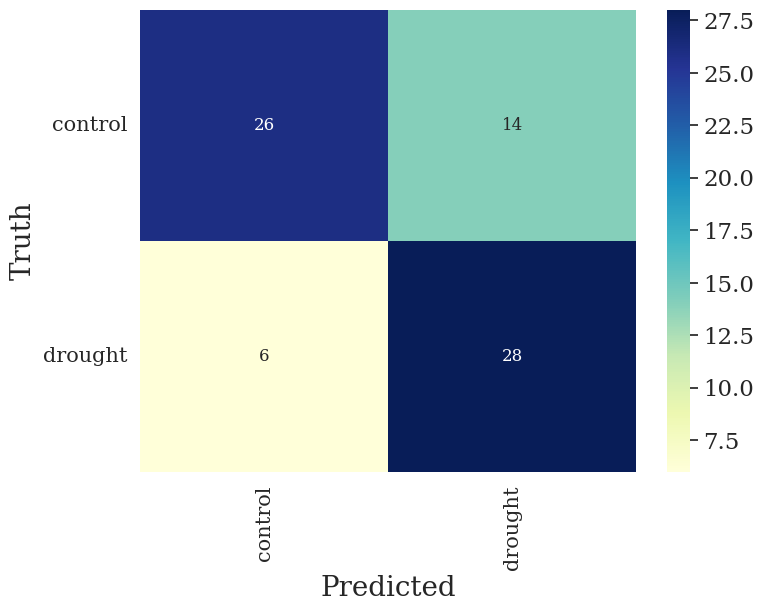

In [ ]:
y_test_pred = logreg.predict(X_test)

# print matrix
print("Test: Accuracy:",metrics.accuracy_score(y_test, y_test_pred))
print("Test: Precision:",metrics.precision_score(y_test, y_test_pred,average='weighted'))
print("Test: Recall:",metrics.recall_score(y_test, y_test_pred,average='weighted'))
print("Test: f1:",metrics.f1_score(y_test, y_test_pred,average='weighted'))

###### Confusion matrix ######
# labels to confiusion matrix:
unique_label = np.unique([y_test, y_test_pred])
# le.inverse_transform(np.unique(y_test_pred)),le.inverse_transform(np.unique(y_test))
# df of confiusion matrix:
cmtx = pd.DataFrame(
    confusion_matrix(y_test, y_test_pred, labels=unique_label),
    index=[x for x in unique_label],
    columns=[x for x in unique_label])
plt.figure(figsize = (8,6))
sns.heatmap(cmtx, annot=True, fmt='d',annot_kws={"size": 12},cmap="YlGnBu")
plt.xlabel('Predicted',fontsize = 20)
plt.ylabel('Truth', fontsize = 20)
plt.xticks(fontsize =15,rotation=90)
plt.yticks(fontsize =15,rotation=0)

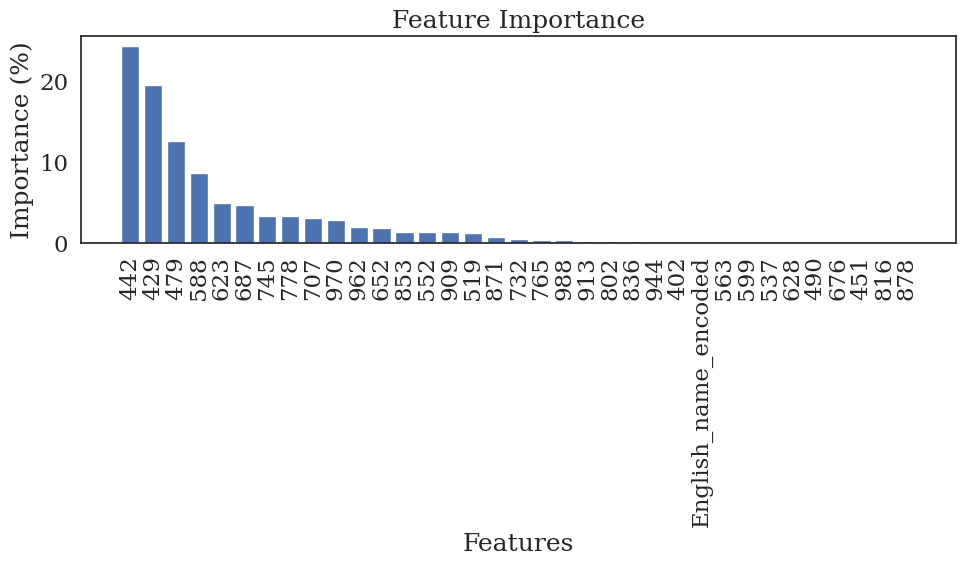

In [ ]:
# Create the Logistic Regression model with the best parameters from the randomized search
logreg = LogisticRegression(**rnd_search.best_params_)

# Fit the model to the training data
logreg.fit(X_train, y_train)

# Get the coefficients of the model
coefficients = logreg.coef_[0]

# Calculate the absolute feature importance
feature_importance = np.abs(coefficients)

# Calculate the percentage of each feature importance
total_importance = np.sum(feature_importance)
percentage_importance = (feature_importance / total_importance) * 100

# Sort the feature importance in descending order
sorted_idx = np.argsort(percentage_importance)[::-1]

# Get the names of the features
feature_names = X_train.columns

# Plot the feature importance
plt.figure(figsize=(10, 6))
plt.bar(range(len(percentage_importance)), percentage_importance[sorted_idx], align='center')
plt.xticks(range(len(percentage_importance)), feature_names[sorted_idx], rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance (%)')
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

In [ ]:
# Create a mask to filter the columns with importance greater than 0.1%
mask = percentage_importance > 2

# Get the names of the features that meet the importance threshold
selected_features = X_train.columns[mask]

# Create a new DataFrame with the selected features
new_df = df[selected_features].copy()

# Print the new DataFrame
new_df

,429,442,479,588,623,687,707,745,778,970
0,0.020430,0.026564,0.035935,0.055258,0.049774,0.039284,0.082316,0.202421,0.224384,0.217366
15,0.018168,0.022207,0.028465,0.045404,0.042280,0.035811,0.070708,0.192509,0.214869,0.220895
14,0.017537,0.019247,0.021140,0.034056,0.029577,0.023038,0.049116,0.124474,0.135006,0.133198
12,0.034980,0.040787,0.047751,0.071931,0.066028,0.056463,0.103121,0.236198,0.257887,0.266459
11,0.017389,0.019869,0.021902,0.035693,0.030099,0.023031,0.064246,0.210619,0.237506,0.232903
...,...,...,...,...,...,...,...,...,...,...
220,0.022970,0.027258,0.029650,0.047113,0.041645,0.037249,0.091711,0.282019,0.313343,0.334162
219,0.015041,0.019284,0.022767,0.034704,0.030440,0.025291,0.058455,0.158939,0.182827,0.185640
244,0.018989,0.022886,0.025529,0.039027,0.035046,0.030234,0.068336,0.206088,0.233865,0.236595
231,0.037396,0.045148,0.052104,0.081210,0.073035,0.063645,0.126950,0.272742,0.300955,0.304274


In [ ]:
new_df['English_name'] = df['English_name'].values
new_df['treatment'] = df['treatment'].values
new_df['spectral_date'] = dates_test.values
# new_df.to_csv("/content/drive/MyDrive/LWP_Netanel/feature_importance.csv",index=False)

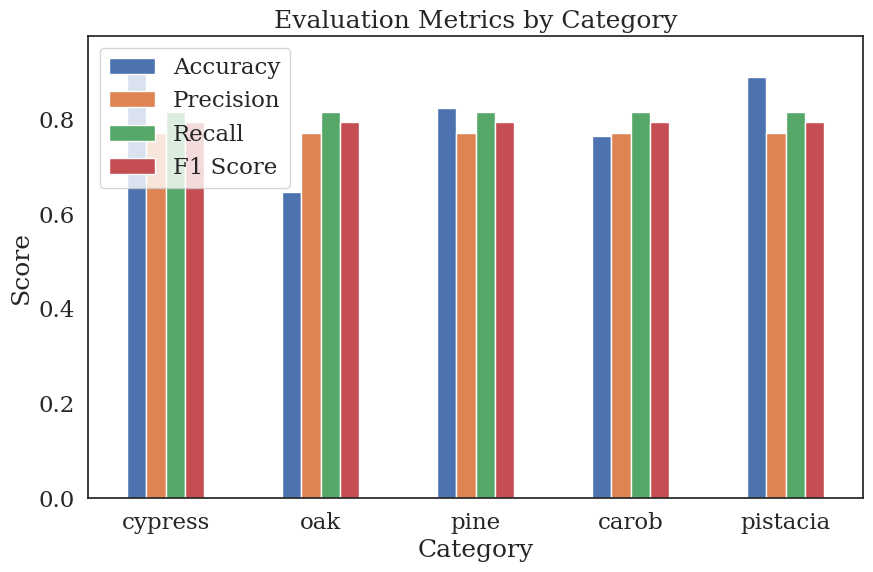

In [ ]:
# Create a list of unique categories in the 'category' column
categories = X['English_name_encoded'].unique()

# Initialize empty lists to store the evaluation metrics
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over each category
for category in categories:
    # Filter the DataFrame for the current category
    category_df =  X_test
    category_df['target'] = y_test
    category_df = category_df[category_df['English_name_encoded'] == category]


    # Split the data into features (X) and target (y)
    X = category_df.drop(['target'], axis=1)
    y = category_df['target']

    # Train a logistic regression model
    model = logreg
    # model.fit(X, y)

    # Make predictions on the test set
    y_pred = model.predict(X)

    # Calculate evaluation metrics
    accuracy = metrics.accuracy_score(y, y_pred)
    recall = recall_score(y_train, y_train_pred, pos_label='drought')
    precision = precision_score(y_train, y_train_pred, pos_label='drought')
    f1 = f1_score(y_train, y_train_pred, pos_label='drought')

    # Append the scores to the respective lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

# Create a DataFrame to store the scores
scores_df = pd.DataFrame({
    'Category': [english_name_mapping[i] for i in categories],
    'Accuracy': accuracy_scores,
    'Precision': precision_scores,
    'Recall': recall_scores,
    'F1 Score': f1_scores
})

# Plot the evaluation metrics using a bar plot
scores_df.plot(x='Category', kind='bar', figsize=(10, 6))
plt.title('Evaluation Metrics by Category')
plt.xlabel('Category')
plt.ylabel('Score')
plt.xticks(rotation=0)
plt.legend()
plt.show()